# Лекция 1. Введение в машинное обучение
## Типы задач машинного обучения
![ml](ml.png)
### Unsupervised learning
![unsupervised](unsupervised.png)
Кластеризация. Применение на практике: разделение аудитории на группы с общими интересами для эффективной рекламы.
### Reinforcement learning
Reinforcement learning основан на том, что алгоритм за каждое свое действие получает награду или наказание.

AlphaGo сыграл сам с собой миллионы партий

![reinforcement](reinforcement.png)
## Обучение с учителем
## Обучение с учителем(supervised learning)
X - множество обьектов
Y - множество ответов
$y: X \to Y$ - истинная зависимость(таргет, )
Обучающий датасет - множество наборов из фичей и значений целевой переменной. Мы обозначим его $X_{train} \subset X$.

$$\begin{equation*}
X_{train} = \left(
\begin{array}{cccc}
x_{11} & x_{12} & \ldots & x_{1m}\\
x_{21} & x_{22} & \ldots & x_{2m}\\
\vdots & \vdots & \ddots & \vdots\\
x_{n1} & x_{n2} & \ldots & x_{nm}
\end{array}
\right)
\end{equation*}

\begin{equation*}
y_{train} = \left(
\begin{array}{cccc}
y_{1}\\
y_{2}\\
\vdots\\
y_{n}
\end{array}
\right)
\end{equation*}$$

Типы фич:
- _**Числовые(Numerical)**_
- _**Категориальные(Categorical)**_
- _**Порядковые(Ordinal)**_(Почти как категориальные)

Типы задач:
- _**Классификация(Classification)**_

$Y = \{0,1\}, Y = \{1,2,...,n\}, Y = \{0,1\}^n$
- _**Регрессия(Regression)**_

$Y = \mathcal{R}$
- _**Ранжирование(Ranking)**_

$Y = \{1,2,...,n\}(числа упорядочены)$
### Примеры задач(Ирисы Фишера)
![iris](iris.png)

Какая это задача?

$Y = \{1,2,3\}$

Задача классификации.

Какие есть признаки?

$X = \mathcal{R}^4$

Есть только числовые признаки
### Примеры задач(Цена дома)
Нужно предсказать стоимость дома. Есть обучающий датасет со следующими признаками:
- Удаленность от метро
- Оценка состояния дома(плохое, среднее, хорошее, отличное)
- Количество комнат
- Площадь
- Год строительства
- Название района, в котором находится дом

Какая это задача?

$Y = \mathcal{R}$

Задача регрессии.

Какие есть признаки?

Числовые, порядковые, категориальные
### Примеры задач(Поисковая выдача)
Получив запрос от пользователя нужно найти наиболее полезные документы из некоторой базы.

Что нам известно:
- Запрос пользователя
- Текст документа
- Какие ключевые слова есть в каждом документе
- Насколько каждый документ популярен
- и т.д.

Какая это задача?

$Y = \{1,2,...,n\}$(числа упорядочены)

Задача ранжирования.

Какие есть признаки?

Данные намного сложнее и требуют предобработки.
## kNN
### K-nearest Neighbors
![KNN](KNN.png)
![KNN_1](KNN_1.png)

Решение задачи классификации:

Обучение: Просто запоминаем обучающую выборку.

(также может быть задача регрессии)

Предсказание:
- Получаем точку х, в которой надо сделать предсказание
- Ищем k ближайших соседей.
- В качестве ответа возвращаем класс, которого больше всего среди соседей.

k - заранее задаваемый параметр - _**гиперпараметр**_.
### Curse of Dimensionality
В kNN мы делаем очень слабое предположение: близкие точки будут иметь близкие ответы.

При большой размерности данных в близкую область попадет мало обьектов.

![curse_of_dimensionality](curse_of_dimensionality.png)
### Feature Scale
Если в качестве метрики взять обычное расстояние между векторами, то возникает проблема масштаба признаков
<hr>
Пример:

Задача определения стоимости дома по признакам:
- Расстояние до метро в метрах
- Количество комнат

Количество комнат почти не будет влиять на предсказание.

![feature_scale](feature_scale.png)

То есть нужно нормировать данные.
## Обучение моделей
### Обучение с учителем(supervised learning)
Наша задача - найти функцию, хорошо приближающую реальную зависимость y(x).
<hr>

Назовем такое решение $\widehat{y}: X \to Y$ (эта функция должна быть вычислима на компьютере).

Обычно мы выбираем решение из некоторого параметризованного семейства.
$$\mathcal{F} = \{\widehat{y}_{\theta}|\theta \in \Theta\}$$
, где $\Theta$ - множество параметров

_**Обучение**_ - процесс выбора параметра $\theta$, которому соответствует наиболее подходящее нам решение задачи $\widehat{y}_{\theta}(x_1, x_2)$.

_**Задача**_: определить, можно ли ребенку пройти на аттракцион? Причем мы знаем его рост и возраст.

Множество, в котором мы будем искать решения состоит их функций вида:
$$\begin{equation*}
\widehat{y}_{(a,b)}(x_1, x_2) =
\left\{
\begin{array}{lr}
1 & \text{,если } x_1 \geq a, x_2 \geq b\\\
0 & в другом случае
\end{array}
\right.
\end{equation*}$$
Параметр в данном лучае $\theta = (a,b)$. А множество возможных значений параметра $\Theta = \mathcal{R}$.

__***Как же обучать алгоритм(подбирать оптимальные параметры)?***__

_**Функция потерь(loss)**_:

Определим функцию $L(y, \widehat{y}(x))$, ее значение показывает насколко сильно наше предсказание отличается от реального значения.

_**Пример**_:

Задача предсказания цены дома из предыдущих примеров.

Возможные функции потерь:

$L(y_{true}, \widehat{y}(x))$ = $(y_{true} - \widehat{y}(x))^2$ -- квадратичная функция потерь

$L(y_{true}, \widehat{y}(x))$ = $|y_{true} - \widehat{y}(x)|$ - абсолютная функция потерь

$L(y_{true}, \widehat{y}(x))$ = $(y_{true} - \widehat{y}(x))^2$+ 7

_**Эмпирический риск(loss)**_:

Определим эмпирический риск как среднее значение функции потерь на обучающем датасете.

Часто функцию эмпирического риска также называют __**лоссом**__.

_**Обучение**_:

$\theta_{best} = \argmin\limits_{\theta \in \Theta}\frac{1}{\text{\{dataset size\}}}\sum\limits_iL(y_{true}^i, \widehat{y}_{\theta}(x^i))$

Это просто математическое определение. Конкретный алгоритм получения лучшего параметра для каждой модели свой.
## Линейная регрессия и переобучение
### Переобучение для линейной регрессии
Вспомним как выглядит линейная регрессия:
$$\widehat{y}(x_1, x_2, ..., x_n) = \theta_0 + \theta_1x_1 + \theta_2x_2 +...+\theta_nx_n$$

_**Обучение линейной регрессии**_:

Классически в качестве лосса берут MSE - Mean Squared Error(среднее квадратов ошибок):
$$MSE = \argmin\limits_{\theta_0,...,\theta_n}\sum\limits_i(y_{true}^i - \theta_0 - \theta_1x_1^i - ... - \theta_nx_n^i)^2$$

_**Polynomial Regression**_:

Пусть у нас изначально есть только один признак $x$. Создадим новые:

$x_1 = x, x_2 = x^2,...,x_n = x^n$

Тогда линейная регрессия от таких признаков называется полиномиальной:

$\widehat{y}(x) = \theta_0 + \theta_1x + \theta_2x^2 + ... + \theta_nx^n$

![overfitting](overfitiing.png)
### Переобучение(kNN)
Если в алгоритме kNN мы возьмем k = 1, то получим идеальные предсказания на всем обучающем датасете и средний лосс будет равен 0. Но такие предсказания могут быть очень плохими.

![kNN_overfitting](kNN_overfitting.png)

_**Как определить термин переобучения и потом находить его?**_

### Разделение на Train/Validation/Test
- Train - данные для обучения(подбора весов)
- Validation - данные для итеративной оценки качества(подбора гиперпараметра)
- Test - данные для финальной оценки качества

Часто можно опустить test часть. В этом случае название validation dataset и test dataset значат одно и то же.

![train_val_test](train_val_test.png)

_**Оверфиттинг**_ - ситуация, когда качество модели на train данных значительно лучше, чем на validation/test.

![overfit](overfit.png)
![overfit_1](overfit_1.png)
### Cross-validation
Используется, когда у нас ОЧЕНЬ мало данных.

![cross_val](cross_val.png)
### Алгоритм применения ML
_**Алгоритм**_: Алгоритм решения ML задачи
<hr>

_**Результат**_: Модель "закона природы" $\widehat{y}_{\theta}(x)$

Разделяем датасет на train, validation, test части;

Обрабатываем данные;

_**while**_ Качество на validation не достаточно высокое do
<blockquote>

Выбираем семейство моделей $\mathcal{F}$, выбрав тип модели и гиперпараметры;

Обучаем, решая задачу $\theta_{best} = \argmin\limits_{\theta}\sum_iL(y^i_{true},\widehat{y}_{theta}(x^i))$;

Проверяем качество(лосс и метрики) на validation датасете;

</blockquote>

_**end**_

Проверяем качество на test датасете.

# Семинар 1.

Что нужно вынести для себя из занятия:
* Синтаксис работы с моделями и трансформерами в sklearn.
* Какие бывают шаги предобработки данных.
* Когда вы решаете ML задачу обязательно надо посмотреть на данные.


### sklearn
В sklearn есть два типа объектов:

1. Estimator -- модель для предсказаний. Есть метод .fit(X, y) и .predict(X)
2. Transformer -- обработчик данных (например нормирование признаков). Есть метод .fit(X) и .transform(X)

## Данные

Данные - информация о приложениях из AppStore. Поставим регрессионную задачу - предсказать рейтинг приложения.

Скачать данные: https://www.kaggle.com/ramamet4/app-store-apple-data-set-10k-apps

## Анализ данных

Начнем с самой важной части - посмотрим на данные.

In [106]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt


In [ ]:
# Загрузим данные и посмотрим на небольшую часть
data = pd.read_csv('./AppleStore.csv')
data.head()


Выделим фичи из датасета и поделим их на числовые и категориальные.

In [ ]:
num_cols = [
    'size_bytes',
    'price',
    'rating_count_tot',
    'rating_count_ver',
    'sup_devices.num',
    'ipadSc_urls.num',
    'lang.num',
    # Эта фича - не числовая, а порядковая, но мы все равно возьмем ее как числовую для удобства
    'cont_rating',
]

cat_cols = [
    'currency',
    'prime_genre'
]

target_col = 'user_rating'

cols = num_cols + cat_cols + [target_col]


In [ ]:
data = data[cols]
# Возраст записан не в виде числа, исправим это, вырезав последний символ и скастовав к числу
data['cont_rating'] = data['cont_rating'].str.slice(0, -1).astype(int)
data.head()


In [ ]:
# Посмотрим на пропущенные значения
data.isna().mean()


In [ ]:
# Посмотрим на распределение категориальных фичей
for col in cat_cols:
    print(f"{col} DISTRIBUTION")
    print(data[col].value_counts())
    print()


In [ ]:
# Как мы видим, в колонке currency только одно значение, можно колонку убрать
data = data.drop(columns=['currency'])
cat_cols.remove('currency')


In [ ]:
# Посмотрим на распредление величин
data.hist(column=num_cols+cat_cols+[target_col], figsize=(14, 10))
None


А теперь посмотрим на корреляции между фичами

In [ ]:
data.corr().style.background_gradient(cmap='coolwarm').set_precision(2)


И двойные графики

In [ ]:
pd.plotting.scatter_matrix(data, c=data[target_col], figsize=(15, 15), marker='o',
                        hist_kwds={'bins': 20}, s=10, alpha=.8)
None


**Упражнение**: Мы только что посмотрели на данные, какой из посмотренных графиков говорит, что мы вряд ли сможем сделать хорошую модель?
> Ответ:

В данном случае фичей мало, поэтому мы легко смогли посмотреть на них. Обычно фичей намного больше и построить такие графики для пар фичей не получится. Тогда в первую очередь можно посмотреть на корреляцию фичей с таргетом.

## Подготовка данных

### Очистка

Данные достаточно чистые, в них вряд ли есть какие-то ошибки и не получается с первого взгляда найти выбросы (outliers). Поэтому и очищать особо нечего. Но в реальной жизни, ваши данные скорее всего будут полны мусора.

Чаще всего нам пришлось бы убирать выбросы, исправлять очевидные ошибки итд.


### Создание фичей

Чем сложнее зависимость между фичей и таргетом, тем более сложная модель потребуется, чтобы эту зависимость использовать. Почему бы просто не выбрать семейство самых гибких моделей? Проблема в том, что без большого количества данных для обучения будет происходить overfit. Это значит, что модель выучит зависимости, которые случайно появились в обучающих из-за ограниченного размера выборки. Такая модель будет хорошо работать на обучающей выборке, но будет плохо справляться с реальной задачей.

Используя человеческие знания об устройстве мира, мы можем упростить такую зависимость, создав новые фичи. На самом деле, можно даже не использовать человеческие знания, а просто применить какой-нибудь алгоритм. Например, если у нас есть фичи $x_1, x_2, ..., x_n$, то мы можем добавить новые фичи вида
$$x_{newij} = x_i x_j, i \ne j$$
и понадеяться, что это улучшит предсказания

In [ ]:
# Добавим категориальную фичу, которая говорит, бесплатное приложение или нет
data['is_free'] = data['price'] == 0
cat_cols.append('is_free')
data.head()


### Работа с категориальными признаками


Большинство алгоритмов не принимает категориальные фичи в чистом виде и нужно из как-то закодировать.

Очень небольшое число алгоритмов МО умеет работать с категориальными признаками в чистом виде. Например, это делает библиотека для градиентного бустинга от Яндекса catboost. Внтури она применяет разные эвристики для кодирования признаков в числа.

#### One-hot-encoding
Самый простой способ закодировать категориальные фичи - one hot encoding. Представьте, что у нас есть категориальная фича prime_genre с возможными значениями
> ['Games', 'Entertainment', 'Education', 'Photo & Video']

мы можем создать 4 новые бинарные фичи для каждого из столбцов

> 'Entertaiment' -> [0, 1, 0, 0]

В pandas очень удобно использовать get_dummies для one-hot-encoding

In [ ]:
a = pd.DataFrame.from_dict({'categorical': ['a', 'b', 'a', 'c']})
a


In [ ]:
pd.get_dummies(a)


In [ ]:
# Задание: Теперь добавьте в датафрейм колонки для всех категориальных фичей и обновите список категориальных фичей
data = pd.get_dummies(data, columns=cat_cols)


In [ ]:
cat_cols_new = []
for col_name in cat_cols:
    cat_cols_new.extend(filter(lambda x: x.startswith(col_name), data.columns))
cat_cols = cat_cols_new


### Масштабирование признаков

Как мы говорили в лекции часто необходимо привести все признаки к одному масштабу. Для этого в sklearn есть специальный Transformer -- StandardScaler и MinMaxScaler.

StandardScaler во время .fit() для каждого признака $x_i$ считает среднее $\mu_i$ и стандартное отклонение $\sigma_i$ на обучающем датасете. Во время .transform() к каждому признаку применяется:

$$\mathbf{x_i}^{\text{new}} = \frac{\mathbf{x_i} - \mu_i}{\sigma_i}$$


MinMaxScaler во время .fit() для каждого признака $x_i$ считает минимум $x_{i, \text{min}}$ и максимум $x_{i, \text{max}}$ на обучающем датасете. Во время .transform() к каждому признаку применяется:

$$\mathbf{x_i}^{\text{new}} = \frac{\mathbf{x_i} - x_{i, \text{min}}}{x_{i, \text{max}} - x_{i, \text{min}}}$$

In [ ]:
from sklearn.preprocessing import StandardScaler

pca = StandardScaler()
pca.fit(data[num_cols + cat_cols])
# Выход pca - numpy матрица, положим ее в новую переменную со всеми фичами
X = pca.transform(data[num_cols + cat_cols])

# Или есть более простой способ
X = pca.fit_transform(data[num_cols + cat_cols])


## Разделение на train/test

После того, как мы обучили нашу модель нам нужно как-то понять, насколько она хорошо работает. Выше мы уже говорили про переобучение на данные, с которыми сеть обучалась. Из-за такого переобучения мы не сможем посчитать адекватно узнать точность предсказаний, если проверим точность на тех же данных, на которых обучались. Чтобы с этим бороться обучающую выборку обычно делят на две части train и test. На первой мы будем обучать модель, а на второй проверять, насколько хорошо модель работает. Размер тестовой выборки в 30-40% - неплохой выбор.

Иногда данных слишком мало, чтобы жертвовать ими на тестовую часть. Тогда применяется метод, который называет cross validation. Мы посмотрим на то, как он работает в секции про оценку модели.

**На самом деле, мы сделали не совсем правильно, потому что разделение на train/test нужно делать до добавления новых фичей/их кодирования итд. Иначе возможны лики из test части в train часть.** Например, при нормализации и PCA мы работаем со всем массивом данных, а значит информация из test попадет и в train. Но для упрощения кода и понимания того, что происходит мы не поделили выборку заранее. Если бы мы все-таки разделили выборку заранее, то нужно использовать fit на train части, а transform уже на обеих.

In [ ]:
from sklearn.model_selection import train_test_split


In [ ]:
# Задание: Загуглите как работает эта функция и поделите выборку на две части
X_train, X_test, y_train, y_test = train_test_split(X, data[target_col], test_size=0.2)


Хорошо, теперь можно обучить модели

## Обучение

Самый хороший способ - попробовать максимум разных алгоритмов, посмотреть, какой из них лучше справляется и уже по метрикам выбрать лучший (возможно, объединить предсказания с помощью стэкинга или блендинга, о которых будет на следующем занятии).

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error


Поговорим про метрики. Метрика это, так же как и функция потерь, какая-то функция, показывающая насколько хорошо работает наша модель. Например, любой лосс можно назвать метрикой. Но не любую метрику можно назвать лоссом: лосс это именно то число, которое мы уменьшаем в процессе обучения модели + для лосса всегда верно, что чем он меньше, тем лучше. Метрики нужны как раз для того, чтобы оценивать работу алгоритма с помощью числа, которое он не учился напрямую минимизировать.

Для классификации наиболее простой метрикой будет являться точность или accuracy (доля совпавших предсказаний и настоящих классов). Она никогда не используется внутри лоссов, потому что нет эффективного алгоритма, который бы позволил ее обучать модели с такой функцией потерь.

В данном случае у нас задача регрессии, поэтому мы используем две метрики MSE и R_squared.

$$R^2 = 1 - \frac{\sum_{i=1}^{n} (y^i - y_{pred}^i)^2}{\sum_{i=1}^{n} (y^i - y_{mean})^2}$$

R_aquared это доля объясненной вариации. R_squared = 1, когда у нас есть идеальный предсказатель. R_squared = 0 достигает модель, которая просто выдает в качестве ответа среднее Значение целевой переменной. А значения меньше 0 говорят о том, что модель хуже константного предсказателя.

In [ ]:
def print_metrics(y_preds, y):
    print(f'R^2: {r2_score(y_preds, y)}')
    print(f'MSE: {mean_squared_error(y_preds, y)}')


In [ ]:
# Используем обычную линейную регрессию, минимизирующую сумму квадратов ошибки
lr = LinearRegression()
lr.fit(X_train, y_train)

print_metrics(lr.predict(X_test), y_test)


In [ ]:
# Используем обычную линейную регрессию, минимизирующую сумму квадратов ошибки
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train, y_train)

print_metrics(knn.predict(X_test), y_test)


**Задание:** поиграйтесь с гиперпараметрами и улучшите предсказания моделей.

## Cross Validation

До этого мы разбирали случай, когда выборка заранее делится на train/test, но часто данных итак не хватает и отдавать их часть на test слишком расточительно. В такой ситуации на помощью приходит кросс валидация:
1. Выберем $k$ - количество частей, на которые разобьется наш датасет
2. for $ i = 1..k$
    * Обучим модель на всех частях датасета, кроме i-ой.
    * Посчитаем метрики или предсказания для i-ой части
3. Саггрегируем все все предсказания или усредним метрики

Таким образом мы сможем получить более объективные предсказания нашей модели, использовав весь датасет как train и как test, при этом не создав утечек данных.

В sklearn существуют уже готовые классы моделей, которые за нас проводят все вышеописанные действия. Но у них есть один минус - выше мы уже писали, что лики могут произойти еще на этапе обработки данных. Избежать этого при ручной разбивке датасета легко, но в случае кросс валидации придется либо сдлеать специальный объект Pipeline, в котором будет скрыта вся обработка данных, и sklearn просто вызовет его $k$ раз, либо руками выбирать индексы объектов с помощью класса KFold и самостоятельно обрабатывать данные. Мы не будем делать ни то, ни другое, но покажем, как это может быть реализовано.

Получим из кроссвалидации метрики

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from sklearn.model_selection import cross_validate


In [ ]:
cross_validate(LinearRegression(), X, data[target_col], cv=5,
               scoring={'r2_score': make_scorer(r2_score),
                        'mean_squared_error': make_scorer(mean_squared_error)})


In [ ]:
cross_validate(KNeighborsRegressor(), X, data[target_col], cv=5,
               scoring={'r2_score': make_scorer(r2_score, ),
                        'mean_squared_error': make_scorer(mean_squared_error)})


## GridSearchCV
А еще с помощью кросс валидации можно искать гиперпараметры.

In [ ]:
from sklearn.model_selection import GridSearchCV


In [ ]:
gbr_grid_search = GridSearchCV(KNeighborsRegressor(),
                               [{'n_neighbors': [1, 2, 3, 4, 6, 8, 10, 15]}],
                               cv=5,
                               error_score=make_scorer(mean_squared_error),
                               verbose=10)


## Vanilla KFold

**Задание**: Разберитесь как работает KFold по документации sklearn.

In [ ]:
from sklearn.model_selection import KFold


In [ ]:
kf = KFold(n_splits=5)


In [ ]:
model = KNeighborsRegressor()


In [ ]:
metrics = []
for train_ind, test_ind in kf.split(X_train):
    model.fit(X_train[train_ind], y_train.values[train_ind])
    pred = model.predict(X_train[test_ind])
    metrics.append(mean_squared_error(y_train.values[test_ind], pred))


In [ ]:
metrics


# ДЗ 1. Библиотека sklearn и классификация с помощью kNN

<h2 style="text-align: center;"><b>K Nearest Neighbors (KNN)</b></h2>

Метод ближайших соседей (k Nearest Neighbors, или kNN) — очень популярный метод классификации, также иногда используемый в задачах регрессии. Это один из самых понятных подходов к классификации. На уровне интуиции суть метода такова: посмотри на соседей; какие преобладают --- таков и ты. Формально основой метода является гипотеза компактности: если метрика расстояния между примерами введена достаточно удачно, то схожие примеры гораздо чаще лежат в одном классе, чем в разных. 

<img src='https://hsto.org/web/68d/a45/6f0/68da456f00f8434e87628dbe7e3f54a7.png' width=600>


Для классификации каждого из объектов тестовой выборки необходимо последовательно выполнить следующие операции:

* Вычислить расстояние до каждого из объектов обучающей выборки
* Отобрать объектов обучающей выборки, расстояние до которых минимально
* Класс классифицируемого объекта — это класс, наиболее часто встречающийся среди $k$ ближайших соседей

Будем работать с подвыборкой из [данных о типе лесного покрытия из репозитория UCI](http://archive.ics.uci.edu/ml/datasets/Covertype). Доступно 7 различных классов. Каждый объект описывается 54 признаками, 40 из которых являются бинарными. Описание данных доступно по ссылке.

### Обработка данных

In [ ]:
import pandas as pd
import numpy as np


Сcылка на датасет (лежит в папке): https://drive.google.com/drive/folders/16TSz1P-oTF8iXSQ1xrt0r_VO35xKmUes?usp=sharing

In [ ]:
all_data = pd.read_csv('forest_dataset.csv')
all_data.head()


In [ ]:
all_data.shape


Выделим значения метки класса в переменную `labels`, признаковые описания --- в переменную `feature_matrix`. Так как данные числовые и не имеют пропусков, переведем их в `numpy`-формат с помощью метода `.values`.

In [ ]:
labels = all_data[all_data.columns[-1]].values
feature_matrix = all_data[all_data.columns[:-1]].values
feature_matrix.shape
labels.shape


### Пара слов о sklearn

**[sklearn](https://scikit-learn.org/stable/index.html)** -- удобная библиотека для знакомства с машинным обучением. В ней реализованны большинство стандартных алгоритмов для построения моделей и работ с выборками. У неё есть подробная документация на английском, с которой вам придётся поработать.

`sklearn` предпологает, что ваши выборки имеют вид пар $(X, y)$, где $X$ -- матрица признаков, $y$ -- вектор истинных значений целевой переменной, или просто $X$, если целевые переменные неизвестны.

Познакомимся со вспомогательной функцией 
[train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html).
С её помощью можно разбить выборку на обучающую и тестовую части.

In [ ]:
from sklearn.model_selection import train_test_split


Вернёмся к датасету. Сейчас будем работать со всеми 7 типами покрытия (данные уже находятся в переменных `feature_matrix` и `labels`, если Вы их не переопределили). Разделим выборку на обучающую и тестовую с помощью метода `train_test_split`.

In [ ]:
train_feature_matrix, test_feature_matrix, train_labels, test_labels = train_test_split(
    feature_matrix, labels, test_size=0.2, random_state=42)


Параметр `test_size` контролирует, какая часть выборки будет тестовой. Более подробно о нём можно прочитать в [документации](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html).

Основные объекты `sklearn` -- так называемые `estimators`, что можно перевести как *оценщики*, но не стоит, так как по сути это *модели*. Они делятся на **классификаторы** и **регрессоры**.

В качестве примера модели можно привести классификаторы
[метод ближайших соседей](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html) и 
[логистическую регрессию](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html). Что такое логистическая регрессия и как она работает сейчас не важно.

У всех моделей в `sklearn` обязательно должно быть хотя бы 2 метода (подробнее о методах и классах в python будет в следующих занятиях) -- `fit` и `predict`.

Метод `fit(X, y)` отвечает за обучение модели и принимает на вход обучающую выборку в виде *матрицы признаков* $X$ и *вектора ответов* $y$.

У обученной после `fit` модели теперь можно вызывать метод `predict(X)`, который вернёт предсказания этой модели на всех объектах из матрицы $X$ в виде вектора.

Вызывать `fit` у одной и той же модели можно несколько раз, каждый раз она будет обучаться заново на переданном наборе данных.

Ещё у моделей есть *гиперпараметры*, которые обычно задаются при создании модели.

Рассмотрим всё это на примере логистической регрессии.

In [ ]:
from sklearn.linear_model import LogisticRegression


In [ ]:
# создание модели с указанием гиперпараметра C
clf = LogisticRegression(C=1)
# обучение модели
clf.fit(train_feature_matrix, train_labels)
# предсказание на тестовой выборке
y_pred = clf.predict(test_feature_matrix)


Теперь хотелось бы измерить качество нашей модели. Для этого можно использовать метод `score(X, y)`, который посчитает какую-то функцию ошибки на выборке $X, y$, но какую конкретно уже зависит от модели. Также можно использовать одну из функций модуля `metrics`, например [accuracy_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html), которая, как понятно из названия, вычислит нам точность предсказаний.

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(test_labels, y_pred)


Наконец, последним, о чём хотелось бы упомянуть, будет перебор гиперпараметров по сетке. Так как у моделей есть много гиперпараметров, которые можно изменять, и от этих гиперпараметров существенно зависит качество модели, хотелось бы найти наилучшие в этом смысле параметры. Самый простой способ это сделать -- просто перебрать все возможные варианты в разумных пределах.

Сделать это можно с помощью класса [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html), который осуществляет поиск (search) по сетке (grid) и вычисляет качество модели с помощью кросс-валидации (CV).

У логистической регрессии, например, можно поменять параметры `C` и `penalty`. Сделаем это. Учтите, что поиск может занять долгое время. Смысл параметров смотрите в документации.

In [ ]:
from sklearn.model_selection import GridSearchCV


In [ ]:
# заново создадим модель, указав солвер
clf = LogisticRegression(solver='saga')

# опишем сетку, по которой будем искать
param_grid = {
    'C': np.arange(1, 5), # также можно указать обычный массив, [1, 2, 3, 4]
    'penalty': ['l1', 'l2'],
}

# создадим объект GridSearchCV
search = GridSearchCV(clf, param_grid, n_jobs=-1, cv=5, refit=True, scoring='accuracy')

# запустим поиск
search.fit(feature_matrix, labels)

# выведем наилучшие параметры
print(search.best_params_)


В данном случае, поиск перебирает все возможные пары значений C и penalty из заданных множеств.

In [ ]:
accuracy_score(labels, search.best_estimator_.predict(feature_matrix))


Заметьте, что мы передаём в GridSearchCV всю выборку, а не только её обучающую часть. Это можно делать, так как поиск всё равно использует кроссвалидацию. Однако порой от выборки всё-же отделяют *валидационную* часть, так как гиперпараметры в процессе поиска могли переобучиться под выборку.

В заданиях вам предстоит повторить это для метода ближайших соседей.

### Обучение модели

Качество классификации/регрессии методом ближайших соседей зависит от нескольких параметров:

* число соседей `n_neighbors`
* метрика расстояния между объектами `metric`
* веса соседей (соседи тестового примера могут входить с разными весами, например, чем дальше пример, тем с меньшим коэффициентом учитывается его "голос") `weights`


Обучите на датасете `KNeighborsClassifier` из `sklearn`.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

clf = KNeighborsClassifier(n_neighbors = 6, weights = 'distance', metric = 'minkowski')
clf.fit(train_feature_matrix, train_labels)
labels_predicted = clf.predict(test_feature_matrix)
print(accuracy_score(labels_predicted, test_labels))


### Вопрос 1:
* Какое качество у вас получилось?

Подберём параметры нашей модели

* Переберите по сетке от `1` до `10` параметр числа соседей

* Также вы попробуйте использоввать различные метрики: `['manhattan', 'euclidean']`

* Попробуйте использовать различные стратегии вычисления весов: `[‘uniform’, ‘distance’]`

In [ ]:
from sklearn.model_selection import GridSearchCV
params = {
    'n_neighbors' :np.arange(1, 11),

    'metric' : np.array(['manhattan', 'euclidean']),

    'weights' : np.array(['uniform', 'distance'])
          }

clf_grid = GridSearchCV(clf, params, cv=5, scoring='accuracy', n_jobs=-1)

clf_grid.fit(feature_matrix, labels)

print(clf_grid.best_params_)


Выведем лучшие параметры

In [ ]:
clf_grid.best_params_


### Вопрос 2:
* Какую metric следует использовать?

### Вопрос 3:
* Сколько n_neighbors следует использовать?

### Вопрос 4:
* Какой тип weights следует использовать?

Используя найденное оптимальное число соседей, вычислите вероятности принадлежности к классам для тестовой выборки (`.predict_proba`).

In [ ]:
optimal_clf = KNeighborsClassifier(n_neighbors=4, weights='distance', metric='manhattan')
optimal_clf.fit(train_feature_matrix, train_labels)
pred_prob = optimal_clf.predict_proba(test_feature_matrix)
print(pred_prob.mean(axis = 0))


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

unique, freq = np.unique(test_labels, return_counts=True)
freq = list(map(lambda x: x / len(test_labels),freq))

pred_freq = pred_prob.mean(axis=0)
plt.figure(figsize=(10, 8))
plt.bar(range(1, 8), pred_freq, width=0.4, align="edge", label='prediction')
plt.bar(range(1, 8), freq, width=-0.4, align="edge", label='real')
plt.ylim(0, 0.54)
plt.legend()
plt.show()


### Вопрос 5:
* Какая прогнозируемая вероятность pred_freq класса под номером 3 (до 2 знаков после запятой)?

# Лекция 2. Линейная регрессия
Почему линейные модели до сих пор исаользуются?
- Очень простые, поэтому можно использовать там, где нужна интерпретируемость модели и надежность
- Не переобучаются
- Легко применять
### Постановка задачи
Датасет:
$\bf{X} \in \mathcal{R}^{l \times n}, \bf{y} \in \mathcal{R}$
$$\begin{equation*}
X = \left(
\begin{array}{cccc}
x_{11} & x_{12} & \ldots & x_{1n}\\
x_{21} & x_{22} & \ldots & x_{2n}\\
\vdots & \vdots & \ddots & \vdots\\
x_{l1} & x_{l2} & \ldots & x_{ln}
\end{array}
\right)
\end{equation*}

\begin{equation*}
y = \left(
\begin{array}{cccc}
y_{1}\\
y_{2}\\
\vdots\\
y_{l}
\end{array}
\right)
\end{equation*}$$

Функция потерь:
$$L(\widehat{f}) = \sum^l_{i = 1}(\widehat{f}(x_{i1},...,x_{in}) - y_i)^2$$
### Определение модели
Мы будем искать модель в следующем виде:
$$\widehat{f}(x_1,...,x_n) = \bf{w}_0 + \bf{w}_1x_1 + ... + \bf{w}_nx_n$$
Намного удобнее для записи внести 1 в вектор признаков _**x**_ = (1, x_1,...,x_n)
$$\widehat{f}(\bf{x}) = \sum^n_{i = 0}\bf{w}_i\bf{x}_i = \bf{x} \cdot \bf{w}$$
### Линейность по параметрам
Какое может быть происхождение у признаков $x_i$?
- Просто численный признак
- Преобразования численных признаков(корень, логарифм и т.д.)
- Степени численного признака $x_2 = x_1^2,x_3 = x_1^3$
- Значения из One-Hot-Encoding
- Взаимодействия между разными признаками($x_3 = x_1x_2$)

Линейная модель линейна по параметрам, а не признакам

Пример:

![linear_regression](linear_regression.png)
### Точное решение
Запишем то, что мы хотим получить: _**Xw**_ = _**y**_
$$
\begin{equation*}
\left(
\begin{array}{cccc}
x_{11} & x_{12} & \ldots & x_{1n}\\
x_{21} & x_{22} & \ldots & x_{2n}\\
\vdots & \vdots & \ddots & \vdots\\
\vdots & \vdots & \ddots & \vdots\\
\vdots & \vdots & \ddots & \vdots\\
x_{l1} & x_{l2} & \ldots & x_{ln}
\end{array}
\right)
\left(
\begin{array}{cccc}
w_{1}\\
w_{21}\\
\vdots\\
w_{n1}
\end{array}
\right)
 = 
 \left(
\begin{array}{cccc}
y_{1}\\
y_{2}\\
\vdots\\
\vdots\\
\vdots\\
y_{l}
\end{array}
\right)
\end{equation*}$$
### Точное решение
Случай, когда l = n, тогда матрица _**X**_ - квадратная и может иметь обратную.

![precise_solution](precise_solution.png)

Система линейных уравнений:

_**Xw**_ = _**y**_

Решение:

**w** = $\bf{X}^{-1}$ **y**
### Pseudo-Inverse
Обычно l >> n, тогда у нас переопределенная СЛУ:

![pseudo_inverse](pseudo_inverse.png)

Система линейных уравнений:

_**Xw**_ = _**y**_

Приближенное решение:

$\bf{w} = \bf{X}^+\bf{y} = (\bf{X}^T\bf{X})^{-1}\bf{X}^T\bf{y}$

Псевдообратная матрица дает решение с наименьшей квадратичной ошибкой.
## Обучение классификаторов
### Получение решения через производную
Подставим выражение для $\widehat{f}(\bf{x})$ в функцию потерь и запишем в векторном виде:
$$L(\bf{w}) = \sum^l_{i = 1}(\bf{x}^T_i\bf{w} - y_i)^2 = (\bf{Xw} - \bf{y})^T(\bf{Xw} - \bf{y})$$
Возьмем производную:

$\frac{\partial L}{\partial \bf{w}} = 2\bf{X}^T(\bf{Xw} - \bf{y})$

Если у **X** ЛНЗ столбцы, то можно приравнять производную к нулю.

$\bf{X}^T(\bf{Xw} - \bf{y}) = 0$

$\bf{w} = (\bf{X}^T\bf{X})^{-1}\bf{X}^T\bf{y}$
### Постановка задачи
Датасет:

$\bf{X} \in \mathcal{R}^{l \times n}, y \in \{0,1\}^l$. То есть **y** - это верктор из 0 и 1.

$$\begin{equation*}
X = \left(
\begin{array}{cccc}
x_{11} & x_{12} & \ldots & x_{1n}\\
x_{21} & x_{22} & \ldots & x_{2n}\\
\vdots & \vdots & \ddots & \vdots\\
x_{l1} & x_{l2} & \ldots & x_{ln}
\end{array}
\right)
\end{equation*}

\begin{equation*}
y = \left(
\begin{array}{cccc}
y_{1}\\
y_{2}\\
\vdots\\
y_{l}
\end{array}
\right)
\end{equation*}$$

Функция потерь:

Будет позже, ибо мы хотим подобрать функцию потерь, но какая лучше всего подойдет не знаем.

Попробуем искать лучшую модель с помощью теоремы из статистики.
### Вероятностная модель
X - случайная величина вектор признаков.
Y - случайная величина целевой переменной.

Пример случайной модели(клики на рекламу):

X = (кол-во кликов раньше, время активности, уровень доходов)

Y = 1 если клик будет, 0 если клика не будет.

Тогда можно задать распределение вероятностей:

$P_{X|Y}(Y = 1|X = (\text{10 кликов}, \text{2 часа}, \text{10 долларов})) = \text{вероятность того, что человек с заданными характеристиками кликнет на рекламу.}$
### Функция правдоподобия
Найдем способ для обучения любой модели, предсказывающей вероятность принадлежности к классу.

**Х** - вектор признаков, $\widehat{f}(\bf{x})$ - наша модель.
$$P(Y = 1|\bf{x}) - \widehat{f}(\bf{x})$$
Назовем _**правдоподобием**_ $\prod\limits^l_{i = 1}P(Y = y_i|\bf{x}_i)$ - это вероятность получения нашей выборки согласно предсказаниям модели.
### Обучение модели через максимальное правдоподобие
Теорема из статистики гарантирует, что если мы найдем параметры модели, которые максимизируют правдоподобие, то они будут хорошие.
$$\prod\limits^l_{i = 1}P(Y = y_i|\bf{x}_i) \to \max\limits_{\bf{w}}$$
$$ln(\prod\limits^l_{i = 1}P(Y = y_i|\bf{x}_i)) \to \max\limits_{\bf{w}}$$
### Связь с минимизацией функции потерь
Преобразуем задачу максимизации в задачу минимизации:
$$L(\bf{w}) = -\sum\limits_{i = 1}^lln(P(Y = y_i|\bf{x}_i)) \to \min\limits_{\bf{w}}$$
Мы видим, что минимизация полученного выражения - то же самое, что минимизация лосса, где функция потерь - логарифм вероятности правильного класса.
### Что мы сделали
Мы знаем, что макимизация правдоподобия дает хорошие веса из статистики. Изменив формулу, мы смогли найти такую функцию потерь, что ее минимизация и максимизация правдоподобия это одно и то же.
$$\prod\limits^l_{i = 1}P(Y = y_i|\bf{x}_i) \to \max\limits_{\bf{w}}$$
$$L(\bf{w}) = -\sum\limits_{i = 1}^lln(P(Y = y_i|\bf{x}_i)) \to \min\limits_{\bf{w}}$$
## Логистическая регрессия
Мы будем искать модель в следующем виде:

**x** = $(1,x_1,...,x_n)$
$$\widehat{f}(\bf{x}) = \sigma(\sum^n_{i = 0}\bf{w}_i\bf{x}_i)$$
Определение сигмоиды:
$$\sigma (x) = \frac{1}{1 + e^{-x}}$$

![sigmoida](sigmoida.png)
### Предсказание вероятности
Будем считать, что наша модель предсказывает вероятности.

Именно поэтому она называется регрессией.

Вероятность для двух классов можно расписать так:

$y_i \in \{0,1\}$
$$ln(P(Y = y_i|\bf{x}_i)) = y_iln(\widehat{f}(\bf{x}_i)) + (1 - y_i)ln(1 - \widehat{f}(\bf{x}_i))$$
### Пример работы
Как выглядит обученная логистическая регрессия на данных с одним признаком:

![logistic_regression](logistic_regression.png)
### Обучение логистической регрессии
В полученную ранее формулу функции потерь можно подставить вероятность, которую предсказывает логистическая регрессия.

Функция потерь для произвольного классификатора:
$$L(\bf{w}) = -\sum^l_{i = 1}ln(P(Y = y_i|\bf{x}_i)) \to \min\limits_{\bf{w}}$$
Функция потерь для логистической регрессии(_**LogLoss**_):
$$L(\bf{w}) = -\sum^l_{i = 1}y_iln(\widehat{f}(\bf{x}_i)) + (1 = y_i)ln(1 - \widehat{f}(\bf{x}_i)) \to \min\limits_{\bf{w}}$$
### Обобщение на много классов
Пусть у нас есть m классов. Введем две новые функции:
$$\begin{equation*}
logits(\bf{x}) = \left(
\begin{array}{cccc}
\bf{w}^1\cdot \bf{x}\\
\bf{w}^2\cdot \bf{x}\\
\vdots\\
\bf{w}^m\cdot \bf{x}
\end{array}
\right)
\end{equation*}

\begin{equation*}
= \left(
\begin{array}{cccc}
\sum\limits^n_{i = 0}w^1_ix_i\\
\sum\limits^n_{i = 0}w^2_ix_i\\
\vdots\\
\sum\limits^n_{i = 0}w^m_ix_i
\end{array}
\right)
\end{equation*}$$

$$\begin{equation*}
Softmax(\alpha) = \left(
\begin{array}{cccc}
\frac{e^{\alpha_1}}{\sum\limits^m_{i = 0}e^{\alpha_i}} & \frac{e^{\alpha_2}}{\sum\limits^m_{i = 0}e^{\alpha_i}} & \ldots & \frac{e^{\alpha_m}}{\sum\limits^m_{i = 0}e^{\alpha_i}}
\end{array}
\right)
\end{equation*}$$
### Пример работы Softmax
![softmax](softmax.png)
### Много классов
$\widehat{f} = Softmax(logits(\bf{x}))$

Выпишем предсказанную вероятность для k-го класса.

Ее можно подставить в функцию потерь для произвольного классификатора.
$$P(Y = k|\bf{x}) = \widehat{f}_k(\bf{x}) = \frac{e^{\sum\limits^n_{i = 0}w^k_ix_i}}{\sum\limits^m_{k = 1}e^{\sum\limits^n_{i = 0}w^k_ix_i}}$$
## Градиентный спуск
### Обучение логистической регрессии
В полученную ранее формулу функции потерь можно подставить вероятность, которую предсказывает логистическая регрессия.

Функция потерь для произвольного классификатора:
$$L(\bf{w}) = -\sum^l_{i = 1}ln(P(Y = y_i|\bf{x}_i)) \to \min\limits_{\bf{w}}$$
Функция потерь для логистической регрессии(_**LogLoss**_):
$$L(\bf{w}) = -\sum^l_{i = 1}y_iln(\widehat{f}(\bf{x}_i)) + (1 = y_i)ln(1 - \widehat{f}(\bf{x}_i)) \to \min\limits_{\bf{w}}$$
### Эвристика градиентного спуска
![gradient_fall](gradient_fall.png)
### Градиентный спуск формализация
У нас стоит задача минимизации какой-то функции:

$f(\bf{x}) = \min\limits_{\bf{x}}$

Чтобы применять метод градиентного спуска нужно уметь вычислять градиент функции в точке:
$$\nabla f(x_1,...,x_n) = (\frac{\partial f}{\partial x_1},...,\frac{\partial f}{\partial x_n})$$
Заранее зададим некоторое число $\alpha$, которое будет влиять на то, насколько большие шаги мы делаем. Оно называется _**learning rate**_.
### Шаг градиентного спуска
На каждом шаге будем менять все переменные, от которых зависит функция:
$$x_1 = x_1 - \alpha\frac{\partial f}{\partial x_1}\bf{\vdots} x_n = x_n - \alpha\frac{\partial f}{\partial x_n}$$
Или в векторной форме:
$$\bf{x} = \bf{x} - \alpha\nabla f$$
### Градиентный спуск
1. Выбираем точку, с которой начнем оптимизацию.
2. На каждом шаге будем менять все переменные, от которых зависит функция:
$$x_1 = x_1 - \alpha\frac{\partial f}{\partial x_1}\bf{\ldots} x_n = x_n - \alpha\frac{\partial f}{\partial x_n}$$
Или в векторной форме:
$$\bf{x} = \bf{x} - \alpha\nabla f$$
Повторяем, пока изменение не будет достаточно маленьким или пройдет много шагов.
### Градиентный спуск для параболы
Будем минимизировать $f(x) = x^2, \nabla f = (2x), \alpha = 0.1$
1. $x = 3$
2. Теперь делаем обновления:

$x = x - 0.1 \cdot 2x$

С каждым шагом мы будем приближаться к 0 - минимуму функции.
### Градиентный спуск для линейной регрессии
Функция потерь(она зависит только от весов, потому что изменять мы будем их):

$L(\bf{w}) = \sum\limits^l_{i = 1}(\bf{x}_i^T - y_i)^2$

Пошагово возьмем производную лосса по параметрам:

$\frac{\partial L}{\partial w_1} = \sum\limits^l_{i = 1}\frac{\partial (\bf{x}^T_i \bf{w} - y_i)^2}{\partial w_1}$

$\frac{\partial L}{\partial w_1} = \sum\limits^l_{i = 1}2(\bf{x}^T_i \bf{w} - y_i)\frac{\partial \bf{x}^T_i \bf{w}}{\partial w_1}$

$\frac{\partial L}{\partial w_1} = \sum\limits^l_{i = 1}2(\bf{x}^T_i \bf{w} - y_i)x_{i1}$

Производная функции потерь по весам:

$\frac{\partial L}{\partial w_1} = \sum\limits^l_{i = 1}2(\bf{x}^T_i \bf{w} - y_i)x_{i1}$

Будем минимизировать $L(\bf{w}) = \sum\limits^l_{i = 1}(\bf{x}_i^T - y_i)^2$

1. Как-то выберем начальные веса
2. Теперь делаем обновления:
$$w_1 = w_1 - \alpha \frac{\partial L}{\partial w_1} \bf{\ldots} w_n = w_n - \alpha \frac{\partial L}{\partial w_n}$$
Функция потерь:

$L(\bf{w}) = -\sum\limits^l_{i = 1}y_iln(\widehat{f}(\bf{x}_i)) + (1 - y_i)ln(1 - \widehat{f}(\bf{x}_i))$

$\widehat{f}(\bf{x}) = \sigma(\sum\limits^n_{i = 0}\bf{w}_i\bf{x}_i)$

Возьмем производную:

$\frac{\partial L}{\partial w_1} = -\sum\limits^l_{i = 1}\frac{y_i}{\widehat{f}(\bf{x}_i)}\frac{\partial \widehat{f}(\bf{x}_i)}{\partial w_1} - \frac{1 - y_i}{1 - \widehat{f}(\bf{x}_i)}\frac{\partial \widehat{f}(\bf{x}_i)}{\partial w_1}$

$\frac{\partial \widehat{f}(\bf{x}_i)}{\partial w_1} = \widehat{f}(\bf{x}_1)(1 - \widehat{f}(\bf{x}_i))x_{i1}$

Соединим:

$\frac{\partial L}{\partial w_1} = -\sum\limits^l_{i = 1}x_{i1}[y_1(1 - \widehat{f}(\bf{x}_i)) - (1 - y_i)\widehat{f}(\bf{x}_i)]$
## Регуляризация
### Мультиколлинеарность для линейной регресси
Вспомним определение линейной регрессии:
$$\widehat{f}(\bf{x}) = \sum\limits^n_{i = 0}\bf{w}_i\bf{x}_i = \bf{x} \cdot \bf{w}$$
Если столбцы матрицы $\bf{X}$ ЛЗ, то существуют такие коэффиценты $\beta = (\beta_1,...,\beta_n)$, что $\bf{X}\beta = 0$.

Но тогда существует бесконечное количество весов, дающих одинаковые предсказания:
$$\forall c \in \mathcal{R} : \bf{x} \cdot (\bf{w} + c\beta) = \bf{x} \cdot \bf{w} + \bf{x} \cdot \beta = \bf{x} \cdot \bf{w}$$
### Weight Decay
Мы можем предположить, что веса не должны быть большими по модулю.

Изменим функцию потерь, чтобы отражать это($\beta$ - некоторая константа):

$L_2$ регуляризация(лучше):
$$L(\bf{w}) = \sum\limits^l_{i = 1}(\bf{x}_i^T \bf{w} - y_i)^2 + \beta\sum\limits^n_{j = 1}w^2_j$$
$L_1$ регуляризация:
$$L(\bf{w}) = \sum\limits^l_{i = 1}(\bf{x}_i^T \bf{w} - y_i)^2 + \beta\sum\limits^n_{j = 1}|w_j|$$
### Как изменится градиент
$L_2$ регуляризация:
$$\frac{\partial L}{\partial w_1} = \sum\limits^l_{i = 1}2(\bf{x}^T_i \bf{w})x_{i1} + 2\beta w_1$$
$L_1$ регуляризация:
$$\frac{\partial L}{\partial w_1} = \sum\limits^l_{i = 1}2(\bf{x}^T_i \bf{w} - y_i)x_{i1} + \beta sign(w_1)$$
## Нормализация признаков
### Что такое нормализация?
Мы изменяем признаки в датасете по правилу:

$x^{new}_{ij} = \frac{x_{ij} - \mu_j}{\sigma_j}$

$\mu_j$ - среднее значение j-го признака в обучающей выборке

$\sigma_j$ - стандартное отклонение j-го признака в обучающей выборке
### Зачем?
- Градиентный спуск и другие методы плохо работают на признаках с очень большим или маленьким масштабом.
- Разный масштаб весов вредит регуляризации.
- Для нормированных данных веса говорят о важности признаков.

# Семинар 2. Линейная, LASSO, Ridge регрессии и их оптимизация.

In [ ]:
import numpy as np
import pandas as pd
import scipy.linalg as sla
import matplotlib.pyplot as plt

from sklearn import datasets
from sklearn.linear_model import LinearRegression, Lasso, Ridge
np.random.seed(133)


# 1. Линейная регрессия

Линейные методы предполагают, что между признаками объекта (features) и целевой переменной (target/label) существует линейная зависимость, то есть
$$y = w_1 x_1 + w_2 x_2 + ... + w_k x_k + b, $$
где $у$ --- целевая переменная (что мы хотим предсказать), $x_i$ --- признак объекта $х$, $w_i$ --- вес $i$-го признака, $b$ --- bias (смещение, свободный член)

Часто предполагают, что объект $х$ содержит в себе фиктивный признак равный 1 для представления свободного члена $b$. В этом случае формула принимает простой вид:
$$y = \langle w, x \rangle,$$
где $\langle \cdot, \cdot \rangle$ -- скалярное произведение векторов $w, x \in \mathbb{R}^n$.

В матричной форме, в случае, когда у нас есть $m$ объектов формулу можно переписать следующим образом:
$$ Y = Xw, $$
где $Y$ -- столбец размера $n$, $X$ --- матрица признаков размера $n \times k$ (каждая строка матрицы есть описание признаков объекта), $w$ -- вектор весов размера $k$.

**Лосс:**
$$
\begin{aligned}
L(y_{pred}, Y) &= \frac{1}{n}||y_{pred} - Y||^2_2 =\\
&= \frac{1}{n}||Xw - Y||^2_2 = \frac{1}{n}\sum_{i=1}^{n}\left(\sum_{j=1}^{m} x_{ij}w_j - y_i\right)^2 =: L(w)
\end{aligned}
$$

### 1.1 Аналитическое решение

Минимизация ошибки по методу наименьших квадратов дает решение: $$ w = (X^TX)^{-1}X^TY $$

Реализуем класс линейной регрессии с помощью этой формулы.

In [ ]:
class MyLinearRegression:
    def __init__(self, fit_intercept=True):
        self.fit_intercept = fit_intercept

    def fit(self, X, y):
        # Принимает на вход X, y и вычисляет веса по данной выборке
        # Не забудьте про фиктивный признак равный 1

        n, k = X.shape

        X_train = X
        if self.fit_intercept:
            X_train = np.hstack((X, np.ones((n, 1))))

        self.w = np.linalg.inv(X_train.T @ X_train) @ X_train.T @ y

        return self

    def predict(self, X):
        # Принимает на вход X и возвращает ответы модели
        # Не забудьте про фиктивный признак равный 1
        n, k = X.shape
        if self.fit_intercept:
            X_train = np.hstack((X, np.ones((n, 1))))

        y_pred = X_train @ self.w

        return y_pred

    def get_weights(self):
        return self.w


#### Тестирование
Сначала сгенерируем искусственные данные для теста моделей

In [ ]:
from sklearn.model_selection import train_test_split


In [ ]:
def linear_expression(x):
    return 5 * x + 6


In [ ]:
# по признакам сгенерируем значения таргетов с некоторым шумом
objects_num = 50
X = np.linspace(-5, 5, objects_num)
y = linear_expression(X) + np.random.randn(objects_num) * 5

# выделим половину объектов на тест
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.5)


Нанесем точки выборки и зависимость на график для наглядности

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(X, linear_expression(X), label='real', c='g')
plt.scatter(X_train, y_train, label='train', c='b')
plt.scatter(X_test, y_test, label='test', c='orange')

plt.title("Generated dataset")
plt.grid(alpha=0.2)
plt.legend()
plt.show()


Обучим модель на трейне и предскажем результаты на тесте

In [ ]:
regressor = MyLinearRegression()

regressor.fit(X_train[:, np.newaxis], y_train)

predictions = regressor.predict(X_test[:, np.newaxis])
w = regressor.get_weights()
w


In [ ]:
plt.figure(figsize=(20, 7))

ax = None

for i, types in enumerate([['train', 'test'], ['train'], ['test']]):
    ax = plt.subplot(1, 3, i + 1, sharey=ax)
    if 'train' in types:
        plt.scatter(X_train, y_train, label='train', c='b')
    if 'test' in types:
        plt.scatter(X_test, y_test, label='test', c='orange')

    plt.plot(X, linear_expression(X), label='real', c='g')
    plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

    plt.ylabel('target')
    plt.xlabel('feature')
    plt.title(" ".join(types))
    plt.grid(alpha=0.2)
    plt.legend()

plt.show()


Сравним с реализацией из sklearn

In [ ]:
sk_reg = LinearRegression().fit(X_train[:, np.newaxis], y_train)

plt.figure(figsize=(10, 7))
plt.plot(X, linear_expression(X), label='real', c='g')

plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label='test')
plt.plot(X, regressor.predict(X[:, np.newaxis]), label='ours', c='r', linestyle=':')
plt.plot(X, sk_reg.predict(X[:, np.newaxis]), label='sklearn', c='cyan', linestyle=':')

plt.title("Different Prediction")
plt.ylabel('target')
plt.xlabel('feature')
plt.grid(alpha=0.2)
plt.legend()
plt.show()


#### Результаты

In [ ]:
from sklearn.metrics import mean_squared_error

train_predictions = regressor.predict(X_train[:, np.newaxis])
test_predictions = regressor.predict(X_test[:, np.newaxis])

print('Train MSE: ', mean_squared_error(y_train, train_predictions))
print('Test MSE: ', mean_squared_error(y_test, test_predictions))


### 1.2. Градиентная оптимизация

Обращение матрицы -- очень долгая операция. Кроме того, обратная матрица $(X^TX)^{-1}$ не всегда существует. По этим причинам, мы воспользуемся методом градиентного спуска для оптимизации эмпирического риска.

Градиентый спуск заключается в
1. расчете $\displaystyle\frac{\partial{L}}{\partial{w}}$ -- градиента ошибки (значение целевой функции, то есть лосса $L(y_{pred}, y_{true})$) от значения параметров модели (весов $w$)
2. шаге спуска -- изменении весов $w$ в сторону антиградиента с некоторым коэффициентом $h$ (он же learning rate):
$$w := w - h\frac{\partial{L}}{\partial{w}}$$
3. Повторении п.1 и п.2 пока не наблюдается сходимость (изменения ошибки малы или отсутсвуют)

Как правило, чаще используют стохастический градиентный спуск (SGD): выбирают случайный элемент обучающей выборки и изменяют коэффициенты модели по направлению антиградиента функции потерь на этом примере.

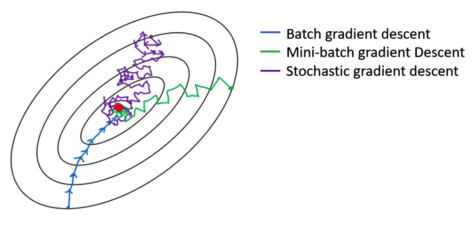

**Цель:** Реализуем новые классы линейной регрессии, в которой оптимизация проводится методами градиентного спуска.

**Предполагаемая зависимость:** $Y = Xw$, где $Y \in \mathbb{R}^{n\times 1}, X \in \mathbb{R}^{n\times m}, w \in \mathbb{R}^{m\times 1}$


**Минимизируемая функция:**
$$
L(y_{pred}, Y) = \frac{1}{n} ||y_{pred} - Y||^2 = \frac{1}{n}||Xw - Y||^2 = \frac{1}{n}(Xw - Y)^T(Xw - Y) = \frac{1}{n}(w^TX^TXw - 2Y^TXw + Y^TY)
$$

**Градиент w.r.t. $w$:**
$$
\frac{\partial{L}}{\partial{w}} = \frac{2}{n}(X^TXw - X^TY) = \frac{2}{n}X^T(y_{pred} - Y) \,\, \in \mathbb{R}^{m \times 1}
$$

In [ ]:
class MyGradientLinearRegression(MyLinearRegression):
    def __init__(self, **kwargs):
        super().__init__(**kwargs) # передает именные параметры родительскому конструктору
        self.w = None

    def fit(self, X, y, lr=0.01, max_iter=100):
        # Принимает на вход X, y и вычисляет веса по данной выборке
        # Не забудьте про фиктивный признак равный 1!

        n, k = X.shape

        # случайно инициализируем веса
        if self.w is None:
            self.w = np.random.randn(k + 1 if self.fit_intercept else k)

        X_train = np.hstack((X, np.ones((n, 1)))) if self.fit_intercept else X

        self.losses = []

        for iter_num in range(max_iter):
            y_pred = self.predict(X)
            self.losses.append(mean_squared_error(y_pred, y))

            grad = self._calc_gradient(X_train, y, y_pred)

            assert grad.shape == self.w.shape, f"gradient shape {grad.shape} is not equal weight shape {self.w.shape}"
            self.w -= lr * grad

        return self

    def _calc_gradient(self, X, y, y_pred):
        grad = 2 * (y_pred - y)[:, np.newaxis] * X
        grad = grad.mean(axis=0)
        return grad

    def get_losses(self):
        return self.losses


#### Тестирование

Посчитаем предсказания на сгенерированном датасете

In [ ]:
regressor = MyGradientLinearRegression(fit_intercept=True)

l = regressor.fit(X_train[:, np.newaxis], y_train, max_iter=100).get_losses()

predictions = regressor.predict(X_test[:, np.newaxis])
w = regressor.get_weights()


In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(X, linear_expression(X), label='real', c='g')

plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label='test')
plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

plt.grid(alpha=0.2)
plt.legend()
plt.show()


Построим таккже график лосса во время обучения

In [ ]:
plt.figure(figsize=(10, 7))

plt.plot(l)

plt.title('Gradient descent learning')
plt.ylabel('loss')
plt.xlabel('iteration')
plt.ylim(bottom=0)
plt.grid(alpha=0.2)

plt.show()


### 1.3 SGD

Добавим к нашему градиентному спуску сэмплирование мини-батча, по которому будем считать градиент


In [ ]:
class MySGDLinearRegression(MyGradientLinearRegression):
    def __init__(self, n_sample=10, **kwargs):
        super().__init__(**kwargs) # передает именные параметры родительскому конструктору
        self.w = None
        self.n_sample = n_sample

    def _calc_gradient(self, X, y, y_pred):
        # Главное отличие в SGD - это использование подвыборки для шага оптимизации
        inds = np.random.choice(np.arange(X.shape[0]), size=self.n_sample, replace=False)

        grad = 2 * (y_pred[inds] - y[inds])[:, np.newaxis] * X[inds]
        grad = grad.mean(axis=0)

        return grad


#### Тестирование

Проведем аналогичный расчет на сгенерированном датасете

In [ ]:
regressor = MySGDLinearRegression(fit_intercept=True)

l = regressor.fit(X_train[:, np.newaxis], y_train, max_iter=100).get_losses()

predictions = regressor.predict(X_test[:, np.newaxis])
w = regressor.get_weights()


In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(X, linear_expression(X), label='real', c='g')

plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label='test')
plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

plt.grid(alpha=0.2)
plt.legend()
plt.show()


In [ ]:
plt.figure(figsize=(10, 7))

plt.plot(l)

plt.title('Gradient descent learning')
plt.ylabel('loss')
plt.xlabel('iteration')
plt.grid(alpha=0.2)
plt.show()


Протестируем меняя количество элементов для расчета градиента

In [ ]:
n_samples = [1, 2, 4]


In [ ]:
plt.figure(figsize=(10, 7))

for ns in n_samples:
    l = MySGDLinearRegression(fit_intercept=True, n_sample=ns).fit(
        X_train[:, np.newaxis],
        y_train,
        lr=5e-3,
        max_iter=150,
    ).get_losses()
    plt.plot(l, alpha=0.5, label=f'{ns} mini-batch size')

plt.title('Gradient descent learning')
plt.ylabel('loss')
plt.xlabel('iteration')

plt.legend()
plt.ylim((0, 150))
plt.grid(alpha=0.2)
plt.show()


Как видно по графикам размер подвыборки влияет на стабильность сходимости (чем меньше, тем больше и резче изменения весов).
При этом количество итераций для минимизации примерно одинаково.

SGD также обычно улучшают адаптивным уменьшением величины шага. (подробнее в курсах про методы оптимизаций итп)


# 2. Логистическая регрессия

Задание аналогичное линейной регрессии, только мы переводим выходной значение в вероятность предсказания класса

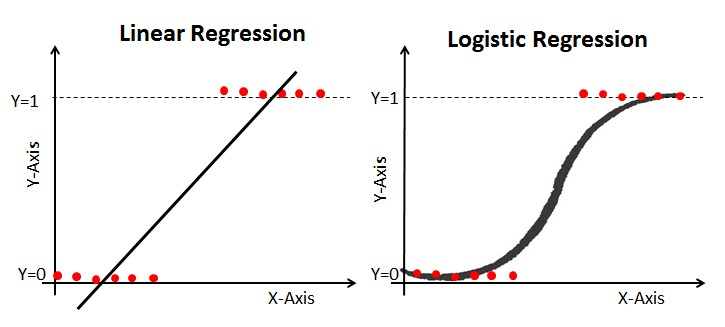



Для этого воспользуемся функцией: $\displaystyle\sigma(x) = \frac{1}{1 + e^{-x}}$

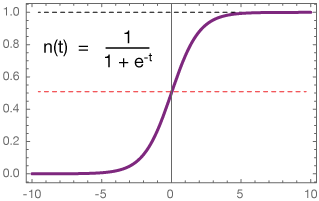

Задача теперь формулируется так:

**Предсказания:** $$
y_{pred}(x, w) = \frac{1}{1 + e^{-\langle x, w \rangle}}
$$

**Лосс (LogLoss):** $$
L(w) = -y\, log\,y_{pred} - (1-y)\,log\,(1-y_{pred})
$$

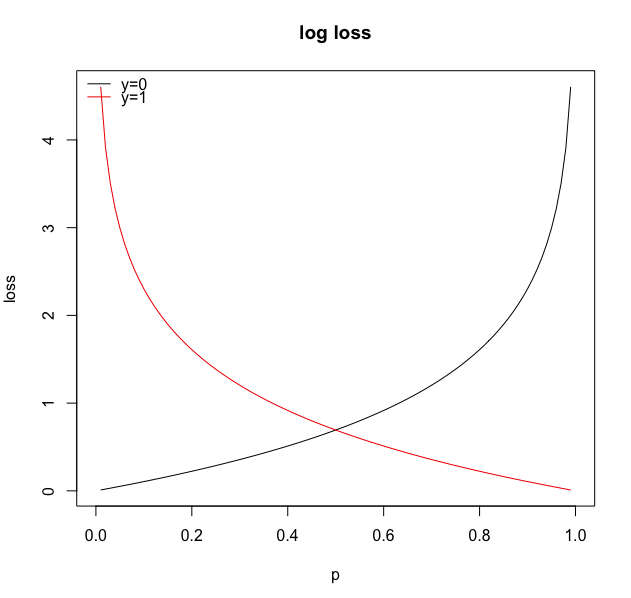

**Градиент:**
$$
\frac{\partial{L}}{\partial{w}}
= \left(-\frac{y}{y_{pred}} + \frac{1-y}{1-y_{pred}}\right)\frac{\partial{y_{pred}}}{\partial{w}}
$$

$$
\frac{\partial{y_{pred}}}{\partial{w}} = \frac{-1}{(1+e^{-\langle x, w \rangle})^2} e^{-\langle x, w \rangle} (-x) = y_{pred}(1-y_{pred})x
$$

$$
\frac{\partial{L}}{\partial{w}} = (y_{pred} - y) x
$$

In [ ]:
def logit(x, w):
    return np.dot(x, w)

def sigmoid(h):
    return 1. / (1 + np.exp(-h))

class MyLogisticRegression(object):
    def __init__(self):
        self.w = None

    def fit(self, X, y, max_iter=100, lr=0.1):
        # Принимает на вход X, y и вычисляет веса по данной выборке.
        # Множество допустимых классов: {1, -1}
        # Не забудьте про фиктивный признак равный 1!

        n, k = X.shape

        if self.w is None:
            self.w = np.random.randn(k + 1)

        X_train = np.concatenate((np.ones((n, 1)), X), axis=1)

        losses = []

        for iter_num in range(max_iter):
            z = sigmoid(logit(X_train, self.w))
            grad = np.dot(X_train.T, (z - y)) / len(y)

            self.w -= grad * lr

            losses.append(self.__loss(y, z))

        return losses

    def predict_proba(self, X):
        # Принимает на вход X и возвращает ответы модели
        n, k = X.shape
        X_ = np.concatenate((np.ones((n, 1)), X), axis=1)
        return sigmoid(logit(X_, self.w))

    def predict(self, X, threshold=0.5):
        return self.predict_proba(X) >= threshold

    def get_weights(self):
        return self.w

    def __loss(self, y, p):
        p = np.clip(p, 1e-10, 1 - 1e-10)
        return np.mean(y * np.log(p) + (1 - y) * np.log(1 - p))


In [ ]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=1000, centers=[[-2,0.5],[2,-0.5]], cluster_std=1, random_state=42)

colors = ("red", "green")
colored_y = np.zeros(y.size, dtype=str)

for i, cl in enumerate([0,1]):
    colored_y[y == cl] = str(colors[i])

plt.figure(figsize=(15,10))
plt.scatter(X[:, 0], X[:, 1], c=colored_y)
plt.show()


In [ ]:
clf = MyLogisticRegression()

clf.fit(X, y, max_iter=1000)

w = clf.get_weights()


In [ ]:
w


In [ ]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

plt.figure(figsize=(15,8))

eps = 0.1
xx, yy = np.meshgrid(np.linspace(np.min(X[:,0]) - eps, np.max(X[:,0]) + eps, 500),
                     np.linspace(np.min(X[:,1]) - eps, np.max(X[:,1]) + eps, 500))

Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)

cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

plt.scatter(X[:, 0], X[:, 1], c=colored_y)


In [ ]:
colors = ("magenta", "green")
colored_y = np.zeros(y.size, dtype=str)

for i, cl in enumerate([0,1]):
    colored_y[y == cl] = str(colors[i])


plt.figure(figsize=(15,8))

Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
plt.pcolormesh(xx, yy, Z, cmap=plt.get_cmap('viridis'))

plt.scatter(X[:, 0], X[:, 1], c=colored_y)
plt.colorbar()
plt.show()


# 3. О регуляризации

Зачастую модель обучается на каких-то зашумленных данных. Веса модели после обучения подбираются для уменьшения ошибки целевой функции. От различных выборках модель может обучаться по-разному, но нам бы хотелось вычленять основную зависимость примерно одинаково, то есть **не переобучаться (overfit)** на данных. Иначе обучившись на одном сете, мы можем получать неожиданный результат на других данных.

То есть мы хотели бы штрафовать модель за ее сложность, чтобы выискивать более простые зависимости.


Еще одной проблемой, специфичной для линейных моделей, является **мультиколлинеарность**. Особенность мультиколлинеарности заключается в том, что из-за того, что решений становится бесконечно много, коэффициенты модели могут принимать огромные значения. Отсюда вывод: необходимо каким-то образом ограничить величину коэффициентов модели.

Для линейной модели дополнительные ограничения на веса выполняют роль регуляризации. Различают:
- $l_1$-регуляризацию (LASSO, least absolute shrinkage and selection operator), учитывание $||w||_1$
- $l_2$-регуляризацию (Ridge), учитывание $||w||^2_2$
- Elastic net - комбинация двух предыдущих (учитываются обе нормы весов)

Далее напишем свои классы для Ridge и LASSO регрессий. Протестируем их на выборке из первого задания:

In [ ]:
objects_num = 50
X = np.linspace(-5, 5, objects_num)
y = linear_expression(X) + np.random.randn(objects_num) * 5

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.5)


# 4. Ridge регрессия (l2 регуляризация)

В ridge мы штрафуем модель также на сумму квадратов всех ее весов, таким образом:

**Лосс:** $L(w) = ||Xw - Y||^2_2 + \lambda||w||^2_2$, где $\lambda$ - гиперпараметр, отвечающий за степень регуляризации.

В привычном понимании:

**Лосс:** $L(w) = \sum_{i=1}^n\left(\sum_{j=1}^{m} x_{ij}w_j - y_i\right)^2 + \lambda\sum_{j=1}^{m}w_j^2$

Что стоит сказать про значения признаков? Они должны быть стандартизованы для одинаковых штрафов относительно друг друга! (используется связка с `sklearn.preprocessing.StandardScaler`)

Кстати, наблюдается довольно интересная особенность Ridge, из-за того как мы определили функцию потерь

In [ ]:
reg = Ridge(alpha=1).fit(np.hstack((X, X, X))[:, np.newaxis], np.hstack((y, y, y)))
np.append(reg.coef_, reg.intercept_)


In [ ]:
reg = Ridge(alpha=1/3).fit(X[:, np.newaxis], y)
np.append(reg.coef_, reg.intercept_)


### 4.1. Аналитическое решение

Из курса статистики известно если:
$$ L(w) = ||Xw - Y||^2_2 + ||\Gamma w||^2_2 $$

минимизируется при:

$$ w = (X^TX + \Gamma^T \Gamma)^{-1}X^TY $$

В нашем случае $\Gamma^T\Gamma = \lambda I$, если нет свободного члена, иначе:
$\Gamma^T\Gamma =
\left(\begin{matrix}
\lambda I & 0 \\
0 & 0
\end{matrix}\right)$


In [ ]:
class MyRidgeRegression(MyLinearRegression):
    def __init__(self, alpha=1.0, **kwargs):
        super().__init__(**kwargs)
        self.alpha = alpha

    def fit(self, X, y):
        n, m = X.shape
        X_train = X

        if self.fit_intercept:
            X_train = np.hstack((X, np.ones((n, 1))))

        lambdaI = self.alpha * np.eye(X_train.shape[1])
        if self.fit_intercept:
            lambdaI[-1, -1] = 0

        self.w = np.linalg.inv(X_train.T @ X_train + lambdaI) @ X_train.T @ y

        return self

    def get_weights(self):
        return self.w


Протестируем решение на нашем датасете:

In [ ]:
alpha = 1.0
regressor = MyRidgeRegression(alpha=alpha).fit(X_train[:, np.newaxis], y_train)


Проверим работу, сравнив с `linear_model.Ridge` из sklearn

In [ ]:
sklearn_reg = Ridge(alpha).fit(X_train[:, np.newaxis], y_train)
assert np.allclose(regressor.get_weights(), np.append(sklearn_reg.coef_, sklearn_reg.intercept_))
regressor.get_weights()


In [ ]:
plt.figure(figsize=(20, 7))

ax = None

for i, types in enumerate([['train', 'test'], ['train'], ['test']]):
    ax = plt.subplot(1, 3, i + 1, sharey=ax)
    if 'train' in types:
        plt.scatter(X_train, y_train, label='train', c='b')
    if 'test' in types:
        plt.scatter(X_test, y_test, label='test', c='orange')

    plt.plot(X, linear_expression(X), label='real', c='g')
    plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

    plt.ylabel('target')
    plt.xlabel('feature')
    plt.title(" ".join(types))
    plt.grid(alpha=0.2)
    plt.legend()

plt.show()


### 4.2 SGD

Аналогично предыдущим заданиям нужно рассчитать значение градиента $\displaystyle\frac{\partial{L}}{\partial{w}}$

**Имеем:**
$$
\begin{aligned}L(w) &= ||Xw - Y||^2_2 + ||\Gamma w||^2_2
= (Xw - Y)^T(Xw - Y) + w^T\Gamma^T\Gamma w = \\
&= w^TX^TXw - 2Y^TXw + Y^TY + w^T\Gamma^T\Gamma w =
w^T(X^TX + \Gamma^T\Gamma)w - 2Y^TXw + Y^TY
\end{aligned}
$$

**Градиент:**
$$
\frac{\partial{L}}{\partial{w}}
= 2(X^TX + \Gamma^T\Gamma)w - 2X^TY
$$

Будем также усреднять значения лосса по батчу данных ($\displaystyle\frac{1}{n_{sample}}$ появится)

Реализуем наш класс Ridge регрессии используя стохастический градиентный спуск


In [ ]:
class MySGDRidge(MySGDLinearRegression):
    def __init__(self, alpha=1.0, **kwargs):
        super().__init__(**kwargs) # передает именные параметры родительскому конструктору
        self.w = None
        self.alpha = alpha

    def _calc_gradient(self, X, y, y_pred):
        # Главное отличие в SGD - это использование подвыборки для шага оптимизации
        inds = np.random.choice(np.arange(X.shape[0]), size=self.n_sample, replace=False)

        lambdaI = self.alpha * np.eye(self.w.shape[0])
        if self.fit_intercept:
            lambdaI[-1, -1] = 0

        grad = 2 * (X[inds].T @ X[inds] / self.n_sample + lambdaI) @ self.w
        grad -= 2 * X[inds].T @ y[inds] / self.n_sample

        return grad


In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(X, linear_expression(X), label='real', c='g')

plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label='test')
plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

plt.grid(alpha=0.2)
plt.legend()
plt.show()


In [ ]:
regressor = MySGDRidge(alpha=1, n_sample=20).fit(X[:, np.newaxis], y, max_iter=1000, lr=0.01)
l = regressor.get_losses()
regressor.get_weights()


In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(X, linear_expression(X), label='real', c='g')

plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label='test')
plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

plt.grid(alpha=0.2)
plt.legend()
plt.show()


In [ ]:
plt.figure(figsize=(10, 7))

plt.plot(l)

plt.title('Ridge learning with SGD')
plt.ylabel('loss')
plt.xlabel('iteration')
plt.grid(alpha=0.2)
plt.show()


# 5. LASSO регрессия (l1 регуляризация)

В LASSO мы штрафуем модель также **на сумму модулей всех ее весов** (на l1-норму весов), таким образом:

**Лосс:** $L(w) = \frac{1}{2n} ||Xw - Y||^2_2 + \lambda ||w||_1$, где $\lambda$ - гиперпараметр, отвечающий за степень регуляризации.

В привычном понимании:

**Лосс:** $L(w) = \frac{1}{2n}\sum_{i=1}^n\left(\sum_{j=1}^{m} x_{ij}w_j - y_i\right)^2 + \lambda\sum_{j=1}^{m}|w_j|$

Признаки опять же должны быть стандартизованы для одинаковых штрафов относительно друг друга!

В Lasso наблюдается поведение, которое нам бы и хотелось видеть

In [ ]:
reg = Lasso(alpha=1).fit(np.hstack((X, X, X))[:, np.newaxis], np.hstack((y, y, y)))
np.append(reg.coef_, reg.intercept_)


In [ ]:
reg = Lasso(alpha=1).fit(X[:, np.newaxis], y)
np.append(reg.coef_, reg.intercept_)


### 4.1 Аналитическое решение

В отличие от Ridge, аналитическое решение задачи Lasso регрессии в общем случае не находится.

### 4.2 SGD

Аналогично предыдущим заданиям для SGD нужно рассчитать значение градиента $\displaystyle\frac{\partial{L}}{\partial{w}}$

**Лосс:**
$$
\begin{aligned}L(w) &= \frac{1}{2n}||Xw - Y||^2_2 + ||\Gamma w||_1
= \frac{1}{2n}(Xw - Y)^T(Xw - Y) + ||\Gamma w||_1 = \\
&= \frac{1}{2n}(w^TX^TXw - 2Y^TXw + Y^TY) + \lambda\sum_{i=1}^{m-1}|w|
\end{aligned}
$$

**Градиент:**
$$
\frac{\partial{L}}{\partial{w}}
= \frac{1}{n}(X^TXw - X^TY) + \lambda sign(w)
= \frac{1}{n}X^T(y_{pred} - Y) + \lambda sign(w)
$$

где для приближения будем считать что $|\cdot|$ - дифференцируемая функция, ее производной является $sign(\cdot)$

Реализуем наш класс Ridge регрессии, используя стохастический градиентный спуск


In [ ]:
def soft_sign(x, eps=1e-7):
    if abs(x) > eps:
        return np.sign(x)
    return x / eps

np_soft_sign = np.vectorize(soft_sign)

class MySGDLasso(MySGDLinearRegression):
    def __init__(self, alpha=1.0, **kwargs):
        super().__init__(**kwargs) # передает именные параметры родительскому конструктору
        self.w = None
        self.alpha = alpha

    def _calc_gradient(self, X, y, y_pred):
        # Главное отличие в SGD - это использование подвыборки для шага оптимизации
        inds = np.random.choice(np.arange(X.shape[0]), size=self.n_sample, replace=False)

        signw = np_soft_sign(self.w)
        if self.fit_intercept:
            signw[-1] = 0

        grad = X[inds].T @ (y_pred[inds] - y[inds])[:, np.newaxis] / self.n_sample
        grad += self.alpha * signw[:, np.newaxis]

        return grad.flatten()


Протестируем

In [ ]:
regressor = MySGDLasso(alpha=1, n_sample=4).fit(X[:, np.newaxis], y, max_iter=1000, lr=0.01)
l = regressor.get_losses()
regressor.get_weights()


In [ ]:
sklearn_reg = Lasso().fit(X[:, np.newaxis], y)
np.append(sklearn_reg.coef_, sklearn_reg.intercept_)


In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(X, linear_expression(X), label='real', c='g')

plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label='test')
plt.plot(X, regressor.predict(X[:, np.newaxis]), label='predicted', c='r')

plt.grid(alpha=0.2)
plt.legend()
plt.show()


In [ ]:
plt.figure(figsize=(10, 7))

plt.plot(l)

plt.title('Lasso learning with SGD')
plt.ylabel('loss')
plt.xlabel('iteration')
plt.grid(alpha=0.2)
plt.show()


# Различия LASSO и Ridge

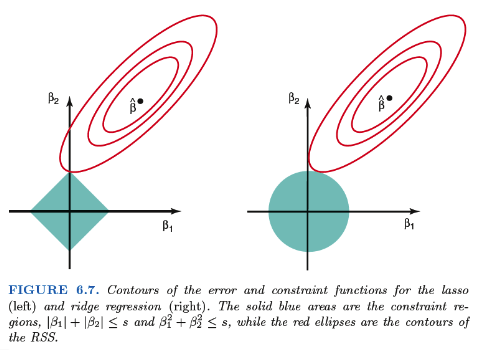

Различий несколько между $l_1$ и $l_2$ регуляризациями:

- Lasso **сложнее считать** из-за недифференцируемых углов шара в $l_1$ норме (в значении нуля для признаков)
- **отсутствие аналитического решения** делает вычисления и теоретические значения весов при $l_1$ регуляризации более сложными
- В Lasso появляется **зануление весов** для некоторых признаков

Протестируем методы на реальных данных

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split

import pandas as pd
import seaborn as sns


In [ ]:
iris = load_iris()


In [ ]:
data = pd.DataFrame(data=np.hstack([iris.data, iris.target[:, np.newaxis]]),
                    columns=iris.feature_names + ['target'])

names = data.columns
data.head()


In [ ]:
sns.pairplot(data, hue='target')

plt.show()


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data[names[:-1]], data[names[-1]])


In [ ]:
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score, f1_score


In [ ]:
cls = make_pipeline(
    StandardScaler(),
    LogisticRegression(C=2)
)
cls = cls.fit(X_train.to_numpy(), y_train)
preds_train = cls.predict(X_train)

accuracy_score(preds_train, y_train), f1_score(preds_train, y_train, average='macro')


In [ ]:
preds_test = cls.predict(X_test)

accuracy_score(preds_test, y_test), f1_score(preds_test, y_test, average='macro')


In [ ]:
# cls.coef_, cls.intercept_
cls[1].coef_, cls[1].intercept_


In [ ]:
from matplotlib.colors import ListedColormap

plt.figure(figsize=(15,8))

eps = 0.1
xx, yy = np.meshgrid(np.linspace(np.min(X_train[names[0]]) - eps, np.max(X_train[names[0]]) + eps, 500),
                     np.linspace(np.min(X_train[names[1]]) - eps, np.max(X_train[names[1]]) + eps, 500))



cls.fit(X_train[names[:2]], y_train)
Z = cls.predict(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)

cmap_light = ListedColormap(['#AAAAFF', '#FFAAAA', '#AAFFAA'])
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

plt.scatter(X_train[names[0]], X_train[names[1]], c=y_train, cmap='brg')
None


# ДЗ 2. Линейные алгоритмы

In [ ]:
import numpy as np
import pandas as pd
import scipy.linalg as sla
import matplotlib.pyplot as plt

from sklearn import datasets
from sklearn.linear_model import LinearRegression, Lasso, Ridge


In [ ]:
np.random.seed(42)


# Градиентный спуск: повторение

Рассмотрим функцию от двух переменных
$f(x, y) = \sin^2 x + \sin^2 y$  

In [ ]:
def f(x):
    """
    :param x: np.array(np.float) вектор длины 2
    :return: np.float
    """
    return np.sum(np.sin(x)**2)


Обратите внимание, что $x$ - numpy-array вектор длины 2.

***Reminder:***  
Что мы хотим? Мы хотим найти минимум этой функции (в машинному обучении мы обычно хотим найти минимум **функции потерь**, например, MSE), а точнее найти $x_1$ и $x_2$ такие, что при них значение $f(x_1,x_2)$ минимально, то есть *точку экстремума*.  
  
Как мы будем искать эту точку? Используем методы оптимизации (в нашем случае - *минимизации*). Одним из таких методов и является **градиентный спуск**.

## Задание 1
Реализуйте функцию, которая будет осуществлять градиентный спуск для функции $f$:

*Примечание:* Вам нужно посчитать частные производные именно **аналитически** и **переписать их в код**, а не считать производные численно (через отношение приращения функции к приращению аргумента) -- в этих двух случаях могут различаться ответы, поэтому будьте внимательны.

In [ ]:
#Сначала реализуем функцию, вычисляющую градиент

def grad_f(x):
    """
    Градиент функциии f, определенной выше.
    :param x: np.array[2]: float вектор длины 2
    :return: np.array[2]: float вектор длины 2
    """
    return 2 * np.sin(x) * np.cos(x)


In [ ]:
# Проверим, что градиент принимает вектор из двух чисел и выдает на этой точке верное значение
assert np.allclose(grad_f(np.array([1, 2])),
                   np.array([0.90929743, -0.7568025])), "Что-то не так!"


In [ ]:
def grad_descent_2d(f, grad_f, lr, num_iter=100, x0=None):
    """
    функция, которая реализует градиентный спуск в минимум для функции f от двух переменных.
        :param f: скалярная функция двух переменных
        :param grad_f: функция, возвращающая градиент функции f (устроена как реализованная вами выше grad_f)
        :param lr: learning rate алгоритма
        :param num_iter: количество итераций градиентного спуска
        :return: np.array[num_iter, 2] пар вида (x, f(x))
    """
    if x0 is None:
        x0 = np.random.random(2)

    # будем сохранять значения аргументов и значений функции
    # в процессе град. спуска в переменную history
    history = []

    # итерация цикла -- шаг градиентнго спуска
    curr_x = x0.copy()
    for iter_num in range(num_iter):
        entry = np.hstack((curr_x, f(curr_x)))
        history.append(entry)

        curr_x -= lr * grad_f(curr_x)

    return np.vstack(history)


### Тестируем написанную функцию

In [ ]:
steps = grad_descent_2d(f, grad_f, lr=0.1, num_iter=20)


Визуализируем точки градиентного спуска на 3D-графике нашей функции. Звездочками будут обозначены точки (тройки $x_1, x_2, f(x_1, x_2)$), по которым Ваш алгоритм градиентного спуска двигался к минимуму.

(Для того, чтобы написовать этот график, мы и сохраняли значения $cur\_x_1, cur\_x_2, f(cur\_x_1, cur\_x_2)$ в `steps` в процессе спуска)

Если у Вас правильно написана функция `grad_descent_2d`, то звездочки на картинке должны сходиться к одной из точку минимума функции. Вы можете менять начальные приближения алгоритма, значения `lr` и `num_iter` и получать разные результаты.

In [ ]:
steps


In [ ]:
#%matplotlib osx

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np

path = []

X, Y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))

fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(16, 10))

zs = np.array([f(np.array([x,y]))
              for x, y in zip(np.ravel(X), np.ravel(Y))])
Z = zs.reshape(X.shape)


ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, zorder=2)

ax.plot(xs=steps[:, 0], ys=steps[:, 1], zs=steps[:, 2],
        marker='*', markersize=20, zorder=3,
        markerfacecolor='y', lw=3, c='black')

ax.set_zlim(0, 5)
ax.view_init(elev=60)
plt.show()


Посмотрим на график значений функции от шага

In [ ]:
plt.figure(figsize=(14,7))
plt.xlabel('grad descent step number')
plt.ylabel('$f(x)$')
plt.title('Значение функции на каждом шаге гардиентного спуска.')

f_values = list(map(lambda x: x[2], steps))
plt.plot(f_values, label='gradient descent result')
plt.legend()


Когда вы используете градиентный спуск всегда нужно проверять, сошелся ли он. К сожалению для большинства моделей не получится построить 3D график, поэтому обязательно нужно смотреть на то, как менялся лосс на каждом шаге градиентного спуска.

# Генератор батчей

Обычно генерация батчей отличается от той, которую мы использовали в семинаре. Мы выбирали *batch_size* случайных строчек на каждом шаге, но у такого подхода есть минусы. Основной заключается в том, что некоторые строчки из обучающего датасета могут попадаться значительно реже, чем другие.

Чтобы это исправить обучение делят на эпохи. Мы хотим, чтобы в течение одной эпохи модель обучилась на каждом примере один раз. Для этого нужно перемешать строчки в датасете и каждый раз брать очередные *batch_size* строчек.

Может так получится, что размер датасета не делится на *batch_size*, тогда последний батч будет состоять из нескольких последних строк и его размер будет меньше, чем *batch_size*. Такой батч иногда выкидывают и просто не используют. Именно так вам нужно поступить в этом задании.

## Задание 2

Напишите генератор батчей, который будет принимать на вход признаки, ответы и размер батча. Генератор должен возвращать tuple из ($X_{batch}$, $y_{batch}$). Если размер датасета не делится на batch_size, то **последний маленький батч возвращать не нужно**.

Подробнее про Python генераторы можно прочитать здесь:

[Документация](https://wiki.python.org/moin/Generators)

[Описание на русском](https://pythoner.name/list-generator)

Чтобы не перемешивать сам датасет воспользуйтесь np.random.permutation(len(X))


In [ ]:
def generate_batches(X, y, batch_size):
    """
    param X: np.array[n_objects, n_features] --- матрица объекты-признаки
    param y: np.array[n_objects] --- вектор целевых переменных
    """
    assert len(X) == len(y)
    np.random.seed(42)
    X = np.array(X)
    y = np.array(y)
    perm = np.random.permutation(len(X))

    for batch_start in range(1, (len(X) // batch_size) + 1):
        start = (batch_size * (batch_start - 1))
        end = (batch_size * batch_start + 1)
        yield tuple([X[perm][start:end - 1], y[perm][start:end - 1]])


### Тестируем написанную функцию

Проверим, что наш генератор батчей перемешивает датасет и каждый элемент встречается один раз:

In [ ]:
X_fake = np.arange(100)[:, np.newaxis]
y_fake = np.arange(100) + 1000

X_reconstructed, y_reconstructed = [], []
for X_batch, y_batch in generate_batches(X_fake, y_fake, 10):
    X_reconstructed.append(X_batch)
    y_reconstructed.append(y_batch)

X_reconstructed = np.concatenate(X_reconstructed)
y_reconstructed = np.concatenate(y_reconstructed)

assert (X_fake != X_reconstructed).all(), "Что-то не так!"
assert (y_fake != y_reconstructed).all(), "Что-то не так!"

assert (np.sort(X_reconstructed, axis=0) == X_fake).all(), "Что-то не так!"


Попробуем теперь *batch_size* не делящий размер датасета.

In [ ]:
X_fake = np.arange(100)[:, np.newaxis]
y_fake = np.arange(100) + 1000

num_batches = 0
for X_batch, y_batch in generate_batches(X_fake, y_fake, 7):
    num_batches += 1

assert num_batches == len(X_fake) // 7, "Что-то не так!"


# Обычная логистическая регрессия
В этом пункте вы напишете класс логистической регрессии. Пока мы не будем добавлять в функцию потерь регуляризационные слагаемые.

Вам необходимо будет воспользоваться оптимизацией с помощью SGD, используя генератор батчей, который вы написали выше.

## Задание 3
Реализуйте методы ``fit`` и ``get_grad`` класса ``MyLogisticRegression``.


Напоминаем формулы:

$$Loss(y, p) = -\sum_{i=1}^{l} (y_i \log (p_i) + (1 - y_i) \log (1 - p_i))$$


$$ \frac{\partial L}{\partial w} = X^T (p - y)$$


In [ ]:
def logit(x, w):
    return np.dot(x, w)

def sigmoid(h):
    return 1. / (1 + np.exp(-h))


In [ ]:
class MyLogisticRegression(object):
    def __init__(self):
        self.w = None

    def fit(self, X, y, epochs=10, lr=0.1, batch_size=100):
        n, k = X.shape
        if self.w is None:
            np.random.seed(42)
            # Вектор столбец в качестве весов
            self.w = np.random.randn(k + 1)

        X_train = np.concatenate((np.ones((n, 1)), X), axis=1)

        losses = []

        # Положите в лист losses лосс на каждом батче. Не нужно усреднять лосс по эпохе.

        for i in range(epochs):
            for X_batch, y_batch in generate_batches(X_train, y, batch_size):
                #В X_train уже добавлен вектор 1

                predictions = self._predict_proba_internal(X_batch)#YOUR CODE: предскажите вероятности на X_batch
                loss = -np.sum((y_batch * np.log(predictions)) + (1 - y_batch) * np.log(1 - predictions))#YOUR CODE: вычислите loss на текущем батче

                assert (np.array(loss).shape == tuple()), "Лосс должен быть скаляром!"

                losses.append(loss)

                #YOUR CODE: обновите self.w по формуле градиентного спуска. Используйте функцию self.get_grad для вычисления градиента. Не забудьте про learning rate!

        return losses

    def get_grad(self, X_batch, y_batch, predictions):
        """

        param X_batch: np.array[batch_size, n_features + 1] --- матрица объекты-признаки
        param y_batch: np.array[batch_size] --- батч целевых переменных
        param predictions: np.array[batch_size] --- батч вероятностей классов

        Принимает на вход X_batch с уже добавленной колонкой единиц.
        Выдаёт градиент функции потерь в логистической регрессии
        как сумму градиентов функции потерь на всех объектах батча
        ВНИМАНИЕ! Нулевая координата вектора весов -- это BIAS, а не вес признака.
        Также не нужно ДЕЛИТЬ ГРАДИЕНТ НА РАЗМЕР БАТЧА:
        нас интересует не среднее, а сумма.
        В качестве оператора умножения матриц можно использовать @

        Выход -- вектор-столбец градиентов для каждого веса (np.array[n_features + 1])
        """

        #компонент градиента из логрегрессии
        #следите за размерностями

        grad_basic = X_batch.transpose() @ (predictions - y_batch)#YOUR CODE
        assert grad_basic.shape == (X_batch.shape[1],) , "Градиенты должны быть столбцом из k_features + 1 элементов"

        return grad_basic

    def predict_proba(self, X):
        n, k = X.shape
        X_ = np.concatenate((np.ones((n, 1)), X), axis=1)
        return sigmoid(logit(X_, self.w))

    def _predict_proba_internal(self, X):
        """
        Возможно, вы захотите использовать эту функцию вместо predict_proba, поскольку
        predict_proba конкатенирует вход с вектором из единиц, что не всегда удобно
        для внутренней логики вашей программы
        """
        return sigmoid(logit(X, self.w))

    def predict(self, X, threshold=0.5):
        return self.predict_proba(X) >= threshold

    def get_weights(self):
        return self.w.copy()
        # copy тут используется неспроста. Если copy не использовать, то get_weights()
        # выдаст ссылку на объект, а, значит, модифицируя результат применения функции
        # get_weights(), вы модифицируете и веса self.w. Если вы хотите модифицировать веса,
        # (например, в fit), используйте self.w

    def __loss(self, y, p):
        p = np.clip(p, 1e-10, 1 - 1e-10)
        return -np.sum(y * np.log(p) + (1 - y) * np.log(1 - p))


### Тестируем написанную функцию


In [ ]:
m = MyLogisticRegression()
X = np.array([[1, 3, 4], [1, -5, 6], [-3, 5, 3]])
X = np.concatenate((np.ones((X.shape[0], 1)), X), axis=1)
y = np.array([1, 0, 1])
preds = np.array([.55, .22, .85])
grads = m.get_grad(X, y, preds)
assert np.allclose(grads, np.array([-0.38,  0.22, -3.2 , -0.93])), "Что-то не так!"


In [ ]:
np.random.seed(42)
m = MyLogisticRegression()
X = np.random.rand(100,3)
y = np.random.randint(0, 1, size=(100,))
preds = np.random.rand(100)
grads = m.get_grad(X, y, preds)
assert np.allclose(grads, np.array([23.8698149, 25.27049356, 24.4139452])), "Что-то не так!"


# Логистическая регрессия с $l_1$ и $l_2$ регуляризацией (elastic net).

Ваша задача -- написать класс логистической регрессии с обеими регуляризациями и оптимизацией с помощью SGD, используя генератор батчей, который вы написали выше.

Обратите внимание, что реализация ElasticNet отличается от реализации LogisticRegression только функцией потерь для оптимизации. Поэтому единственная функция, которая будет отличаться у двух методов, это ``self.get_grad()``.

Поэтому в данном случае естественно применить паттерн *наследования*. Весь синтаксис наследования мы прописали за вас. Единственное, что вам осталось сделать, это переопределить метод ``get_grad()`` в отнаследованном классе.

## Задание 4
Реализуйте метод ``get_grad()`` класса ``MyElasticLogisticRegression``

Формулы:

$$L_1 (w) = \alpha \sum_{j=1}^{n}|w_j| $$

$$L_2 (w) = \beta\sum_{j=1}^{n}w_j^2$$

$$\frac{\partial L_1}{\partial w_1} = \alpha \cdot \mathrm{sign}(w_1)$$

$$ \frac{\partial L_2}{\partial w_1} = 2\beta w_1$$


In [ ]:
class MyElasticLogisticRegression(MyLogisticRegression):
    def __init__(self, l1_coef, l2_coef):
        self.l1_coef = l1_coef
        self.l2_coef = l2_coef
        self.w = None

    def get_grad(self, X_batch, y_batch, predictions):
        """
        Принимает на вход X_batch с уже добавленной колонкой единиц.
        Выдаёт градиент функции потерь в логистической регрессии с регуляризаторами
        как сумму градиентов функции потерь на всех объектах батча + регуляризационное слагаемое
        ВНИМАНИЕ! Нулевая координата вектора весов -- это BIAS, а не вес признака.
        Bias в регуляризационные слагаемые не входит. Также не нужно ДЕЛИТЬ ГРАДИЕНТ НА РАЗМЕР БАТЧА:
        нас интересует не среднее, а сумма.

        Выход -- вектор-столбец градиентов для каждого веса (np.array[n_features + 1])
        """


        grad_basic = X_batch.transpose() @ (predictions - y_batch)#YOUR CODE: компонент градиента из логрегрессии. Обнулять bias-компоненту этой составляющей градиента не нужно!

        mask = np.ones_like(self.w, dtype = bool)
        mask[0] = False

        grad_l1 = self.l1_coef * np.sign(self.w * mask)#YOUR CODE: компонент градиента из l_1-регуляризации (не забудьте обнулить компоненту с bias)
        grad_l2 = 2 * self.l2_coef * (self.w * mask) #YOUR CODE: компонент градиента из l_2-регуляризации (не забудьте обнулить компоненту с bias)

        #Обнулять bias-компоненту вектора весов не нужно!


        assert grad_l1[0] == grad_l2[0] == 0, "Bias в регуляризационные слагаемые не входит!"
        assert grad_basic.shape == grad_l1.shape == grad_l2.shape == (X_batch.shape[1],) , "Градиенты должны быть столбцом из k_features + 1 элементов"

        return grad_basic + grad_l1 + grad_l2


### Тестирование
Протестируем написанную функцию:


In [ ]:
m = MyElasticLogisticRegression(.2,.2)
X = np.array([[1, 3, 4], [1, -5, 6], [-3, 5, 3]])
X = np.concatenate((np.ones((X.shape[0], 1)), X), axis=1)
y = np.array([1, 0, 1])
preds = np.array([.55, .22, .85])
m.w = np.array([1,1,1,1])
grads = m.get_grad(X, y, preds)
assert np.allclose(grads, np.array([-0.38,  0.82, -2.6 , -0.33])), "Что-то не так!"


In [ ]:
np.random.seed(42)
m = MyElasticLogisticRegression(.2, .2)
X = np.random.rand(100,3)
X = np.concatenate((np.ones((X.shape[0], 1)), X), axis=1)
y = np.random.randint(0, 1, size=(100,))
preds = np.random.rand(100)
m.w = np.array([1,1,1,1])
grads = m.get_grad(X, y, preds)
assert np.allclose(grads, np.array([49.11489408, 24.4698149, 25.87049356, 25.0139452])), "Что-то не так!"


## Смотрим, как работает наша модель
Протестируем на искусственных данных:

In [ ]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=1000, centers=[[-2,0.5],[3,-0.5]], cluster_std=1, random_state=42)
#y = y.reshape(-1, 1)

colors = ("red", "green")
colored_y = np.zeros(y.size, dtype=str)

for i, cl in enumerate([0,1]):
    colored_y[y.ravel() == cl] = str(colors[i])

plt.figure(figsize=(15,10))
plt.scatter(X[:, 0], X[:, 1], c=colored_y)
plt.show()


In [ ]:
clf = MyElasticLogisticRegression(0.1, 0.1)
clf.fit(X, y, epochs=1000)
w = clf.get_weights()


In [ ]:
from matplotlib.colors import ListedColormap

plt.figure(figsize=(15,8))

eps = 0.1
xx, yy = np.meshgrid(np.linspace(np.min(X[:,0]) - eps, np.max(X[:,0]) + eps, 200),
                     np.linspace(np.min(X[:,1]) - eps, np.max(X[:,1]) + eps, 200))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

plt.scatter(X[:, 0], X[:, 1], c=colored_y)


Теперь протестируем на датасете MNIST. Это очень простой класический датасет, на котором часто тестируются модели. С помощью нейронных сетей люди научились получать на нем качество 99.84%.

Датасет состоит из черно-белых картинок с цифрами. ![mnist-3.0.1.png](https://www.researchgate.net/profile/Steven_Young11/publication/306056875/figure/fig1/AS:393921575309346@1470929630835/Example-images-from-the-MNIST-dataset.png)

Так как мы сделали классификатор для двух классов, то мы выберем из всех картинок только картинки 0 и 1, првратим их из двумерной матрицы в вектор и обучим нашу модель.

In [ ]:
data = pd.read_csv('/Users/dadaya/Downloads/train.csv')
#файл лежит в директории с домашним заданием. Чтобы иметь возможность его
#открыть, загрузите его на колаб (панель слева, нажимаем значок "Файлы",
#выбираем "загрузить в сессионное хранилище", выбираем нужный файл)
data.head()


Данные выглядят как таблица, первая колонка которой это лейбел -- цифра, которая изображена на картинке, а следующие 784 колонки это значения от 0 до 255, описывающие все пиксели картинки 28х28. То есть нам не придется делать reshape и превращать матрицу в вектор, так как это уже сделано.

In [ ]:
X = data.iloc[:, 1:]
y = data.iloc[:, 0]

# Выберем только картинки, где изображен 0 и 1
X = X[(y == 0) | (y == 1)]
y = y[(y == 0) | (y == 1)]


Для оценки модели мы используем кросс валидацию.

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

make_pipeline(StandardScaler(), MyElasticLogisticRegression(0.1, 0.1))

my_pipeline = Pipeline(steps = [('standardscaler', StandardScaler()), ('myelasticlogisticregression', MyElasticLogisticRegression(0.1, 0.1))])

mean_accuracy = np.sum(cross_val_score(my_pipeline, X, y, scoring = 'accuracy', cv = 5)) / 5

# YOUR CODE
# Сделайте sklearn pipeline с StandarScaler и MyElasticLogisticRegression и проверьте точность с помощью cross_val_score.
# в качестве scorer используйте 'accuracy'. Эта часть не проверяется в степике.


print(f"Mean accuracy of Logistic Regression for two classes is {mean_accuracy}")


# Лекция 3. Решающие деревья и композиции алгоритмов
## Метрики в задаче регрессии
### Метрики классификации и регрессии
- Accuracy(процент правильных ответов) - метрика классификации
- MSE = $\frac{1}{l}\sum\limits^l_{i = 1}(y^i_{true} - y^i_{pred})^2$ - метрика регрессии
### Метрика
_**Метрика**_ - численный показатель качества работы алгоритма для данной задачи.

- Принимает на вход правильные ответы и ответы алгоритма.
- Метрика тем больше(или меньше), чем точнее алгоритм предсказывает правильные ответы.
- Для разных задач можно рассматривать специфические метрики.
### Метрики в задаче классификации
- Задача: поиск мошеннеческих операций в банке
- Классы: мошенническая операция(1), обычная операция(0)

![metrics](metrics.png)
### Precision и recall
![precision_recall](precision_recall.png)
### F1-мера
- Precision и Recall - важнейшие метрики задачи классификации
- F1-мера = $\frac{2 \cdot precision \cdot recall}{precision + recall}$
### ROC-AUC
- Метрика в задаче классификации
- Работает с предсказанными вероятностями классов

![roc-auc](roc-auc.png)
### Receiver Operator Characteristic
![roc](roc.png)
### ROC-кривая: примеры
![roc_example](roc_example.png)
### Более сложные метрики машинного обучения
- Модель предсказания спроса на ноутбуки - задача регрессии
- Реальный спрос составит 15 ноутбуков
- Предсказали 20 ноутбуков - не очень хорошо, но не так страшно
- Предсказали 10 ноутбуков - гораздо хуже

$$L(y_{true}, y_{pred}) = 
\begin{equation*}
\left\{
\begin{array}{lr}
\alpha(y_{true} - y_{pred}), & y_{true} > y_{pred}\\
\beta(y_{pred} - y_{true}), & y_{true} \leq y_{pred}
\end{array}
\right.
\end{equation*}$$

![metric](metric.png)
### Базовые метрики регрессии
Дано: выборка из l элементов.
$y^i_{true}$ - верный ответ на i-ом объекте, $y^i_{pred}$ - предсказанный ответ.
- Средняя квадратичная ошибка, MSE
$$\frac{1}{l}\sum\limits^l_{i = 1}(y^i_{true} - y^i_{pred})^2$$
- Средняя абсолютная ошибка, MAE
$$\frac{1}{l}\sum\limits^l_{i = 1}|y^i_{true} - y^i_{pred}|$$
### RMSE и MAPE
- Корень из средней квадратичной ошибки, RMSE
$$\sqrt{\frac{1}{l}\sum\limits^l_{i = 1}(y^i_{true} - y^i_{pred})^2}$$
- Процентная средняя абсолютная ошибка, MAPE
$$\frac{1}{l}\sum\limits^l_{i = 1}|\frac{y^i_{true} - y^i_{pred}}{y^i_{true}}|$$
### Коэффицент детерминации($R^2$)
Коэффицент детерминации($R^2$):
$$R^2(y_{true}, y_{pred}) = 1 - \frac{\sum\limits^l_{i = 1}(y^i_{true} - y^i_{pred})^2}{\sum\limits^l_{i = 1}(y^i_{true} - \overline{y_{true}})^2}$$
- Если $y^i_{pred}$ равно $\overline{y_{true}}$ для всех i, то $R^2$ равно 0
- Если $y^i_{pred}$ равно $y^i_{true}$ для всех i, то $R^2$ равно 1
- $R^2$ может быть отрицательным
- Для "адекватных" моделей $0 \leq R^2 \leq 1$
### Метрика и функция потерь
Метрика
- Необходима для измерения качества работы
- Должна соответствовать бизнес-задаче, важна заказчику
- Должна быть интерпретируемой

Функция потерь
- Необходима для обучения алгоритма
- При обучении ее обычно минимизируют
- Должна быть удобной для минимизации
## Решающие деревья
### Примеры решающих правил
В жизни мы принимаем решения не как линейные алгоритмы или kNN.
- Если в анкете указан домашний телефон и зарплата клиента > 1000$ и размер кредита < 3000$, то кредит выдать
- Если возраст пациента > 60 и пациент ранее перенес инфаркт, то операцию не делать

_**Логический алгоритм**_ - алгоритм, использующий логические закономерности в данных
### Решающие деревья
- В каждой вершине дерева находится вопрос
- В зависимости от ответа на вопрос, алгоритм направляется в нужную ветвь дерева
- Листы дерева соответсвуют решению алгоритма

![decision_tree](decision_tree.png)
### Обучение решающего дерева
- Находимся в красной вершине
- До красной вершины дошла часть объектов обучающей выборки
- Находим решающее правило так, чтобы объекты, дошедшие до красной вершины, хорошо разделялись по искомым классам

![decision_tree_1](decision_tree_1.png)
![decision_tree_2](decision_tree_2.png)

- Одна из нижних вершин стала терминальной
- Повторяем с другой вершиной

![decision_tree_3](decision_tree_3.png)
### Как выбрать критерий ветвления?
![leaf_criteria](leaf_criteria.png)
![leaf_criteria_1](leaf_criteria_1.png)

$$\frac{L}{Q}H(p_L) + \frac{R}{Q}H(p_R) \to min$$
Возможные функции H(q):
- Энтропия:

$H(q) = -qlogq - (1 - q)log(1 - q)$
- Индекс Джини:

$H(q) = 4q(1 - q)$

Затем решаем оптимизационную задачу для поиска правила

![leaf_criteria_2](leaf_criteria_2.png)
### Решающее дерево для Ирисов Фишера
Задача Фишера о классификации ирисов на три класса.

В выборке по 50 объектов каждого класса, у каждого объекта 4 признака.

![iris_tree](iris_tree.png)

В осях двух самых информативных признаков два класса разделились без ошибок, на третьем - три ошибки.
### Недообучение и переобучение
![tree_fitting](tree_fitting.png)
### Параметры решающего дерева
- Критерий ветвления("gini", "entropy")
- Максимальная глубина
- Минимальный размер листа
- Стратегия сплита
### Решающее дерево для регрессии
- В листах дерева вместо классов объектов находятся действительные числа
- Количество ответов решающего дерево ограничено количеством листовых вершин

![decision_tree_regression](decision_tree_regression.png)
### Резюме: решающее дерево
Преимущества:
- Простая идея и алгоритм обучения
- Интерпретируемое
- Возможна регуляризация
- Обработка пропущенных значений

Недостатки:
- Очень быстро переобучается
- Проблемы с регрессией
- Сильно меняется в зависимости от параметров
## Композиции алгоритмов
### Принцип Кондорсе
- Если вероятность правильного решения члена жюри больше 0.5, то вероятность правильного решения присяжных в целом возрастает с увеличением количества членов жюри и стремится к единице.
- Если же веротяность быть правым меньше 0.5, то вероятность принятия правильного решения присяжными монотонно уменьшается и стремится к нулю с увеличением количества присяжных.
### Эксперимент Гальтона
- Собралось около 800 человек, которые попытались угадать вес быка на ярмарке. Бык весил 1198 фунтов.
- Ни один крестьянин не угадал точный вес быка.
- Однако, среднее предсказание оказалось равным 1197 фунтов.
### Метод простого голосования
- $a_1, a_2,..., a_n$ - несколько обученных алгоритмов
- Классификация: относим x к классу, за который проголосовало _**большинство**_ из $a_1(x), a_2(x),...,a_n(x)$
- Регрессия: ответом является среднее значение $a_1(x), a_2(x),...,a_n(x)$
### Бутстреп
![bootstrap](bootstrap.png)
### Бэггинг
- Бэггинг(_**b**_ootstrap _**agg**_regation) - принцип построения композиции, основанный на простом голосовании
- 100 деревьев
- Бутстрепная выборка для каждого дерева
- Финальное решение принимается простым голосованием

![bagging](bagging.png)

_**Random Forest**_ - бэггинг над Decision Tree
### Decision Tree и Random Forest
![decision_random](decision_random.png)
### Недостатки случайного леса
- Слишком дорогое и громоздкое вычисление
- В индустрии стараются обойтись без композиций
- Тем не менее, вычисления можно проводить параллельно
### Стекинг
![staking](staking.png)
### Бустинг
- Строим алгоритмы последовательно
- Каждый следующий алгоритм компенсирует ошибку всех предыдущих
- Принимаем решение взвешенным голосованием:
$$a(x) = c_1a_1(x) + c_2a_2(x) + ... + c_na_n(x)$$
- Сильный метод бустинга - градиентный бустинг над Decision Tree
### Резюме
- Бэггинг, стекинг и бустинг используют принцип композиции
- Бэггинг принимает решение простым голосованием
- Стэкинг обучает метаалгоритм над разноплановыми алгоритмами
- Бустинг строит базовые модели, компенсирующие ошибки предыдущих
## Градиентный бустинг
### Градиентный бустинг
Градиентный бустинг - эффективный способ построения композиции решающих деревьев
- Деревья строятся последовательно
- Каждое следующее дерево стремится компенсировать ошибку уже построенных
- Решение затем принимается взвешенным голосованием:
$$a(x) = c_1a_1(x) + c_2a_2(x) + ... + c_na_n(x)$$
### Напоминание: градиентный спуск
- Минимизируем функцию f(x)
- Выбираем $x_0$ - начальное приближение
- Пусть $x_n$ - текущая найденная точка
- Вычисляем градиент $f'(x_n)$
- Вычисляем следующее приближение:

$x_{n + 1} = x_n - \alpha f'(x_n)$

![gradient_descent](gradient_descent.png)
### Постановка задачи
Имеем:
- X = {$x^1, x^2,...,x^l$} - обучающая выборка
- y = {$y^1, y^2,...,y^l$} $\in \mathcal{R}^l$ - целевая переменная

Цель: построить алгоритм a(x), оптимизирующий функцию потерь
$$Q(y, a) = \frac{1}{l}\sum\limits^l_{i = 1}\mathcal{L}(y^i, a(x^i))$$
Пример: квадратичная функция потерь
$$mathcal{L}(y, a) = (a - y)^2$$
### Построение композиции
- Пусть уже построены $a_1,a_2,...,a_k$, а также константы $c_1,c_2,...,c_k$
- Хотим построить $a_{k + 1}$
- Запишем функцию потерь для одного объекта
$$\mathcal{L}(y^i, a(x^i)) = \mathcal{L}(y^i, \underbrace{c_1a_1(x^i) + ... + c_ka_k(x^i)}_{\text{уже построено}} + \underbrace{c_{k + 1}a_{k + 1}(x^i)}_{\text{нужно построить}})$$

$f(t + \Delta t) \to \min\limits_t$

$$a_{k + 1}(x^i) := -\mathcal{L_a'}(y^i, a)|_{a = c_1a_1(x^i) + ... + c_ka_k(x^i)}$$
### Построение очередного дерева
Для одного объекта:
$$a_{k + 1}(x^i) := \underbrace{-\mathcal{L_a'}(y^i, a)|_{a = c_1a_1(x^i) + ... + c_ka_k(x^i)}}_{\text{новая целевая переменная}}$$
Для нескольких объектов: решаем новую задачу машинного обучения, где (k + 1)-ое дерево "настраивается" по направлению антиградиента функции потерь.

Константа в бустинге выбирается так же, как и в градиентном спуске
### Градиентный бустинг для MSE
Антиградиент функции потерь для MSE:
$$-\mathcal{L'_a}(y^i, a)|_{a = c_1a_1(x^i) + ... + c_ka_k(x^i)} = -2(a - y^i)|_{a = c_1a_1(x^i) + ... + c_ka_k(x^i)} = -2(c_1a_1(x^i) + ... + c_ka_k(x^i) - y^i)$$
_**Вывод**_. В случае MSE алгоритм градиентного бустинга настраивается на разность ответа и текущего приближения:
$$\bf{a_{k + 1}(x^i)} = -2(c_1a_1(x^i) + ... + c_ka_k(x^i) - y^i)$$
### Градиентный бустинг
- Базовые алгоритмы должны быть простыми и быстро обучаемыми
- Часто в качестве базовых алгоритмов используются решающие деревья
- Реализации градиентного бустинга над решающими деревьями:
![grad_boost](grad_boost.png)
### Бустинг: качество от итерации
![grad_boost_1](grad_boost_1.png)
### Бустинг: преимущества и недостатки
Преимущества:
- Позволяет очень точно восстанавливать искомую функцию
- Почти не переобучаются
- По сравнению со случайным лесом, способен компенсировать систематическую ошибку каждого из базовых алгоритмов, а не накапливает их
- Работает с произвольной функцией потерь в задаче классификации, регрессии, ранжирования, ...

Недостатки:
- Медленый
- Плохо интерпретируемый
- Переобучение на выбросах при избыточном количестве алгоритмов
- Нужна довольно большая обучающая выборка

# Семинар 3. Выбор модели и цикл разработки
## Переобучение и методы борьбы с ним
Переобучение --- это одна из главных проблем, с которыми сталкиваются модели машинного обучения. Эффект переобучения состоит в том, что модель, подстраиваясь под обучающую выборку, "обращает внимание" на закономерности в выборке, которые не проявляются в общем случае и имеют характер совпадения.

Переобучение проявляется тем больше, чем больше степеней свободы имеет модель.
### Примеры:
* Решающее дерево со слишком большой глубиной может идеально подстроиться под обучающую выборку. Параметры решающего дерева --- это решающие правила во всех вершинах (всего $\sim 2^n$ решающих правил в дереве глубины $n$).

* Алгоритм $k$ ближайших соседей подстраивается под обучаюущую выборку и может рассматриваться как эталонный пример переобучения: любой локальный шум в данных приведёт к ошибке. Параметрами Knn являются **все элементы обучающей выборки**.

* Линейный алгоритм, построенный для выборки слишком маленького размера со слишком большим количеством признаков неизбежно переобучится под обучающую выборку.

Во всех примерах мы видим, что при слишком большой сложности модели по сравнению с количеством элементов в обучающей выборке переобучение имеет место. Строго говоря, **переобучение есть всегда, когда имеет место принятие решения в условии неполных данных**, то есть всегда в машинном обучении.

<img src='https://drive.google.com/uc?id=1wQQ0tMAtZVhbeQgUVdiS7kfmMw7P7NM9'/>

Чтобы нивелировать эффект переобучения, нужно поймать момент, в который качество на тестовой выборке начинает увеличиваться с ростом сложности модели. В этот момент обучение стоит останавливать.

## Переобучение многочленов
Смоделируем переобучение сколонность к переобучению полиномиальной зависимости с ростом степени многочлена. Сгенерируем искусственные данные из линейной зависимости с шумом и восстановим зависимость с помощью многочленов степени 1, 3, 4, 7.

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import seaborn as sns
sns.set(font_scale=1.5)

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline


In [ ]:
X = np.linspace(-10, 10, 20)

y = 2 * X + 3 + np.random.randn(20) * 3

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.5, random_state=42)
plt.figure(figsize=(10,6))
plt.scatter(X_train,y_train, label='Train')
plt.scatter(X_test,y_test, label='Test')
plt.plot(X, 2 * X + 3, color='red', lw=3, alpha = 0.2)
legend_box = plt.legend(framealpha=1).get_frame()
legend_box.set_facecolor("white")
legend_box.set_edgecolor("black")
plt.show()


In [ ]:
grid = np.linspace(-12, 12, 500)

fig, ax = plt.subplots(3, 2, figsize=(18,18))

ax = ax.ravel()

for i, deg in enumerate([1,3,4,7,9, 20]):

    poly = np.polyfit(X_train, y_train, deg)
    ax[i].set_title('Polynomial fit, degree = ' + str(deg))
    ax[i].scatter(X_train,y_train,
                  label='train mse={:.3f}'.format(mean_squared_error(y_train, np.polyval(poly, X_train))))
    ax[i].scatter(X_test,y_test,
                  label='test mse={:.3f}'.format(mean_squared_error(y_test, np.polyval(poly, X_test))))
    ax[i].set_ylim(-40, 40)
    ax[i].plot(grid, np.polyval(poly, grid))

    ax[i].plot(X, 2 * X + 3, color='red', lw=1, alpha = 0.4)
    legend_box = ax[i].legend(framealpha=1).get_frame()
    legend_box.set_facecolor("white")
    legend_box.set_edgecolor("black")
fig.show()


$$||x-y||, \text{x, y - векторы в 2-мерном пространстве}$$
$$||x - y|| = \sqrt{(x_1 - y_1)^2 + (x_2-y_2)^2}$$

$$||x-y||, \text{x, y - векторы в n-мерном пространстве}$$
$$||x - y|| = \sqrt{(x_1 - y_1)^2 + ... + (x_n-y_n)^2}$$

### Идея 1: регуляризация
Суть регуляризации состоит в том, чтобы добавлять к функции потерь слагаемое, ограничивающее рост весов модели. Например, обычная версия линейной регрессии выглядит так:
$$\frac{\sum\limits_{i=1}^{\ell}\left|\left|\langle x^i, w\rangle - y^i\right|\right|^2}{\ell} \rightarrow \min_{w}.$$

Регуляризованная версия:
$$\frac{\sum\limits_{i=1}^{\ell}\left|\left|\langle x^i, w\rangle - y^i\right|\right|^2}{\ell} + \frac{1}{C}\left|\left|w\right|\right|^2\rightarrow \min_{w}.$$

Такая версия линейной регресси называется Ridge-регрессией.  
Есть также Lasso-регрессия и ElasticNet.

Обычная версия логрегрессии:
$$-\frac{1}{\ell}\left( \sum\limits_{y^i = 1}\ln\sigma(\langle x, w\rangle) + \sum\limits_{y^i = -1}\ln(1-\sigma(\langle x, w\rangle))\right)\rightarrow \min_{w}$$

Регуляризованная версия:

$$-\frac{1}{\ell}\left( \sum\limits_{y^i = 1}\ln\sigma(\langle x, w\rangle) + \sum\limits_{y^i = -1}\ln(1-\sigma(\langle x, w\rangle))\right) + \frac{1}{C}||w||^2\rightarrow \min_{w}$$

### Идея 2: кросс-валидация

<img src='https://drive.google.com/uc?id=19TOWCsLwIjNSmcHzu46f6JqY5TEefm9h' width=600/>
Картинка говорит сама за себя. Чтобы получить более стабильное предсказание и точно увидеть переобучение, можно использовать кросс-валидацию. Это ещё пригодится дальше в ноутбуке.

# Pipeline решения ML-задачи

![lifecycle.png](https://drive.google.com/uc?export=view&id=1ZVVA3knTV7M0sTANYF4kOSMAZWG_BB5j)

![pipeline.jpg](https://drive.google.com/uc?export=view&id=1wt86eJI3wDb4SuRKFdtjvqKDaW0UDLvz)

# Выбор оптимальной модели

Теперь мы потренируемся обучению, оценке и валидации моделей, подбору оптимальных гиперпараметров, смешиванию моделей. Вам предлагается решить задачу бинарной классификации, а именно построить алгоритм, определяющий превысит ли средний заработок человека порог $50k.

In [ ]:
import pandas as pd


In [ ]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data', sep=', ')
# Назначаем имена колонок
columns = ('age workclass fnlwgt education educ-num marital-status occupation relationship '
           'race sex capital-gain capital-loss  hours-per-week native-country salary')

numeric_indices = np.array([0, 2, 4, 10, 11, 12])
categorical_indices = np.array([1, 3, 5, 6, 7, 8, 9, 13])

df.columns = columns.split() #этот метод разделит датасет по колонкам как в массиве columns

df = df.replace('?', np.nan)

df = df.dropna()

df['salary'] = df['salary'].apply((lambda x: x=='>50K')) # Будем предсказывать 1(True), если зарплата больше 50K, 0(False) иначе


In [ ]:
numeric_data = df[df.columns[numeric_indices]]

categorial_data = df[df.columns[categorical_indices]]
categorial_data.head()


In [ ]:
df['education'].unique(), len(df['education'].unique())


### One-hot кодирование
Поскольку все алгоритмы машинного обучения, которые мы изучили, работают лишь с числовыми признаками, необходимо придумать способ обработки категориальных признаков, переводящий их в числовые.
Одним из способов сделать это является One-hot кодирование. Его суть состоит в следующем. Пусть некоторая категориальная переменная (скажем, color) принимает $n$ различных значений (Red, Yellow, Green). Тогда можно создать $n$ новыx переменныx, соответствующих различным значениям категориального признака, каждая из которых равна 1 в том случае, если изначальный категориальный признак принимает такое значение, и 0 иначе. Принцип работы иллюстрирован на картинке.

<img src='https://drive.google.com/uc?id=17oipPzKv7JFU5Z94hBUzMb5zJJlpbwxj' width=700/>

В Pandas One-hot кодирование выполняется функцией pd.get_dummies. Сгенерируем One-hot признаки для нашего датасета. Сохраним полную матрицу объекты признаки в переменную X.

In [ ]:
dummy_features = pd.get_dummies(categorial_data)


In [ ]:
X = pd.concat([numeric_data, dummy_features], axis=1)
X_origin = df.iloc[:, :-1]
X.head()


In [ ]:
y = df['salary']


In [ ]:
X.shape, X_origin.shape


Теперь всё готово для обучения алгоритмов.

In [ ]:
from sklearn.model_selection import train_test_split


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X.values, y.values,
                                                    train_size=0.8,
                                                    random_state=42)


Напишем функцию, визуализирующую поиск оптимального гиперпараметра модели по сетке. Используем идею кросс-валидации.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV


In [ ]:
def search_and_draw(X, y, model, param_name, grid, param_scale='ordinary', draw=True):
    parameters = {param_name: grid}

    CV_model = GridSearchCV(estimator=model,
                            param_grid=parameters,
                            cv=5,
                            scoring='f1',
                            n_jobs=-1,
                            verbose=10)
    CV_model.fit(X, y)
    means = CV_model.cv_results_['mean_test_score']
    error = CV_model.cv_results_['std_test_score']

    if draw:
        plt.figure(figsize=(15,8))
        plt.title('choose ' + param_name)


        if (param_scale == 'log'):
            plt.xscale('log')

        plt.plot(grid, means, label='mean values of score', color='red', lw=3)

        plt.fill_between(grid, means - 2 * error, means + 2 * error,
                         color='green', label='filled area between errors', alpha=0.5)
        legend_box = plt.legend(framealpha=1).get_frame()
        legend_box.set_facecolor("white")
        legend_box.set_edgecolor("black")
        plt.xlabel('parameter')
        plt.ylabel('roc_auc')
        plt.show()

    return means, error


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier


In [ ]:
models = [KNeighborsClassifier(), DecisionTreeClassifier()]
param_names = ['n_neighbors', 'max_depth']
grids = [np.array(np.linspace(4, 30, 8), dtype='int'), np.arange(1, 30)]
param_scales = ['log', 'ordinary']


In [ ]:
for model, param_name, grid, param_scale in zip(models,
                                                param_names,
                                                grids,
                                                param_scales):
    search_and_draw(X_train, y_train, model, param_name, grid, param_scale)


Подберём параметр n_estimators в алгоритме случайный лес. Известно, что случайный лес не переобучается. Поэтому график качества будет монотонно возрастать. Следовательно, необходимо найти минимальное значение n_estimators, при котором качество не изменяется.
Поскольку каждое дерево обучается независимо от остальных, достаточно обучить сразу лес из большого количества деревьев, а затем рассмотреть подмножества нужного размера из исходного множества деревьев.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from tqdm.notebook import tqdm


In [ ]:
max_trees = 100

values = np.arange(max_trees) + 1

kf = KFold(n_splits=5, shuffle=True, random_state=1234)

global_scores = []

for train_indices, val_indices in tqdm(kf.split(X_train), total=5):
    scores = []

    X_train_kf = X_train[train_indices]
    y_train_kf = y_train[train_indices]

    X_val_kf = X_train[val_indices]
    y_val_kf = y_train[val_indices]

    forest = RandomForestClassifier(n_estimators=max_trees)
    forest.fit(X_train_kf, y_train_kf)
    trees = forest.estimators_

    for number_of_trees in tqdm(values, leave=False):
        thinned_forest = RandomForestClassifier(n_estimators=number_of_trees)

        thinned_forest.n_classes_ = 2
        thinned_forest.estimators_ = trees[:number_of_trees]

        scores.append(roc_auc_score(y_val_kf, thinned_forest.predict_proba(X_val_kf)[:, 1]))

    scores = np.array(scores)

    global_scores.append(scores)

global_scores = np.stack(global_scores, axis=0)


In [ ]:
mean_cross_val_score = global_scores.mean(axis=0)
std_cross_val_score = global_scores.std(axis=0)

plt.figure(figsize=(15,8))
plt.title('Quality of random forest')

plt.plot(values, mean_cross_val_score, label='mean values', color='red', lw=3)
plt.fill_between(values,
                 mean_cross_val_score - 2 * std_cross_val_score,
                 mean_cross_val_score + 2 * std_cross_val_score,
                 color='green',
                 label='filled area between errors',
                 alpha=0.5)
legend_box = plt.legend(framealpha=1).get_frame()
legend_box.set_facecolor("white")
legend_box.set_edgecolor("black")
plt.xlabel('number of trees')
plt.ylabel('roc-auc')

plt.show()


### Нормировка признаков

Нормируем признаки и проделаем тот же эксперимент с алгоритмом ближайших соседей. Посмотрим, изменилось ли качество предсказания.

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


`StandardScaler` выполняет преобразование $$z = \frac{x - \mu}{\sigma}, \text{где $\sigma$ - стандартное отклонение, а  $\mu$ - среднее}$$

In [ ]:
search_and_draw(X_train_scaled, y_train, KNeighborsClassifier(), 'n_neighbors',
                np.array(np.linspace(4, 30, 8), dtype='int'), 'log');


Как и следовало ожидать, ни один из наших алгоритмов не побил случайный лес. Итак, видим, что на больших выборках бэггинг работает. Вычислим итоговое качество на test.

In [ ]:
model = RandomForestClassifier(n_estimators=50, n_jobs=-1)

model.fit(X_train, y_train)
y_train_predicted = model.predict_proba(X_train)[:, 1]
y_test_predicted = model.predict_proba(X_test)[:, 1]


In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve


In [ ]:
train_auc = roc_auc_score(y_train, y_train_predicted)
test_auc = roc_auc_score(y_test, y_test_predicted)

plt.figure(figsize=(20,10))
plt.plot(*roc_curve(y_train, y_train_predicted)[:2], label='train AUC={:.4f}'.format(train_auc))
plt.plot(*roc_curve(y_test, y_test_predicted)[:2], label='test AUC={:.4f}'.format(test_auc))
legend_box = plt.legend(fontsize='large', framealpha=1).get_frame()
legend_box.set_facecolor("white")
legend_box.set_edgecolor("black")
plt.plot(np.linspace(0,1,100), np.linspace(0,1,100))
plt.show()


## Что ещё можно делать:

Мы подбирали оптимальный одномерный параметр для алгоритма. Можно также:

* Искать по сетке не только численные гиперпараметры, но и категориальные, например, метрику в алгоритме ближайших соседей или критерий ветвления в решающем дереве.

* Искать оптимальный параметр по многомерной сетке. Перебрать все возможные варианты здесь не выйдет, потому что на это уйдёт слишком много времени. Зато можно перебирать случайные точки по сетке. Эта процедура называется Grid Random Search.

# Стекинг

Идея стекинга состоит в том, чтобы обучать разнообразные алгоритмы и использовать их в качестве новых признаков объектов.

Чтобы избежать переобучения, необходимо разделить обучающую выборку на n фолдов. Для предсказания ответов на k-ом фолде алгоритм обучается на оставшихся n-1 фолдах и предсказывает ответ на k-ом фолде. Такую схему обучения-предсказания реализует функция sklearn.model_selection.cross_val_predict.

In [ ]:
from sklearn.model_selection import cross_val_predict


Будем работать с тем же самым датасетом, что и ранее. Посмотрим, сумеем ли мы побить результаты случайного леса с помощью стекинга.

In [ ]:
def compute_meta_feature(model, X_train, X_test, y_train, cv):
    try:
        train_answers = cross_val_predict(model, X_train, y_train, cv=cv, method='predict_proba')[:, 1]
        model.fit(X_train, y_train)
        return train_answers, model.predict_proba(X_test)[:, 1]

    except Exception:
        train_answers = cross_val_predict(model, X_train, y_train, cv=cv, method='predict')[:, 1]
        model.fit(X_train, y_train)
        return train_answers, model.predict(X_test)[:, 1]


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier


In [ ]:
models = []
models.append(KNeighborsClassifier(n_jobs=-1, n_neighbors=30))
models.append(LogisticRegression())
models.append(RandomForestClassifier(max_depth=3, n_estimators=50, n_jobs=-1))
models.append(RandomForestClassifier(max_depth=7, n_estimators=50, n_jobs=-1))
models.append(DecisionTreeClassifier(max_depth=8))


In [ ]:
meta_features_train = np.zeros((X_train.shape[0], 0))
meta_features_test = np.zeros((X_test.shape[0], 0))


In [ ]:
for model in tqdm(models):
    train, test = compute_meta_feature(model, X_train, X_test, y_train, 5)
    meta_features_train = np.append(meta_features_train, train.reshape((train.size, 1)), axis=1)
    meta_features_test = np.append(meta_features_test, test.reshape((test.size, 1)), axis=1)


In [ ]:
stacking_model = LogisticRegression()
stacking_model.fit(meta_features_train, y_train)

y_train_predicted = stacking_model.predict_proba(meta_features_train)[:, 1]
y_test_predicted = stacking_model.predict_proba(meta_features_test)[:, 1]


In [ ]:
train_auc = roc_auc_score(y_train, y_train_predicted)
test_auc = roc_auc_score(y_test, y_test_predicted)

plt.figure(figsize=(10,7))
plt.plot(*roc_curve(y_train, y_train_predicted)[:2], label='train AUC={:.4f}'.format(train_auc))
plt.plot(*roc_curve(y_test, y_test_predicted)[:2], label='test AUC={:.4f}'.format(test_auc))
legend_box = plt.legend(fontsize='large', framealpha=1).get_frame()
legend_box.set_facecolor("white")
legend_box.set_edgecolor("black")
plt.plot(np.linspace(0,1,100), np.linspace(0,1,100))
plt.show()


# Бустинг

Попробуем в пару-тройку строк побить всё то качество, которое мы так усердно искали.

In [ ]:
# если этого модуля нет, то нужно раскомментировать следующую строчку и запустить
#!pip install xgboost


In [ ]:
import xgboost


In [ ]:
boosting_model = xgboost.XGBClassifier(n_estimators=500)

boosting_model.fit(X_train, y_train)

y_train_predicted = boosting_model.predict_proba(X_train)[:, 1]
y_test_predicted = boosting_model.predict_proba(X_test)[:, 1]


In [ ]:
train_auc = roc_auc_score(y_train, y_train_predicted)
test_auc = roc_auc_score(y_test, y_test_predicted)

plt.figure(figsize=(10,7))
plt.plot(*roc_curve(y_train, y_train_predicted)[:2], label='train AUC={:.4f}'.format(train_auc))
plt.plot(*roc_curve(y_test, y_test_predicted)[:2], label='test AUC={:.4f}'.format(test_auc))
legend_box = plt.legend(fontsize='large', framealpha=1).get_frame()
legend_box.set_facecolor("white")
legend_box.set_edgecolor("black")
plt.plot(np.linspace(0,1,100), np.linspace(0,1,100))
plt.show()


Круто, да? А теперь попробуем "отечественного" производителя - CatBoost от Яндекса.

In [ ]:
# если этого модуля нет, то нужно раскомментировать следующую строчку и запустить
#!pip install catboost


In [ ]:
import catboost # документация: https://catboost.ai/docs


In [ ]:
# CatBoost умеет работать с категориальными признаками сам
X_train_origin, X_test_origin, _, _ = train_test_split(X_origin.values, y.values,
                                                       train_size=0.8,
                                                       random_state=42)


![docs_one_hot.png](https://drive.google.com/uc?export=view&id=119U7_cTX8imN13rr3Bi-vevHjo7kEXr6)

(из документации CatBoost)

In [ ]:
boosting_model = catboost.CatBoostClassifier(n_estimators=200,
                                             cat_features=categorical_indices)

boosting_model.fit(X_train_origin, y_train)

y_train_predicted = boosting_model.predict_proba(X_train_origin)[:, 1]
y_test_predicted = boosting_model.predict_proba(X_test_origin)[:, 1]


In [ ]:
train_auc = roc_auc_score(y_train, y_train_predicted)
test_auc = roc_auc_score(y_test, y_test_predicted)

plt.figure(figsize=(10,7))
plt.plot(*roc_curve(y_train, y_train_predicted)[:2], label='train AUC={:.4f}'.format(train_auc))
plt.plot(*roc_curve(y_test, y_test_predicted)[:2], label='test AUC={:.4f}'.format(test_auc))
legend_box = plt.legend(fontsize='large', framealpha=1).get_frame()
legend_box.set_facecolor("white")
legend_box.set_edgecolor("black")
plt.plot(np.linspace(0,1,100), np.linspace(0,1,100))
plt.show()


In [ ]:
boosting_model = catboost.CatBoostClassifier(n_estimators=200, silent=True,
                                             cat_features=categorical_indices,
                                             eval_metric='AUC')
boosting_model.grid_search({'l2_leaf_reg': np.linspace(0, 1, 20)},
                           X_train_origin,
                           y_train, plot=True, refit=True)


# ДЗ 3. Решение конкурса на kaggle.com

Это домашнее задание посвящено полноценному решению задачи машинного обучения.

Есть две части этого домашнего задания:

### Отправить ваши предсказания в Stepik.
За прохождение определенных порогов будут начисляться баллы. Эта часть оценивается из 5 баллов.

1) $1.00 \geqslant score \geqslant 0.84$ --- 5 баллов

2) $0.84 > score \geqslant 0.77$ --- 4 балла

3) $0.77 > score \geqslant 0.70$ --- 3 балла

4) $0.70 > score \geqslant 0.65$ --- 2 балла

5) $0.65 > score \geqslant 0.6$ --- 1 балл

6) $0.60 > score$ --- 0 баллов

Для этого мы предварительно разделили данные в задании на две части.
* `train.csv`. На этом наборе данных вам необходимо создать и обучить модель. Подробное описание файла есть в ноутбуке.
* `test.csv`. В каждой строчке файла `test.csv` указаны признаки тестовых объектов. Предсказания для этого набора необходимо записать в файл submission.csv и сдать в соответствующий шаг на Stepik. Количество попыток ограничено 100 штук.

Отправлять в Stepik вы будете файл с ответами `my_submission.csv`. В этом файле вам необходимо для каждого объекта из датасета предсказать вероятность класса 1. Мы подготовили для вас файл с примером посылки `submission.csv`. Ваш файл должен быть оформлен таким же образом. В ноутбуке есть пример оформления файла посылки. Для отправки файла с предсказаниями на Stepik есть отдельный шаг.

### Сделать полноценный отчет о вашей работе.
Опишите, как вы обработали данные, какие модели попробовали и какие результаты получились (максимум 10 баллов). За каждую выполненную часть будет начислено определенное количество баллов. В этом пункте вам необходимо отправить файл в формате .ipynb на Stepik --- для этого в домашнем задании есть отдельный шаг. Этот пункт оценивается из 10 баллов.

**Вторая часть будет проверяться в формате peer-review. Т.е. вашу посылку на Stepik будут проверять 3 других студента, и медианное значение их оценок будет выставлено. Чтобы получить баллы, вам также нужно будет проверить трех других учеников. Это станет доступно после того, как вы сдадите задание сами.**

### Контест на Kaggle
Для вашего удобства мы подготовили [контест на Kaggle](https://www.kaggle.com/c/advanced-dls-spring-2021/). Тестирующая система на Kaggle выдает те же баллы, что и Stepik. Мы рекомендуем в качестве основной тестирующей системы использовать именно Kaggle, а затем сдать лучшую посылку на Stepik. Так вы привыкните работать с Kaggle.

Проблема для российских пользователей Kaggle заключается в том, что подтверждение аккаунта по номеру телефона работает с перебоями или не работает вообще. Без подтвержденного номера телефона вы не сможете совершать посылки в kaggle. Если у вас возникла такая проблема, мы советуем следующие шаги:
* Попробовать зарегистрировать аккаунт с аутентификацией через gmail. В таком случае, аккаунт должен работать без подтверждения номера телефона.
* Если у вас есть не российский номер, используйте его для верификации аккаунта.
* Если на номер телефона не приходит смс для верификации аккаунта, обратитесь в службу поддержки kaggle. Они с переменным успехом умеют подтверждать аккаунты вручную.
* Если все же подтвердить аккаунт и получить доступ к сдаче заданий не удалось, используйте только сдачу в Stepik.

### Несколько замечаний по выполнению работы
* Во всех пунктах указания это минимальный набор вещей, которые стоит сделать. Если вы можете сделать какой-то шаг лучше или добавить что-то свое --- дерзайте!
* Пожалуйста, перед сдачей ноутбука убедитесь, что работа чистая и понятная. Это значительно облегчит проверку и повысит ваши ожидаемые баллы.
* Если у вас будут проблемы с решением или хочется совета, то пишите в наш чат в телеграме.


Данные: [train.csv](https://drive.google.com/file/d/1ERwQ5odiK1Zvi1LtjpkzCMUswYsAX8_K/view?usp=share_link),
[test.csv](https://drive.google.com/file/d/1fGw_-RFwvn_LEdt91Jq-7A-wzG6mmH8r/view?usp=share_link), [submission.csv](https://drive.google.com/file/d/199Mt4OYZNaelT83U-HGDsEYs2YcUGQ6y/view?usp=share_link).

Если ссылки на данные не работают, их можно скачать [на Kaggle](https://www.kaggle.com/competitions/advanced-dls-spring-2021/data).

# Как проверять?

Ставьте полный балл, если выполнены все рекомендации или сделано что-то более интересное и сложное. За каждый отсустствующий пункт из рекомендации снижайте 1 балл.

**Если решение верное, но не удовлетворяет вашим эстетическим предпочтениям, за это баллы снижать не нужно.**

# Метрика

Перед решением любой задачи важно понимать, как будет оцениваться ваше решение. В данном случае мы используем стандартную для задачи классификации метрику ROC-AUC. Ее можно вычислить, используя только предсказанные вероятности и истинные классы без конкретного порога классификации + она раотает даже если классы в данных сильно несбалансированны (примеров одного класса в десятки раз больше примеров длугого). Именно поэтому она очень удобна для соревнований.

Посчитать ее легко:


In [ ]:
from sklearn.metrics import roc_auc_score

y_true = [
    0,
    1,
    1,
    0,
    1
]

y_predictions = [
    0.1,
    0.9,
    0.4,
    0.6,
    0.61
]

roc_auc_score(y_true, y_predictions)


# Первая часть. Исследование

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt


## Загрузка данных (2 балла)

1) Посмотрите на случайные строчки.

2) Посмотрите, есть ли в датасете незаполненные значения (nan'ы) с помощью data.isna() или data.info() и, если нужно, замените их на что-то. Будет хорошо, если вы построите табличку с количеством nan в каждой колонке.

In [ ]:
!gdown 1ERwQ5odiK1Zvi1LtjpkzCMUswYsAX8_K  # train.csv
!gdown 1fGw_-RFwvn_LEdt91Jq-7A-wzG6mmH8r  # test.csv
!gdown 199Mt4OYZNaelT83U-HGDsEYs2YcUGQ6y  # submission.csv


In [ ]:
data = pd.read_csv('/Users/dadaya/Downloads/advanced-dls-spring-2021/train.csv')
data.head(10)


In [ ]:
data.iloc[np.random.randint(low = 0, high = 5282, size = 20)]


In [ ]:
# Для вашего удобства списки с именами разных колонок

# Числовые признаки
num_cols = [
    'ClientPeriod',
    'MonthlySpending',
    'TotalSpent'
]

# Категориальные признаки
cat_cols = [
    'Sex',
    'IsSeniorCitizen',
    'HasPartner',
    'HasChild',
    'HasPhoneService',
    'HasMultiplePhoneNumbers',
    'HasInternetService',
    'HasOnlineSecurityService',
    'HasOnlineBackup',
    'HasDeviceProtection',
    'HasTechSupportAccess',
    'HasOnlineTV',
    'HasMovieSubscription',
    'HasContractPhone',
    'IsBillingPaperless',
    'PaymentMethod'
]

feature_cols = num_cols + cat_cols
target_col = 'Churn'


In [ ]:
data[feature_cols].isna().sum() # - 0, значит, ни в одной из фичей NaN нет


In [ ]:
data.info() # только вот фича "TotalSpent" - не числовая, что мы видим дальше при попытке построить гистограмму


In [ ]:
# Удалим пропуски, которые делают фичу "TotalSpent" типа object на среднее по фиче и сменим ее тип на int64
NaN = data["TotalSpent"].loc[data["TotalSpent"] == " "]
print(NaN)
NaN = np.array([1048, 1707, 2543, 3078, 3697, 4002, 4326, 4551, 4598])
print(NaN)
data = data.drop(NaN)
data["TotalSpent"] = data["TotalSpent"].astype("float")


In [ ]:
data.info()


In [ ]:
data.describe()


## Анализ данных (3 балла)

1) Для численных призанков постройте гистограмму (*plt.hist(...)*) или boxplot (*plt.boxplot(...)*). Для категориальных посчитайте количество каждого значения для каждого признака. Для каждой колонки надо сделать *data.value_counts()* и построить bar диаграммы *plt.bar(...)* или круговые диаграммы *plt.pie(...)* (хорошо, елси вы сможете это сделать на одном гарфике с помощью *plt.subplots(...)*).

2) Посмотрите на распределение целевой переменной и скажите, являются ли классы несбалансированными.

3) (Если будет желание) Поиграйте с разными библиотеками для визуализации - *sns*, *pandas_visual_analysis*, etc.

Второй пункт очень важен, потому что существуют задачи классификации с несбалансированными классами. Например, это может значить, что в датасете намного больше примеров 0 класса. В таких случаях нужно 1) не использовать accuracy как метрику 2) использовать методы борьбы с imbalanced dataset (обычно если датасет сильно несбалансирован, т.е. класса 1 в 20 раз меньше класса 0).

In [ ]:
fig, axs = plt.subplots(2, 3, figsize = (20, 10))
for i in range(2):
    for j in range(3):
        if i == 0:
            axs[i, j].hist(data[num_cols[j]], bins = 20)
            axs[i, j].set_ylabel('amount')
            axs[i, j].set_xlabel(f'{num_cols[j]}')
        else:
            axs[i, j].boxplot(data[num_cols[j]])
            axs[i, j].set_ylabel('amount')
            axs[i, j].set_xlabel(f'{num_cols[j]}')


In [ ]:
import seaborn as sns
fig, axs = plt.subplots(4, 4, figsize = (20, 20))
for i in range(4):
    for j in range(4):
        axs[i, j].pie(data[cat_cols[i + j]].value_counts().to_dict().values(), labels = data[cat_cols[i + j]].value_counts().to_dict().keys(), autopct = "%.2f%%")
        axs[i, j].set_xlabel(f'{cat_cols[i + j]}')


In [ ]:
fig, ax = plt.subplots(figsize = (20, 10))
ax.pie(data[target_col].value_counts().to_dict().values(), labels = data[target_col].value_counts().to_dict().keys(), autopct = "%.2f%%")
ax.set_xlabel("Target label, Churn")
None


## _**Ответ**_: Видно, что классы действительно несбалансированы, потому что соотносятся как $1 \approx 3$ для классов 0 и 1 соответственно

(Дополнительно) Если вы нашли какие-то ошибки в данных или выбросы, то можете их убрать. Тут можно поэксперементировать с обработкой данных как угодно, но не за баллы.

## Применение линейных моделей (3 балла)

1) Обработайте данные для того, чтобы к ним можно было применить LogisticRegression. Т.е. отнормируйте числовые признаки, а категориальные закодируйте с помощью one-hot-encoding'а.

2) С помощью кроссвалидации или разделения на train/valid выборку протестируйте разные значения гиперпараметра C и выберите лучший (можно тестировать С=100, 10, 1, 0.1, 0.01, 0.001) по метрике ROC-AUC.

Если вы разделяете на train/valid, то используйте LogisticRegressionCV. Он сам при вызове .fit() подберет параметр С. (не забудьте передать scroing='roc_auc', чтобы при кроссвалидации сравнивались значения этой метрики, и refit=True, чтобы при потом модель обучилась на всем датасете с лучшим параметром C).


(более сложный вариант) Если вы будете использовать кроссвалидацию, то преобразования данных и LogisticRegression нужно соединить в один Pipeline с помощью make_pipeline, как это делалось во втором семинаре. Потом pipeline надо передать в GridSearchCV. Для one-hot-encoding'a можно испльзовать комбинацию LabelEncoder + OneHotEncoder (сначала превращаем строчки в числа, а потом числа првращаем в one-hot вектора.)

In [ ]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector


In [ ]:
X_num, X_cat, y = data[num_cols], data[cat_cols], data[target_col]
scale = StandardScaler()
label = LabelEncoder()
OneHot = OneHotEncoder(handle_unknown = "ignore", sparse = False)
logistic = LogisticRegression()

X_num = pd.DataFrame(scale.fit_transform(X_num))
X_num.index = data[num_cols].index
X_num.columns = data[num_cols].columns
X_cat = pd.DataFrame(OneHot.fit_transform(X_cat))
X_cat.index = data[cat_cols].index
X = pd.concat([X_num, X_cat], axis = 1)
X.columns = X.columns.astype(str)

pipe = Pipeline(steps = [("logistic", logistic)])
param_grid = {
    "logistic__C": np.logspace(-4, 4, 4),
}
gd = GridSearchCV(pipe, param_grid = param_grid, scoring = "roc_auc", refit = True)
gd.fit(X, y)
print("Best parameter (CV score=%0.3f):" % gd.best_score_)
print(gd.best_params_)


Выпишите какое лучшее качество и с какими параметрами вам удалось получить

## _**Ответ**_: При параметре C = 21.54434690031882 получилось получить качество по roc-auc, равное 0.845

## Применение градиентного бустинга (2 балла)

Если вы хотите получить баллы за точный ответ, то стоит попробовать градиентный бустинг. Часто градиентный бустинг с параметрами по умолчанию даст вам 80% результата за 0% усилий.

Мы будем использовать catboost, поэтому нам не надо кодировать категориальные признаки. Catboost сделает это сам (в .fit() надо передать cat_features=cat_cols). А численные признаки нормировать для моделей, основанных на деревьях не нужно.

1) Разделите выборку на train/valid. Протестируйте catboost cо стандартными параметрами.

2) Протестируйте разные занчения параметроа количества деревьев и learning_rate'а и выберите лучшую по метрике ROC-AUC комбинацию.

(Дополнительно) Есть некоторые сложности с тем, чтобы использовать CatBoostClassifier вместе с GridSearchCV, поэтому мы не просим использовать кроссвалидацию. Но можете попробовать)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(data[feature_cols], data[target_col])
from catboost import CatBoostClassifier
catb = CatBoostClassifier()
catb.fit(X_train, y_train, cat_features = cat_cols)
for key,value in catb.get_all_params().items():
 print('{}, {}'.format(key,value))


In [ ]:
X_train_catb, X_val_catb, y_train_catb, y_val_catb = train_test_split(X, y) # делаем GridSearch, чтобы узнать лучшие параметры CatBoost'a
parameters = {'depth'         : [4,5,6,7,8,9,10],
                 'learning_rate' : [0.01,0.02,0.03,0.04],
                  'iterations'    : [10, 20,30,40,50,60,70,80,90,100]
                 }
Grid_CBC = GridSearchCV(estimator = catb, param_grid = parameters, cv = 5, n_jobs=-1, scoring = "roc_auc")
Grid_CBC.fit(X_train_catb, y_train_catb)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)


In [ ]:
X_train_catb, X_val_catb, y_train_catb, y_val_catb = train_test_split(X, y) # этот GridSearch делаем, чтобы убедиться в правильности предыдущего
parameters = {'depth'         : [5],
                 'learning_rate' : [0.01853, 0.04],
                  'iterations'    : [100, 1000]
                 }
Grid_CBC = GridSearchCV(estimator = catb, param_grid = parameters, cv = 5, n_jobs=-1, scoring = "roc_auc")
Grid_CBC.fit(X_train_catb, y_train_catb)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)


Выпишите, какое лучшее качество и с какими параметрами вам удалось получить

## _**Ответ**_:
Лучший скор: 0.8517478842917822

Лучшие параметры:
{'depth': 5, 'iterations': 100, 'learning_rate': 0.04}

# Предсказания

In [ ]:
best_model = CatBoostClassifier(depth = 5, iterations = 100, learning_rate = 0.04) # наша лучшая модель
best_model.fit(X_train, y_train, cat_features = cat_cols, plot = True)
y_pred = best_model.predict(X_val)
from sklearn.metrics import roc_auc_score
print(roc_auc_score(y_val, y_pred)) # выводим roc-auc score для нашей лучшей модели


In [ ]:
X_test = pd.read_csv('/Users/dadaya/Downloads/advanced-dls-spring-2021/test.csv')
submission = pd.read_csv('/Users/dadaya/Downloads/advanced-dls-spring-2021/submission.csv', index_col = "Id")

submission['Churn'] = best_model.predict_proba(X_test)[:, 1]
print(submission)
submission.to_csv('/Users/dadaya/Downloads/advanced-dls-spring-2021/My_submission.csv')


# Лекция 4. Полноценная нейронная связь
### Задача: распознавание рукописных цифр
- Дано: черно-белые изображения $8 \times 8$
- Определить: какая из 10 цифр нарисована(10 классов)
- Имеется: обучающая выборка размеченных изображений(несколько тысяч изображений с известными классами)
## Описание модели
### Один нейрон
Модель нейрона:
![neuron](neuron.png)
### Многослойный перцептрон(MLP)
- Многослойный перцептрон - простейшая архитектура нейронной сети
- Каждый слой нейронов связан со всеми нейронами из предыдущего слоя
- Десять выходных нейронов соответствуют классам изображений
![perceptron](perceptron.png)
### Преобразование вектора в перцептроне
![perceptron_1](perceptron_1.png)
![perceptron_2](perceptron_2.png)
### Параметры нейронной сети
- $(W_1, W_2, W_3, b_1, b_2, b_3)$ - совокупность параметров нейронной сети
![perceptron_3](perceptron_3.png)
### Последний слой в задаче классификации
- Что происходит на выходном слое перцептрона?
- Как выходы нейронов преобразуются в вероятности классов?
<hr>

- Решаем задачу классификации на 10 классов
- Предпоследний слой содержит 10 линейных нейронов - меры принадлежности объекта каждому классу
- Пусть $y_0, y_1,...,y_9$ - выходы предпоследнего слоя
- На последнем слое применяется softmax-преобразование:
![softmax_out](softmax_out.png)
- Числа $\frac{e^{y_0}}{e^{y_0} + e^{y_1} + ... + e^{y_9}}, \frac{e^{y_1}}{e^{y_0} + e^{y_1} + ... + e^{y_9}},...,\frac{e^{y_9}}{e^{y_0} + e^{y_1} + ... + e^{y_9}}$:

$\cdot$ Положительны

$\cdot$ В сумме дают 1
- Их можно интерпретировать как вероятности принадлежности соответствующим классам
## Обучение модели MLP для задачи классификации
### Обучение перцептрона
- Проходимся по элементам обучающей выборке
- Имеется размеченное изображение цифры "4"
- На последнем слое нейронной сети сформировались вероятности $p = (p_0, p_1,...,p_9)$
- Хотим сделать p_4 как можно больше
- Аналогично для всех картинок
- _**Цель**_: подобрать матрицы $W_1, W_2, W_3$ так, чтобы максимизировать произведение вероятностей правильной классификации по всем элементам обучающей выборки
- Имеем сложную задачу численной оптимизации
### Оптимизация функции потерь
- Пусть (x, y) - элемент обучающей выборки, $\bf{\theta}$ - вектор параметров нейросети
- На последнем слое нейронной сети - вероятности классов
$$p = (p_0, p_1,...,p_9)^T$$
- Как и в случае логистической регрессии, оптимизируем logloss(y, p):
$$logp_y(x) \to max$$
$$-logp_y(x) \to min$$
- Итоговая задача оптимизации:
$$\frac{1}{l} \sum\limits_{(x,y) \in X_{train}}logloss(y, p(x, \theta)) \to \min\limits_{\theta}$$
В общем случае можно оптимизировать и другие функции потерь. Например, MSE в случае задачи регрессии.
### Стохастический градиентный спуск
- Выбираем батч примеров из обучающей выборки
- Вычисляем производную функции потерь по всем весам нейросети
- Обновляем веса в направлении антиградиента
## Алгоритм обратного распространения ошибки(BackProp)
### Производная композиции
![back_prop](back_prop.png)

$$\frac{\partial z}{\partial y} = 

\begin{equation*}
\left[
\begin{array}{cccc}
\frac{\partial z}{\partial y_1}(y_1, y_2)\\
\frac{\partial z}{\partial y_2}(y_1, y_2)
\end{array}
\right]
\end{equation*}$$

$$\frac{\partial z}{\partial y} = \frac{\partial z}{\partial y_1} \cdot \frac{\partial y_1}{\partial x_1} + \frac{\partial z}{\partial y_2} \cdot \frac{\partial y_2}{\partial x_1}$$
$$\frac{\partial z}{\partial y} = \frac{\partial z}{\partial y_1} \cdot \frac{\partial y_1}{\partial x_2} + \frac{\partial z}{\partial y_2} \cdot \frac{\partial y_2}{\partial x_2}$$

$$\frac{dz}{dx} = 
\begin{equation*}
\left[
\begin{array}{cccc}
\frac{\partial z}{\partial x_1}\\
\frac{\partial z}{\partial x_2}
\end{array}
\right]
\end{equation*}

 = 

\begin{equation*}\left[
\begin{array}{cccc}
\frac{\partial y_1}{\partial x_1} & \frac{\partial y_1}{\partial x_1}\\
\frac{\partial y_1}{\partial x_2} & \frac{\partial y_2}{\partial x_2}
\end{array}
\right]
\end{equation*}

\begin{equation*}
\left[
\begin{array}{cccc}
\frac{\partial z}{\partial y_1}\\
\frac{\partial z}{\partial y_2}
\end{array}
\right]
\end{equation*}$$

$$\frac{dz}{dx} = (\frac{dy}{dx})^T\frac{dz}{dy}$$
### Вычисление глубоких производных
![deep_partial](deep_partial.png)
$$z = f_4(f_3(f_2(f_1(x; w_1); w_2); w_3); w_4)$$
![deep_partial_1](deep_partial_1.png)
### Слой нейронной сети
Чтобы определить слой, необходимо задать:
- forward performance: $y = f(x;w)$
- backward performance: $z(x) = z(f(x;w))$

В случае, если слой реализует простую функцию, то для backward пользуемся правилом
$$\frac{dz}{dx} = (\frac{dy}{dx})^T\frac{dz}{dy}$$
## Back propagation через линейный слой
![back_propagation](back_propagation.png)

линейный слой + поэлементная сигмоида

![back_propagation_1](back_propagation_1.png)
![back_propagation_2](back_propagation_2.png)

## Функции активации
$f(a) = \frac{1}{1 + e^a}$ - $\sigma(a)$ - Сигмоида

$f(a) = tanh(a)$ - Гиперболический тангенс

$f(a) = max(0, a)$ - ReLU

$f(a) = log(1 + e^a)$ - логарифм экспоненты

![activation_functions](activation_functions.png)
### Сигмоида
![sigmoida_1](sigmoida_1.png)

- Трансформирует число $a \in \mathcal{R}$ в отрезок [0, 1]: $\sigma(a): a \in \mathcal{R} \to [0,1]$

У нее 3 проблемы:
- Переполненные(с очень большим сигналом) нейроны "убивают" градиенты
- Выходы с сигмоиды отцентрированы относительно 0.5, а не 0
- Вычисление экспоненты - немного сложная для компьютера операция

### Гиперболический тангенс
![tanh](tanh.png)

- Трансформирует число $a \in \mathcal{R}$ в отрезок [-1, 1]: $\sigma(a): a \in \mathcal{R} \to [-1,1]$
- Отцентрирован относительно нуля, что плюс

- Но все еще убивает в ноль градиент при пересыщенных(oversaturated) сигналах
### ReLU(Rectified Linear Unit)
![ReLU](ReLU.png)

$f(x) = max(0, x)$
- Не затухает от сигнала(в положительной плоскости)
- Очень эффективна с точки зрения вычисления
- На практике сходится гораздо быстрее, чем сигмоида и тангенс

Недостатки:
- Не отцентрирована относительно 0
- В отрицательной плоскости убивает градиент в ноль
### Leaky ReLU
![leaky_ReLU](leaky_ReLU.png)

$f(x) = max(0.01x, x)$

Одни плюсы:
- Не перенасыщается
- Эффективна по вычислительным ресурсам
- На практике сходится гораздо быстрее, чем сигмоида и тангенс
- Не будет умирать нигде
### Parametric ReLU
$f(x) = max(\alpha x, x)$

Еще лучше, чем leaky ReLU
### Exponential Linear Units(ELU)
$$\begin{equation*}
f(x) =
\left\{
\begin{array}{lr}
x & \text{if } x > 0\\
\alpha (exp(x) - 1) & \text{if } x \leq 0
\end{array}
\right.
\end{equation*}$$

- Все плюсы ReLU
- Не умирает градиент
- Средние выходы ближе к нулю

- Но требуется вычисление экспоненты
### Как выбирать функцию активации
- Используем ReLU как базовый подход
- Но аккуратно с learning rates
- Можно попробовать leaky ReLU или ELU
- Можно попробовать tanh, но не ожидать от него многого
- Не использовать сигмоиду!

# Семинар 4. Введение в библиотеку PyTorch

<p style="align: center;"><img src="https://upload.wikimedia.org/wikipedia/commons/9/96/Pytorch_logo.png" width=400 height=100></p>

Этот ноутбук посвящён основам  библиотеки PyTorch.

<h3 style="text-align: center;"><b>Введение</b></h3>

В настоящее время существует множество фреймворков глубокого обучения. Разница между ними заключается во внутренних принципах вычислений. Например, в **[Caffe](http://caffe.berkeleyvision.org/)** и **[Caffe2](https://caffe2.ai/)** вы пишете код, используя некоторые «готовые блоки» "(как и $ LEGO ^ {TM} $ :). В **[TensorFlow](https://www.tensorflow.org/)** и **[Theano](http://deeplearning.net/software/theano/)** вы сначала объявляете граф вычислений, затем компилируйте его и используйте для вывода / обучения (`tf.session ()`). Кстати, теперь в TensorFlow (начиная с версии 1.10) есть функция [Eager Execution](https://www.tensorflow.org/guide/eager), которая может быть полезна для быстрого прототипирования и отладки. **[Keras](https://keras.io/)** - очень популярный и полезный фреймворк DL, который позволяет быстро реализовывать нейронный сети и имеет множество полезных функций.


<p style="align: center;"><img src="https://habrastorage.org/web/e3e/c3e/b78/e3ec3eb78d714a7993a6b922911c0866.png" width=500 height=500></p>  
<p style="text-align: center;"><i>Image credit: https://habr.com/post/334380/</i><p>

Мы будем использовать **PyTorch**, поскольку он активно развивается и поддерживается AI-сообществом 

<h3 style="text-align: center;"><b>Установка</b></h3>

Подробную инструкцию по установке PyTorch вы можете найти на [официальном сайте PyTorch](https://pytorch.org/).

## Синтаксис Фреймворка

In [9]:
import torch


Несколько фактов о PyTorch:
- динамический граф вычислений
- удобные модули `torch.nn` и `torchvision` для быстрого прототипирования нейронных сетей
- даже быстрее, чем TensorFlow на некоторых задачах
- позволяет легко использовать **GPU**

По своей сути PyTorch предоставляет две основные функции:

- n-мерный тензор, похожий на **numpy**, но может работать на графических процессорах
- Автоматическая дифференциация для построения и обучения нейронных сетей

Если бы PyTorch был формулой, она была бы такой:

$$PyTorch = NumPy + CUDA + Autograd$$

(CUDA - [wiki](https://en.wikipedia.org/wiki/CUDA))

Давайте посмотрим, как мы можем использовать PyTorch для работы с векторами и тензорами.

Напомним, что **тензор** - это многомерный вектор, например :

`x = np.array ([1,2,3])` - вектор = тензор с 1 размерностью (точнее: `(3,)`)

`y = np.array ([[1, 2, 3], [4, 5, 6]])` - матрица = тензор с двумя измерениями (`(2, 3)` в данном случае)

`z = np.array ([[[1, 2, 3], [4, 5, 6], [7, 8, 9]]],
               [[1, 2, 3], [4, 5, 6], [7, 8, 9]],
               [[1, 2, 3], [4, 5, 6], [7, 8, 9]]]) `-" куб "(3, 3, 3) = тензор с тремя измерениями (` ( 3, 3, 3) `в этом случае)


Одним из реальных примеров трехмерного тензора является **изображение**, оно имеет 3 измерения: `высота`, `ширина` и `глубина канала` (глубина канала = 3 для цветных изображений, 1 для оттенков серого). Вы можете думать об этом как о параллелепипеде, состоящем из действительных чисел.


### Типы Тензоров

В PyTorch мы будем использовать `torch.Tensor` (`FloatTensor`, `IntTensor`, `ByteTensor`) для всех вычислений.

Все типы:

In [10]:
torch.HalfTensor      # 16 бит, floating point
torch.FloatTensor     # 32 бита, floating point
torch.DoubleTensor    # 64 бита, floating point

torch.ShortTensor     # 16 бит, integer, signed
torch.IntTensor       # 32 бита, integer, signed
torch.LongTensor      # 64 бита, integer, signed

torch.CharTensor      # 8 бит, integer, signed
torch.ByteTensor      # 8 бит, integer, unsigned


torch.ByteTensor

Мы будем использовать только `torch.FloatTensor()` и `torch.IntTensor()`.

Начнем уже что-нибудь писать!

### Создание тензора

In [11]:
a = torch.FloatTensor([1, 2])
a


tensor([1., 2.])

In [12]:
a.shape


torch.Size([2])

In [13]:
b = torch.FloatTensor([[1,2,3], [4,5,6]])
b


tensor([[1., 2., 3.],
        [4., 5., 6.]])

In [14]:
b.shape


torch.Size([2, 3])

In [15]:
x = torch.FloatTensor(2,3,4)


In [16]:
x


tensor([[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]]])

In [17]:
x = torch.FloatTensor(100)
x


tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.])

In [18]:
x = torch.IntTensor(45, 57, 14, 2)
x.shape


torch.Size([45, 57, 14, 2])

**Примечание:** если вы создаете `torch.Tensor` с помощью следующего конструктора, он будет заполнен мусором из "случайных номеров":

In [19]:
x = torch.IntTensor(3, 2, 4)
x


tensor([[[0, 0, 0, 0],
         [0, 0, 0, 0]],

        [[0, 0, 0, 0],
         [0, 0, 0, 0]],

        [[0, 0, 0, 0],
         [0, 0, 0, 0]]], dtype=torch.int32)

### Инициализации тензоров

In [20]:
x1 = torch.FloatTensor(3, 2, 4)
x1.zero_()
x2 = torch.zeros(3, 2, 4)
x3 = torch.zeros_like(x1)

assert torch.allclose(x1, x2) and torch.allclose(x1, x3)


Инициализация случайного распределения

In [21]:
x = torch.randn((2,3))                # Normal(0, 1) с размером (2, 3)
x


tensor([[-0.1714,  1.2550,  1.5960],
        [ 0.4479, -1.4512,  0.1972]])

In [22]:
x.random_(0, 10)                      # Дискретное равномерно U[0, 10]
x.uniform_(0, 1)                      # Равномерно U[0, 1]
x.normal_(mean=0, std=1)              # Нормальное со средним 0 и дисперсией 1
x.bernoulli_(p=0.5)                   # bernoulli with parameter p


tensor([[0., 1., 1.],
        [1., 0., 0.]])

## Функции в Torch 

У всех функций Numpy есть своя пара в Torch! Осталось теперь вспомнить numpy 🙂

https://github.com/torch/torch7/wiki/Torch-for-Numpy-users

### Изменение формы
`np.reshape()` == `torch.view()`:

In [23]:
b


tensor([[1., 2., 3.],
        [4., 5., 6.]])

In [24]:
b.view(3, 2).shape


torch.Size([3, 2])

In [25]:
b


tensor([[1., 2., 3.],
        [4., 5., 6.]])

In [26]:
b, b.stride()


(tensor([[1., 2., 3.],
         [4., 5., 6.]]),
 (3, 1))

In [27]:
b.view(3, 2), b.view(3, 2).stride()


(tensor([[1., 2.],
         [3., 4.],
         [5., 6.]]),
 (2, 1))

**Примечание:** `torch.view ()` создает новый тензор, но старый остается неизменным

In [28]:
b.view(-1, 2)


tensor([[1., 2.],
        [3., 4.],
        [5., 6.]])

In [29]:
b


tensor([[1., 2., 3.],
        [4., 5., 6.]])

In [30]:
b.T.stride(), b.is_contiguous(), b.T.is_contiguous()


((1, 3), True, False)

<img src='https://lh3.googleusercontent.com/proxy/pbQ8C9YLVguU2LzlfE2-57lC3KK3yIRsQnpaTOK9S2UPpopvnZ3JhgeMcT6_kqYL56xq18ZFqddzPhszZg1W9YY--y-qDD2-bJrjVYivMdpQgRqiumwh6PpJYU3cL5Mua9RNeVp6xK0'>

In [31]:
b.reshape(-1) # возвращает view или contigues тензор


tensor([1., 2., 3., 4., 5., 6.])

In [32]:
b


tensor([[1., 2., 3.],
        [4., 5., 6.]])

### Изменение типа тензора

In [33]:
a = torch.FloatTensor([1.5, 3.2, -7])


In [34]:
a.type_as(torch.IntTensor())


tensor([ 1,  3, -7], dtype=torch.int32)

In [35]:
a.to(torch.int32)


tensor([ 1,  3, -7], dtype=torch.int32)

In [36]:
a.type_as(torch.ByteTensor())


tensor([  1,   3, 249], dtype=torch.uint8)

In [37]:
a.to(torch.uint8)


tensor([  1,   3, 249], dtype=torch.uint8)

**Note:** `.type_as()` creates a new tensor, the old one remains unchanged

In [38]:
a


tensor([ 1.5000,  3.2000, -7.0000])

* Indexing is just like in `NumPy`:

In [39]:
a = torch.FloatTensor([[100, 20, 35], [15, 163, 534], [52, 90, 66]])
a


tensor([[100.,  20.,  35.],
        [ 15., 163., 534.],
        [ 52.,  90.,  66.]])

In [40]:
a[0, 0]


tensor(100.)

In [41]:
a[0:2, 1]


tensor([ 20., 163.])

### Арифметические операции

| операция | аналоги |
|:-:|:-:|
|`+`| `torch.add()` |
|`-`| `torch.sub()` |
|`*`| `torch.mul()` |
|`/`| `torch.div()` |

#### Сложение

In [42]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])
b = torch.FloatTensor([[-1, -2, -3], [-10, -20, -30], [100, 200, 300]])


In [43]:
a + b


tensor([[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [200., 400., 600.]])

In [44]:
a.add(b)


tensor([[  0.,   0.,   0.],
        [  0.,   0.,   0.],
        [200., 400., 600.]])

In [45]:
b = -a
b


tensor([[  -1.,   -2.,   -3.],
        [ -10.,  -20.,  -30.],
        [-100., -200., -300.]])

In [46]:
a + b


tensor([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]])

#### Вычитание

In [47]:
a - b


tensor([[  2.,   4.,   6.],
        [ 20.,  40.,  60.],
        [200., 400., 600.]])

In [48]:
a.sub(b) # copy


tensor([[  2.,   4.,   6.],
        [ 20.,  40.,  60.],
        [200., 400., 600.]])

In [49]:
a.sub_(b) # inplace


tensor([[  2.,   4.,   6.],
        [ 20.,  40.,  60.],
        [200., 400., 600.]])

#### Умножение (поэлементное)

In [50]:
a * b


tensor([[-2.0000e+00, -8.0000e+00, -1.8000e+01],
        [-2.0000e+02, -8.0000e+02, -1.8000e+03],
        [-2.0000e+04, -8.0000e+04, -1.8000e+05]])

In [51]:
a.mul(b)


tensor([[-2.0000e+00, -8.0000e+00, -1.8000e+01],
        [-2.0000e+02, -8.0000e+02, -1.8000e+03],
        [-2.0000e+04, -8.0000e+04, -1.8000e+05]])

#### Деление (поэлементное):

In [52]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])
b = torch.FloatTensor([[-1, -2, -3], [-10, -20, -30], [100, 200, 300]])


In [53]:
a / b


tensor([[-1., -1., -1.],
        [-1., -1., -1.],
        [ 1.,  1.,  1.]])

In [54]:
a.div(b)


tensor([[-1., -1., -1.],
        [-1., -1., -1.],
        [ 1.,  1.,  1.]])

**Примечание:** все эти операции создают новые тензоры, старые тензоры остаются неизменными.

In [55]:
a


tensor([[  1.,   2.,   3.],
        [ 10.,  20.,  30.],
        [100., 200., 300.]])

In [56]:
b


tensor([[ -1.,  -2.,  -3.],
        [-10., -20., -30.],
        [100., 200., 300.]])

### Операторы сравнения

In [57]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])
b = torch.FloatTensor([[-1, -2, -3], [-10, -20, -30], [100, 200, 300]])


In [58]:
a == b


tensor([[False, False, False],
        [False, False, False],
        [ True,  True,  True]])

In [59]:
a != b


tensor([[ True,  True,  True],
        [ True,  True,  True],
        [False, False, False]])

In [60]:
a < b


tensor([[False, False, False],
        [False, False, False],
        [False, False, False]])

In [61]:
a > b


tensor([[ True,  True,  True],
        [ True,  True,  True],
        [False, False, False]])

### Использование индексации по логической маске

In [62]:
a[a > b]


tensor([ 1.,  2.,  3., 10., 20., 30.])

In [63]:
b[a == b]


tensor([100., 200., 300.])

### Поэлементное применение **универсальных функций**

In [64]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])


In [65]:
a.sin()


tensor([[ 0.8415,  0.9093,  0.1411],
        [-0.5440,  0.9129, -0.9880],
        [-0.5064, -0.8733, -0.9998]])

In [66]:
torch.sin(a)


tensor([[ 0.8415,  0.9093,  0.1411],
        [-0.5440,  0.9129, -0.9880],
        [-0.5064, -0.8733, -0.9998]])

In [67]:
a.tan()


tensor([[ 1.5574, -2.1850, -0.1425],
        [ 0.6484,  2.2372, -6.4053],
        [-0.5872, -1.7925, 45.2447]])

In [68]:
a.exp()


tensor([[2.7183e+00, 7.3891e+00, 2.0086e+01],
        [2.2026e+04, 4.8517e+08, 1.0686e+13],
        [       inf,        inf,        inf]])

In [69]:
a.log()


tensor([[0.0000, 0.6931, 1.0986],
        [2.3026, 2.9957, 3.4012],
        [4.6052, 5.2983, 5.7038]])

In [70]:
b = -a
b


tensor([[  -1.,   -2.,   -3.],
        [ -10.,  -20.,  -30.],
        [-100., -200., -300.]])

In [71]:
b.abs()


tensor([[  1.,   2.,   3.],
        [ 10.,  20.,  30.],
        [100., 200., 300.]])

### Агрегация и работа с осями
#### sum, mean, max, min:

In [72]:
a.sum(dim=1)


tensor([  6.,  60., 600.])

In [73]:
a.mean()


tensor(74.)

#### Применение функции вдоль оси

In [74]:
a


tensor([[  1.,   2.,   3.],
        [ 10.,  20.,  30.],
        [100., 200., 300.]])

In [75]:
a.sum(dim=0)


tensor([111., 222., 333.])

In [76]:
a.sum(dim=1)


tensor([  6.,  60., 600.])

In [77]:
a.max()


tensor(300.)

In [78]:
a.max(0)


torch.return_types.max(
values=tensor([100., 200., 300.]),
indices=tensor([2, 2, 2]))

**Примечание:** второй тензор, возвращаемый `.max()`, содержит индексы элементов max вдоль этой оси. Например. в этом случае `a.max ()` вернула `(100, 200, 300)`, которые являются минимальными элементами по оси 0 (вдоль столбцов), а их индексы по оси 0 равны `(2, 2, 2)`.


#### Фиктивные оси

Иногда очень сложно бывает разобраться, как правильно выбрать оси для применения операций с многомерными массивами. Поэтому сейчас мы решим на эту тему пару задач.
Сначала посмотрим, как создавать у массивов новые фиктивные оси, это нам пригодится.

In [79]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])

a[:, None, :].shape


torch.Size([3, 1, 3])

In [80]:
a[:, :, None]


tensor([[[  1.],
         [  2.],
         [  3.]],

        [[ 10.],
         [ 20.],
         [ 30.]],

        [[100.],
         [200.],
         [300.]]])

#### Безобидная задача на кумулятивные суммы
Дана матрица $M \times N$. Напишите функцию, которая возвращает вектор средних значений по вертикали. 



In [81]:
def vertical_means(A):
    """
    param A: torch.tensor[m,n]
    """

    result = A.mean(dim=0)

    return result # <YOUR CODE>

A = torch.FloatTensor([[1, 4],
                       [2, 7]] )

vertical_means(A)


tensor([1.5000, 5.5000])

**Проблемы:**

* Что такое вертикальная ось? 
* По какой оси необходимо суммировать?
* Как не ошибиться?

**Ответ:** Операции всегда производятся по той оси, которая **исчезнет** после применения операции.

#### Задача на нормализацию изображения
Реализуйте функцию ``normalize_pictures(A)``, которая принимает на вход четырёхмерный тензор --- батч из ``batch_size`` изображений, каждое из которых является трехмерным тензором формы (num_channels, width, height). Нужно стандартизировать изображение по каждому каналу, то есть сделать так, чтобы среднее значение яркости каждого канала (по всем изображениям и всем пикселям) было равно 0, а стандартное отклонение --- 1.

In [82]:
def normalize_pictures(A):
    """
    param A: torch.Tensor[batch_size, num_channels, width, height]
    """

    m = A.mean(dim=(2,3))
    sigma = A.std(dim =(2, 3))

    result = (A - m[:, :, None, None])/sigma[:, :, None, None]


    return result


In [83]:
batch = torch.randint(0, 156, (64, 3, 300, 300), dtype=torch.float32)
batch.mean(dim=(2,3)).shape


torch.Size([64, 3])

In [84]:
batch = torch.randint(0, 256, (64, 3, 300, 300), dtype=torch.float32)

B = normalize_pictures(batch)
# print(B.mean(dim=(2,3)).shape)
# print(B.std(dim=(2,3)))


## Матричные операции

#### Транспонирование тензора

In [85]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])
a


tensor([[  1.,   2.,   3.],
        [ 10.,  20.,  30.],
        [100., 200., 300.]])

In [86]:
a.t()


tensor([[  1.,  10., 100.],
        [  2.,  20., 200.],
        [  3.,  30., 300.]])

Это тоже не inplace-операция:

In [87]:
a


tensor([[  1.,   2.,   3.],
        [ 10.,  20.,  30.],
        [100., 200., 300.]])

#### Скалярное произведение векторов

In [88]:
a = torch.FloatTensor([1, 2, 3, 4, 5, 6])
b = torch.FloatTensor([-1, -2, -4, -6, -8, -10])


In [89]:
a.dot(b)


tensor(-141.)

In [90]:
a.shape, b.shape


(torch.Size([6]), torch.Size([6]))

In [91]:
a @ b


tensor(-141.)

In [92]:
type(a)


torch.Tensor

In [93]:
type(b)


torch.Tensor

In [94]:
type(a @ b)


torch.Tensor

#### Матричное произведение

In [95]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])
b = torch.FloatTensor([[-1, -2, -3], [-10, -20, -30], [100, 200, 300]])


In [96]:
a.mm(b)


tensor([[  279.,   558.,   837.],
        [ 2790.,  5580.,  8370.],
        [27900., 55800., 83700.]])

In [97]:
a @ b


tensor([[  279.,   558.,   837.],
        [ 2790.,  5580.,  8370.],
        [27900., 55800., 83700.]])

In [98]:
a = torch.FloatTensor([[1, 2, 3], [10, 20, 30], [100, 200, 300]])
b = torch.FloatTensor([[-1], [-10], [100]])


In [99]:
print(a.shape, b.shape)


torch.Size([3, 3]) torch.Size([3, 1])


In [100]:
a @ b


tensor([[  279.],
        [ 2790.],
        [27900.]])

Тензор `b` можно развернуть в одномерный массив с помощью функции `torch.view(-1)`, чтобы результат был вектором

In [101]:
b


tensor([[ -1.],
        [-10.],
        [100.]])

In [102]:
b.view(-1)


tensor([ -1., -10., 100.])

In [103]:
a @ b.view(-1)


tensor([  279.,  2790., 27900.])

In [104]:
a.mv(b.view(-1))


tensor([  279.,  2790., 27900.])

In [105]:
y = torch.Tensor(2, 3, 4, 5)
z = torch.Tensor(2, 3, 5, 6)
(y @ z).shape


torch.Size([2, 3, 4, 6])

## Конвертация
#### Конвертация из Numpy в Pytorch:

In [1]:
import numpy as np

a = np.random.rand(3, 3)
a


array([[0.28866722, 0.28901413, 0.14487472],
       [0.64209886, 0.09525395, 0.31973846],
       [0.98949142, 0.93329892, 0.41833806]])

In [5]:
b = torch.from_numpy(a)
b


tensor([[0.2887, 0.2890, 0.1449],
        [0.6421, 0.0953, 0.3197],
        [0.9895, 0.9333, 0.4183]], dtype=torch.float64)

**Внимание!** `a` и `b` хранятся в одной и той же ячейке данных. Если именить один тензор, то изменится и другой.

In [6]:
b -= b
b


tensor([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]], dtype=torch.float64)

In [7]:
a


array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

#### Конвертация из Torch в Numpy

In [8]:
a = torch.FloatTensor(2, 3, 4)
a


tensor([[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]]])

In [9]:
type(a)


torch.Tensor

In [10]:
x = a.numpy()
x


array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]]], dtype=float32)

In [11]:
x.shape


(2, 3, 4)

In [12]:
type(x)


numpy.ndarray

In [13]:
x -= x


In [14]:
a


tensor([[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]]])

#### Задание. Реализация функции forward
Реализуйте функцию `forward_pass(X, w)` для одного нейрона нейронной сети с активацией ``sigmoid``. Используйте библиотеку PyTorch

<img src='https://radioprog.ru/uploads/media/articles/0001/05/267ad35a9e64a7b92c2e3b94940f686816ea6bf8.jpeg'>

In [15]:
def forward_pass(X, w):

  logits = X @ w
  result  = torch.sigmoid(logits)

  return result


In [16]:
X = torch.FloatTensor([[-5, 5], [2, 3], [1, -1]])
print(X.shape)
w = torch.FloatTensor([[-0.5], [2.5]])
print(w.shape)
result = forward_pass(X, w)
print('result: {}'.format(result))


torch.Size([3, 2])
torch.Size([2, 1])
result: tensor([[1.0000],
        [0.9985],
        [0.0474]])


## <h1 style="text-align: center;"><a href="https://ru.wikipedia.org/wiki/CUDA">CUDA</a></h3>

CUDA --- это программно-аппаратная архитектура параллельных вычислений, которая позволяет существенно увеличить вычислительную производительность благодаря использованию графических процессоров фирмы Nvidia. Для нас CUDA --- это драйвер, который позволяет нам проводить вычисления на GPU.

[CUDA documentation](https://docs.nvidia.com/cuda/)

Для вычислений на Pytorch мы можем использовать как CPU (Central Processing Unit), так и GPU (Graphical Processing Unit). Между ними можно легко переключаться, и это очень важно!

In [17]:
x = torch.FloatTensor(1024, 10024).uniform_()
x


tensor([[0.4526, 0.5224, 0.4912,  ..., 0.4697, 0.6395, 0.0516],
        [0.4955, 0.9893, 0.6732,  ..., 0.9407, 0.2136, 0.3267],
        [0.6397, 0.7616, 0.8500,  ..., 0.0451, 0.0962, 0.8807],
        ...,
        [0.5447, 0.9820, 0.4509,  ..., 0.9185, 0.3045, 0.9437],
        [0.1819, 0.8585, 0.8054,  ..., 0.8104, 0.9169, 0.3446],
        [0.7170, 0.0579, 0.7483,  ..., 0.0784, 0.9811, 0.9802]])

In [18]:
x.is_cuda


False

#### Кладём тензор на GPU

In [19]:
!nvidia-smi


zsh:1: command not found: nvidia-smi


In [20]:
device = "mps" if torch.backends.mps.is_available() else "cpu"


In [21]:
x = x.to(device)


In [22]:
!nvidia-smi


zsh:1: command not found: nvidia-smi


In [23]:
x


tensor([[0.4526, 0.5224, 0.4912,  ..., 0.4697, 0.6395, 0.0516],
        [0.4955, 0.9893, 0.6732,  ..., 0.9407, 0.2136, 0.3267],
        [0.6397, 0.7616, 0.8500,  ..., 0.0451, 0.0962, 0.8807],
        ...,
        [0.5447, 0.9820, 0.4509,  ..., 0.9185, 0.3045, 0.9437],
        [0.1819, 0.8585, 0.8054,  ..., 0.8104, 0.9169, 0.3446],
        [0.7170, 0.0579, 0.7483,  ..., 0.0784, 0.9811, 0.9802]],
       device='mps:0')

In [24]:
x = x.cpu()
!nvidia-smi

torch.cuda.empty_cache()
!nvidia-smi


zsh:1: command not found: nvidia-smi
zsh:1: command not found: nvidia-smi


In [25]:
device = "mps" if torch.backends.mps.is_available() else "cpu"

x = x.to(device)
x


tensor([[0.4526, 0.5224, 0.4912,  ..., 0.4697, 0.6395, 0.0516],
        [0.4955, 0.9893, 0.6732,  ..., 0.9407, 0.2136, 0.3267],
        [0.6397, 0.7616, 0.8500,  ..., 0.0451, 0.0962, 0.8807],
        ...,
        [0.5447, 0.9820, 0.4509,  ..., 0.9185, 0.3045, 0.9437],
        [0.1819, 0.8585, 0.8054,  ..., 0.8104, 0.9169, 0.3446],
        [0.7170, 0.0579, 0.7483,  ..., 0.0784, 0.9811, 0.9802]],
       device='mps:0')

Умножим два тензора в GPU и вернём результат обратно на CPU:

In [26]:
a = torch.FloatTensor(10000, 10000).uniform_()
b = torch.FloatTensor(10000, 10000).uniform_()
c = a.to(device = "mps" if torch.backends.mps.is_available() else "cpu").mul(b.to(device = "mps" if torch.backends.mps.is_available() else "cpu")).cpu()


In [27]:
c


tensor([[0.0193, 0.0268, 0.0161,  ..., 0.0831, 0.0105, 0.0513],
        [0.2294, 0.3758, 0.5679,  ..., 0.4501, 0.2863, 0.0317],
        [0.1858, 0.7468, 0.3049,  ..., 0.0589, 0.8936, 0.0916],
        ...,
        [0.1664, 0.3894, 0.2220,  ..., 0.1332, 0.0351, 0.0849],
        [0.0171, 0.0530, 0.1785,  ..., 0.0358, 0.0565, 0.1854],
        [0.0511, 0.0825, 0.1021,  ..., 0.1632, 0.1975, 0.0934]])

In [28]:
a


tensor([[0.5594, 0.8274, 0.0294,  ..., 0.3357, 0.4222, 0.7801],
        [0.7585, 0.5120, 0.8873,  ..., 0.6255, 0.4728, 0.1934],
        [0.3228, 0.7557, 0.3752,  ..., 0.2644, 0.9215, 0.7805],
        ...,
        [0.6813, 0.9311, 0.8683,  ..., 0.1661, 0.0390, 0.3507],
        [0.0258, 0.0713, 0.3980,  ..., 0.8703, 0.0595, 0.2099],
        [0.5402, 0.3969, 0.8675,  ..., 0.3189, 0.3966, 0.1184]])

Тензоры из разных областей памяти не совместимы:

In [29]:
a = torch.FloatTensor(10000, 10000).uniform_().cpu()
b = torch.FloatTensor(10000, 10000).uniform_().to(device = "mps" if torch.backends.mps.is_available() else "cpu")


In [30]:
a + b


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, mps:0 and cpu!

### Пример работы на GPU

In [31]:
device = "mps" if torch.backends.mps.is_available() else "cpu"
device


'mps'

In [32]:
x = torch.FloatTensor(5, 5, 5).uniform_()

# проверить наличие CUDA (NVIDIA GPU)
if torch.cuda.is_available():
    # получить имя устройства CUDA
    device = torch.device('mps')          # Объект CUDA-устройства
    y = torch.ones_like(x, device=device)  # создаем тензор на GPU
    x = x.to(device)                       # или просто `.to("mps")`
    z = x + y
    print(z)
    # вы можете установить тип во время операции `.to`
    print(z.to("cpu", torch.double))


## AutoGrad

За что мы любим PyTorch --- за то, что в нём можно автоматически дифференцировать функции! Об этом можно было бы только мечтать в Numpy. Дифференцирование функций происходит по формуле производной композиции.

**Правило производной композиции (a.k.a. backpropagation)**

Пусть есть функция $f(w(\theta))$. Вычислим её производную:
$${\frac  {\partial{f}}{\partial{\theta}}}
={\frac  {\partial{f}}{\partial{w}}}\cdot {\frac  {\partial{w}}{\partial{\theta}}}$$


*Как рассказывалось на лекции, в многомерном случае можно записать аналог этой формулы:*
$$
D_\theta(f\circ w) = D_{w(\theta)}(f)\circ D_\theta(w)
$$

Простой пример обратного распространения градиента:

$$y = \sin \left(x_2^2(x_1 + x_2)\right)$$

<img src="https://ars.els-cdn.com/content/image/1-s2.0-S0010465515004099-gr1.jpg" width=700></img>


Autograd позволяет производить автоматическое дифференцирование для всех операций на тензорах. Граф вычислений, в отличие от Tensorflow, строится динамически. Давайте посмотрим, как это работает.

#### Задание. Реализуйте обучение в логистической регрессии

In [33]:
# Разберем пример: применим линейную регрессию цен на жилье в Бостоне.


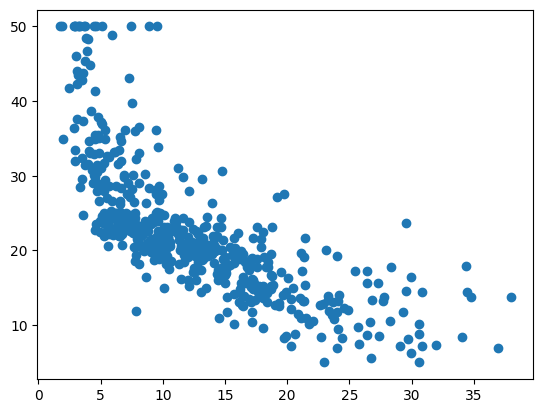

In [34]:
import matplotlib.pyplot as plt
import torch
%matplotlib inline

import pandas as pd
import numpy as np

data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

boston = data
plt.scatter(boston[:, -1], target)


In [35]:
w = torch.zeros(1, requires_grad=True)
b = torch.zeros(1, requires_grad=True)

x = torch.tensor(boston[:, -1] / 10, dtype=torch.float32)
y = torch.tensor(target, dtype=torch.float32)


In [36]:
y_pred = w * x + b
loss = torch.mean((y_pred - y)**2)

# propagete gradients
loss.backward()


In [37]:
print("dL/dw = \n", w.grad)
print("dL/db = \n", b.grad)


dL/dw = 
 tensor([-47.3514])
dL/db = 
 tensor([-45.0656])


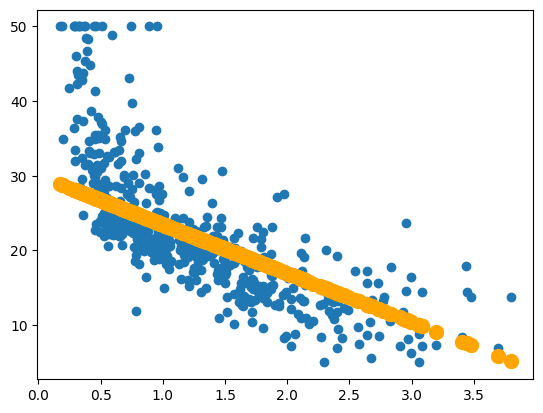

loss =  43.613953


In [39]:
from IPython.display import clear_output
for i in range(100):

    y_pred = w * x + b

    # Вычисляем функцию ошибок
    loss = torch.mean((y_pred - y)**2)

    # Вычисляем градиенты
    loss.backward()


    # Делаем шаг градиентного спуска по матрице весов
    w.data -= 0.05*w.grad.data
    b.data -= 0.05*b.grad.data

    # обнуляем градиенты
    w.grad.data.zero_()
    b.grad.data.zero_()



    # the rest of code is just bells and whistles
    if (i+1) % 5 == 0:
        clear_output(True)
        plt.scatter(x.data.numpy(), y.data.numpy())
        plt.scatter(x.data.numpy(), y_pred.data.numpy(),
                    color='orange', linewidth=5)
        plt.show()

        print("loss = ", loss.data.numpy())
        if loss.data.numpy() < 0.5:
            print("Done!")
            break


Посмотрим градиенты на примере двухслойной сети

In [40]:
dtype = torch.float
device = "mps" if torch.backends.mps.is_available() else "cpu"
# device = torch.device("cuda:0") # Раскомментируйте это, чтобы запустить на GPU

# N - размер батча; D_in - входной размер;
# H - размер скрытого слоя; D_out - размер вывода.
N, D_in, H, D_out = 64, 3, 3, 10
N, D_in, H, D_out = 64, 3, 3, 10

# Создание случайных тензоров для хранения входных и выходных данных.
# Настройка requires_grad = False указывает, что нам не нужно вычислять градиенты
# по отношению к этим тензорам во время обратного прохода.
x = torch.randn(N, D_in, device=device, dtype=dtype)
y = torch.randn(N, D_out, device=device, dtype=dtype)

# Создаем тензоры случайных весов.
# Настройка requires_grad = True указывает, что мы хотим вычислять градиенты с
# уважение к этим тензорам во время обратного прохода.

# Create random Tensors for weights.
# Установка requires_grad = True указывает, что мы хотим вычислить градиенты
# относительно этих тензоров во время обратного прохода.
w1 = torch.randn(D_in, H, device=device, dtype=dtype, requires_grad=True)
w2 = torch.randn(H, D_out, device=device, dtype=dtype, requires_grad=True)


In [41]:
y_pred = (x @ w1).clamp(min=0).matmul(w2)
loss = (y_pred - y).pow(2).sum()

# вычисляем градиенты
loss.backward()


In [42]:
print((y_pred - y).pow(2).sum())


tensor(14405.8105, device='mps:0', grad_fn=<SumBackward0>)


In [43]:
w1.grad, w2.grad


(tensor([[ 1690.5643,   382.2563,  2534.3645],
         [-1178.4817,   -22.8088,  -643.9829],
         [ 5562.7891,  -515.0068,  4932.5879]], device='mps:0'),
 tensor([[-474.1304,  778.1805, 1247.1003,  142.8917,  166.1959, -116.5309,
          1240.6923,  447.0508, 1167.4924,  778.2817],
         [ -34.6619,   28.4288,   83.0194,  115.7327,    8.2941,   -5.8133,
            24.1097,  -41.6137,   36.2486,   46.1566],
         [-795.8123, 1586.1433, 2261.7109,  232.2382,  348.5489, -137.4337,
          2103.7349,  717.5115, 1960.6476, 1437.4436]], device='mps:0'))

In [44]:
loss.grad # нет доступа к нелистовым градиентам в дереве AD


/var/folders/l9/88y_46d53y3cy1jh1h6qdg0c0000gn/T/ipykernel_39183/821173111.py:1: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/build/aten/src/ATen/core/TensorBody.h:494.)
  loss.grad # нет доступа к нелистовым градиентам в дереве AD


In [45]:
# заставляем переменную запоминать градиенты фнукции потерь
y_pred = (x @ w1).clamp(min=0).matmul(w2)
y_pred.retain_grad()

loss = (y_pred - y).pow(2).sum()
loss.retain_grad()

loss.backward()


In [46]:
loss.grad


tensor(1., device='mps:0')

In [47]:
x.grad # не требует градиента


In [48]:
y.grad # не требует градиента


**Замечание:** Градиенты помещаются в поле `.grad` тензоров, на которых они вычисляются.

In [49]:
w1


tensor([[-0.5777,  0.2369,  1.6603],
        [-0.8420, -0.1899, -0.2011],
        [ 1.8867, -0.6893,  2.5005]], device='mps:0', requires_grad=True)

In [50]:
with torch.no_grad():

    pass


## Дополнительные материалы

*1). Official PyTorch tutorials: https://pytorch.org/tutorials/beginner/blitz/tensor_tutorial.html#sphx-glr-beginner-blitz-tensor-tutorial-py*

*2). arXiv article about the deep learning frameworks comparison: https://arxiv.org/pdf/1511.06435.pdf*

*3). Useful repo with different tutorials: https://github.com/yunjey/pytorch-tutorial*

*4). Facebook AI Research (main contributor of PyTorch) website: https://facebook.ai/developers/tools*

# Обучение нейронной сети с использованием PyTorch

В этом блокноте мы создадим и обучим простую нейронную сеть с помощью PyTorch. Наша цель - показать основы фреймворка Torch и достичь простого понимания того, как выглядит решение разных задач с помощью нейронных сетей.

In [51]:
import torch
from torchsummary import summary


In [53]:
# Определяем на чем у нас будут производиться вычисления (cuda/cpu)
device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
device


device(type='mps')



## Подготовка датасета

Здесь мы узнаем некоторые базовые функции и классы подготовки данных из **PyTorch** как:

- `torch.utils.data.Dataset` and `torch.utils.data.DataLoader`
- dataset downloading api

Для начала мы определим нашу проблему. Здесь мы загружаем набор данных MNIST (с PyTorch API)

MNIST:
- 28x28 изображений из `0`, `1`, .. `9`
- каждый пиксель серый (float value in [0, 1))
- targets это целое значение в диапазоне [0, 9] (10 классов)
- объекты ($x_i$, $y_i$), где $x_i$ размера (1, 28, 28), $y_i$ это значение int

Для наших целей мы вытяним входные данные ($ x $), чтобы наши данные во время обучения имели формы:

- `x_batch` размера `(batch_size, 784)`
- `y_batch` размера `(batch_size)`



In [54]:
from torchvision.datasets import MNIST
import torchvision.transforms as tfs


In [55]:
data_tfs = tfs.Compose([
  tfs.ToTensor(),
  tfs.Normalize((0.5), (0.5))
])


In [56]:
# install for train and test
root = './'
train = MNIST(root, train=True,  transform=data_tfs, download=True)
test  = MNIST(root, train=False, transform=data_tfs, download=True)


In [57]:
print(f'Data size:\n\t train {len(train)},\n\t test {len(test)}')
print(f'Data shape:\n\t features {train[0][0].shape},\n\t target {type(test[0][1])}')


Data size:
	 train 60000,
	 test 10000
Data shape:
	 features torch.Size([1, 28, 28]),
	 target <class 'int'>


Заметьте! Нам не нужно реализовывать batch loader самостоятельно. Давайте воспользуемся его реализацией в torch, которая называется `DataLoader` из `torch.utils.data`.

In [58]:
from torch.utils.data import DataLoader

batch_size = 128

train_loader = DataLoader(train, batch_size=batch_size, drop_last=True)
test_loader = DataLoader(test, batch_size=batch_size, drop_last=True)


In [59]:
x_batch, y_batch = next(iter(train_loader))
x_batch.shape, y_batch.shape


(torch.Size([128, 1, 28, 28]), torch.Size([128]))

Наконец, мы подготовили наши данные, поэтому теперь мы создадим некоторую модель для классификации изображений!

## Модель и обучение (of abnormal people)


Теперь посмотрим, как **torch** вычисляет функции градиента во время вычисления выражения. Используя метод `.backward ()` для выражени, **мы передаем граф вычисления градиента до листьев**, которые являются надежными для параметров нашей модели.

Таким образом, мы используем эти знания, чтобы найти оптимальные веса некоторой модели, которая представлена ​​некоторым выражением.

Предположем,
1. Мы хотим обучить линейную модель.
2. Для каждого класса мы используем собственные веса для вычисления `logits` (логитов).
3. Мы используем `softmax` на логитах для вероятностей каждого класса.
4. Обучайте партии с помощью `sgd`.

In [60]:
features = 784
classes = 10


In [61]:
W = torch.FloatTensor(features, classes).uniform_(-1, 1) / features**0.5
W.requires_grad_()


tensor([[ 0.0070,  0.0324,  0.0062,  ..., -0.0040, -0.0142, -0.0269],
        [ 0.0279,  0.0011,  0.0290,  ...,  0.0062,  0.0273,  0.0346],
        [ 0.0230, -0.0347,  0.0228,  ..., -0.0128,  0.0087,  0.0336],
        ...,
        [-0.0034, -0.0319, -0.0051,  ..., -0.0137,  0.0225,  0.0116],
        [-0.0002,  0.0340, -0.0017,  ...,  0.0338,  0.0023,  0.0037],
        [-0.0017,  0.0181, -0.0176,  ...,  0.0287, -0.0294,  0.0152]],
       requires_grad=True)

SGD цикл обучения

In [62]:
epochs = 3
lr=1e-2
history = []


In [63]:
import numpy as np
from torch.nn.functional import cross_entropy

#КРОСС-ЭНТРОПИЯ ЗДЕСЬ БЕРЁТСЯ ОТ ЛОГИТОВ, А НЕ ОТ ВЕРОЯТНОСТЕЙ!


In [64]:
for i in range(epochs):
  for x_batch, y_batch in train_loader:

    # загружаем батч данных (вытянутый в линию)
    x_batch = x_batch.reshape(x_batch.shape[0], -1)

    # вычисляем функцию потерь (log loss, также известная как кросс-энтропия)
    logits = x_batch @ W
    probabilities = torch.exp(logits) / torch.exp(logits).sum(dim=1, keepdims=True)

    loss = -torch.log(probabilities[range(batch_size), y_batch]).mean()
    history.append(loss.item())

    # вычисляем градиенты
    loss.backward()

    # делаем шаг градиентного спуска
    grad = W.grad
    with torch.no_grad():
      W -= lr * grad
    W.grad.zero_()

  print(f'{i+1},\t loss: {history[-1]}')


1,	 loss: 0.1995822936296463
2,	 loss: 0.1421249657869339
3,	 loss: 0.1212976723909378


И, конечно же, мы может построить график для loss (функции потерь) во время обучения.

In [65]:
import matplotlib.pyplot as plt


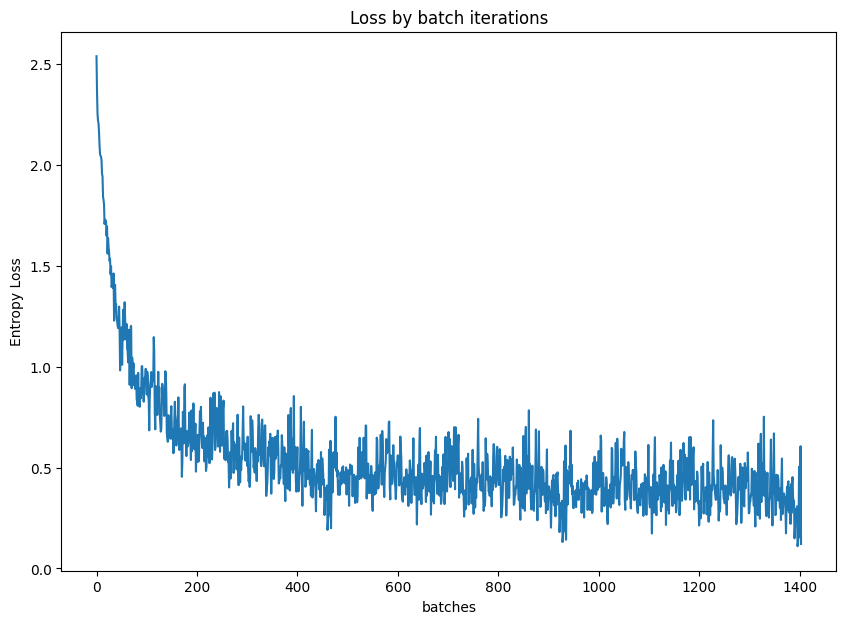

In [66]:
plt.figure(figsize=(10, 7))

plt.plot(history)

plt.title('Loss by batch iterations')
plt.ylabel('Entropy Loss')
plt.xlabel('batches')

plt.show()


Посмотрим некоторые показатели качества для нашей линейной модели

In [67]:
from sklearn.metrics import accuracy_score


In [68]:
acc = 0
batches = 0

for x_batch, y_batch in test_loader:
  # загружаем батч данных (вытянутый в линию)
  batches += 1
  x_batch = x_batch.view(x_batch.shape[0], -1)
  y_batch = y_batch

  preds = torch.argmax(x_batch @ W, dim=1)
  acc += (preds==y_batch).cpu().numpy().mean()

print(f'Test accuracy {acc / batches:.3}')


Test accuracy 0.9


В результате теперь мы видим, что каждая переменная или тензор имеет свои собственные `grad` и `grad_fn`. Эта часть показала, что мы можем напрямую манипулировать ими. Также это очень неудобно, но иногда мы можем получить доступ к такой гибкости.

Конечно, PyTorch имеет более высокоуровневый способ работы с весами и градиентами, чем мы рассмотрели выше. В следующей части мы познакомимся с более высоким уровнем построения и обучения нейронных сетей. 


## Модель

PyTorch - это гибкий фреймворк для построения любой нейронной сети.

Вот таблица сравнения:

```
| API             | Flexibility | Convenience |,
|-----------------|-------------|-------------|,
| Barebone        | High        | Low         |,
| `nn.Module`     | High        | Medium      |,
| `nn.Sequential` | Low         | High        |
```

1. barebone - это подход, при котором мы напрямую манипулируем тернсорами. В приведенном выше примере у нас была целевая функция, напрямую выраженная весами. Если мы реализумем этот метод с использованием классов, мы получим API такого уровня: **На этом уровне мы сами кодируем модули**

2. [`nn.Module`] (https://pytorch.org/docs/stable/nn.html) - родительский класс для многих модулей, представленных PyTorch. Их много. Их достаточно, чтобы использовать их в готовом виде с необходимыми параметрами. В основном мы используем:

- `nn.Linear`
- `nn.Softmax`, `nn.LogSoftmax`
- `nn.ReLU`, `nn.ELU`, `nn.LeakyReLU`
- `nn.Tanh`, `nn.Sigmoid`
- `nn.LSTM`, `nn.GRU`
- `nn.Conv1d`, `nn.Conv2d`
- `nn.MaxPool1d`, `nn.AdaptiveMaxPool1d` and others pooling
- `nn.BatchNorm1d`, `nn.BatchNorm2d`
- `nn.Dropout`
- losses: `nn.CrossEntropyLoss`, `nn.NLLLoss`, `nn.MSELoss`
- etc


3. `nn.Sequential` - это не более чем последовательность различных модулей на основе` nn.Module`. Они инициируются списком модулей, где выходные данные одного модуля идут в качестве входных данных для следующего по порядку.


Давайте **разработаем простую последовательность** для классификацию MNIST с использованием **модели** двух линейных слоев и `nn.Sequential`.


In [69]:
import torch.nn as nn
from torchsummary import summary


In [72]:
model = nn.Sequential(
  nn.Linear(features, 64),
  nn.ReLU(),
  nn.Linear(64, classes)

  #НЕ НУЖЕН СОФТМАКС
)

# It is the same as:
#
# model = nn.Sequential()
# model.add_module('0', nn.Linear(features, 64))
# model.add_module('1', nn.Linear(64, classes))

model


Sequential(
  (0): Linear(in_features=784, out_features=64, bias=True)
  (1): ReLU()
  (2): Linear(in_features=64, out_features=10, bias=True)
)

Проверить, все ли в порядке со скрытыми слоями, можно с помощью `torchsummary.summary`. Форма входных данных необходима для визуализации модели.

In [73]:
summary(model, (features,), batch_size=228)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [228, 64]          50,240
              ReLU-2                  [228, 64]               0
            Linear-3                  [228, 10]             650
Total params: 50,890
Trainable params: 50,890
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.68
Forward/backward pass size (MB): 0.24
Params size (MB): 0.19
Estimated Total Size (MB): 1.12
----------------------------------------------------------------


## Обучение

Как известно, при решении проблемы важны следующие **3 вещи**:

1. Модель
2. Цель (функция потерь / loss)
3. Оптимизация (для параметров модели)

Хорошо, все, что мы должны делать при использовании PyTorch, - это** определить следующие 3 вещи**:

1. Модель: из API `nn.Module`
2. Функция потерь (loss): опять же, `nn.Module` или [` nn.functional`] (https://pytorch.org/docs/stable/nn.functional.html) API.
3. Оптимизатор: основан на [`torch.optim.Optimizer`] (https://pytorch.org/docs/stable/optim.html).



В предыдущих задачах, когда дело доходило до оптимизации параметров, мы использовали **явное решения или градиентный спуск**

Конечно, есть множество улучшений градиентного спуска. Он может использовать **адаптивное значение шага**, **градиенты предыдущего шага** и другие. PyTorch также предоставляет несколько классов для оптимизации градиента. Они инициализируются с параметрами, которые они должны настроить для лучшего значения потерь, и во время спуска они делают шаг в методе спуска на основе градиента.

Вот наиболее часто используемые оптимизаторы, на основе которых используется алгоритм спуска:

- `torch.optim.Adam` использует как второй, так и первый импульс градиента, очень популярный благодаря своей скорости сходимости и простоте. [бумага] (https://arxiv.org/abs/1412.6980)

- `torch.optim.SGD` - старый добрый стохастический градиентный спуск. Может использоваться с оптимизацией импульса Нестерова

- `torch.optim.Adagrad` - [статья] (https://jmlr.org/papers/v12/duchi11a.html)

- `torch.optim.RMSprop` - введено в [слайды] (https://www.cs.toronto.edu/~tijmen/csc321/slides/lecture_slides_lec6.pdf)


Сначала определим последние 2 вещи: критерий и оптимизатор.

In [74]:
criterion = nn.CrossEntropyLoss()      # (logsoftmax + negative likelihood) в своей основе применительно к логитам (logits)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, betas=(0.9, 0.99))


Наконец, мы переходим в **циклу обучения**!

Ранее мы итерировались по эпохам и батчам (batch) (это называется обучающим циклом). Итак, давайте повторим это здесь

In [75]:
epochs = 3
history = []


In [77]:
for i in range(epochs):
  for x_batch, y_batch in train_loader:
    # 1. # загружаем батч данных (вытянутый в линию)
    x_batch = x_batch.view(x_batch.shape[0], -1)
    y_batch = y_batch

    # 2. вычисляем скор с помощью прямого распространения ( .forward or .__call__ )
    logits = model(x_batch)

    # 3. вычислеяем - функцию потерь (loss)
    loss = criterion(logits, y_batch)
    history.append(loss.item())

    # 4. вычисляем градиенты
    optimizer.zero_grad()
    loss.backward()

    # 5. шаг градиентного спуска
    optimizer.step()

  print(f'{i+1},\t loss: {history[-1]}')


1,	 loss: 0.10284518450498581
2,	 loss: 0.051007792353630066
3,	 loss: 0.03942343220114708


построим график изменения точности просто для проверки правильности.

In [78]:
import matplotlib.pyplot as plt


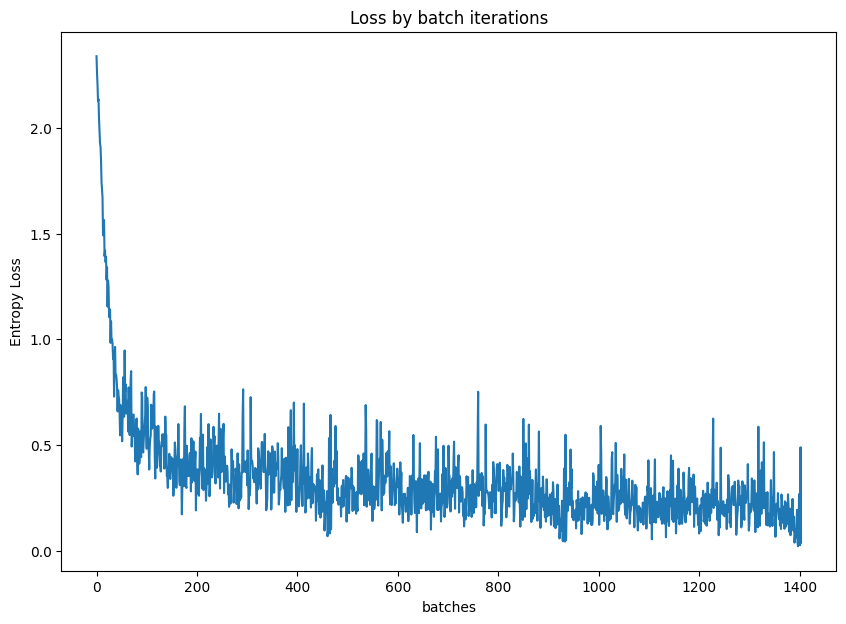

In [79]:
plt.figure(figsize=(10, 7))

plt.plot(history)

plt.title('Loss by batch iterations')
plt.ylabel('Entropy Loss')
plt.xlabel('batches')

plt.show()


Некоторые метрики качества для нашей двух-слойной модели

In [80]:
from sklearn.metrics import accuracy_score


In [82]:
acc = 0
batches = 0

for x_batch, y_batch in test_loader:
  # загружаем батч данных (вытянутый в линию)
  batches += 1
  x_batch = x_batch.view(x_batch.shape[0], -1)
  y_batch = y_batch

  preds = torch.argmax(model(x_batch), dim=1)
  acc += (preds==y_batch).cpu().numpy().mean()

print(f'Test accuracy {acc / batches:.3}')


Test accuracy 0.941


## Резюмируем!

Мы построили и обучили простейшую нейронную сеть. Это было сделано путем определения:

1. `Модели`
2. "Критерия (Лосса)"
1. `Оптимизатора`

Запомните эти шаги, необходимые во время обучения одного батча данных:

1. загрузить батч
2. выполнить прямой проход модели (получить «логиты» / выходы модели)
3. рассчитать `loss` (используя критерий и «логиты» и истинные метки партии)
4. выполнить `loss.backward ()` (вычислить градиенты функции потери относительно параметров модели)
5. выполнить шаг оптимизации (`optimizer.step ()`)
* обнуляйте градиенты (производите в любой момент, но не между шагами 4 и 5)
* проверка (валидация) (после каждой эпохи)



# Лекция 5. Сверточные нейронные сети
## Сверточные нейросети
### Датасет MNIST
![mnist](mnist.png)

Задача классификации на 10 классов черно-белых изображений размера 32*32

Черно-белая картинка представляется матрицей чисел из отрезка [0,255] размера 32*32

![mnist_1](mnist_1.png)

Растягивание картинки в вектор и подача на вход сети

![mnist_2](mnist_2.png)

Классификация картинок полносвязной сетью:

Недостатки:
- Слишком много нейронов в 1 слое сети
- Ломаются пространственные отношения на картинке, которые могли бы помочь в задаче классификации

Что отличает четверку от восьмерки?

![4_8](4_8.png)

У четверки преимущественно горизонтальные и вертикальные линии, у восьмерки линии плавные
### Свертка
![convolution](convolution.png)
![convolution_1](convolution_1.png)
![convolution_2](convolution_2.png)
![convolution_3](convolution_3.png)
![convolution_4](convolution_4.png)
![convolution_5](convolution_5.png)
### Padding
Используется для манипуляции размерами карт активаций

![padding](padding.png)
![padding_1](padding_1.png)
### Свертка цветных изображений
Цветное(RGB) изображение трехмерное (h * w * 3)

![rgb](rgb.png)

Фильтры "реагируют" на паттерны на изображении. Если паттерн присутствует на изображении, то карта активации после соотв. фильтра будет содержать большие числа

![convolution_6](convolution_6.png)

Как мог бы выглядеть фильтр, реагирующий на горизонтальные линии

![convolution_7](convolution_7.png)

Как мог бы выглядеть фильтр, реагирующий на вертикальные линии

![convolution_8](convolution_8.png)

После получения карт активаций, мы _**развернем все карты в векторы, сконкатенируем**_ и подадим на вход полносвязной сети

![convolution_9.png](convolution_9.png)
### Сверточная нейросеть
![convolutional_neural_network](convolutional_neural_network.png)

Для real-world изображений одной операции свертки не хватит, чтобы выделить всю нужную информацию из изображения. Потребуется несколько слоев сверток.

![convolutional_neural_network_1](convolutional_neural_network_1.png)
![convolutional_neural_network_2](convolutional_neural_network_2.png)

После сверточных слоев, как и после полносвязных, используется функция активации.

Самая популярная и хорошо работающая функция активации промежуточных слоев - relu

![convolutional_neural_network_3](convolutional_neural_network_3.png)
![convolutional_neural_network_4](convolutional_neural_network_4.png)

Свертки - как лампочки, которые "загораются" сильнее, если на изображении есть определенный паттерн.

На картах активации мы НЕ найдем никакого "понятного" рисунка: они есть индикаторы наличия некоего паттерна на картинке.
### Обучение нейросети
Нейросеть сама учится понимать, какие паттерны на изображении ей важно уметь находить.

![neural_network_learn](neural_network_learn.png)
## Pooling
Техника уменьшения размерности(downsampling'а) карт активаций.

Используется для:
- Уменьшения размерности очень больших изображений
- Уменьшения чувствительности сверток к положению объектов на картинке

![pooling](pooling.png)
![pooling_1](pooling_1.png)

Результат применения 2*2 MaxPooling'а к картам активаций:

![pooling_2](pooling_2.png)
### Pooling layer
![pooling_layer](pooling_layer.png)

Image -> conv -> act -> pool -> conv...
### AlexNet
![alexnet](alexnet.png)
## Задачи компьютерного зрения(CV)
### Классификация, детекция, сегментация
![cv](cv.png)

Сегментация - важная задача для медицины.

![cv_1](cv_1.png)

И все эти задачи очень важны для беспилотных автомобилей.
- детекция
- классификация
- сегментация
- поиск по изображениям
- оценка положения

![cv_2](cv_2.png)
### Optical Character Recognition
- автоматический перевод
- улучшение качества фотографий документов
- скан чеков/визиток/etc

![cv_3](cv_3.png)
### Video Understanding
- image/video description
- subtitles to video
- action description
- pose estimation

![cv_4](cv_4.png)
### GANs (о них на последнем занятии)
Style transfer:

![cv_5](cv_5.png)

Image generation/completion:

![cv_6](cv_6.png)

# Семинар 5. Модули в PyTorch и CNN.

---

<h3 style="text-align: center;"><b>Convolution and pooling operations</b></h3>

---

### Convolution (свёртка)

На этом семинаре мы посмотрим, как свёртки влияют на изображение и попрактикуемся в вычислении свёрток и пулингов от различных изображений.

Для начала напомним, что такое свёртка:

<img src="https://neurohive.io/wp-content/uploads/2018/07/convolutional-neural-network.gif" width=450 height=400>

То есть мы берём фильтр размера FxF, умножаем его на область изображения размером FxF поэлементно, складываем получившиеся поэлемнетные произведения и записываем это число в результирующий тензор.

За исключением архитектур типа MobileNet, третья размерность фильтра всегда свопадает с третьей размерностью входного тензора. Если картинка размера HxWx3, то фильтр будет иметь размер FxFx3, и поэлементное произведение будет производиться по всему объёму.

Напомним два важных параметра операции свертки:

stride -- это размер шага окна свёртка по осям x и y (обычно совпадают, но вполне могут быть и разными).

$padding$ -- это окружение картинки по краям нулями (или чем-то другим) для того, чтобы придать изображению после свёртки нужный размер (пэддинг делается до свёртки).

---

Посмотрим на то, как применение свёртки с определёнными фильтрами влияет на изображение. На этот счёт есть хорошая статья на Хабрахабре:  

https://habr.com/post/142818/ 

Возьмём код из статьи и посмотрим, как будет меняться картинка в зависимости от фильтра:

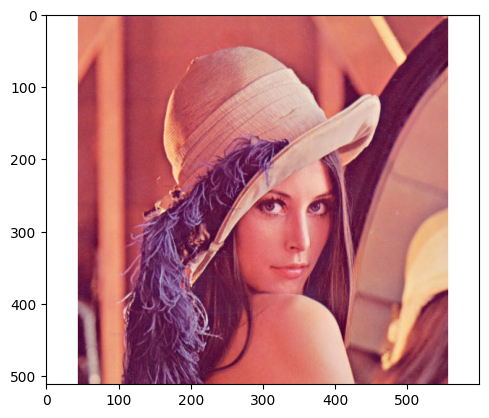

In [91]:
from PIL import Image
from math import ceil, sqrt
from math import floor

import matplotlib.pyplot as plt

#https://habrahabr.ru/post/142818/
def checkByte(a):
    if a > 255:
        a = 255
    if a < 0:
        a = 0
    return a


def conv(a, b):
    sum = 0
    for i in range(len(a)):
        for j in range(len(a[0])):
            sum += a[i][j] * b[i][j]
    return sum


def median(a):
    c = []
    for i in range(len(a)):
        for j in range(len(a[0])):
            c.append(a[i][j])
    c.sort()
    return c[ceil(len(c)/2)]


def max(a):
    c = []
    for i in range(len(a)):
        for j in range(len(a[0])):
            c.append(a[i][j])
    c.sort()
    return c[len(c)-1]


def min(a):
    c = []
    for i in range(len(a)):
        for j in range(len(a[0])):
            c.append(a[i][j])
    c.sort()
    return c[0]

im = Image.open('/Users/dadaya/Desktop/progs/DLS/lenna.jpg')
pixels = im.load()

plt.imshow(im);


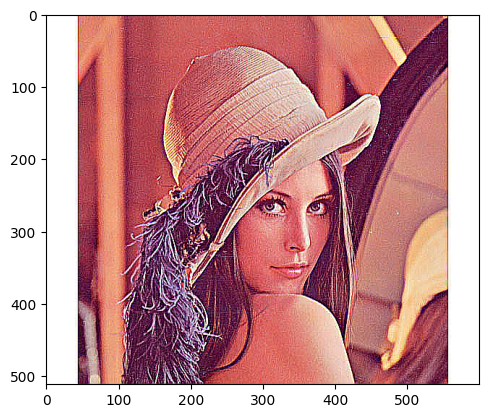

In [97]:
imFinal = im.copy()
pixels2 = imFinal.load()
# filter = [
#     [-1, -1, 0, 0, 0],
#     [0, -1, -1, -1, 0],
#     [0, -1, 9, -1, 0],
#     [0, -1, -1, -1, 0],
#     [0, 0, 0, 0, 0]
# ]

# filter = [
#     [-1, -1, -1, -1, -1],
#     [-1, -1, -1, -1, -1],
#     [-1, -1, 4, -1, -1],
#     [-1, -1, -1, -1, -1],
#     [-1, -1, -1, -1, -1]
# ]


# filter = [
#     [0, 0, 0, 1, 0, 0, 0],
#     [0, 0, 1, 1, 1, 0, 0],
#     [0, 1, 1, 1, 1, 1, 0],
#     [1, 1, 1, 1, 1, 1, 1],
#     [0, 1, 1, 1, 1, 1, 0],
#     [0, 0, 1, 1, 1, 0, 0],
#     [0, 0, 0, 1, 0, 0, 0]
# ]



filter = [
    [-1, -1, -1],
    [-1, 9, -1],
    [-1, -1, -1]
]



# filter = [
#     [0.5, 1.5, 2, 1.5, 0.5],
#     [1.5, 3.5, 5, 3.5, 1.5],
#     [  2,   5, 10,  5,   2],
#     [1.5, 3.5, 5, 3.5, 1.5],
#     [0.5, 1.5, 2, 1.5, 0.5]
# ]


div = 0
for i in range(len(filter)):
    for j in range(len(filter[0])):
        div += filter[i][j]
if div == 0:
    div = 1

for i in range(floor(len(filter)/2), im.width - floor(len(filter)/2)):
    for j in range(floor(len(filter)/2), im.height - floor(len(filter)/2)):
        matrR = []
        matrG = []
        matrB = []
        for n in range(-floor(len(filter)/2), ceil(len(filter)/2)):
            rowR = []
            rowG = []
            rowB = []
            for m in range(-floor(len(filter)/2), ceil(len(filter)/2)):
                r, g, b = pixels[i + n, j + m]
                rowR.append(r)
                rowG.append(g)
                rowB.append(b)
            matrR.append(rowR)
            matrG.append(rowG)
            matrB.append(rowB)

        r = checkByte(round(conv(matrR, filter) / div))
        g = checkByte(round(conv(matrG, filter) / div))
        b = checkByte(round(conv(matrB, filter) / div))

       # r = checkByte(min(matrR))
       # g = checkByte(min(matrG))
       # b = checkByte(min(matrB))
        '''
        if r < 512:
            pixels2[i, j] = (255, 255, 255)
        else:
            pixels2[i, j] = (0, 0, 0)'''
        pixels2[i, j] = (r, g, b)

plt.imshow(imFinal);


Попробуйте поменять фильтр и посмотреть, что будет.

---

Давайте немного потренируемся в вычислении размера результата применения свёртки к картинке:

### Задача 1

Вычислить размер результата после применения свёртки, $I$ -- размеры входного изображения, $f$ -- размеры фильтра:

1. Пример: $I$ = (50, 50, 3), $f$ = (3, 3), $stride$ = 1. Вычисляем:
* по ширине: 50 - 3 + 1 = 48,  
* по высоте: 50 - 3 + 1 = 48,   
то есть размер результата будет (48, 48)

2. $I$ = (1024, 768, 3), $f$=(5,5), $stride$ = 2. Вычисляем:


<img src="https://drive.google.com/uc?export=view&id=11bA8ib_n9fRiNyu671VO20YdcMJ_oXX5" width=500/>

Из рисунка видно, что выходная ширина равна количеству нечентых чисел от 1 до 1020, т. е. 510

Аналогично по высоте получаем 382, то есть размер результата будет (510, 382).



3. $I$ = (500, 700, 5), $f$=(7,4), $stride$ = 2

Выведите общую формулу для $I$ = (H, W, C), $f$=(F, F) (фильтры обычно всё же квадратные)

$I = (\frac{H - F + 1}{stride}; \frac{W - F + 1}{stride})$

Теперь добавьте в получившуюся формулу $padding = p$:

$I = (\frac{H - F + 1}{stride} + 1; \frac{W - F + 1}{stride} + 1)$

**Вопросы для самоконтроля:**
Что такое свёртка?
Фильтр?
Stride?
Padding?

### Pooling

Pooling (пулинг) -- операция, нужная для уменьшения размерности по ширине и по высоте. Можно брать очень много операций в качестве пулинга, например, минимум из элементов, максимум, среднее, сумму и т.д.

Обычно используется max- и avg-pooling.

Пример применения max-pooling'а:

<img src="https://i.stack.imgur.com/W9a9n.jpg">

*https://i.stack.imgur.com/W9a9n.jpg*

Примеры применения max и avg pooling'ов:


<img src="https://www.researchgate.net/profile/Zenghui_Wang2/publication/317496930/figure/fig1/AS:551445004066816@1508486142257/Average-versus-max-pooling.png">

*https://www.researchgate.net/profile/Zenghui_Wang2/publication/317496930/figure/fig1/AS:551445004066816@1508486142257/Average-versus-max-pooling.png*

Если на вход подаётся изображение с несколькими каналами, то пулинг берётся по каналам, то есть если это цветная картинка HxWxC, и мы применяем к ней pooling 2x2, то получим на выходе (H // 2) x (W // 2) x C

Эта операция весьма простая, но лучше разобрать несколько примеров (см. на доску).

<h3 style="text-align: center;"><b>Полезные ссылки</b></h3>

1). *Примеры написания нейросетей на PyTorch (офийиальные туториалы) (на английском): https://pytorch.org/tutorials/beginner/pytorch_with_examples.html#examples  
https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html*

2). ***Один из самых подробных и полных курсов по deep learning на данный момент - это курс Стэнфордского Университета:  http://cs231n.github.io/***  

3). Практически исчерпывающая информация по основам свёрточных нейросетей (из cs231n) (на английском):  

http://cs231n.github.io/convolutional-networks/  
http://cs231n.github.io/understanding-cnn/  
http://cs231n.github.io/transfer-learning/

4). Видео о Computer Vision от Andrej Karpathy: https://www.youtube.com/watch?v=u6aEYuemt0M

## Создание модулей

In [98]:
import torch
from torch import nn
import torch.nn.functional as F
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt


Сгенерируем датасет Игрушка Дьявола

In [107]:
# код для генерации взят из Стэнфордсокго курса:
# http://cs231n.github.io/neural-networks-case-study/#linear

N = 100
D = 2
K = 3
X = np.zeros((N * K, D))
y = np.zeros(N * K, dtype='uint8')

for j in range(K):
    ix = range(N * j,N * (j + 1))
    r = np.linspace(0.0, 1, N)
    t = np.linspace(j * 4, (j + 1) * 4,N) + np.random.randn(N) * 0.2 # theta
    X[ix] = np.c_[r * np.sin(t), r * np.cos(t)]
    y[ix] = j


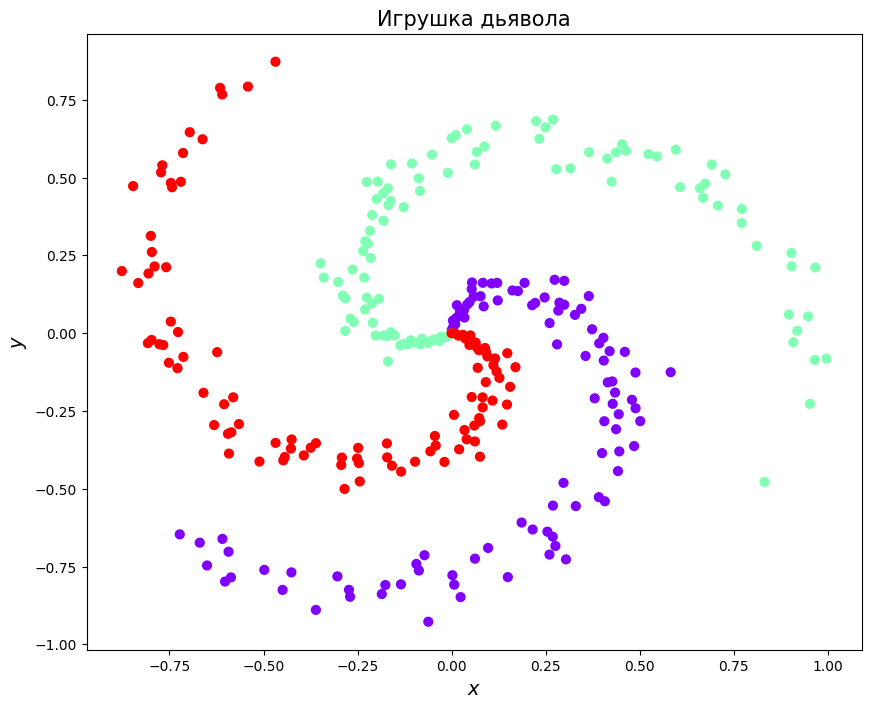

In [108]:
# Отрисовочная магия, снова взято из:
# http://cs231n.github.io/neural-networks-case-study/#linear

plt.figure(figsize=(10, 8))

plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.rainbow)

plt.title('Игрушка дьявола', fontsize=15)
plt.xlabel('$x$', fontsize=14)
plt.ylabel('$y$', fontsize=14)
plt.show();


In [109]:
X = torch.FloatTensor(X)
y = torch.LongTensor(y)


Сейчас мы хотим научиться самостоятельно создавать наследников nn.Module. До этого мы делали нейросети с помощью класса nn.Sequential, попробуем построить такую же сеть, как на прошлом семинаре, но самостоятельно.

In [110]:
# СЕТЬ С ПРОШЛОГО СЕМИНАРА

# D_in - размерность входа (количество признаков у объекта);
# H - размерность скрытых слоёв;
# D_out - размерность выходного слоя (суть - количество классов)
D_in, H, D_out = 2, 100, 3

# Use the nn package to define our model and loss function.
two_layer_net = torch.nn.Sequential(
    torch.nn.Linear(D_in, H),
    torch.nn.ReLU(),
    torch.nn.Linear(H, D_out),
    torch.nn.Softmax()
)


Что такое модуль и как он устроен? Во-первых, модуль это такой строительный блок для нейронок, с помощью модуля можно задать любую дифференциируемую по своему параметру функцию. Применяются модули так же, как и обычные функции с синтаксисом
> module_instance(var1, var2)

При этом внутри вызывается функция forward с теми же аргументами, а ее выход возвращается как результат вызова модуля. Зачем же нужно так странно оборачивать обычные функции в модули? 

* Это позволяет очень удобно следить за параметрами, которые надо изменять. Когда мы хоти получить все параметры можно просто рекурсивно пройтись по всем полям модели, посмотреть, какие из ни параметры сами по себе, а какие являются модулями и содрежат параметры внутри, а потом все это собрать. 

_По этой причине если вы используете внутри своего модуля какие-то еще модули их надо класть просто в поле класса, если это единичный модуль, и в класс **nn.ModuleList** или **nn.ModuleDict**, если у вас список или словарь используемых модулей. Если же в модели у вас есть како-то собственный вес, то недостаточно положить тензор в поле класса, его надо обернуть в **nn.Parameter, nn.ParameterList** или **nn.ParameterDict** в зависимотси от того, что именно у вас._

* Такая организация позволяет достаточно безболезненно расширять PyTorch и писать для него свои функции, которые нельзя выразить композицией уже существующих. Пригождается это редко, поэтому сегодня мы не будем писать свое расширение.

* Код, разделенный на модули, это просто красиво.

In [111]:
# НОВАЯ СЕТЬ

class MyModule(nn.Module):
    def __init__(self):
        super().__init__()
        self.f_lin = nn.Linear(D_in, H)
        self.s_lin = nn.Linear(H, D_out)

    def forward(self, X):
        X = F.relu(self.f_lin(X))
        return F.softmax(self.s_lin(X))

model = MyModule()
loss_fn = nn.CrossEntropyLoss()
optim = torch.optim.Adam(model.parameters(), 1e-1)


Поговорим немного подробнее о `softmax` и `CrossEntropyLoss`. 

Напоминание: softmax-функция выглядит следующим образом
$$Softmax(x) = \begin{pmatrix} 
\dfrac{e^{x_1}}{\sum\limits_{i=0}^{m} e^{x_i}},\; \dots,\; \dfrac{e^{x_m}}{\sum\limits_{i=0}^{m} e^{x_i}}
\end{pmatrix} $$

Таким образом, после применения softmax-функции мы получили вектор чисел из интервала $(0, 1)$, которые мы будем интерпретировать как вероятности классов.

Аналогично тому, как мы обощили сигмоиду на многоклассовый случай и получили softmax, можно обобщить и функцию потерь, получив _кросс-энтропию_:

$$CrossEntropy(x) = -\sum\limits_{i=0}^m y_i \cdot log(Softmax(x)_i), $$

где $y_i$ – истинная метка класса ($1$ если $x$ принадлежит $i$-ому классу и $0$ иначе)

/var/folders/l9/88y_46d53y3cy1jh1h6qdg0c0000gn/T/ipykernel_39183/2478491930.py:11: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(self.s_lin(X))


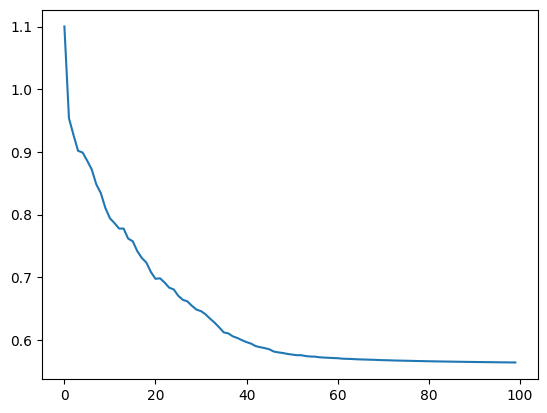

In [112]:
losses = []
for t in range(100):
    # forward
    y_pred = model(X)

    # loss
    loss = loss_fn(y_pred, y)
    losses.append(loss.item())

    optim.zero_grad()
    loss.backward()
    optim.step()

plt.plot(losses)


Теперь посмотрим, что будет, если не положить используемые внутри слои в self

In [113]:
# Сеть без параметров

class MyModule(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear_layers = [nn.Linear(D_in, H), nn.Linear(H, D_out)]
        self.my_useless_bias = torch.ones(1, H, requires_grad=True)
        self.more_of_my_useless_biases = [
            torch.ones(1, H, requires_grad=True),
            torch.ones(1, H, requires_grad=True),
            torch.ones(1, H, requires_grad=True)
        ]

    def forward(self, X):
        X = F.relu(self.linear_layers[0](X))
        X += self.my_useless_bias
        return F.softmax(self.linear_layers[1](X))

model = MyModule()
list(model.parameters())


[]

Как мы и ожидали параметров нет. Исправим это.

In [114]:
# Исправленная сеть с параметрами

class MyModule(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear_layers = nn.ModuleList([nn.Linear(D_in, H), nn.Linear(H, D_out)])
        self.my_useless_bias = nn.Parameter(torch.ones(1, H, requires_grad=True))
        self.more_of_my_useless_biases = nn.ParameterList([
            nn.Parameter(torch.ones(1, H, requires_grad=True)),
            nn.Parameter(torch.ones(1, H, requires_grad=True)),
            nn.Parameter(torch.ones(1, H, requires_grad=True))
        ])

    def forward(self, X):
        X = F.relu(self.linear_layers[0](X))
        X += self.my_useless_bias
        for b in self.more_of_my_useless_biases:
            X += b
        return F.softmax(self.linear_layers[1](X))

model = MyModule()
list(model.parameters())


[Parameter containing:
 tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
          1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]], requires_grad=True),
 Parameter containing:
 tensor([[-6.0701e-01, -6.2937e-01],
         [ 4.4915e-01,  6.9040e-01],
         [-6.0395e-01,  5.6286e-01],
         [-1.7918e-03,  3.2778e-01],
         [-1.8327e-01, -6.5782e-01],
         [ 3.5654e-01,  3.3159e-03],
         [ 3.1782e-01, -8.5908e-02],
         [ 4.9132e-01, -2.5752e-01],
         [-5.5840e-01,  6.0693e-01],
         [ 5.8791e-01,  2.3137e-01],
         [-5.9158e-01, -6.2741e-01],
         [ 3.5083e-01,  4.9570e-02],
         [ 6.1184e-01, -3.8

Как мы и хотели, все параметры появились

## Обучение нейронной сети.

---

В этом ноутбке мы научимся писать свои свёрточные нейросети на фреймворке PyTorch, и протестируем их работу на датасетах MNIST и CIFAR10. 

**ВНИМАНИЕ:** Рассматривается ***задача классификации изображений***.

(Подразумевается, что читатель уже знаком с многослойной нейроннной сетью).  

***Свёрточная нейросеть (Convolutional Neural Network, CNN)*** - это многослойная нейросеть, имеющая в своей архитектуре помимо *полносвязных слоёв* (а иногда их может и не быть) ещё и **свёрточные слои (Conv Layers)** и **pooling-слои (Pool Layers)**.  

Собственно, название такое эти сети получили потому, что в основе их работы лежит операция **свёртки**. 


Сразу же стоит сказать, что свёрточные нейросети **были придуманы прежде всего для задач, связанных с картинками**, следовательно, на вход они тоже "ожидают" картинку.

Расмотрим их устройство более подробно:

* Вот так выглядит неглубокая свёрточная нейросеть, имеющая такую архитектуру:  
`Input -> Conv 5x5 -> Pool 2x2 -> Conv 5x5 -> Pool 2x2 -> FC -> Output`

<img src="https://camo.githubusercontent.com/269e3903f62eb2c4d13ac4c9ab979510010f8968/68747470733a2f2f7261772e6769746875622e636f6d2f746176677265656e2f6c616e647573655f636c617373696669636174696f6e2f6d61737465722f66696c652f636e6e2e706e673f7261773d74727565" width=800, height=600>

Свёрточные нейросети (обыкновенные, есть и намного более продвинутые) почти всегда строятся по следующему правилу:  

`INPUT -> [[CONV -> RELU]*N -> POOL?]*M -> [FC -> RELU]*K -> FC`  

то есть:  

1). ***Входной слой*** (batch картинок `HxWxC`)  

2). $M$ блоков (M $\ge$ 0) из свёрток и pooling-ов, причём именно в том порядке, как в формуле выше. Все эти $M$ блоков вместе называют ***feature extractor*** свёрточной нейросети, потому что эта часть сети отвечает непосредственно за формирование новых, более сложных признаков, поверх тех, которые подаются (то есть, по аналогии с MLP, мы опять же переходим к новому признаковому пространству, однако здесь оно строится сложнее, чтем в обычных многослойных сетях, поскольку используется операция свёртки)  

3). $K$ штук FullyConnected-слоёв (с активациями). Эту часть из $K$ FC-слоёв называют ***classificator***, поскольку эти слои отвечают непосредственно за предсказание нужно класса (сейчас рассматривается задача классификации изображений).


<h3 style="text-align: center;"><b>Свёрточная нейросеть на PyTorch</b></h3>

Ешё раз напомним про основные компоненты нейросети:

- непосредственно, сама **архитектура** нейросети (сюда входят типы функций активации у каждого нейрона);
- начальная **инициализация** весов каждого слоя;
- метод **оптимизации** нейросети (сюда ещё входит метод изменения `learning_rate`);
- размер **батчей** (`batch_size`);
- количетсво итераций обучения (`num_epochs`);
- **функция потерь** (`loss`);  
- тип **регуляризации** нейросети (для каждого слоя можно свой);  

То, что связано с ***данными и задачей***:  
- само **качество** выборки (непротиворечивость, чистота, корректность постановки задачи);  
- **размер** выборки;  

Так как мы сейчас рассматриваем **архитектуру CNN**, то, помимо этих компонент, в свёрточной нейросети можно настроить следующие вещи:  

- (в каждом ConvLayer) **размер фильтров (окна свёртки)** (`kernel_size`)
- (в каждом ConvLayer) **количество фильтров** (`out_channels`)  
- (в каждом ConvLayer) размер **шага окна свёртки (stride)** (`stride`)  
- (в каждом ConvLayer) **тип padding'а** (`padding`)  


- (в каждом PoolLayer) **размер окна pooling'a** (`kernel_size`)  
- (в каждом PoolLayer) **шаг окна pooling'а** (`stride`)  
- (в каждом PoolLayer) **тип pooling'а** (`pool_type`)  
- (в каждом PoolLayer) **тип padding'а** (`padding`)

Какими их берут обычно -- будет показано в примере ниже. По крайней мере, можете стартовать с этих настроек, чтобы понять, какое качество "из коробки" будет у простой модели.

Посмотрим, как работает CNN на MNIST'е и на CIFAR'е.

In [27]:
import torch
import torchvision
from torchvision import transforms
from torchsummary import summary

import numpy as np
import matplotlib.pyplot as plt  # для отрисовки картиночек
%matplotlib inline

# Проверяем, доступны ли GPU
device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
device


device(type='mps')

<img src="http://present5.com/presentation/20143288_415358496/image-8.jpg" width=500, height=400>

**MNIST:** это набор из 70k картинок рукописных цифр от 0 до 9, написанных людьми, 60k из которых являются тренировочной выборкой (`train` dataset)), и ещё 10k выделены для тестирования модели (`test` dataset).

Скачаем и загрузим в `loader`'ы:

**Обратите внимание на аргумент `batch_size`:** именно он будет отвечать за размер батча, который будет подаваться при оптимизации нейросети

In [28]:
transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                      download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                     download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = tuple(str(i) for i in range(10))


Сами данные лежат в полях `trainloader.dataset.train_data` и `testloader.dataset.test_data`:

In [29]:
trainloader.dataset.train_data.shape


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")


torch.Size([60000, 28, 28])

In [30]:
testloader.dataset.test_data.shape


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/datasets/mnist.py:80: UserWarning: test_data has been renamed data
  warnings.warn("test_data has been renamed data")


torch.Size([10000, 28, 28])

Выведем первую картинку:

In [31]:
trainloader.dataset.train_data[0]


tensor([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,  18,
          18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   

Посмотрим, как она выглядит:

In [32]:
# преобразовать тензор в np.array
numpy_img = trainloader.dataset.train_data[0].numpy()


In [33]:
numpy_img.shape


(28, 28)

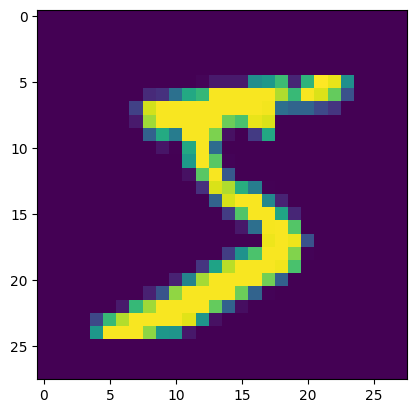

In [34]:
plt.imshow(numpy_img);


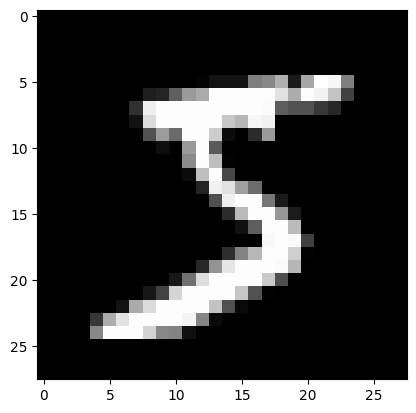

In [35]:
plt.imshow(numpy_img, cmap='gray');


Отрисовка заданной цифры:

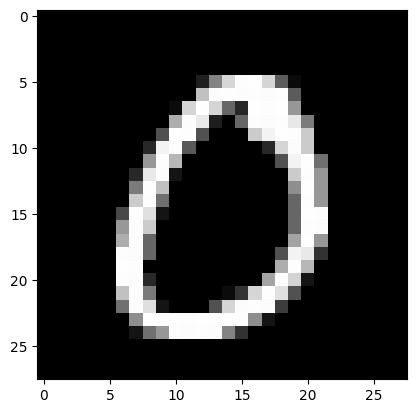

In [36]:
# случайный индекс от 0 до размера тренировочной выборки
i = np.random.randint(low=0, high=60000)

plt.imshow(trainloader.dataset.train_data[i].numpy(), cmap='gray');


Как итерироваться по данным с помощью `loader'`а? Очень просто:

In [37]:
for data in trainloader:
    print(data)
    break


[tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
   

То есть мы имеем дело с кусочками данных размера batch_size (в данном случае = 4), причём в каждом батче есть как объекты, так и ответы на них (то есть и $X$, и $y$).

Теперь вернёмся к тому, что в PyTorch есть две "парадигмы" построения нейросетей -- `Functional` и `Seuquential`. Со второй мы уже хорошенько разобрались в предыдущих ноутбуках по нейросетям, теперь мы испольузем именно `Functional` парадигму, потому что при построении свёрточных сетей это намного удобнее:

In [38]:
import torch.nn as nn
import torch.nn.functional as F  # Functional


In [39]:
# ЗАМЕТЬТЕ: КЛАСС НАСЛЕДУЕТСЯ ОТ nn.Module
class SimpleConvNet(nn.Module):
    def __init__(self):
        # вызов конструктора предка
        super(SimpleConvNet, self).__init__()
        # необходмо заранее знать, сколько каналов у картинки (сейчас = 1),
        # которую будем подавать в сеть, больше ничего
        # про входящие картинки знать не нужно
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=5)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5)
        self.fc1 = nn.Linear(4 * 4 * 16, 120)  # !!!
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        print(x.shape)
        x = x.view(-1, 4 * 4 * 16)  # !!!
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


In [65]:
mps_device = torch.device("mps")
net = SimpleConvNet()

summary(net, (1,28, 28))


torch.Size([2, 16, 4, 4])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 24, 24]             156
         MaxPool2d-2            [-1, 6, 12, 12]               0
            Conv2d-3             [-1, 16, 8, 8]           2,416
         MaxPool2d-4             [-1, 16, 4, 4]               0
            Linear-5                  [-1, 120]          30,840
            Linear-6                   [-1, 84]          10,164
            Linear-7                   [-1, 10]             850
Total params: 44,426
Trainable params: 44,426
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.04
Params size (MB): 0.17
Estimated Total Size (MB): 0.22
----------------------------------------------------------------


In [41]:
batch = []


batch = next(iter(trainloader))

net.forward(torch.FloatTensor(batch[0]))


torch.Size([4, 16, 4, 4])


tensor([[-0.0534, -0.0227,  0.0478,  0.1327, -0.0688, -0.0057,  0.1076, -0.0852,
         -0.0462, -0.0179],
        [-0.0555, -0.0290,  0.0477,  0.1235, -0.0717,  0.0024,  0.1177, -0.0894,
         -0.0469, -0.0152],
        [-0.0525, -0.0205,  0.0516,  0.1268, -0.0777,  0.0047,  0.1161, -0.0923,
         -0.0482, -0.0134],
        [-0.0505, -0.0293,  0.0455,  0.1226, -0.0669,  0.0034,  0.1145, -0.0931,
         -0.0457, -0.0144]], grad_fn=<AddmmBackward0>)

**Важное примечание:** Вы можете заметить, что в строчках с `#!!!` есть не очень понятный сходу 4 `*` 4 `*` 16. Это -- размерность картинки перед FC-слоями (H x W x C), тут её приходиться высчитывать вручную (в Keras, например, `.Flatten()` всё делает за Вас). Однако есть один *лайфхак* -- просто сделайте в `forward()` `print(x.shape)` (закомментированная строка). Вы увидите размер `(batch_size, C, H, W)` -- нужно перемножить все, кроме первого (batch_size), это и будет первая размерность `Linear()`, и именно в C * H * W нужно "развернуть" x перед подачей в `Linear()`.  

То есть нужно будет запустить цикл с обучением первый раз с `print()` и сделать после него `break`, посчитать размер, вписать его в нужные места и стереть `print()` и `break`.

Код обучения слоя:

In [47]:
from tqdm import tqdm_notebook
from tqdm.notebook import tqdm


In [43]:
# объявляем сеть
net = SimpleConvNet().to(device)


In [44]:
# выбираем функцию потерь
loss_fn = torch.nn.CrossEntropyLoss()

# выбираем алгоритм оптимизации и learning_rate
learning_rate = 1e-4
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)
losses = []


In [45]:
cnt = 0
temp = 0
for i, batch in enumerate(tqdm_notebook(trainloader)):
        # так получаем текущий батч
        X_batch, y_batch = batch
        cnt = i
        if i % 2000 == 1999:
          temp += 1
cnt,temp


/var/folders/l9/88y_46d53y3cy1jh1h6qdg0c0000gn/T/ipykernel_50784/2576958658.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, batch in enumerate(tqdm_notebook(trainloader)):


  0%|          | 0/15000 [00:00<?, ?it/s]

(14999, 7)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/15000 [00:00<?, ?it/s]

torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([

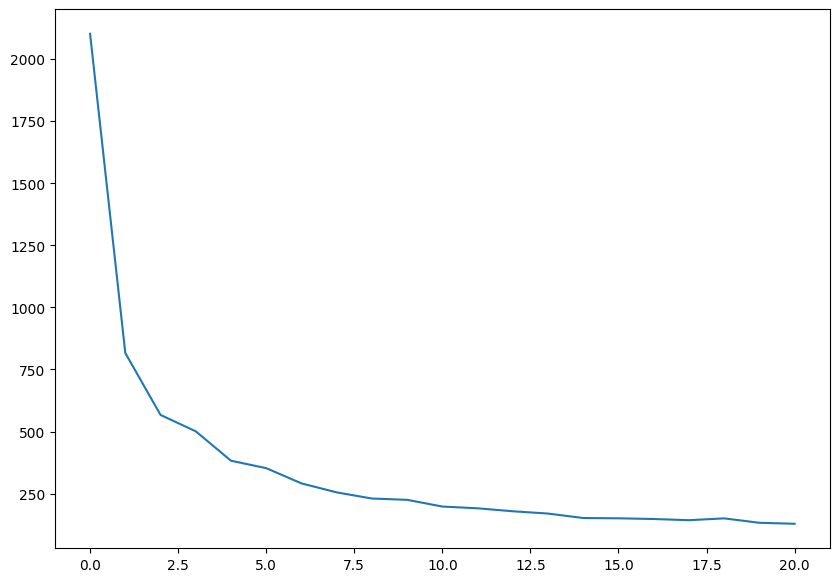

  0%|          | 0/15000 [00:00<?, ?it/s]

torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([

In [49]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1, 1, 1)

# итерируемся
for epoch in tqdm(range(2)):

    running_loss = 0.0
    for i, batch in enumerate(tqdm(trainloader)):
        # так получаем текущий батч
        X_batch, y_batch = batch

        # обнуляем веса
        optimizer.zero_grad()

        # forward + backward + optimize
        y_pred = net(X_batch.to(device))
        loss = loss_fn(y_pred, y_batch.to(device))
        loss.backward()
        optimizer.step()

        # выведем текущий loss
        running_loss += loss.item()
        # выведем качество каждые 2000 батчей
        if i % 2000 == 1999:
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            losses.append(running_loss)
            running_loss = 0.0

    ax.clear()
    ax.plot(np.arange(len(losses)), losses)
    plt.show()

print('Обучение закончено')


Протестируем на всём тестовом датасете, используя метрику accuracy_score:

In [50]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

with torch.no_grad():
    for data in testloader:
        images, labels = data
        y_pred = net(images.to(device))
        _, predicted = torch.max(y_pred, 1)

        c = (predicted.cpu().detach() == labels)
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))


torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([4, 16, 4, 4])
torch.Size([

---

### Задача 1

Протестируйте эту нейросеть на отдельных картинках из тестового датасета: напишите функцию, которая принимает индекс картинки в тестовом датасете, отрисовывает её, потом запускает на ней модель (нейросеть) и выводит результат предсказания.

---

<h3 style="text-align: center;"><b>CIFAR10</b></h3>

<img src="https://raw.githubusercontent.com/soumith/ex/gh-pages/assets/cifar10.png" width=500, height=400>

**CIFAR10:** это набор из 60k картинок 32х32х3, 50k которых составляют обучающую выборку, и оставшиеся 10k - тестовую. Классов в этом датасете 10: `'plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'`.

Скачаем и загрузим в `loader`'ы:

**Обратите внимание на аргумент `batch_size`:** именно он будет отвечать за размер батча, который будет подаваться при оптимизации нейросети

In [53]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


100%|██████████| 170498071/170498071 [15:08<00:00, 187622.08it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


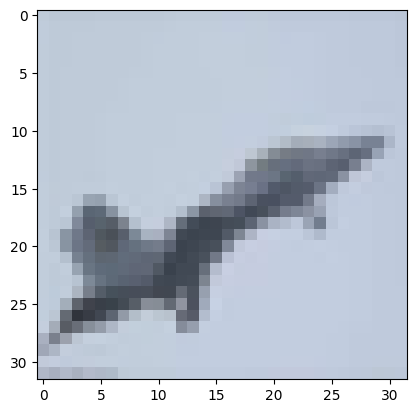

In [54]:
# случайный индекс от 0 до размера тренировочной выборки
i = np.random.randint(low=0, high=50000)

plt.imshow(trainloader.dataset.data[i], cmap='gray');


То есть мы имеем дело с кусочками данных размера batch_size (в данном случае = 4), причём в каждом батче есть как объекты, так и ответы на них (то есть и $X$, и $y$).

Данные готовы, мы даже на них посмотрели.

К делу:

### Задача 2

Напишите свою свёрточную нейросеть для предсказания на CIFAR10.

In [55]:
next(iter(trainloader))[0].shape


torch.Size([128, 3, 32, 32])

In [56]:
class MyConvNet(nn.Module):
    def __init__(self):
        # вызов конструктора предка
        super().__init__()
        # необходмо заранее знать, сколько каналов у картинки (сейчас = 1),
        # которую будем подавать в сеть, больше ничего
        # про входящие картинки знать не нужно
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=5)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3)
        self.fc1 = nn.Linear(6 * 6 * 128, 128)  # !!!
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 10)

    def forward(self, x):
        #(32,32)
        x = self.pool(F.relu(self.conv1(x)))
        #(14,14)
        x = self.pool(F.relu(self.conv2(x)))
        #(6,6)
        #print(x.shape)
        x = x.view(-1, 6 * 6 * 128)  # !!!
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


Обучим:

In [57]:
# пример взят из официального туториала:
# https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html

net = MyConvNet().to(device)

loss_fn = torch.nn.CrossEntropyLoss()

learning_rate = 1e-4
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)

# итерируемся
for epoch in tqdm(range(10)):

    running_loss = 0.0
    for i, batch in enumerate(tqdm(trainloader)):
        # так получаем текущий батч
        X_batch, y_batch = batch

        # обнуляем веса
        optimizer.zero_grad()

        # forward + backward + optimize
        y_pred = net(X_batch.to(device))
        loss = loss_fn(y_pred, y_batch.to(device))
        loss.backward()
        optimizer.step()

        # выведем текущий loss
        running_loss += loss.item()
        # выводем качество каждые 2000 батчей
        if i % 2000 == 1999:
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Обучение закончено')


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

Обучение закончено


Посмотрим на accuracy на тестовом датасете:

In [58]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

with torch.no_grad():
    for data in testloader:
        images, labels = data
        y_pred = net(images.to(device))#.view(4, -1))
        _, predicted = torch.max(y_pred, 1)
        c = (predicted.cpu().detach() == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))


Accuracy of plane : 55 %
Accuracy of   car : 82 %
Accuracy of  bird : 48 %
Accuracy of   cat : 41 %
Accuracy of  deer : 33 %
Accuracy of   dog : 42 %
Accuracy of  frog : 69 %
Accuracy of horse : 64 %
Accuracy of  ship : 75 %
Accuracy of truck : 58 %


Как думаете, этого достаточно?

### Задача 3  

Улучшите свёрточную нейросеть: поэкспериментируйте с архитектурой (количество слоёв, порядок слоёв), с гиперпараметрами слоёв (размеры kernel_size, размеры pooling'а, количество kernel'ов в свёрточном слое) и с гиперпараметрами, указанными в "Компоненты нейросети" (см. памятку выше).

(Ожидаемый результат -- скорее всего, сходу Вам не удастся выжать из Вашей сетки больше, чем ~70% accuracy (в среднем по всем классам). Если это что-то в этом районе - Вы хорошо постарались).

<h3 style="text-align: center;"><b>Полезные ссылки</b></h3>

1). *Примеры написания нейросетей на PyTorch (офийиальные туториалы) (на английском): https://pytorch.org/tutorials/beginner/pytorch_with_examples.html#examples  
https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html*

2). ***Один из самых подробных и полных курсов по deep learning на данный момент - это курс Стэнфордского Университета (он вообще сейчас один из лидеров в области ИИ, его выпускники работают в Google, Facebook, Amazon, Microsoft, в стартапах в Кремниевой долине):  http://cs231n.github.io/***  

3). Практически исчерпывающая информация по основам свёрточных нейросетей (из cs231n) (на английском):  

http://cs231n.github.io/convolutional-networks/  
http://cs231n.github.io/understanding-cnn/  
http://cs231n.github.io/transfer-learning/

4). Видео о Computer Vision от Andrej Karpathy: https://www.youtube.com/watch?v=u6aEYuemt0M



# ДЗ 4. Полносвязные и свёрточные нейронные сети

В этом занятии вам предстоит потренироваться построению нейронных сетей с помощью библиотеки Pytorch. Делать мы это будем на нескольких датасетах.








In [ ]:
import numpy as np

import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

import torch
from torch import nn
from torch.nn import functional as F

from torch.utils.data import TensorDataset, DataLoader

sns.set(style="darkgrid", font_scale=1.4)


# Часть 1. Датасет moons

Давайте сгенерируем датасет и посмотрим на него!

In [ ]:
X, y = make_moons(n_samples=10000, random_state=42, noise=0.1)


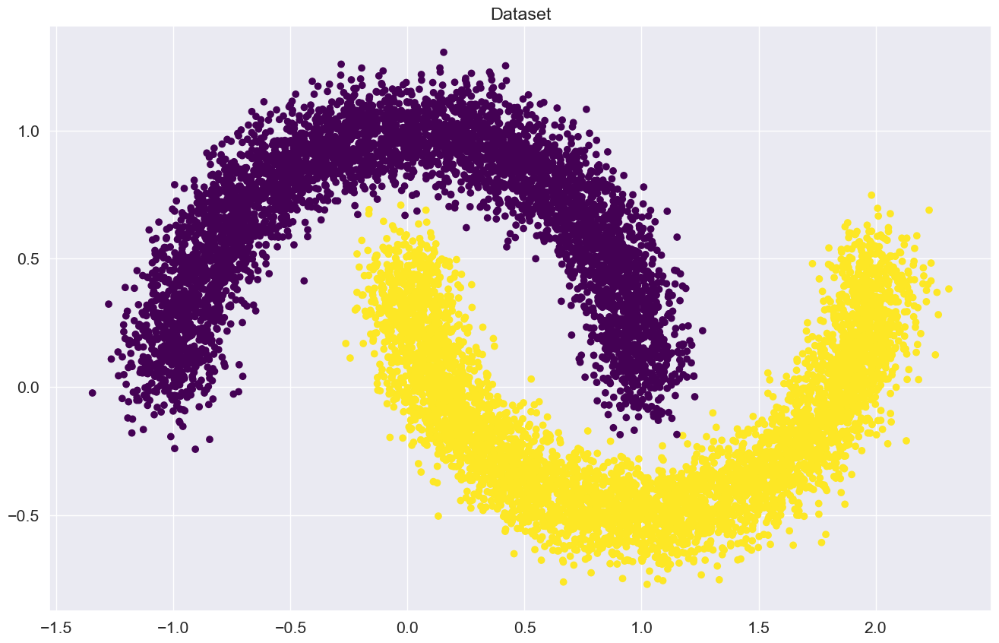

In [ ]:
plt.figure(figsize=(16, 10))
plt.title("Dataset")
plt.scatter(X[:, 0], X[:, 1], c=y, cmap="viridis")
plt.show()


Сделаем train/test split

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state=42)


### Загрузка данных
В PyTorch загрузка данных как правило происходит налету (иногда датасеты не помещаются в оперативную память). Для этого используются две сущности `Dataset` и `DataLoader`.

1.   `Dataset` загружает каждый объект по отдельности.

2.   `DataLoader` группирует объекты из `Dataset` в батчи.

Так как наш датасет достаточно маленький мы будем использовать `TensorDataset`. Все, что нам нужно, это перевести из массива numpy в тензор с типом `torch.float32`.

### Задание. Создайте тензоры с обучающими и тестовыми данными

In [ ]:
X_train_t = torch.IntTensor(X_train)
y_train_t = torch.IntTensor(y_train)
X_val_t = torch.IntTensor(X_val)
y_val_t = torch.IntTensor(y_val)


Создаем `Dataset` и `DataLoader`.

In [ ]:
train_dataset = TensorDataset(X_train_t, y_train_t)
val_dataset = TensorDataset(X_val_t, y_val_t)
train_dataloader = DataLoader(train_dataset, batch_size = 128)
val_dataloader = DataLoader(val_dataset, batch_size = 128)


## Logistic regression is my profession

**Напоминание**
Давайте вспоним, что происходит в логистической регрессии. На входе у нас есть матрица объект-признак X и столбец-вектор $y$ – метки из $\{0, 1\}$ для каждого объекта. Мы хотим найти такую матрицу весов $W$ и смещение $b$ (bias), что наша модель $XW + b$ будет каким-то образом предсказывать класс объекта. Как видно на выходе наша модель может выдавать число в интервале от $(-\infty;\infty)$. Этот выход как правило называют "логитами" (logits). Нам необходимо перевести его на интервал от $[0;1]$ для того, чтобы он выдавал нам вероятность принадлежности объекта к кассу один, также лучше, чтобы эта функция была монотонной, быстро считалась, имела производную и на $-\infty$ имела значение $0$, а на $+\infty$ имела значение $1$. Такой класс функций называется сигмоидыю. Чаще всего в качестве сигмоида берут
$$
\sigma(x) = \frac{1}{1 + e^{-x}}.
$$

### Задание. Реализация логистической регрессии

Вам необходимо написать модуль на PyTorch реализующий $logits = XW + b$, где $W$ и $b$ – параметры (`nn.Parameter`) модели. Иначе говоря, здесь мы реализуем своими руками модуль `nn.Linear` (в этом пункте его использование запрещено). Инициализируйте веса нормальным распределением (`torch.randn`).

In [ ]:
class LinearRegression(nn.Module):
    def __init__(self, in_features: int, out_features: int, bias: bool = True):
        super().__init__()
        self.weights = nn.Parameter(torch.randn(in_features, out_features).reshape(1, -1))
        self.bias = bias
        if bias:
            self.bias_term = nn.Parameter(torch.zeros(out_features))
    def forward(self, x):
        x = x.type(torch.float32) @ self.weights.t()
        if self.bias:
            x += self.bias_term
        return x


In [ ]:
linear_regression = LinearRegression(2, 1)
loss_function = nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(linear_regression.parameters(), lr=0.05)


**Вопрос 1.** Сколько обучаемых параметров у получившейся модели? Имеется в виду суммарное количество отдельных числовых переменных, а не количество тензоров.

In [ ]:
3


3

### Train loop

Вот псевдокод, который поможет вам разобраться в том, что происходит во время обучения

```python
for epoch in range(max_epochs):  # <----------- итерируемся по датасету несколько раз
    for x_batch, y_batch in dataset:  # <------ итерируемся по датасету. Так как мы используем SGD а не GD, то берем батчи заданного размера
        optimizer.zero_grad()  # <------------- обнуляем градиенты модели
        outp = model(x_batch)  # <------------- получаем "логиты" из модели
        loss = loss_func(outp, y_batch)  # <--- считаем "лосс" для логистической регрессии
        loss.backward()  # <------------------- считаем градиенты
        optimizer.step()  # <------------------ делаем шаг градиентного спуска
        if convergence:  # <------------------- в случае сходимости выходим из цикла
            break
```

В коде ниже добавлено логирование `accuracy` и `loss`.

### Задание. Реализация цикла обучения

In [ ]:
tol = 1e-3
losses = []
max_epochs = 100
prev_weights = torch.zeros_like(linear_regression.weights)
stop_it = False
for epoch in range(max_epochs):
    for it, (X_batch, y_batch) in enumerate(train_dataloader):
        optimizer.zero_grad()
        outp = linear_regression(X_batch) # YOUR CODE. Use linear_regression to get outputs
        loss = loss_function(outp.flatten(), y_batch.type(torch.float32)) # YOUR CODE. Compute loss
        loss.backward()
        losses.append(loss.detach().flatten()[0])
        optimizer.step()
        probabilities = 1 / (1 + np.exp(X_batch)).sum() # YOUR CODE. Compute probabilities
        preds = (probabilities > 0.5).type(torch.long)
        batch_acc = (preds.flatten() == y_batch).type(torch.float32).sum() / y_batch.size(0)
        if (it + epoch * len(train_dataloader)) % 100 == 0:
            print(f"Iteration: {it + epoch * len(train_dataloader)}\nBatch accuracy: {batch_acc}")
        current_weights = linear_regression.weights.detach().clone()
        if (prev_weights - current_weights).abs().max() < tol:
            print(f"\nIteration: {it + epoch * len(train_dataloader)}.Convergence. Stopping iterations.")
            stop_it = True
            break
        prev_weights = current_weights
    if stop_it:
        break


Iteration: 0
Batch accuracy: 0.515625
Iteration: 100
Batch accuracy: 0.453125
Iteration: 200
Batch accuracy: 0.5390625
Iteration: 300
Batch accuracy: 0.421875
Iteration: 400
Batch accuracy: 0.5234375
Iteration: 500
Batch accuracy: 0.5078125
Iteration: 600
Batch accuracy: 0.59375

Iteration: 615.Convergence. Stopping iterations.


**Вопрос 2.** Сколько итераций потребовалось, чтобы алгоритм сошелся?

**Ответ:** 375

### Визуализируем результаты

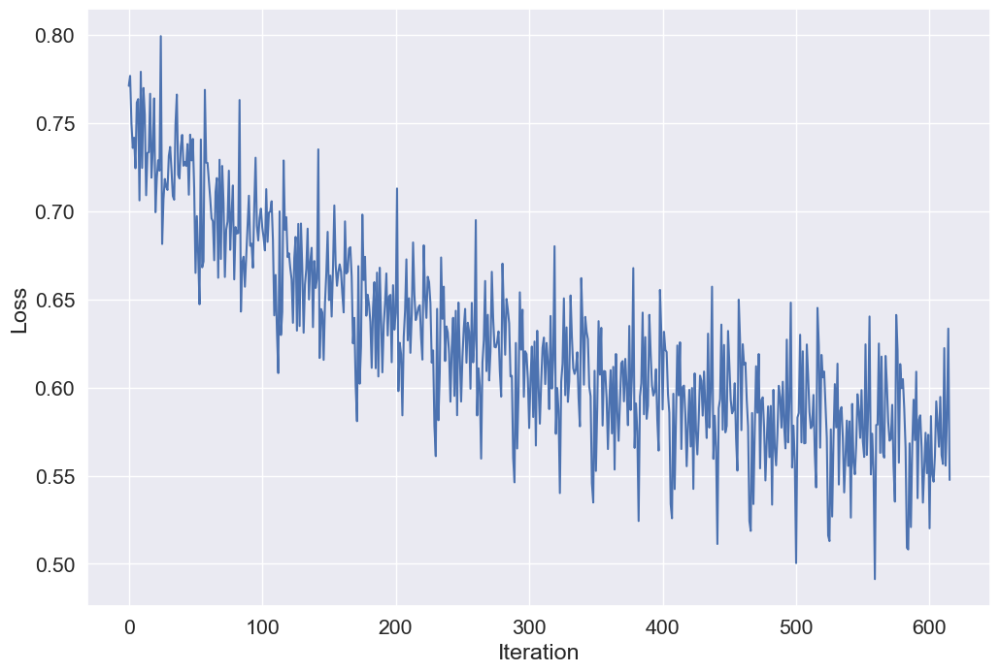

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(range(len(losses)), losses)
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()


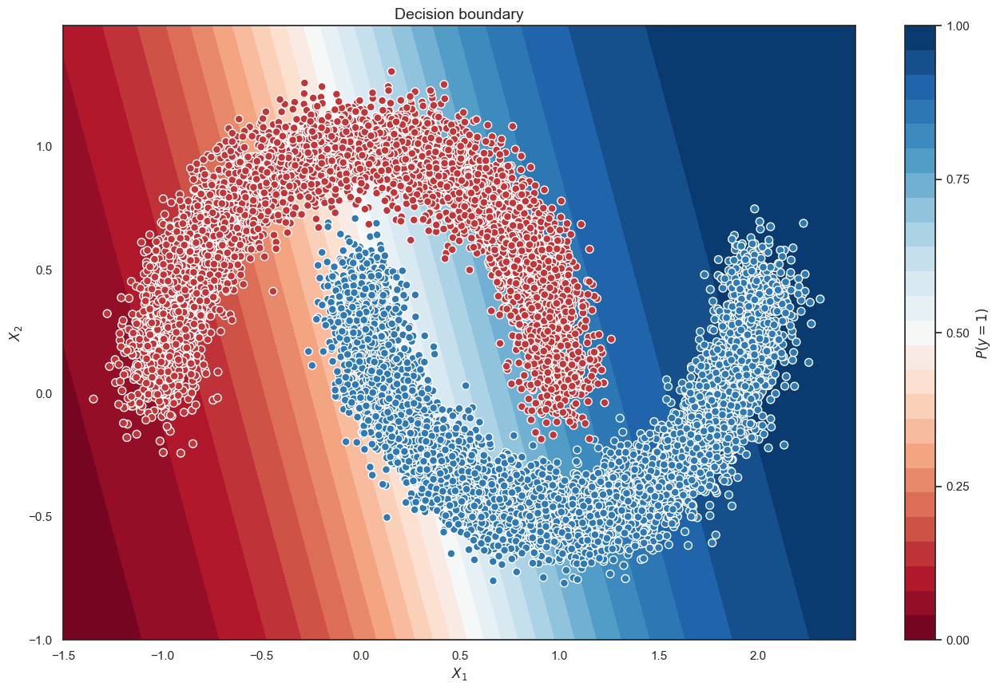

In [ ]:
import numpy as np

sns.set(style="white")

xx, yy = np.mgrid[-1.5:2.5:.01, -1.:1.5:.01]
grid = np.c_[xx.ravel(), yy.ravel()]
batch = torch.from_numpy(grid).type(torch.float32)
with torch.no_grad():
    probs = torch.sigmoid(linear_regression(batch).reshape(xx.shape))
    probs = probs.numpy().reshape(xx.shape)

f, ax = plt.subplots(figsize=(16, 10))
ax.set_title("Decision boundary", fontsize=14)
contour = ax.contourf(xx, yy, probs, 25, cmap="RdBu",
                      vmin=0, vmax=1)
ax_c = f.colorbar(contour)
ax_c.set_label("$P(y = 1)$")
ax_c.set_ticks([0, .25, .5, .75, 1])

ax.scatter(X[100:,0], X[100:, 1], c=y[100:], s=50,
           cmap="RdBu", vmin=-.2, vmax=1.2,
           edgecolor="white", linewidth=1)

ax.set(xlabel="$X_1$", ylabel="$X_2$")
plt.show()


### Задание. Реализуйте predict и посчитайте accuracy на test.

In [ ]:
@torch.no_grad()
def predict(dataloader, model):
    model.eval()
    predictions = np.array([])
    for x_batch, _ in dataloader:
        probabilities = (1 / (1 + np.exp(x_batch.type(torch.float32) @ model.weights.t() + model.bias_term)))
        preds = (probabilities > 0.5).type(torch.long)
        predictions = np.hstack((predictions, preds.numpy().flatten()))
    return predictions.flatten()


In [ ]:
from sklearn.metrics import accuracy_score

print(accuracy_score(predict(val_dataloader, linear_regression), y_val)) # YOUR CODE. Compute total accuracy


0.3348


**Вопрос 3**

Какое `accuracy` получается после обучения?

**Ответ:** 0.2732

# Часть 2. Датасет MNIST
Датасет MNIST содержит рукописные цифры. Загрузим датасет и создадим DataLoader-ы. Пример можно найти в семинаре по полносвязным нейронным сетям.

In [ ]:
import os
from torchvision.datasets import MNIST
from torchvision import transforms as tfs
from torchsummary import summary


data_tfs = tfs.Compose([
    tfs.ToTensor(),
    tfs.Normalize((0.5), (0.5))
])

# install for train and test
root = './'
train_dataset = MNIST(root, train=True,  transform=data_tfs, download=True)
val_dataset  = MNIST(root, train=False, transform=data_tfs, download=True)

batch_size = 128

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, drop_last=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, drop_last=True)


## Часть 2.1. Полносвязные нейронные сети
Сначала решим MNIST с помощью полносвязной нейронной сети.

In [ ]:
class Identical(nn.Module):
    def forward(self, x):
        return x


### Задание. Простая полносвязная нейронная сеть

Создайте полносвязную нейронную сеть с помощью класса Sequential. Сеть состоит из:
* Уплощения матрицы в вектор (nn.Flatten);
* Двух скрытых слоёв из 128 нейронов с активацией nn.ELU;
* Выходного слоя с 10 нейронами.

Задайте лосс для обучения (кросс-энтропия).


In [ ]:
activation = nn.ELU
features = 28 * 28
classes = 10

model = nn.Sequential(
    nn.Flatten(),
    nn.Linear(features, 128),
    activation(),#YOUR CODE. Add layers to your sequential class
    nn.Linear(128, classes),
    activation()
)
summary(model, (features,), batch_size=128)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                 [128, 784]               0
            Linear-2                 [128, 128]         100,480
               ELU-3                 [128, 128]               0
            Linear-4                  [128, 10]           1,290
               ELU-5                  [128, 10]               0
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/backward pass size (MB): 1.04
Params size (MB): 0.39
Estimated Total Size (MB): 1.81
----------------------------------------------------------------


In [ ]:
criterion = nn.CrossEntropyLoss()   #YOUR CODE. Select a loss function
optimizer = torch.optim.Adam(model.parameters())

loaders = {"train": train_dataloader, "valid": valid_dataloader}


In [ ]:
device = "mps" if torch.backends.mps.is_available() else "cpu"


### Train loop (seriously)

Давайте разберемся с кодом ниже, который подойдет для 90% задач в будущем.


```python
for epoch in range(max_epochs):  # <--------------- итерируемся по датасету несколько раз
    for k, dataloader in loaders.items():  # <----- несколько dataloader для train / valid / test
        for x_batch, y_batch in dataloader:  # <--- итерируемся по датасету. Так как мы используем SGD а не GD, то берем батчи заданного размера
            if k == "train":
                model.train()  # <------------------ переводим модель в режим train
                optimizer.zero_grad()  # <--------- обнуляем градиенты модели
                outp = model(x_batch)
                loss = criterion(outp, y_batch) # <-считаем "лосс" для логистической регрессии
                loss.backward()  # <--------------- считаем градиенты
                optimizer.step()  # <-------------- делаем шаг градиентного спуска
            else:  # <----------------------------- test/eval
                model.eval()  # <------------------ переводим модель в режим eval
                with torch.no_grad():  # <--------- НЕ считаем градиенты
                    outp = model(x_batch)  # <------------- получаем "логиты" из модели
            count_metrics(outp, y_batch)  # <-------------- считаем метрики
```

### Задание. Дополните цикл обучения.

In [ ]:
max_epochs = 10
accuracy = {"train": [], "valid": []}
correct = np.array([0. for i in range(10)])
all = np.array([0. for i in range(10)])

summary(model, (features,), batch_size=128)

for epoch in range(max_epochs):
    for k, dataloader in loaders.items():
        epoch_correct = 0
        epoch_all = 0
        for x_batch, y_batch in dataloader:
            if k == "train":
                model.train()
                optimizer.zero_grad()
                outp = model(x_batch)
                loss = criterion(outp, y_batch)
                # YOUR CODE. Set model to ``train`` mode and calculate outputs. Don't forget zero_grad!
            else:
                model.eval()
                with torch.no_grad():
                    outp = model(x_batch) # YOUR CODE. Set model to ``eval`` mode and calculate outputs
            preds = outp.argmax(-1)
            c = (preds.cpu().detach() == y_batch)
            for i in range(batch_size):
                label = y_batch[i]
                correct[label] += c[i].item()
                all[label] += 1
            epoch_correct += correct.sum()
            epoch_all += all.sum()
            if k == "train":
                loss = criterion(outp, y_batch)
                loss.backward()
                optimizer.step() # YOUR CODE. Calculate gradients and make a step of your optimizer
        if k == "train":
            print(f"Epoch: {epoch+1}")
        print(f"Loader: {k}. Accuracy: {epoch_correct/epoch_all}")
        accuracy[k].append(epoch_correct/epoch_all)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                 [128, 784]               0
            Linear-2                 [128, 128]         100,480
               ELU-3                 [128, 128]               0
            Linear-4                  [128, 10]           1,290
               ELU-5                  [128, 10]               0
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/backward pass size (MB): 1.04
Params size (MB): 0.39
Estimated Total Size (MB): 1.81
----------------------------------------------------------------
Epoch: 1
Loader: train. Accuracy: 0.8506709526998706
Loader: valid. Accuracy: 0.877742318744474
Epoch: 2
Loader: train. Accuracy: 0.8949427561570219
Loader: valid. Accuracy: 0.9051784231134314
Epoch: 3
Loader: train. Accuracy: 0.91420

### Задание. Протестируйте разные функции активации.
Попробуйте разные функции активации. Для каждой функции активации посчитайте массив validation accuracy. Лучше реализовать это в виде функции, берущей на вход активацию и получающей массив из accuracies.

In [ ]:
elu_accuracy = accuracy["valid"]
elu_accuracy


[0.877742318744474,
 0.9051784231134314,
 0.9204924816248667,
 0.9308777987917466,
 0.938467626597503,
 0.9442516520641521,
 0.948850789782219,
 0.9526157662399578,
 0.9556993579225274,
 0.9583385431815871]

In [ ]:
# YOUR CODE. Do the same thing with other activations (it's better to wrap into a function that returns a list of accuracies)
features = 28 * 28
classes = 10

criterion = nn.CrossEntropyLoss()   #YOUR CODE. Select a loss function
optimizer = torch.optim.Adam(model.parameters())

loaders = {"train": train_dataloader, "valid": valid_dataloader}
max_epochs = 10
accuracy = {"train": [], "valid": []}
correct = np.array([0. for i in range(10)])
all = np.array([0. for i in range(10)])

activation_list = [nn.ReLU, nn.Tanh, nn.Sigmoid, nn.LeakyReLU, Identical]
accuracies = {"ELU()" : elu_accuracy[-1]}
def test_activation_function(activation):
    activation = activation
    features = 28 * 28
    classes = 10
    model = nn.Sequential()
    model.add_module('0', nn.Flatten())
    model.add_module('1', nn.Linear(features, 128))
    model.add_module('2', activation())
    model.add_module('3', nn.Linear(128, classes))
    model.add_module('4', activation())

    summary(model, (features,), batch_size=128)
    criterion = nn.CrossEntropyLoss()   #YOUR CODE. Select a loss function
    optimizer = torch.optim.Adam(model.parameters())

    loaders = {"train": train_dataloader, "valid": valid_dataloader}
    accuracy = {"train": [], "valid": []}

    max_epochs = 10
    correct = np.array([0. for i in range(10)])
    all = np.array([0. for i in range(10)])
    for epoch in range(max_epochs):
        for k, dataloader in loaders.items():
            epoch_correct = 0
            epoch_all = 0
            for x_batch, y_batch in dataloader:
                if k == "train":
                    model.train()
                    optimizer.zero_grad()
                    outp = model(x_batch)
                    loss = criterion(outp, y_batch)
                # YOUR CODE. Set model to ``train`` mode and calculate outputs. Don't forget zero_grad!
                else:
                    model.eval()
                    with torch.no_grad():
                        outp = model(x_batch) # YOUR CODE. Set model to ``eval`` mode and calculate outputs
                preds = outp.argmax(-1)
                c = (preds.cpu().detach() == y_batch)
                for i in range(batch_size):
                    label = y_batch[i]
                    correct[label] += c[i].item()
                    all[label] += 1
                epoch_correct += correct.sum()
                epoch_all += all.sum()
                if k == "train":
                    loss = criterion(outp, y_batch)
                    loss.backward()
                    optimizer.step() # YOUR CODE. Calculate gradients and make a step of your optimizer
            if k == "train":
                print(f"Epoch: {epoch+1}, activation function: {activation}")
            print(f"Loader: {k}. Accuracy: {epoch_correct/epoch_all}")
            accuracy[k].append(epoch_correct/epoch_all)
    accuracies[activation] = accuracy["valid"][-1]
    return accuracy["valid"]
for i in range(5):
    test_activation_function(activation_list[i])
print(accuracies)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                 [128, 784]               0
            Linear-2                 [128, 128]         100,480
              ReLU-3                 [128, 128]               0
            Linear-4                  [128, 10]           1,290
              ReLU-5                  [128, 10]               0
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/backward pass size (MB): 1.04
Params size (MB): 0.39
Estimated Total Size (MB): 1.81
----------------------------------------------------------------
Epoch: 1, activation function: <class 'torch.nn.modules.activation.ReLU'>
Loader: train. Accuracy: 0.6713226592540958
Loader: valid. Accuracy: 0.6980852122015915
Epoch: 2, activation function: <class 'torch.nn.modules.activation.ReLU'

In [ ]:
values = sorted(accuracies.values(), reverse = True)

def get_key(d, value):
    for k, v in d.items():
        if v == value:
            return k

print("Rating of the best activation functions:")
for i in range(6):
    print(f"{i + 1}. {get_key(accuracies, values[i])}, it's accuracy is {values[i]}")


Rating of the best activation functions:
1. ELU(), it's accuracy is 0.9583385431815871
2. <class 'torch.nn.modules.activation.LeakyReLU'>, it's accuracy is 0.953323768643128
3. <class 'torch.nn.modules.activation.Tanh'>, it's accuracy is 0.9493295885978665
4. <class 'torch.nn.modules.activation.Sigmoid'>, it's accuracy is 0.9280651680334944
5. <class '__main__.Identical'>, it's accuracy is 0.9049180708870428
6. <class 'torch.nn.modules.activation.ReLU'>, it's accuracy is 0.7636257299699439


In [ ]:
plain_accuracy = test_activation_function(Identical)
relu_accuracy = test_activation_function(nn.ReLU)
leaky_relu_accuracy = test_activation_function(nn.LeakyReLU)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                 [128, 784]               0
            Linear-2                 [128, 128]         100,480
         Identical-3                 [128, 128]               0
            Linear-4                  [128, 10]           1,290
         Identical-5                  [128, 10]               0
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/backward pass size (MB): 1.04
Params size (MB): 0.39
Estimated Total Size (MB): 1.81
----------------------------------------------------------------
Epoch: 1, activation function: <class '__main__.Identical'>
Loader: train. Accuracy: 0.8482369944007071
Loader: valid. Accuracy: 0.8702000047366427
Epoch: 2, activation function: <class '__main__.Identical'>
Loader: train. Accuracy: 0

### Accuracy
Построим график accuracy/epoch для каждой функции активации.

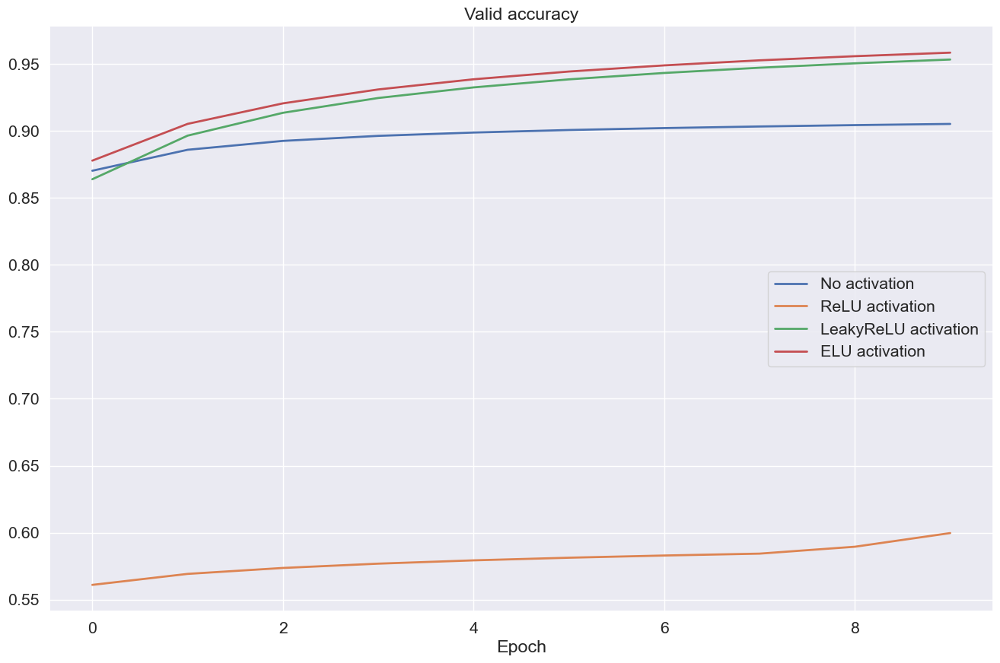

In [ ]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(16, 10))
plt.title("Valid accuracy")
plt.plot(range(max_epochs), plain_accuracy, label="No activation", linewidth=2)
plt.plot(range(max_epochs), relu_accuracy, label="ReLU activation", linewidth=2)
plt.plot(range(max_epochs), leaky_relu_accuracy, label="LeakyReLU activation", linewidth=2)
plt.plot(range(max_epochs), elu_accuracy, label="ELU activation", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()


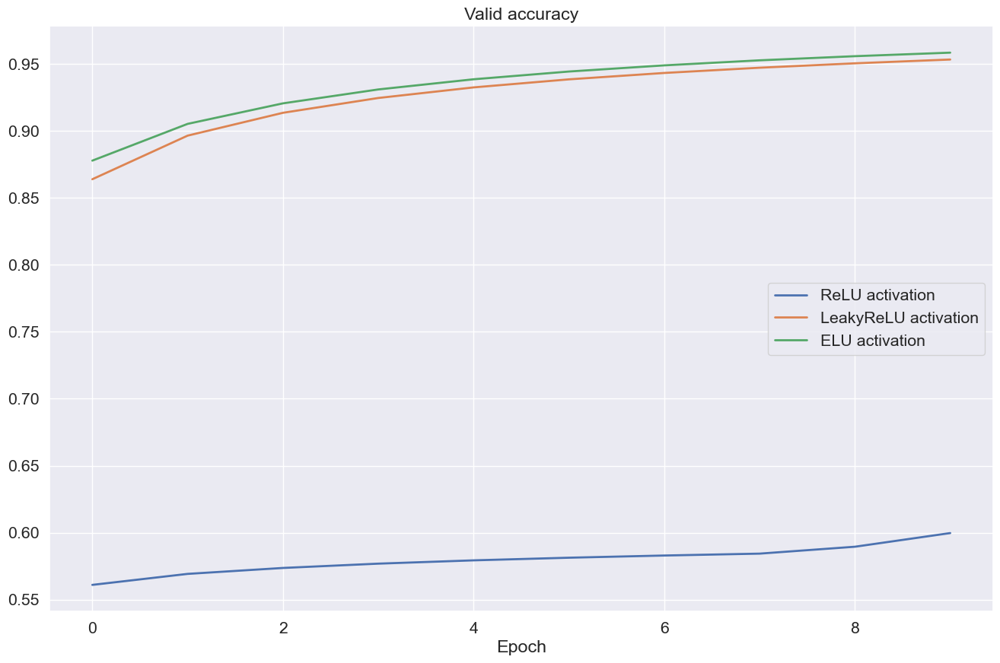

In [ ]:
plt.figure(figsize=(16, 10))
plt.title("Valid accuracy")
plt.plot(range(max_epochs), relu_accuracy, label="ReLU activation", linewidth=2)
plt.plot(range(max_epochs), leaky_relu_accuracy, label="LeakyReLU activation", linewidth=2)
plt.plot(range(max_epochs), elu_accuracy, label="ELU activation", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()


**Вопрос 4.** Какая из активаций показала наивысший `accuracy` к концу обучения?

**Ответ:** ELU

## Часть 2.2 Сверточные нейронные сети

### Ядра
Сначала немного поработам с самим понятием ядра свёртки.

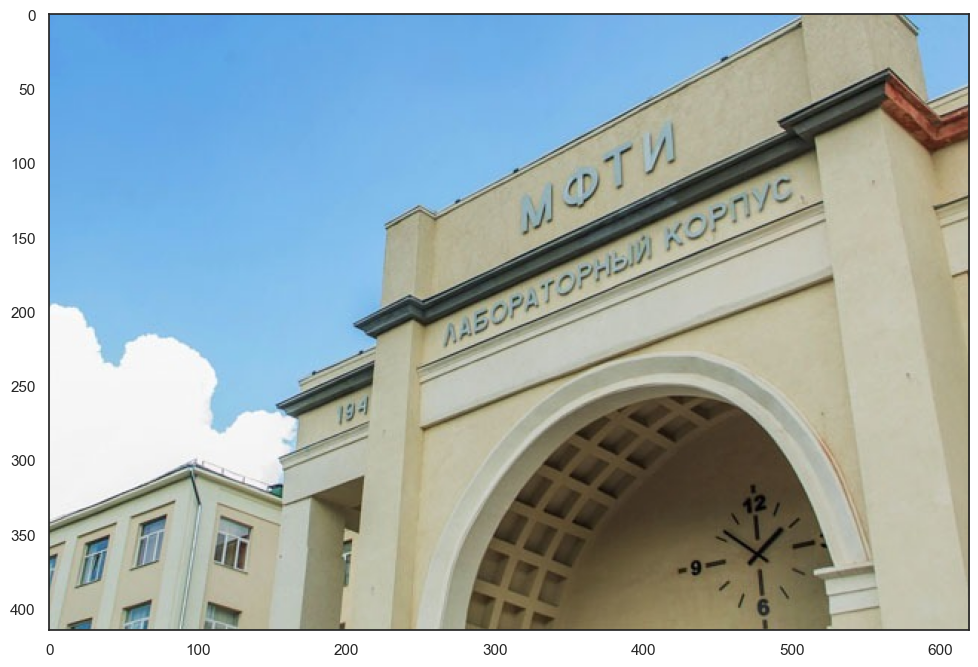

In [ ]:
import cv2
sns.set(style="white")
img = cv2.imread("/Users/dadaya/Desktop/progs/DLS/mipt.jpeg")
RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 8))
plt.imshow(RGB_img)
plt.show()


Попробуйте посмотреть как различные свертки влияют на фото. Например, попробуйте

A)
```
[0, 0, 0],
[0, 1, 0],
[0, 0, 0]
```
Б)
```
[0, 1, 0],
[0, -2, 0],
[0, 1, 0]
```
В)
```
[0, 0, 0],
[1, -2, 1],
[0, 0, 0]
```
Г)
```
[0, 1, 0],
[1, -4, 1],
[0, 1, 0]
```
Д)
```
[0, -1, 0],
[-1, 5, -1],
[0, -1, 0]
```
Е)
```
[0.0625, 0.125, 0.0625],
[0.125, 0.25, 0.125],
[0.0625, 0.125, 0.0625]
```

Не стесняйтесь пробовать свои варианты!

In [ ]:
img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
kernel = torch.tensor([
[0.0625, 0.125, 0.0625],
[0.125, 0.25, 0.125],
[0.0625, 0.125, 0.0625]
]).reshape(1, 1, 3, 3).type(torch.float32)

kernel = kernel.repeat(3, 3, 1, 1)
img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

result = F.conv2d(img_t, kernel)[0]  #


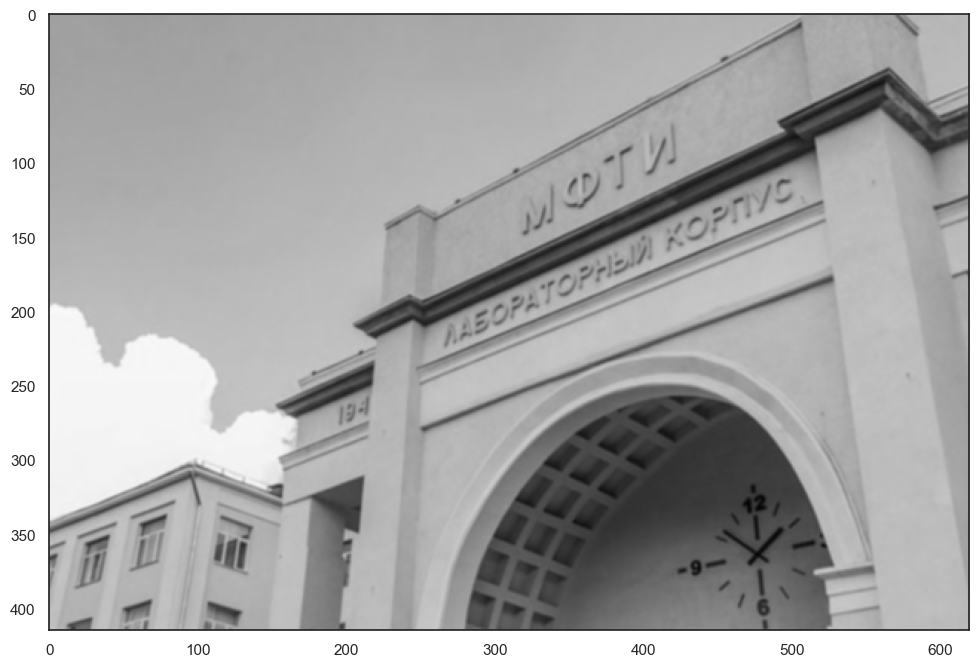

In [ ]:
plt.figure(figsize=(12, 8))
result_np = result.permute(1, 2, 0).numpy() / 256 / 3

plt.imshow(result_np)
plt.show()


**Вопрос 5.** Как можно описать действия ядер, приведенных выше? Сопоставьте для каждой буквы число.

1) Размытие

2) Увеличение резкости

3) Тождественное преобразование

4) Выделение вертикальных границ

5) Выделение горизонтальных границ

6) Выделение границ

**Ответ:** 1 - E, 2 - Д, 3 - А, 4 - В, 5 - Б, 6 - Г

### Задание. Реализуйте LeNet

Если мы сделаем параметры сверток обучаемыми, то можем добиться хороших результатов для задач компьютерного зрения. Реализуйте архитектуру LeNet, предложенную еще в 1998 году!
На этот раз используйте модульную структуру (без помощи класса Sequential).

Наша нейронная сеть будет состоять из
* Свёртки 3x3 (1 карта на входе, 6 на выходе) с активацией ReLU;
* MaxPooling-а 2x2;
* Свёртки 3x3 (6 карт на входе, 16 на выходе) с активацией ReLU;
* MaxPooling-а 2x2;
* Уплощения (nn.Flatten);
* Полносвязного слоя со 120 нейронами и активацией ReLU;
* Полносвязного слоя с 84 нейронами и активацией ReLU;
* Выходного слоя из 10 нейронов.




In [ ]:
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        # 1 input image channel, 6 output channels, 3x3 square conv kernel
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=3)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(4 * 4 * 16, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool1(F.relu(self.conv1(x)))
        x = self.pool2(F.relu(self.conv2(x)))
        print(x.shape)
        x = x.view(-1, 4 * 4 * 16)  # !!!
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


In [ ]:
device = torch.device("cpu")
model = LeNet().to(device)
summary(model, (1,28, 28))

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())

loaders = {"train": train_dataloader, "valid": valid_dataloader}


torch.Size([2, 16, 4, 4])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 26, 26]              60
         MaxPool2d-2            [-1, 6, 13, 13]               0
            Conv2d-3             [-1, 16, 9, 9]           2,416
         MaxPool2d-4             [-1, 16, 4, 4]               0
            Linear-5                  [-1, 120]          30,840
            Linear-6                   [-1, 84]          10,164
            Linear-7                   [-1, 10]             850
Total params: 44,330
Trainable params: 44,330
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.05
Params size (MB): 0.17
Estimated Total Size (MB): 0.22
----------------------------------------------------------------


### Задание. Обучите CNN
Используйте код обучения, который вы написали для полносвязной нейронной сети.

In [ ]:
device = torch.device("cpu")
model = LeNet().to(device)
summary(model, (1,28, 28))

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())

loaders = {"train": train_dataloader, "valid": valid_dataloader}

max_epochs = 10
accuracy = {"train": [], "valid": []}
correct = np.array([0. for i in range(10)])
all = np.array([0. for i in range(10)])

for epoch in range(max_epochs):
    for k, dataloader in loaders.items():
        epoch_correct = 0
        epoch_all = 0
        for x_batch, y_batch in dataloader:
            if k == "train":
                model.train()
                optimizer.zero_grad()
                outp = model(x_batch)
                loss = criterion(outp, y_batch)
                # YOUR CODE. Set model to ``train`` mode and calculate outputs. Don't forget zero_grad!
            else:
                model.eval()
                with torch.no_grad():
                    outp = model(x_batch) # YOUR CODE. Set model to ``eval`` mode and calculate outputs
            preds = outp.argmax(-1)
            c = (preds.cpu().detach() == y_batch)
            for i in range(batch_size):
                label = y_batch[i]
                correct[label] += c[i].item()
                all[label] += 1
            epoch_correct += correct.sum()
            epoch_all += all.sum()
            if k == "train":
                loss = criterion(outp, y_batch)
                loss.backward()
                optimizer.step() # YOUR CODE. Calculate gradients and make a step of your optimizer
        if k == "train":
            print(f"Epoch: {epoch+1}")
        print(f"Loader: {k}. Accuracy: {epoch_correct/epoch_all}")
        accuracy[k].append(epoch_correct/epoch_all)


torch.Size([2, 16, 4, 4])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 26, 26]              60
         MaxPool2d-2            [-1, 6, 13, 13]               0
            Conv2d-3             [-1, 16, 9, 9]           2,416
         MaxPool2d-4             [-1, 16, 4, 4]               0
            Linear-5                  [-1, 120]          30,840
            Linear-6                   [-1, 84]          10,164
            Linear-7                   [-1, 10]             850
Total params: 44,330
Trainable params: 44,330
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.05
Params size (MB): 0.17
Estimated Total Size (MB): 0.22
----------------------------------------------------------------
torch.Size([128, 16, 4, 4])
torch.Size([128, 16, 4, 4])
torch.Size([128, 16, 4, 4]

In [ ]:
lenet_accuracy = accuracy["valid"]


Сравним с предыдущем пунктом

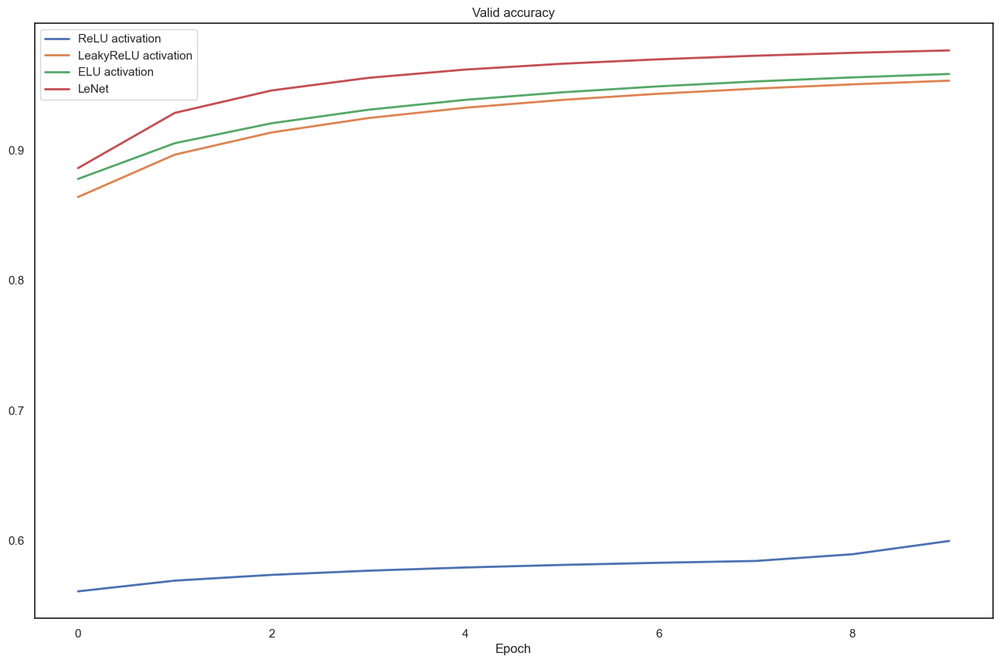

In [ ]:
plt.figure(figsize=(16, 10))
plt.title("Valid accuracy")
plt.plot(range(max_epochs), relu_accuracy, label="ReLU activation", linewidth=2)
plt.plot(range(max_epochs), leaky_relu_accuracy, label="LeakyReLU activation", linewidth=2)
plt.plot(range(max_epochs), elu_accuracy, label="ELU activation", linewidth=2)
plt.plot(range(max_epochs), lenet_accuracy, label="LeNet", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()


**Вопрос 6**
Какое `accuracy` получается после обучения с точностью до двух знаков после запятой?

**Ответ:** 0.98

# Лекция 6. Продвинутое обучение нейронных сетей
## Повторение
### Функции активации
![activation_fuctions_1](activation_functions_1.png)
### Backpropagation(метод обратного распространения ошибки)
Цепной механизм: $\frac{\partial L}{\partial x} = \frac{\partial L}{\partial z} \cdot \frac{\partial z}{\partial x}$

Бэкпроп - метод обучения нейронки.

![backprop](backprop.png)
### Стохастический градиентный спуск
СГС используется для оптимизации паратметров нейронки.

$x_{t + 1} = x_t - learning_rate \cdot dx$

![SGD_NN](SGD_NN.png)
## Оптимизаторы: улучшения СГС
Есть намного больше оптимизаторов:
- Momentum
- Adagrad
- Adadelta
- RMSprop
- Adam
- ...
- даже другие нейронки
### _**SGD**_
$L(W) = \frac{1}{N} \sum\limits^N_{i = 1}L_i(x_i, y_i, W)$

$\nabla _W L(W) = \frac{1}{N}\sum\limits^N_{i = 1}\nabla _W L_i(x_i, y_i, W)$

Оптимизация слишком больших батчей сильно кривит градиент: он становится шумным
### Первая мысль: _**momentum**_
Импульс, он же momentum, это запомненные нашей оптимизацией прошлые шаги оптимизации, которые, при их учете, дают добавку в виде своего вектора к вектору градиента

Простой SGD:

$x_{t + 1} = x_t - \alpha \nabla f(x_t)$

SGD с momentum:

$v_{t + 1} = \rho v_t + \nabla f(x_t)$

$x_{t + 1} = x_t - \alpha v_{t + 1}$

![momentum](momentum.png)
### _**Nesterov momentum**_
Как бы заглядывает в будущее: сначала считает уже накопленный импульс, потом считает градиент и двигается по векторной сумме этих векторов

![nesterov_momentum](nesterov_momentum.png)

$v_{t + 1} = \rho v_t - \alpha \nabla f(x_t + \rho v_t)$

$x_{t + 1} = x_t + v_{t + 1}$
### Сравнение momentum'ов
![contours_evaluation_optimizers](contours_evaluation_optimizers.gif)
![saddle_point_evaluation_optimizers](saddle_point_evaluation_optimizers.gif)
### Вторая мысль: разные измерения - разные, _**Adagrad**_
Идея заключается в следующем: cache - неотрицательная величина благодаря квадрату градиента. Поэтому по каждой из фичей мы можем видеть распределение разных неотрицательных величин, и если у каких то из фичей кэш околонулевой - мы понимаем, что градиент по этой фиче движется хорошо, без проблем, поэтому мы и позволим ему двигаться так и дальше. Если же у какой-то фичи кэш большой, значит, у градиента с ней трудности - он постоянно вертится из стороны в сторону, и поэтому влияние этой фичи на градиент мы ограничиваем.

Adagrad: SGD с кэшем

$cache_{t + 1} = cache_t + (\nabla f(x_t))^2$

$x_{t + 1} = x_t - \alpha \frac{\nabla f(x_t)}{cache_{t + 1} + \varepsilon}$

Но появляется другая проблема: из-за того, что кэш неустанно растет, со временем у нас падает learning rate для всех фич, из-за чего оптимизация замедляется
### _**RMSProp**_
Поэтому, для того чтобы это исправить, мы можем учитывать в большей степени последние шаги, и в принципе сделать учет шагов с экспоненциальным убыванием значимости - эффект экспоненциального сглаживания

$cache_{t + 1} = \beta cache_t + (1 - \beta)(\nabla f(x_t))^2$

$x_{t + 1} = x_t - \alpha \frac{\nabla f(x_t)}{cache_{t + 1} + \varepsilon}$
### _**Adam**_ - adaptive momentum
Объеденим две наши идеи в одну и получим Adam:

$v_{t + 1} = \gamma v_t + (1 - \gamma) \nabla f(x_t)$

$cache_{t + 1} = \beta cache_t + (1 - \beta)(\nabla f(x_t))^2$

$x_{t + 1} = x_t - \alpha \frac{v_{t + 1}}{cache_{t + 1} + \varepsilon}$
### Learning rate decay
Также есть очень полезная вещь, как learning rate decay, который заключается в экспоненциальном(зачастую) уменьшении learning rate по условию(например, по достижении какой-то эпохи), что позволяет ускорить достижения плато

![learning_rate_decay](learning_rate_decay)
## Регуляризация в DL
### Проблема переобучения
![overfitting_DL](overfitting_DL.png)
### Нормализация данных
![normalization](normalization.png)
### Нормализация батчей
Проблема:
- Возьмем любой не крайний слой
- С каждой итерацией его веса будут изменяться по бэкпропу для уменьшения функции потерь
- Тогда его входные данные тоже изменятся, какие-то - в большую сторону, какие-то - в меньшую
- Теперь нейрону нужно пере-измениться, чтобы его новые входные данные стали его входными данными

Решение:

- Нормализовывать активацию скрытых слоев: $h_i = \frac{h_i - \mu_i}{\sqrt{\sigma^2_i}}$

- Менять $\mu_i, \sigma^2_i$ изменением среднего во время обучения:

$\mu_i := \alpha \cdot mean_{batch} + (1 - \alpha) \cdot \mu_i$

$\sigma^2_i := \alpha \cdot variance_{batch} + (1 - \alpha) \cdot \sigma^2_i$

- Но затем все же нужно сделать над данными линейное преобразование, чтобы компенсировать потерю информации после нормализации:

$y_i \leftarrow \gamma \widehat{x}_i + \beta \equiv BN_{\gamma, \beta}(x_i)$
## Регуляризация
$L = \frac{1}{N}\sum\limits^N_{i = 1}\sum\limits_{j \neq y_i}max(0, f(x_i, W)_j - f(x_i, W)_{y_i} + 1) + \lambda R(W)$

Идея: добавить какой-то дополнительный член к функции потерь

Простые решения:
- $L_2$ регуляризация: $R(W) = ||W||_2^2$
- $L_1$ регуляризация: $R(W) = ||W||_1$
- Elastic Net($L_1 + L_2$): $R(W) = \beta||W||^2_2 + ||W||_1$
### Dropout
![dropout](dropout.png)

А давайте для борьбы с переобучением будем случайно занулять сигналы от нейронов. Будет хорошо!
### Аугментация данных
![augmentation](augmentation.png)

На уровне данных можно побороться с переобучением посредством подачи на вход нейросети измененных изображений: перевернутых, с измененной цветовой гаммой и т.д.

Но делать ее нужно аккуратно, она может сыграть злую шутку!

# Семинар 7. PyTorch. Батчнорм и дропаут.


In [70]:
import os

import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.notebook import tqdm

import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms, utils, datasets

sns.set(font_scale=1.4, style="whitegrid")


In [77]:
device = "mps" if torch.backends.mps.is_available() else "cpu"
device


'mps'

# Загрузка датасета


In [78]:
classes = ("plane", "car", "bird", "cat",
           "deer", "dog", "frog", "horse", "ship", "truck")

def get_dataloaders(batch_size):
    transform = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    trainset = datasets.CIFAR10(root="./data", train=True,
                                            download=True, transform=transform)
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                              shuffle=True, num_workers=2)
    testset = datasets.CIFAR10(root="./data", train=False,
                                           download=True, transform=transform)
    testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                             shuffle=False, num_workers=2)
    return trainloader, testloader


В PyTorch датасетом считается любой объект, для которого определены методы `__len__(self)` и `__getitem__(self, i)`.

# Код обучения

In [79]:
def fit(epochs, model, loss_func, opt, train_dl, valid_dl):
    train_losses = []
    val_losses = []
    valid_accuracies = []
    for epoch in range(epochs):
        model.train()
        loss_sum = 0
        for xb, yb in tqdm(train_dl):
            xb, yb = xb.to(device), yb.to(device)

            loss = loss_func(model(xb), yb)
            loss_sum += loss.item()

            loss.backward()
            opt.step()
            opt.zero_grad()
        train_losses.append(loss_sum / len(train_dl))

        model.eval()
        loss_sum = 0
        correct = 0
        num = 0
        with torch.no_grad():
            for xb, yb in tqdm(valid_dl):
                xb, yb = xb.to(device), yb.to(device)

                probs = model(xb)
                loss_sum += loss_func(probs, yb).item()

                _, preds = torch.max(probs, axis=-1)
                correct += (preds == yb).sum().item()
                num += len(xb)

        val_losses.append(loss_sum / len(valid_dl))
        valid_accuracies.append(correct / num)

    return train_losses, val_losses, valid_accuracies


In [80]:
def plot_trainig(train_losses, valid_losses, valid_accuracies):
    plt.figure(figsize=(12, 9))
    plt.subplot(2, 1, 1)
    plt.xlabel("epoch")
    plt.plot(train_losses, label="train_loss")
    plt.plot(valid_losses, label="valid_loss")
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.xlabel("epoch")
    plt.plot(valid_accuracies, label="valid accuracy")
    plt.legend()


In [81]:
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        # 1 input image channel, 6 output channels, 3x3 square conv kernel
        self.conv1 = nn.Conv2d(3, 6, 3)
        self.conv2 = nn.Conv2d(6, 16, 3)
        self.fc1 = nn.Linear(16 * 6 * 6, 120)  # 5x5 image dimension
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = x.view(x.shape[0], -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

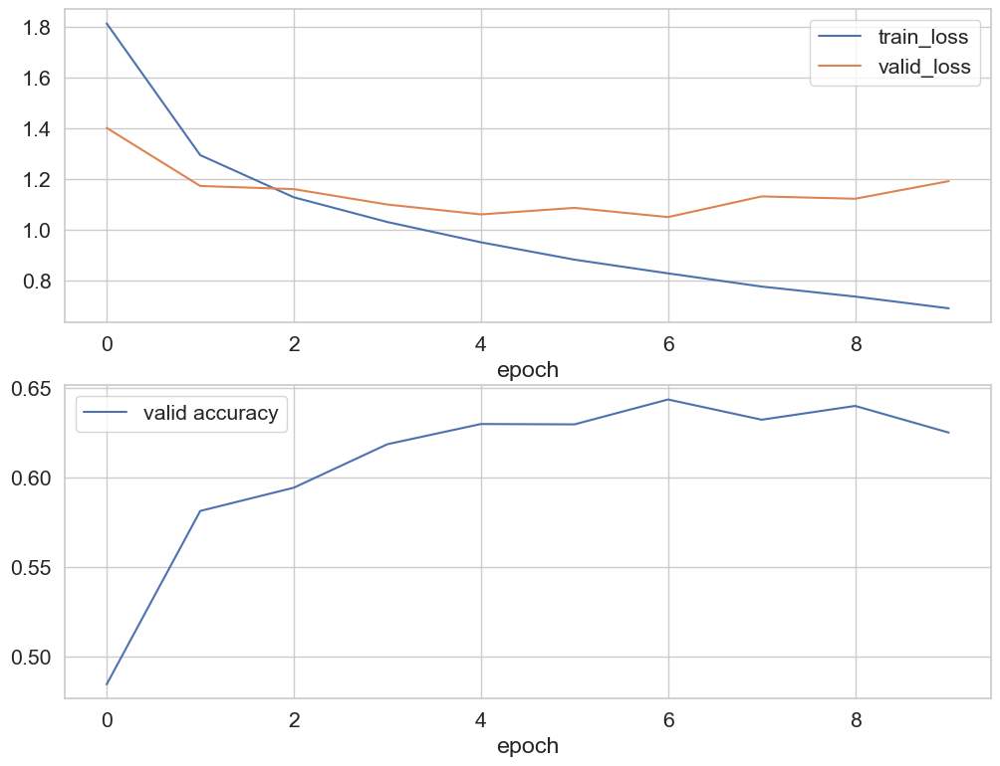

In [82]:
model = Model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

info = fit(10, model, criterion, optimizer, *get_dataloaders(4))
plot_trainig(*info)


# BatchNorm
Ранее мы обсуждали, что для линейных моделей очень важно нормировать признаки перед подачей на вход. Когда мы работаем с нейронными сетями мы тоже нормируем вход, но есть ли какой-то способ нормировать признаки на внутренних слоях нейроной сети?

Да, существует несколько метдов нормировки признаков (BatchNorm, LayerNorm, InstanceNorm, etc). Научимся применять BatchNorm.


### BatchNorm, математика

Если коротко, то BatchNorm для каждого признака вычитает среднее значение по батчу и делит на стандартное отклонение по батчу, потом домножает все признаки на вес $\gamma$ и прибавляет вес $\beta$. При этом возникает вопрос, что если мы используем модель уже для предсказаний и можем запускать ее только на одном примере.

BatchNorm работает по разному во время обучения и предсказний:


**Во время обучения**. Пусть батч состоит из $\mathbf{x_i}$ (каждый $\mathbf{x_i}$ - вектор, подающийся на вход). Тогда
$$\begin{aligned}
\mu_{\mathcal{B}} & \leftarrow \frac{1}{m} \sum_{i=1}^{m} x_{i} \\
\sigma_{\mathcal{B}}^{2} & \leftarrow \frac{1}{m} \sum_{i=1}^{m}\left(x_{i}-\mu_{\mathcal{B}}\right)^{2} \\
\widehat{x}_{i} & \leftarrow \frac{x_{i}-\mu_{\mathcal{B}}}{\sqrt{\sigma_{\mathcal{B}}^{2}+\epsilon}} \\
y_{i} & \leftarrow \gamma \widehat{x}_{i}+\beta \equiv \mathrm{B} \mathrm{N}_{\gamma, \beta}\left(x_{i}\right)
\end{aligned}$$

**Во время предсказания**. Мы делаем то же самое, но у нас нет батча. Поэтому в качестве $\mu_{\mathcal{B}}$ и $\sigma_{\mathcal{B}}$ мы используем среднее и стандартное отклонение признака во всем датасете. Обычно нам не хочется после обучения еще раз применять сеть ко всем примерам из обучающего датасета, чтобы вычислить эти статистики и мы вместо них используем экспоненциально затухающее среднее последних батчей.

### BatchNorm, что он дает?

* Более быстрое обучение. Болшие learning_rate"ы.
* Обучение более глубоких сетей.
* Регуляризация.
* Повышение точности моделей.

### BatchNorm для Conv слоев

Для сверточных слоев мы хотим следующее свойство "если в разных частях картинки находятся одинаковые наборы пикселей, то соответствующие выходы сверточного слоя будут одинаковыми". Если бы мы применяли алгоритм, который описан выше, то получилось бы так, что для пикселей, находящихся в 1 канале в координате (1,1) среднее и стд могли бы получиться не такими же как для пикселя в 1 канале в координате (10, 10). Тогда даже если изначально в них были одинаковые значения, то после BatchNorm они стали бы разными. 

Есть простое решение проблемы. Мы будем усреднять не только по batch_size координате, но и height, width координатам. Чтобы лучше объяснить используем псевдокод (origin https://stackoverflow.com/questions/38553927/batch-normalization-in-convolutional-neural-network):

На вход подается тензор (многомерный массив) размера [B, H, W, C]. Где B - количество батчей, H - высота картинок, W - ширина картинок, а C - количество каналов. Тогда обычный батчнорм выполнял бы нормирование так:
```python
# t is the incoming tensor of shape [B, H, W, C]
# mean and stddev are computed along 0 axis and have shape [H, W, C]
mean = mean(t, axis=0)
stddev = stddev(t, axis=0)
for i in 0..B-1:
  out[i,:,:,:] = norm(t[i,:,:,:], mean, stddev)
```

В то время как батчнорм для сверточных сетей (BatchNorm2D в PyTorch):

```python
# t is still the incoming tensor of shape [B, H, W, C]
# but mean and stddev are computed along (0, 1, 2) axes and have just [C] shape
mean = mean(t, axis=(0, 1, 2))
stddev = stddev(t, axis=(0, 1, 2))
for i in 0..B-1, x in 0..H-1, y in 0..W-1:
  out[i,x,y,:] = norm(t[i,x,y,:], mean, stddev)
```

### BatchNorm, порядок применения

В оригинальной статье (http://static.googleusercontent.com/media/research.google.com/en//pubs/archive/43442.pdf) для сверточных слоев батчнорм предлагают использовать сразу после свертки до активации. Я не смог найти статей, которые бы исследовали, нужно ли делать BN до или после активации, и, похоже, однозначного мнения нет + в более сложных архитектурах (ResNet"ы) исследователи обычно экспериментируют и ставят BN в разные места.

### BatchNorm, PyTorch

In [83]:
class ModelBatchNorm(nn.Module):
    def __init__(self):
        super(ModelBatchNorm, self).__init__()
        # 1 input image channel, 6 output channels, 3x3 square conv kernel
        self.conv1 = nn.Conv2d(3, 6, 3)
        self.bn1 = nn.BatchNorm2d(6)
        self.conv2 = nn.Conv2d(6, 16, 3)
        self.bn2 = nn.BatchNorm2d(16)
        self.fc1 = nn.Linear(16 * 6 * 6, 120)  # 5x5 image dimension
        self.bn3 = nn.BatchNorm1d(120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.bn1(F.max_pool2d(F.relu(self.conv1(x)), (2, 2)))
        x = self.bn2(F.max_pool2d(F.relu(self.conv2(x)), 2))
        x = x.view(x.shape[0], -1)
        x = self.bn3(F.relu(self.fc1(x)))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

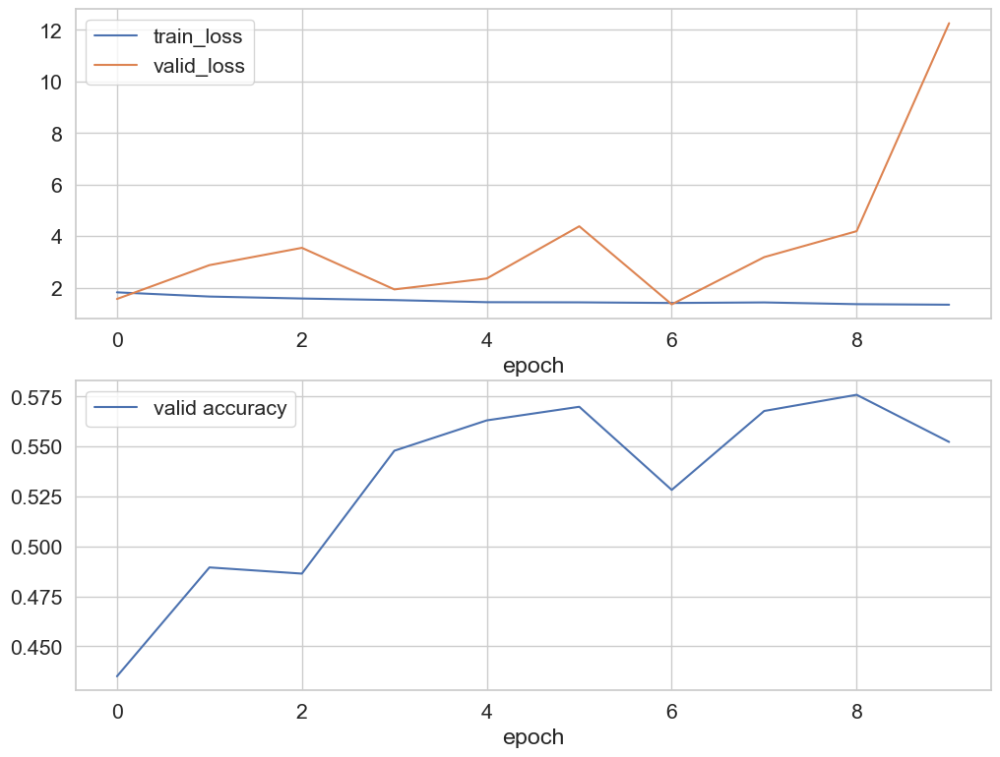

In [84]:
model = ModelBatchNorm().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

info = fit(10, model, criterion, optimizer, *get_dataloaders(4))
plot_trainig(*info)


Вспомните как выглядели формулы для BatchNorm: если размер батча равен 1, то $\sigma = 0$, и у нас есть деление на ноль. PyTorch не умеет обрабатывать такой случай и падает:

In [85]:
model = ModelBatchNorm().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

fit(1, model, criterion, optimizer, *get_dataloaders(batch_size=1))


Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/50000 [00:00<?, ?it/s]

ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 120])

# Dropout

Дропаут это еще один необычный слой, который используется в нейронных сетях. У него есть один гиперпараметр $p$.

Идея дропаута состоит в том, что во время обучения мы зануляем случайную часть входа и отдаем вход дальше (для каждого числа мы подбрасываем монетку и с вероятностью $p$ зануляем это число). 

Дропаут позволяет тренировать более устойчивые сети и избегать переобучения. 

### Dropout, механика работы.

Как мы сказали выше, dropout зануляет случайную часть входов и отдает их дальше. Допустим $p=0.5$ (достаточное популярное значение). Тогда мы просто убираем половину всего входа! Такое сильное воздействие явно плохо повлияет на качество нашей модели, поэтому мы делаем зануление только во время обучения.

**Во время обучения**: для каждого числа во входе подбрасываем монетку и зануляем его с вероятностью $p$. Выход умножаем на $\frac{1}{1-p}$, чтобы дисперсия выходов осталось такой же, как и на входе.

**Во время предсказаний**: ничего не делаем).

### Dropout, что дает?

* Сеть выучивает более устойчивые представления на внутренних слоях.
* Сильно увеличивает число итераций, которые нужны для сходимости.
* Можно получить интерпретацию, которая говорит, что дропаут усредняет выходы большо числа нейросетей с $p|W|$ нейронами на предыдущем слоев. 

Дропаут вызывает интересный эффект: в начале обучения качество на тестовом датасете выше, чем на обучающем. Потому что для обучающего датасета у нас есть зануление, которое сильно портит предсказания.

### Dropout, взаимодействие с BatchNorm.

Статья, исследующая, почему исопльзование дропаута и батчнорма вместе часто ведет к более плохим результатам, чем их использование по-отдельности - https://arxiv.org/pdf/1801.05134.pdf

Картинка из статьи, объясняющая проблему:
![img](https://media.arxiv-vanity.com/render-output/3934414/x1.png)

(Если совсем коротко, то при наличии дропаута во время обучения и во время предсказаний выходы дропаута имеют разное распределение. Поэтому статистики, которые batchnorm считает для применения во время предсказаний, оказываются неверными.)

Решение: если вы хотите использовать батчнорм и дропаут в одной сети, то все Dropout"ы должны идти после BatchNorm"ов.

### Dropout, PyTorch

В PyTorch есть `F.dropout(x, p=p)` и слой `nn.Dropout(p=p)`. В чем их отличие? `F.dropout(x, p=p)` не будет изменять свое поведение в заивимости от того, в каком стостянии сейчас модель (train, eval).

Теперь чуть подробнее:

Когда вы вызываете model.train()/model.eval() PyTorch проходится по всем переменным класса и если видит там наследника nn.Module или nn.ModuleList, то также меняет состояние для всех найденных модулей. Т.е. версия со слоем будет автоматически работать с train/eval состяниями. 

In [86]:
class ModelDropout(nn.Module):
    def __init__(self):
        super(ModelDropout, self).__init__()
        # 1 input image channel, 6 output channels, 3x3 square conv kernel
        self.conv1 = nn.Conv2d(3, 6, 3)
        self.conv2 = nn.Conv2d(6, 16, 3)
        self.fc1 = nn.Linear(16 * 6 * 6, 120)  # 5x5 image dimension
        self.dropout = nn.Dropout(p=0.3)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = x.view(x.shape[0], -1)
        x = self.dropout(F.relu(self.fc1(x)))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

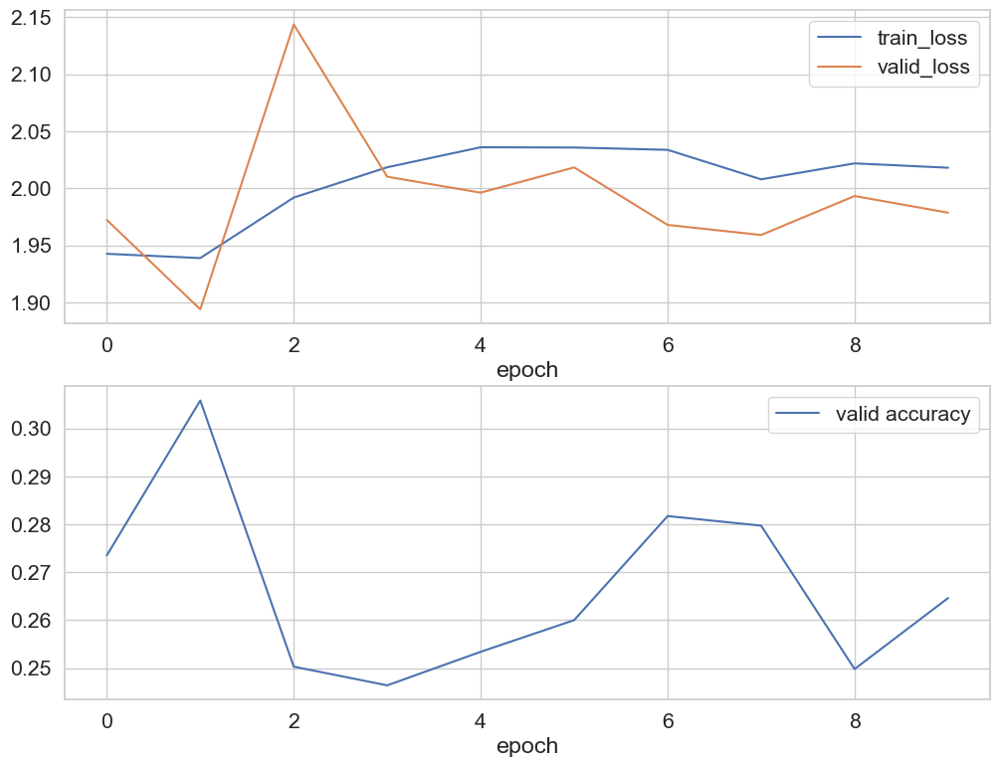

In [89]:
model = ModelDropout().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.5)

info = fit(10, model, criterion, optimizer, *get_dataloaders(4))
plot_trainig(*info)


# PyTorch. Оптимизаторы.


In [90]:
! pip install tqdm


In [91]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, datasets
from tqdm.notebook import tqdm


In [92]:
device = "mps" if torch.backends.mps.is_available() else "cpu"
device


'mps'

# Загрузка датасета


In [93]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

def get_dataloaders(batch_size):
    transform = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    trainset = datasets.CIFAR10(root='./data', train=True,
                                            download=True, transform=transform)
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                              shuffle=True, num_workers=2)
    testset = datasets.CIFAR10(root='./data', train=False,
                                           download=True, transform=transform)
    testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                             shuffle=False, num_workers=2)
    return trainloader, testloader


В PyTorch датасетом считается любой объект, для которого определены методы `__len__(self)` и `__getitem__(self, i)`.

# Код обучения

In [94]:
def fit(epochs, model, loss_func, opt, train_dl, valid_dl):
    train_losses = []
    val_losses = []
    valid_accuracies = []
    for epoch in range(epochs):
        model.train()
        loss_sum = 0
        for xb, yb in tqdm(train_dl):
            xb, yb = xb.to(device), yb.to(device)
            loss = loss_func(model(xb), yb)
            loss_sum += loss.item()

            loss.backward()
            opt.step()
            opt.zero_grad()
        train_losses.append(loss_sum / len(train_dl))

        model.eval()
        loss_sum = 0
        correct = 0
        num = 0
        with torch.no_grad():
            for xb, yb in valid_dl:
                xb, yb = xb.to(device), yb.to(device)
                probs = model(xb)
                loss_sum += loss_func(probs, yb).item()

                _, preds = torch.max(probs, axis=-1)
                correct += (preds == yb).sum().item()
                num += len(xb)

        val_losses.append(loss_sum / len(valid_dl))
        valid_accuracies.append(correct / num)

    return train_losses, val_losses, valid_accuracies


In [95]:
def plot_trainig(train_losses, valid_losses, valid_accuracies):
    plt.figure(figsize=(12, 9))
    plt.subplot(2, 1, 1)
    plt.xlabel('epoch')
    plt.plot(train_losses, label='train_loss')
    plt.plot(valid_losses, label='valid_loss')
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.xlabel('epoch')
    plt.plot(valid_accuracies, label='valid accuracy')
    plt.legend()


In [96]:
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        # 1 input image channel, 6 output channels, 3x3 square conv kernel
        self.conv1 = nn.Conv2d(3, 6, 3)
        self.conv2 = nn.Conv2d(6, 16, 3)
        self.fc1 = nn.Linear(16 * 6 * 6, 120)  # 5x5 image dimension
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = x.view(x.shape[0], -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

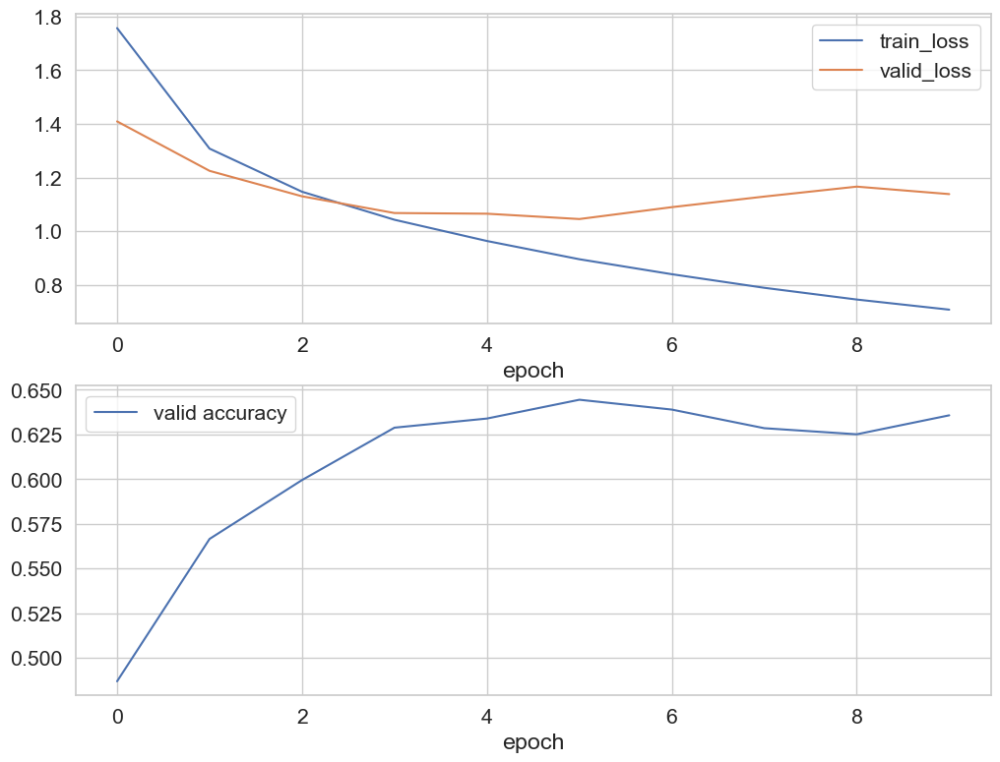

In [97]:
model = Model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

info = fit(10, model, criterion, optimizer, *get_dataloaders(4))
plot_trainig(*info)


# Adam

Это самый популярный оптимизатор для нейронных сетей. Если вам интересны сравнения разных алгоритмов, то можете почитать эту статью https://arxiv.org/abs/1609.04747.

### Adam, применение в PyTorch

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

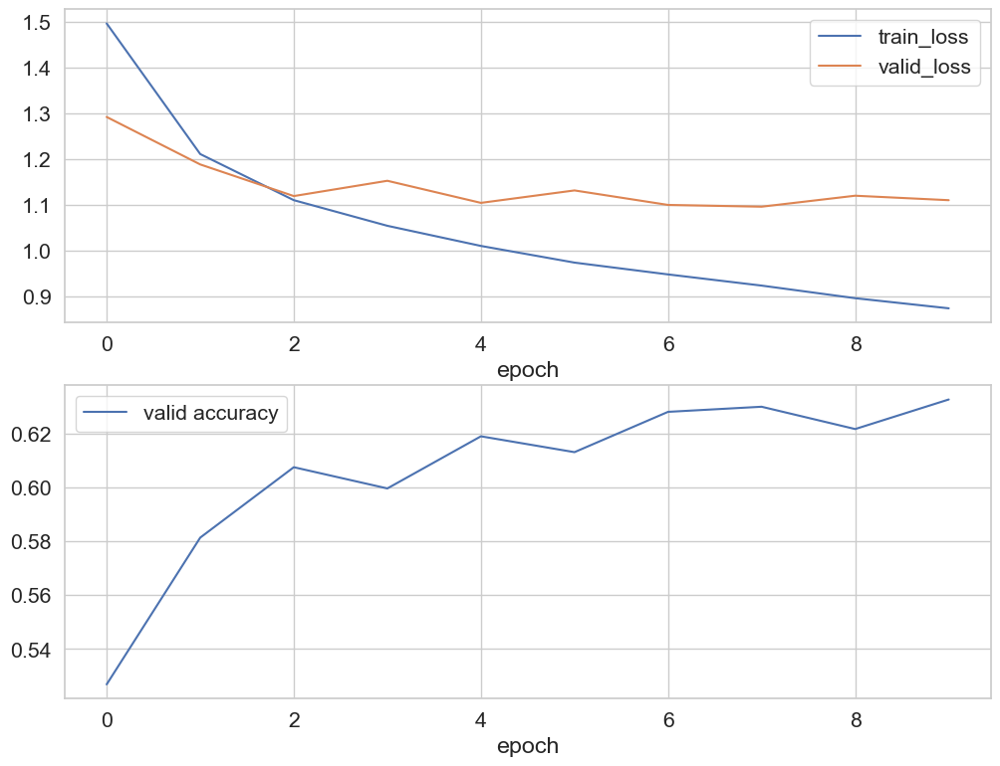

In [98]:
model = Model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))

info = fit(10, model, criterion, optimizer, *get_dataloaders(4))
plot_trainig(*info)


# Weight Decay

Для регуляризации линейных моделей мы прибавляли к лоссу сумму квадратов весов, умноженных на некоторый коэффициент:
$$L(\mathbf{w})=\sum_{i=1}^{l}\left(\mathbf{x}_{i}^{T} \mathbf{w}-y_{i}\right)^{2}+\beta \sum_{j=1}^{n} w_{j}^{2}$$

Для нейронных сетей мы можем выбрать такую же реугляризацию. Она называется WeightDecay. Во многие оптимизаторы можно передать параметр `weight_decay` и он будет являться коэффициентом, на который домножается сумма квадратовв весов.

Обычно используют weight_decay=0.01 или 0.005.

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

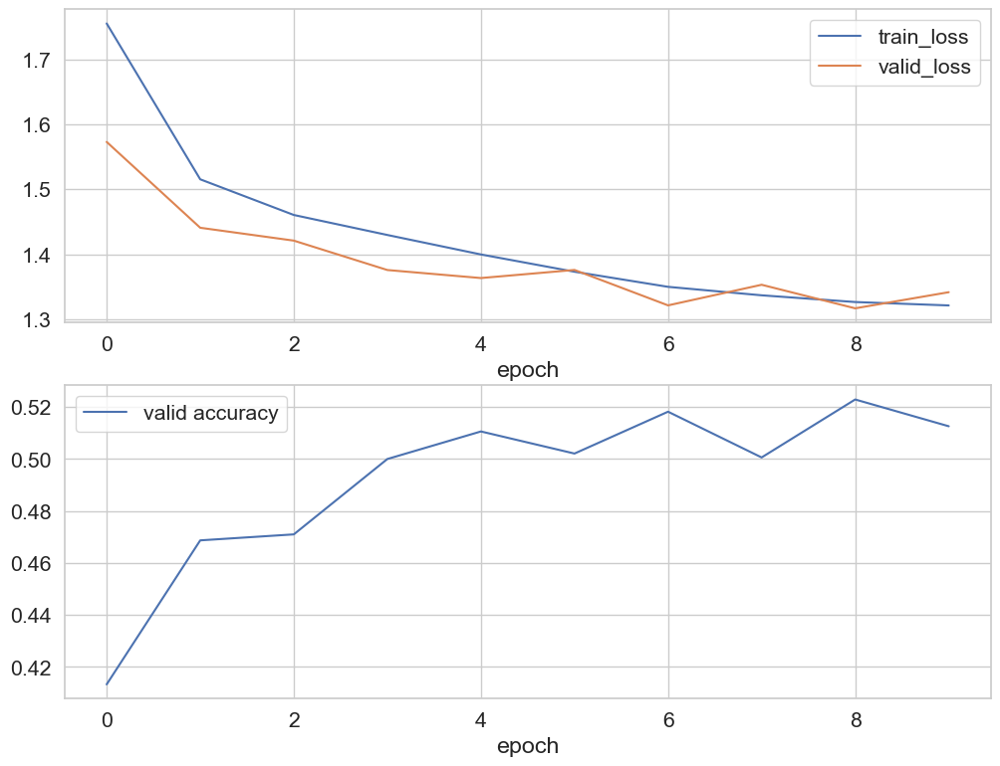

In [99]:
model = Model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), weight_decay=0.01)

info = fit(10, model, criterion, optimizer, *get_dataloaders(4))
plot_trainig(*info)


# LR scheduling

Часто мы хотим, чтобы наш learning rate как-то изменялся во время обучения. Стратегия, по которой мы будем изменять lr называется lr scheduilng.

Например, мы можем хотеть, чтобы learning_rate уменьшался с каждой эпохой в фиксированное число раз. Тогда в начале мы будем быстро двигаться к минимуму, а в конце точно не промахнемся мимо него за счет малых шагов. Такая стратегия называется LR Decay.
![](https://www.deeplearningwizard.com/deep_learning/boosting_models_pytorch/images/lr2.png)

(Слева используется lr decay, справа нет. Слева мы можем не подбирать идеально точно lr и все равно со временем сойтись.)

Нам нужно немного изменить train loop

In [104]:
def fit(epochs, model, loss_func, opt, train_dl, valid_dl, lr_sched=None):
    train_losses = []
    val_losses = []
    valid_accuracies = []
    for epoch in range(epochs):
        model.train()
        loss_sum = 0
        for xb, yb in tqdm(train_dl):
            xb, yb = xb.to(device), yb.to(device)
            loss = loss_func(model(xb), yb)
            loss_sum += loss.item()

            loss.backward()
            opt.step()
            opt.zero_grad()
        train_losses.append(loss_sum / len(train_dl))

        model.eval()
        loss_sum = 0
        correct = 0
        num = 0
        with torch.no_grad():
            for xb, yb in valid_dl:
                xb, yb = xb.to(device), yb.to(device)
                probs = model(xb)
                loss_sum += loss_func(probs, yb).item()

                _, preds = torch.max(probs, axis=-1)
                correct += (preds == yb).sum().item()
                num += len(xb)

        val_losses.append(loss_sum / len(valid_dl))
        valid_accuracies.append(correct / num)

        # CHANGES HERE
        if lr_sched is not None:
            lr_sched.step()
        # CHANGES END

    return train_losses, val_losses, valid_accuracies


Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/12500 [00:00<?, ?it/s]

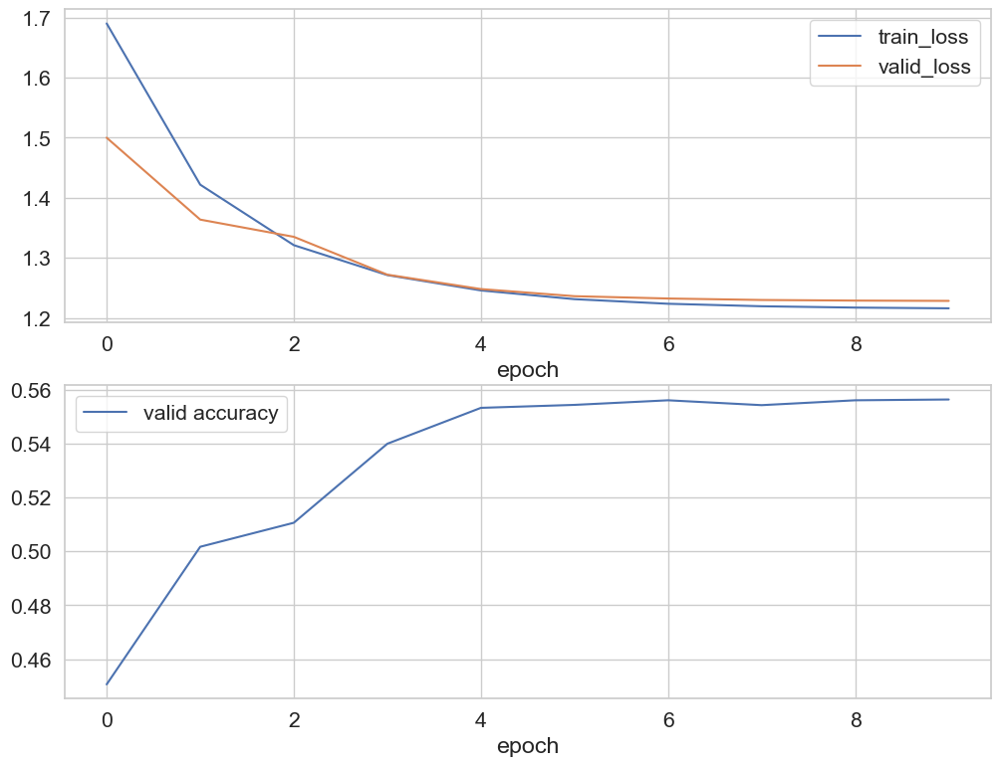

In [105]:
model = Model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), weight_decay=0.01)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.5)

info = fit(10, model, criterion, optimizer, *get_dataloaders(4), scheduler)
plot_trainig(*info)


# Чекпоинтинг.

Есть очень хорошее официальное руководство: https://pytorch.org/tutorials/beginner/saving_loading_models.html.

# Лекция 7. Архитектура CNN. Transfer Learning
## Архитектура CNN
### AlexNet
Главные достижения:
- ReLU вместо Tanh
- Parallel training на нескольких GPU
- Data Augmentation
### AlexNet --> VGG
- Conv слои 3*3 (receptive field) - меньше, чем у AlexNet, что позволяет детектировать более низкоуровневые паттерны
- 3 FC слоя:

![vgg](vgg.png)
### Затухание градиентов
![gradient_falling](gradient_falling.png)
![gradient_fall_1](gradient_fall_1.png)
![gradient_fall_2](gradient_fall_2.png)
### Skip Connection
![skip_connection](skip_connection.png)
![skip_connection_1](skip_connection_1.png)
![skip_connection_2](skip_connection_2.png)
![skip_connection_3](skip_connection_3.png)
![skip_connection_4](skip_connection_4.png)

- Используется чаще всего в CNN(включая ResNet)
- Помогает в борьбе с затуханием градиентов
- Помогает "протолкнуть" в нижние слои сети информацию из верхних слоев
### ResNet: CNN + skip connection
Варианты ResNet Residual blocks

![skip_connection_5](skip_connection_5.png)
### ResNet
![res_net](res_net.png)
![res_net_1](res_net_1.png)

Интересный факт: из ResNet можно выкинуть несколько слоев и ее performance снизится не слишком сильно. Это достигается тем, что у ResNet есть "обходные пути" для информации(skip connection), и при прерывании одного из них информация все еще может пройти по-другому.

![res_net_2](res_net_2.png)
### DenseNet
DenseBlock:

Каждый последующий слой сети получает на вход все выходы всех предыдущих сетей

Dense Block с growth rate = 4:

BN-relu-3*3 conv

![dense_net](dense_net.png)
![dense_net_1](dense_net_1.png)
### Преимущества DenseNet
- Незатухающий поток градиента
- Количество слоев и параметров не очень большое
- Conv слои выделяют более разнообразные фичи
- Нижние conv слои принимают во внимание low-complex паттерны из более верхниъ слоев, которые могут быть полезны для детекции некоих low-level паттернов. Также это помогает DenseNet лучше обучаться на маленьких датасетах.
### Bottleneck Block
ResNet и DenseNet состоят из блоков.

Блоки, конечно, могут иметь разную архитектуру, но только ту, что мы рассматривали выше

![bottleneck_block](bottleneck_block.png)
### Inception
Идея: сделать несколько сверточных слоев с разными размерами фильтров на одном уровне.

![inception](inception.png)
### GoogleNet(Inception)
![google_net_1](google_net_1.png)
## Transfer Learning
Часто датасет под какую-либо задачу для обучения сети содержит мало объектов. И если обучать сеть на этом датасете с нуля, сеть переобучится

Пример: медицинские датасеты изображений опухолей, машинний перевод с малораспространенных языков и т.д.

Идея: использовать знания, полученные другими сетями на похожих задачах.

![transfer_learning](transfer_learning.png)
### Дообучение сети(Fine-tuning)
![fine_tuning](fine_tuning.png)
![fine_tuning_1](fine_tuning_1.png)
![fine_tuning_2](fine_tuning_2.png)
![fine_tuning_3](fine_tuning_3.png)
![fine_tuning_4](fine_tuning_4.png)
### Заморозка слоев
![freezing_layers](freezing_layers.png)

Мы можем выбирать, какие слои замораживать и какие слои заменять.

Можно заморозить 10 первых слоев, тренировать 5 оставшихся, среди которых будут 2 новых слоя.
### Fine-tuning
- Замораживаются верхние(первые) слои сети, нижние дообучаются. Верхние слои выделяют _**низкоуровневую информацию**_, и они научились хорошо это делать при предобучении. Нижние слои выделяют из информации, полученной из верхних слоев, _**специфическую для задачи информацию**_, поэтому их нужно дообучать
- Сколько слоев замораживать, зависит от различия между датасетами, сложности задачи и объема датасета для дообучения.
- Чем больше в target задаче тренировочных данных и чем сильнее source и target задачи отличаются между собой, тем больше слоев нужно дообучать.

![fine_tuning_5](fine_tuning_5.png)
![fine_tuning_6](fine_tuning_6.png)
### Transfer Learning
![transfer_learning_1](transfer_learning_1.png)

Понятия Transfer Learning, Domain Adaptation и Multi-task Learning часто используются в одном контексте

1. $D_S \neq D_T$
Пространства признаков двух доменов - разные.

Пример:

В NLP два датасета текстов на двух разных языках.

2. $P(D_S) \neq P(D_T)$
Распределения признаков в двух доменах - разные. Такой TL называется _**Domain Adaptation**_

Пример:

Датасет ревью на фильмы на Кинопоиске и датасет ревью на мобильные приложения в Google Play. И там, и там задача - предсказать оценку ревью

3. $Y_S \neq Y_T : P(Y_S|D_S) \neq P(Y_T|D_T)$

Пример:

Датасет лиц людей.

Задача 1: классификация лиц по половому признаку

Задача 2: классификация лиц по расовому признаку

_**Разные домены:**_ задача одна и та же: классификация изображений цифр на 10 классов

Домены(распределения $D_S$ и $D_T$) - разные

![domens](domens.png)

_**Разные задачи:**_ есть различия в лейблах: либо они вообще разные, либо различны условные распределения на лейблы: $P(Y_S|D_S) \neq P(Y_T|D_T)$

![goals](goals.png)

4. Supervised / Unsupervised
Есть ли лейблы у $D_T$

Пример:

Датасет лиц людей.

$D_S$: размеченные лица по id

$D_T$: размеченные лица людей из другой части мира
### Transfer Learning Ideas
Когда нейронная сеть обучается, она учится выделять из объектов inter-domain и intra-domain информацию.

inter-domain: расположение элементов на лице, выражения лиц

intra-domain: цвет лица, широта глаз

Как же перенести только нужные знания сети(inter-domain) на новый домен?
### Идея 1: Fine-tuning
![fine_tuning_4](fine_tuning_4.png)
### Идея 2: Учить две задачи одновременно
![two_tasks](two_tasks.png)
![two_tasks_1](two_tasks_1.png)
### Transfer Learning: extreme cases
![extreme_cases](extreme_cases.png)
### Transfer Learning is a new black
Почему Transfer Learning становится все более популярным?
- Все больше задач в индустрии, которые хочется решать с помощью deep learning, но данных в принципе мало
- Зато симулировать мы можем очень много данных!

Но у симулированных данных $P(D_S) \neq P(D_T)$, поэтому это случай, когда нужен transfer learning

# Семинар 8. Transfer Learning

Как Вы уже знаете (если не знаете, рекомендуем посмотреть [5-ую](https://www.youtube.com/watch?v=cAJp2hh-_q8&t=4831s) и [6-ую](https://www.youtube.com/watch?v=RVk2RUW9Euk&t=40s) лекции нашего курса), в современных задачах обработки изображений, будь то задача обнаружения объектов, задача распознавания образов, задача (семантической) сегментации, задача классификации изображений и другие, всё чаще используют **свёрточные нейросети** (*Convolutional Neural Networks*, *CNN*).

Они показывают очень хорошие результаты, за ними стоит как [математический аппарат](https://stats.stackexchange.com/questions/269854/are-there-mathematical-reasons-for-convolution-in-neural-networks-beyond-expedie), так и эвристики, полученные опытным путём.

В данном задании Вам предстоит познакомиться с архитектурами *AlexNet*, *VGG* и *Inception* и для каждой из этих моделей использовать технику **Transfer Learning**.  

* **Transfer Learning** - это процесс дообучения на **новых данных** какой-либо нейросети, уже обученной до этого на других данных, обычно на каком-нибудь хорошем, большом (миллионы картинок) датасете (например, [ImageNet](http://www.image-net.org/) ~ 14 млн картинок).

<h2 style="text-align: center;"><b>VGG</b></h3>


<h2 style="text-align: center;"><b>Inception v1</b></h3>

<h2 style="text-align: center;"><b>Transfer Learning</b></h3>

Теперь мы перейдем к тому, как можно использовать уже обученные нейросети, чтобы ускорить свою работу.

Давайте вспомним общую архитектуру CNN:

<img src="https://drive.google.com/uc?id=14pApKqQjnmWMXazY0HHjREn9rI9uwCQg">

С помощью операций *свёртки (convolution)* и *пулинга (pooling)* всё, что расположено до этапа *classification*, по сути **извлекает признаки из объектов, подающихся на вход** (картинок, в данном случае). То есть вместо того, чтобы самим пытаться как-то описать картинки для хорошей работы классификатора, мы предоставляем заняться этим нейросети (обучая её методом обратного распространения ошибки ([лекция 4](https://www.youtube.com/watch?v=HZDOhHAg5_g))).

**Вопрос (творческий):**  А какие признаки для картинок приходят Вам в голову? (считать, что картинки цветные (3 канала), все одинакового размера)

**Ответ:** <Ваши мысли>

<h2 style="text-align: center;"><b>Описание метода</b></h3>

Представим теперь, что eсть свой набор данных, и Вы хотите научить сеть классифицировать объекты из Вашей выборки.  
Есть 4 возможных подхода к задаче:

* **1. Написать свою собственную нейронную сеть**
    * Если Вас зовут не Ian Godfellow, Geoffry Hinton или Andrew Ng, то не рекомендуется пользоваться этим способом
    * May the force be with You

* **2. CNN как средство для извлечения признаков (Feature Extractor)** 
    * Берём сетку, обученную на ImageNet 
    * Убираем последние Fully-Connected слои сети, отвечающие за классификацию. Веса предыдущих слоёв **заморожены**, мы их не трогаем. Теперь сеть выдаёт не метки классов, а то, что поступало на вход Fully-Connected (развёрнутый в строку "параллелепипед" HxWxNUM_FILTERS с последнего слоя перед FC)
    * Запускаем сеть на новом датасете, получаем выходы сети для всех объектов - это и есть их признаки, полученные сетью
    * Обучаем на этих признаках какой-либо классификатор (свою Fully-Connected сеть, например)
    * Теперь у нас есть сеть, работающая хорошо на нашем датасете

* **3. CNN, которую можно дообучить (Fine Tuning)**  
    * Берём сетку, обученную на ImageNet  
    * Убираем последние Fully-Connected слои сети, отвечающие за классификацию.  
    * Теперь всё же *распространяем backpropagation ещё на сколько-то слоёв назад (размораживаем веса в этих слоях)*, чтобы скорректировать их под новые данные. Можно распространить обучение и на всю сеть, но часто первые слои всё же замораживают, поскольку они (как ожидается) извлекают более общие признаки. А ещё обучать всю сеть всё же дольше, чем несколько слоёв. Всё зависит от того, какого качества Вы хотите добиться
    * Теперь сеть выдаёт не метки классов, а то, что поступало на вход Fully-Connected (веса последних (или всех) слоёв были изменены под наши данные)
    * Обучаем на этих признаках какой-либо классификатор (свою Fully-Connected сеть, например)
    * Теперь у нас есть сеть, работающая хорошо на нашем датасете

* **4. Использовать предобученную модель "из коробки"**  
    * То есть взять уже готовую нейронную сеть и использовать её (её параметры (W, b..), ведь сеть характеризуется параметрами, если архитектура известна) для решения своей задачи. Например, [здесь](https://github.com/BVLC/caffe/wiki/Model-Zoo) люди часто выкладывают веса моделей, обученных для решения их специфических задач.  


В зависимости от количества и природы Ваших данных есть выбор из **нескольких стратегий Transfer Learning**, а именно:

* *У Вас **мало данных** ($\le$ 10k), и они **похожи** на данные, на которых была обучена сеть до этого*  
Если данные совсем похожи, можно попробовать использовать готовую модель. Если качество Вас не устраивает, то тогда стоит использовать CNN для извлечения признаков и обучить свой классификатор на этих данных (2-ой способ выше). Так как данные похожи на те, на которых обучалась сеть, то высокоуровневые признаки, полученные с помощью последних слоёв сети, должны оказаться информативными. Если делать в этом случае Fine-Tuning (3 способ), то сеть может переобучиться, поскольку данных мало.
* *У Вас **мало данных** ($\le$ 10k), и они **не похожи** на данные, на которых была обучена сеть до этого*  
Самый невыгодный случай. Здесь мы не можем ожидать от сети, что выходы последних слоёв будут информативными для новых данных. Следует также действовать в соответствие со 2-ым способом, но брать как признаки выходы более ранних слоёв, ведь, как мы помним, они (как ожидается) соответствуют более общим паттернам в данных.
* *У Вас **много данных** ($\ge$ 10k), и они **похожи** на данные, на которых была обучена сеть до этого*  
В этом случае можем смело делать Fine-Tuning (3 способ) (если не устроило качество модели "из коробки"), ведь данных много, и вероятность переобучения меньше. В данном случае имеет смысл попробовать разморохить веса последних нескольких слоёв (зависит от того, сколько у Вас времени и вычислительной мощности, можно разморозить и всю сеть)
* *У Вас **много данных** ($\ge$ 10k), и они **не похожи** на данные, на которых была обучена сеть до этого*
В принципе, подход тот же, что и в случае похожих данных, то есть мы файнтюним практически всю нейросеть. Однако мы вольны в этом случае полнстью менять все параметры (и гиперпараметры) нейросети, ведь по сути мы пользуемся только её архитектурой, забывая о том, что она уже была когда-то обучена. Но часто веса предобученной сети оставляют в качестве инициализации для обучения на новых данных.

Надеемся, что теперь Вам стало понятнее, как обучать крутые сети на новых данных.

<h2 style="text-align: center;"><b>Переходим к практике</b></h3>


<p style="text-align: center;"><i>(основано на http://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html)</i></p>

In [1]:
import os
from tqdm.autonotebook import tqdm, trange

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time


/var/folders/l9/88y_46d53y3cy1jh1h6qdg0c0000gn/T/ipykernel_34546/298286526.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


### В чём состоит задание

Вам предстоит попробовать использовать  типа архитектур свёрточных нейросетей - **AlexNet (сделано за Вас в примере), VGG16, Inception_v3** - как *Feature Extractor*, с помощью *Fine Tuning* и *"из коробки"*. 

**Для каждого пункта нужно:**
- вывести график loss'а на обучающей и на валидационной выборке
- вывести качество модели (accuracy)

### Данные  

В данном задании используются сети (из библиотеки **torchvision**), предобученные на датасете ImageNet.  
В качестве новых данных будет датасет Меравьи vs Пчёлы, Вам нужно скачать его отсюда: **[Муравьи vs Пчёлы](https://download.pytorch.org/tutorial/hymenoptera_data.zip)**, *являющийся частью датасета ImageNet*. В нём 400 картинок, ~250 обучение и ~150 валидация (тест).

### Функции для отрисовки и обучения модели:

* Загрузим данные:

In [31]:
# Преобразование обучающих данных для расширения обучающей выборки и её нормализация
# Для валидационной (тестовой) выборки только нормализация
device = "mps" if torch.backends.mps.is_available() else "cpu"
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(244),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(244),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
# папка с данными. Если запускаете в колабе, нужно скопировать данные к себе в директорию и примонтировать диск. Если запускаете локально -- просто скачайте данные
data_dir = '/Users/dadaya/Desktop/progs/DLS/data/hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
# специальный класс для загрузки данных в виде батчей
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                              shuffle=True, num_workers=2)
               for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()
use_gpu


False

Размеры обучающей и валидационной выборок:

In [3]:
print(dataset_sizes)


{'train': 244, 'val': 153}


**Вопрос (на понимание кода выше):**  
1. В DataLoader() выше стоит "shuffle=True". Для чего это нужно?
2. Сколько картинок будет в каждом батче?

**Ответ:** <Ваш ответ>

* Посмотрим на картинки из датасета:

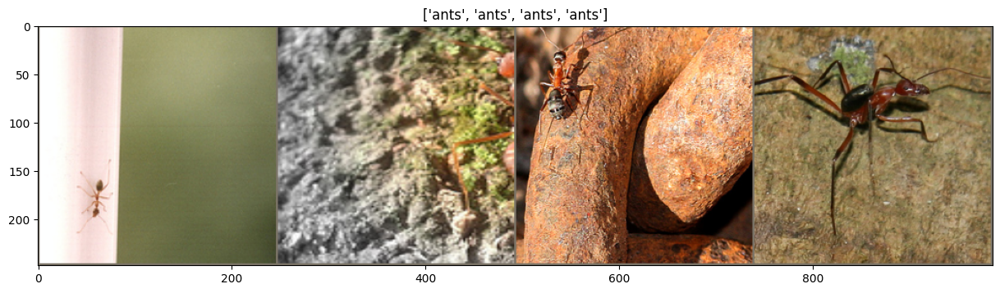

In [4]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


# Получим 1 батч (картнки-метки) из обучающей выборки
inputs, classes = next(iter(dataloaders['train']))

# Расположим картинки рядом
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])


In [5]:
for i in dataloaders['train']:
    print(i[0][0])
    break


tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.0837, -2.0665, -2.0494],
         [-2.1179, -2.1179, -2.1179,  ..., -2.0837, -2.0665, -2.0494],
         [-2.1179, -2.1179, -2.1179,  ..., -2.0665, -2.0494, -2.0323],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -0.4397, -0.4226,  0.0398],
         [-2.1179, -2.1179, -2.1179,  ..., -0.4739, -0.4054,  0.3138],
         [-2.1179, -2.1179, -2.1179,  ..., -0.2513, -0.0116,  0.7933]],

        [[-2.0357, -2.0357, -2.0357,  ..., -1.9657, -1.9482, -1.9307],
         [-2.0357, -2.0357, -2.0357,  ..., -1.9657, -1.9482, -1.9307],
         [-2.0357, -2.0357, -2.0357,  ..., -1.9482, -1.9307, -1.9132],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -0.8627, -1.0028, -1.1078],
         [-2.0357, -2.0357, -2.0357,  ..., -1.0203, -1.2479, -1.6681],
         [-2.0357, -2.0357, -2.0357,  ..., -0.8452, -1.1779, -1.9832]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1

### Обучение моделей

Следующая функция будет использоваться для обучения модели. Аргументы:  
* model $-$ нейросеть
* loss $-$ оптимизируемая функция (criterion, cost function, objective)
* optimizer $-$ оптимизационный алгоритм
* scheduler $-$ политика изменения learning_rate
* num_epochs $-$ количество итераций обучения

**Задание**: Вам нужно модифицировать эту функцию, чтобы она возвращала ещё и массивы loss'а на обучающей и валидационной выборках (чтобы потом Вы могли нарисовать графики). Можете модифицировать эту функцию как угодно, лишь бы она правильно работала.

In [6]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = model.state_dict()
    best_acc = 0.0

    #Ваш код здесь
    losses = {'train': [], "val": []}

    pbar = trange(num_epochs, desc="Epoch:")

    for epoch in pbar:

        # каждя эпоха имеет обучающую и тестовую стадии
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train(True)  # установаить модель в режим обучения
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # итерируемся по батчам
            for data in tqdm(dataloaders[phase], leave=False, desc=f"{phase} iter:"):
                # получаем картинки и метки
                inputs, labels = data

                # оборачиваем в переменные
                if device == "mps":
                    inputs = inputs.to(device)
                    labels = labels.to(device)
                else:
                    inputs, labels = inputs, labels

                # инициализируем градиенты параметров
                if phase=="train":
                    optimizer.zero_grad()

                # forward pass
                if phase == "eval":
                    with torch.no_grad():
                        outputs = model(inputs)
                else:
                    outputs = model(inputs)
                preds = torch.argmax(outputs, -1)
                loss = criterion(outputs, labels)

                # backward pass + оптимизируем только если это стадия обучения
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

                # статистика
                running_loss += loss.item()
                running_corrects += int(torch.sum(preds == labels.data))

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]

            # Ваш код здесь
            losses[phase].append(epoch_loss)

            pbar.set_description('{} Loss: {:.4f} Acc: {:.4f}'.format(
                                    phase, epoch_loss, epoch_acc
                                ))

            # если достиглось лучшее качество, то запомним веса модели
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # загрузим лучшие веса модели
    model.load_state_dict(best_model_wts)
    return model, losses


* Функция для отрисовки тестовых изображений и предсказаний для них:

In [7]:
def visualize_model(model, num_images=6):
    images_so_far = 0
    fig = plt.figure()

    for i, data in enumerate(dataloaders['val']):
        inputs, labels = data
        if device == "mps":
            inputs, labels = Variable(inputs.to(device)), Variable(labels.to(device))
        else:
            inputs, labels = Variable(inputs), Variable(labels)

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images // 2, 2, images_so_far)
            ax.axis('off')
            ax.set_title('predicted: {}'.format(class_names[preds[j]]))
            imshow(inputs.cpu().data[j])

            if images_so_far == num_images:
                return


* Функция для измерения точности модели на валидационном датасете

In [8]:
def evaluate(model):
    model.eval()

    runninig_correct = 0
    for data in dataloaders['val']:
        # получаем картинки и метки
        inputs, labels = data

        # переносим на gpu, если возможно
        if device == "mps":
            inputs = inputs.to(device)
            labels = labels.to(device)

        # forard pass
        output = model(inputs)
        _, predicted = torch.max(output, 1)

        runninig_correct += int(torch.sum(predicted == labels))

    return runninig_correct / dataset_sizes['val']


### Задание

Для каждой из следующих нейросетей:
* **AlexNet** (уже сделано в примере)
* **VGG16**
* **Inception_v3**

Напишите код и выведите результат (график лосса, accuracy и вывод примера классификации картинок с визализацией (с помощью функции `vizualize_model()`)) для трёх способов:
* Использование готовой нейросети **"из коробки"**
* Использование нейросети как **Feature Extractor**
* **Fine Tuning** нейросети

Для каждого пункта нужно:
* сделать с сетью то, что нужно в пункте ("из коробки", FE или FT)
* вывести график loss'а на обучающей и на валидационной выборке
* вывести качество модели (accuracy) на валидационной (тестовой) выборке
* (по желанию) использовать функцию visualize_model()

### AlexNet

<h2 style="text-align: center;"><b>AlexNet</b></h2>

**AlexNet** - нейронная сеть, которая победила в ILSVRC (соревнование по классификации картинок из ImageNet) в 2012 году и стала основой для многих других архитектур. Впервые она была представлена в статье  “ImageNet Classification with Deep Convolutional Neural Networks”, над которой работал Джоффри Хинтон - человек, которого многие называют отцом современного computer vision.

Архитектура описана на картинке ниже

<img src="https://www.learnopencv.com/wp-content/uploads/2018/05/AlexNet-1.png">

**AlexNet** состоит из 5 **сверточных** слоев, 3 **MaxPool** слоев и 2 **FullyConnected** слоев в конце. Обратите внимание, что в последнем пулинг слое окна, из которых берется максимум, пересекаются за счет того, что *stride*=2. Это изменение по сравнению с традиционным пулингом помогло снизить ошибку на 0.4%.

По сути **AlexNet** это самая базовая архитектура для сверточной сети после LeNet, которую мы уже писали на предыдущем занятии.

*ПРИМЕЧАНИЕ: Здесь не выведены графики loss'а и не использована visualize_model(). От Вас это ожидается.*

Загрузка модели:

In [9]:
model = models.alexnet(pretrained=True)


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Посмотрим, что внутри:

In [10]:
model


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Видим, что на вход классификатору (classifier) подаётся *9216 признаков*. Это и будет размер входа для нашего нового классификатора.

* **Fine Tuning** способ

Сконфигурируем - изменим FC-слой и зададим *cost function* и *оптимизирующий алгоритм*:

(*по умолчанию backpropagation распространяется на все слои, поэтому здесь мы только заменяем FC-слой на свой классификатор*)

In [11]:
# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 9216
# Заменяем Fully-Connected слой на наш линейный классификатор
model.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
device = "mps" if torch.backends.mps.is_available() else "cpu"
if device == "mps":
    model = model.to(device)

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# В качестве оптимизатора - стохастический градиентный спуск
optimizer_ft = optim.Adam(model.parameters(), lr=1e-4)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)


In [12]:
model, losses = train_model(model, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]

/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

Training complete in 10m 6s
Best val Acc: 0.908497


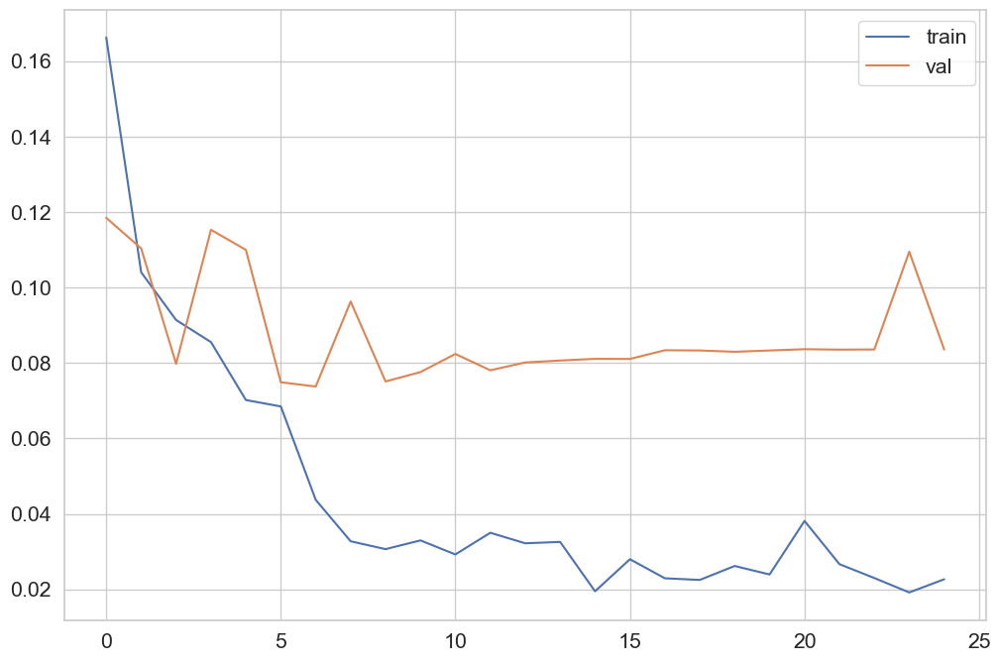

In [13]:
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.4)

# Построим график лосса при обучении и валидации

#Ваш код здесь
plt.figure(figsize=(12, 8))
plt.plot(losses['train'], label="train")
plt.plot(losses['val'], label="val")
plt.legend()
plt.show()


In [14]:
torch.save(model.state_dict(), 'AlexNet_fine_tune.pth')


In [15]:
model.load_state_dict(torch.load('AlexNet_fine_tune.pth'))


<All keys matched successfully>

In [16]:
print("Accuracy: {0:.4f}".format(evaluate(model)))


Accuracy: 0.9085


* **Feature Extractor** способ:

In [17]:
model_extractor = models.alexnet(pretrained=True)


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Помним, что по-умолчанию все слои нейросети обучаются заново:

In [18]:
for param in model_extractor.parameters():
    print(param.requires_grad)


True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


Сделаем так, чтобы на них *не распространялся backpropagation* (заморозим их), и подменим классификатор (ведь старый уже с весами для ImageNet'а).

In [19]:
# замораживаем параметры (веса)
for param in model_extractor.parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 9216
# Заменяем Fully-Connected слой на наш линейный классификатор
model_extractor.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
if device == "mps":
    model_extractor = model_extractor.to(device)

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем только классификатор
optimizer = optim.Adam(model_extractor.classifier.parameters(), lr=1e-4)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


In [20]:
%%time
model_extractor,losses = train_model(model_extractor, loss_fn, optimizer, exp_lr_scheduler, num_epochs=25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]

/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

Training complete in 9m 51s
Best val Acc: 0.901961
CPU times: user 8.42 s, sys: 3.88 s, total: 12.3 s
Wall time: 9min 50s


In [21]:
torch.save(model_extractor.state_dict(), 'AlexNet_extractor.pth')


In [22]:
model_extractor.load_state_dict(torch.load('AlexNet_extractor.pth'))


<All keys matched successfully>

In [23]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))


Accuracy: 0.9020


Видим, что качество намного лучше: ~90%.

* **Смешанный** способ:
Мы будем обучать не только последний **fully connected** слой, но и несколько предпоследних

In [24]:
model_mixed = models.alexnet(pretrained=True)


In [25]:
layers_to_unfreeze = 5

# Выключаем подсчет градиентов для слоев, которые не будем обучать
for param in model_mixed.features[:-layers_to_unfreeze].parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 9216
# Заменяем Fully-Connected слой на наш линейный классификатор
model_mixed.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
if device == "mps":
    model_mixed = model_mixed.to(device)

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем последние layers_to_unfreeze слоев из сверточной части и fully connected слой
# parameters() возвращает просто список тензоров парамтеров, поэтому два таких списка можно сложить
optimizer = optim.Adam(list(model_mixed.features.parameters())[-layers_to_unfreeze:] +
                      list(model_mixed.classifier.parameters()), lr=1e-4)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


In [26]:
%%time
_, losses = train_model(model_mixed, loss_fn, optimizer, exp_lr_scheduler, num_epochs=25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
torch.save(model_mixed.state_dict(), 'AlexNet_mixed.pth')


In [ ]:
model_mixed.load_state_dict(torch.load('AlexNet_mixed.pth'))


<All keys matched successfully>

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_mixed)))


Accuracy: 0.8954


**Вопрос 1 (важный):** С чем связано повышение качества если мы перестаем учить всю сеть? (Подсказка: посмотрите на датасет и на то, как он согласуется с 4-мя ситуациями, описанными выше)

**Ответ (важный):** <Ваш ответ>

**Вопрос 2**: Почему разморозка последних слоев не дает прироста к точности, хотя разморозить несколько послдних слоев обычно хорошеее решение для классификации похожего датасета? (Вопрос на внимательность)

**Ответ:** <Ваш ответ>

## Еще один метод

Можно не замораживать все первые слои, а делать так, чтобы шаг градиента на них был меньше. Интерфейс оптимизатора позволяет это делать.

In [ ]:
model_diff_lr = models.alexnet(pretrained=True)

model_diff_lr.classifier = nn.Linear(num_features, 2)

optimizer = torch.optim.Adam(params=[
        {"params": model_diff_lr.classifier.parameters()},
        {"params": model_diff_lr.features.parameters(), "lr": 1e-5,}
    ],
    lr=1e-4
)

criterion = nn.CrossEntropyLoss()


# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
model_diff_lr.to("mps")


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Linear(in_features=9216, out_features=2, bias=True)
)

In [ ]:
_, losses = train_model(model_diff_lr, criterion, optimizer, exp_lr_scheduler, num_epochs=25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

Training complete in 10m 6s
Best val Acc: 0.888889


In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_diff_lr)))


Accuracy: 0.8758


### Другие, более современные нейросети

**Вопрос:** Какую стратегию Вы выберете, учитывая размер и специфику нового датасета?

**Ответ:** <Ваш ответ>

### VGG16

Один **сверточный** слой с фильтром $5 \times 5$ можно заменить двумя подряд идущими слоями с фильтрами размером $3 \times 3$, так как **воспринимаемая область** картинки у них будет одинаковой. При этом уменьшиться количество параметров, поэтому такую сеть будет легче обучать. 

На момент создания VGG люди уже заметили, что чем больше слоев в нейросети, тем выше ее точность. Заменяя большие фильтры на несколько фильтров $3 \times 3$ исследователи получили глубокую нейросеть с меньшим количеством параметров. Архитектура VGG-16 (версии VGG с 16 слоями) представлена на картинке ниже:

<img src="https://cdn-images-1.medium.com/max/1040/1*0Tk4JclhGOCR_uLe6RKvUQ.png">

Когда говорят **VGG**, то чаще всего имеют ввиду **VGG-16** или **VGG-19**. Более глубоких версий **VGG** нет, так как после 19 слоев точность начинает падать.

Чтобы добиться высоких результатов в соревновании при обучении и валидации нейросети использовались дополнительные премы, подробнее о которых можно прочитать в [статье на Medium](https://medium.com/coinmonks/paper-review-of-vggnet-1st-runner-up-of-ilsvlc-2014-image-classification-d02355543a11).

In [27]:
# Ваш код здесь
model_extractor = models.vgg16(pretrained=True)

# замораживаем параметры (веса)
for param in model_extractor.parameters():
    param.requires_grad = False

# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 25088
# Заменяем Fully-Connected слой на наш линейный классификатор
model_extractor.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
if device == "mps":
    model_extractor = model_extractor.to(device)

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем только классификатор
optimizer = optim.SGD(model_extractor.classifier.parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model_extractor


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# Запустите обучение

model_extractor, losses = train_model(model_extractor, loss_fn, optimizer, exp_lr_scheduler, num_epochs=25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]

/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

Training complete in 11m 34s
Best val Acc: 0.954248


In [ ]:
torch.save(model_extractor.state_dict(), 'VGG16.pth')


In [ ]:
model_extractor.load_state_dict(torch.load('VGG16.pth'))


<All keys matched successfully>

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))


Accuracy: 0.9477


### Inception_v3

### Рассмотрим идею, которая подтолкнула исследователей к созданию этой архитектуры.

Площадь, которую занимает классифицируемый объект, может очень сильно отличаться. Пример на картинке ниже: 

<img src="https://cdn-images-1.medium.com/max/1040/1*aBdPBGAeta-_AM4aEyqeTQ.jpeg">


* Для извлечения информации с большой площади лучше всего подходят **большие** фильтры, и наоборот для маленьких объектов лучше **маленькие** фильтры. 
* Глубокие нейронные сети намного сложнее обучать: в них появляется проблема **затухания градиента** и они **переобучаются**.
Чтобы решить первую проблему исследователи придумали **Incepton** модуль, который применяет фильтры разного размера и затем склеивает полученные каналы. При этом извлекается как информация из больших объектов, так и из маленьких. Простейшая реализация модуля выглядит так:
<img src="https://cdn-images-1.medium.com/max/1040/1*DKjGRDd_lJeUfVlY50ojOA.png">

Реализацию можно сделать более эффективной, если сначала уменьшить количество каналов с помощью **сверточного слоя** 1$\times$1 и лишь затем применить **слой** с фильтрами 5$\times$5. Сокращение вычислений происходит за счет того, что мы сначала **уменьшаем размерность** данных и лишь затем преобразовываем их. Продвинутая реализация:
<img src="https://cdn-images-1.medium.com/max/1040/1*U_McJnp7Fnif-lw9iIC5Bw.png">

Сеть состоит из **корня** (нескольких сверточных слоев) и **Inception** модулей идущих за ним. Оранжевым прямоугольников выделен корень, а фиолетовыми - **вспомогательные классификаторы**. Именно они помогают бороться со второй проблемой, которую мы упомянули ранее. Наша функция потерь - взвешенная сумма **LogLoss** на двух **вспомогательных классификаторах** и **основном** в конце нейронной сети.
<img src="https://cdn-images-1.medium.com/max/1040/1*uW81y16b-ptBDV8SIT1beQ.png">

После Inception v1 были представлены 2, 3 и 4 версии, пррочитать о которых вы можете  в [статье на Medium](https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202).

In [ ]:
# Нужно поменять размер картинок на 299, иначе будет ошибка, так как размерность станет отрицательной.
# Это вызвано тем, что нейросеть изначально обучалась на картинках размера 299.

# Результирующий размер картинок определяется трансформациями
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(299),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Сам объект датасета
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}

# специальный класс для загрузки данных в виде батчей
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                              shuffle=True, num_workers=2)
               for x in ['train', 'val']}


In [ ]:
model_extractor = models.inception_v3(pretrained=True)


/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /Users/dadaya/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:04<00:00, 24.3MB/s] 


In [ ]:
model_extractor.AuxLogits.fc = nn.Linear(768, 2)
model.fc = nn.Linear(2048, 2)


In [ ]:
# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 25088
# Заменяем Fully-Connected слой на наш линейный классификатор
model_extractor.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
if device == "mps":
    model_extractor = model_extractor.to(device)

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем только классификатор
optimizer = optim.Adam(model_extractor.parameters(), lr=1e-4)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


In [ ]:
%%time
model_extractor.aux_logits = False
model_extractor, losses = train_model(model_extractor, loss_fn, optimizer, exp_lr_scheduler, num_epochs=25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]

/Users/dadaya/Desktop/progs/env/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

train iter::   0%|          | 0/61 [00:00<?, ?it/s]

val iter::   0%|          | 0/39 [00:00<?, ?it/s]

Training complete in 15m 21s
Best val Acc: 0.967320
CPU times: user 4min 21s, sys: 32.2 s, total: 4min 53s
Wall time: 15min 20s


In [ ]:
torch.save(model_extractor.state_dict(), 'Inceptionv3.pth')


In [ ]:
model_extractor.load_state_dict(torch.load('Inceptionv3.pth'))


<All keys matched successfully>

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))


Accuracy: 0.9542


**Вопрос:** Какая из сетей оказалась наилучшей? Как думаете, почему?

**Ответ:** <Ваш ответ>

### Resnet

Следующая илея касается проблемы затухания градиентов. Чем больше слоев, тем хуже они проходят при backprop.

$$
\frac{\partial F}{\partial w_1} \times \frac{\partial F}{\partial w_2} \times \dots \times\frac{\partial F}{\partial w_n}
$$

Поэтому мы как бы можем прокидывать их в более глубокие слои с помощью residual соединений. А значит можем делать сети ГЛУБЖЕ...

![](https://www.machinelearningmastery.ru/img/0-145407-381989.png)

### ResNext

Но здесь мы сталкиваемся с проблемой. Мы снова получили лишь один путь для фичей. Давайте попробуем в некотором роде обхединить идеи последних двух пунктов.

![](https://www.programmersought.com/images/955/19ca8284fafed90cdfbdc9b103ae064b.png)

Итак введем еще одну размерность -- число путей. В оригинальной она называется coordinality.

$\mathcal{F}(\mathbf{x})=\sum_{i=1}^{C} \mathcal{T}_{i}(\mathbf{x})$

Теперь давайте думать, как можно оптимизировать такую архитектуру с точки зрения вычислений.

![](https://miro.medium.com/max/1000/1*cIm3uy7eNvEchxRbBeBScQ.png)

Картинка сверху очень содержательная. Все три блока на самом деле эквивалентны с точки зрения математики. Итак, давайте посмотрим на переход (a) -> (b):
Вместо того, чтобы складывать большие тензоры в конце, давайте просто конкатенировать по размерности каналов маленькие. А затем уже применим свертку 1х1 один раз.

(b) -> (c):

Второй переход потребует от нас чуть больше ментальных усилий. Для начал разберемся, что такое group-свертка. В обычном сверточном слое происходит следующее:

![](https://blog.yani.ai/assets/images/posts/2017-08-10-filter-group-tutorial/convlayer.svg)

Серым изображены тензоры фичей до и после свертки, а желтым -- сами ядра сверток, при этом одна "полоска" этих сверток соответствует одному каналу выходного тензора. Таким образом у нас в каждой полоске $c_1$ сверток, а полосок всего $c_2$. Число параметров в таком случае $N_1 = c_1 \cdot c_2$.

Запомним это число.

Теперь давайте разделим входной и выходной тензор на две части:

![](https://blog.yani.ai/assets/images/posts/2017-08-10-filter-group-tutorial/filtergroups2.svg)

Теперь давайте попытаемся перевести первую половинку входного тензора в первую половинку выходного. Для этого нам понадобится $c_2 / 2$ "полосок" длинной $c_1 / 2$. Проделаем то же самое с оставшимися половинками. А теперь магия: сколько в итоге праметров мы получим? $N_2 = 2\cdot(c_1/2 \cdot c_2/2) < c_1\cdot c_2 = N_1$.

[Про group-свертки.](https://blog.yani.ai/filter-group-tutorial/)

[Оригинальная cтатья про ResNeXT](https://https://arxiv.org/pdf/1611.05431.pdf)




## Efficient Net



Движемся дальше. Поговорим об эффективности более подробно. До этого архитектуры сетей, можно сказать, подбирались руками. Так у нас есть ResNet50, а не ResNet54 со свертками 3x3 а не 4x4.

Но если у нас есть достаточно ресурсов, то можно попробовать обучить алгоритм, который будет подбирать правильные параметры для слоев. Для начала нужно определить какие бывают методы для увеличения сети и запустить по ним grid search:

![](https://1.bp.blogspot.com/-Cdtb97FtgdA/XO3BHsB7oEI/AAAAAAAAEKE/bmtkonwgs8cmWyI5esVo8wJPnhPLQ5bGQCLcBGAs/s640/image4.png)

Затем основываясь на основе этих данны можно получить оптимальную архитектуру длясвоего числа параметров

![](https://1.bp.blogspot.com/-DjZT_TLYZok/XO3BYqpxCJI/AAAAAAAAEKM/BvV53klXaTUuQHCkOXZZGywRMdU9v9T_wCLcBGAs/s640/image2.png)

И оказывается, что даже самая маленькая сеть будет показывать лучшие результаты.

![](https://1.bp.blogspot.com/-oNSfIOzO8ko/XO3BtHnUx0I/AAAAAAAAEKk/rJ2tHovGkzsyZnCbwVad-Q3ZBnwQmCFsgCEwYBhgL/s640/image3.png)

Подробнее [здесь](https://ai.googleblog.com/2019/05/efficientnet-improving-accuracy-and.html).

In [170]:
%pip install efficientnet_pytorch


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=4310894dab81d55a7df0ddec0f3b340b511ab2845f35c31bf5610d5e531bbd1b
  Stored in directory: /Users/dadaya/Library/Caches/pip/wheels/8b/6f/9b/231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
Successfully built efficientnet_pytorch
Note: you may need to restart the kernel to use updated packages.


In [171]:
from efficientnet_pytorch import EfficientNet
model = EfficientNet.from_pretrained('efficientnet-b2')


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b2-8bb594d6.pth" to /Users/dadaya/.cache/torch/hub/checkpoints/efficientnet-b2-8bb594d6.pth
100%|██████████| 35.1M/35.1M [00:09<00:00, 3.98MB/s]


Loaded pretrained weights for efficientnet-b2



<h2 style="text-align: center;"><b>Полезные ссылки</b></h3>

1). *cs231n: http://cs231n.github.io/transfer-learning/*

2). *Туториал на PyTorch Tutorials: https://pytorch.org/tutorials/beginner/transfer_learning_tutorial*

3). *Статья на Medium про TL в PyTorch: https://medium.com/@14prakash/almost-any-image-classification-problem-using-pytorch-i-am-in-love-with-pytorch-26c7aa979ec4*  

# ДЗ 5. Классификация изображений

Сегодня вам предстоит помочь телекомпании FOX в обработке их контента. Как вы знаете, сериал "Симпсоны" идет на телеэкранах более 25 лет, и за это время скопилось очень много видеоматериала. Персоонажи менялись вместе с изменяющимися графическими технологиями, и Гомер Симпсон-2018 не очень похож на Гомера Симпсона-1989. В этом задании вам необходимо классифицировать персонажей, проживающих в Спрингфилде. Думаю, нет смысла представлять каждого из них в отдельности.



### Установка зависимостей

In [ ]:
# we will verify that GPU is enabled for this notebook
# following should print: mps is available!  Training on GPU ...
#
# if it prints otherwise, then you need to enable GPU:
# from Menu > Runtime > Change Runtime Type > Hardware Accelerator > GPU
from sklearn.preprocessing import LabelEncoder
from collections import Counter
from torch.hub import load
import pandas as pd
from torch.autograd import Variable
import torch
import numpy as np
import time
from torch.utils.data import Subset

train_on_gpu = torch.backends.mps.is_available()
DEVICE = torch.device("mps")

if not train_on_gpu:
    print('mps is not available.  Training on CPU ...')
else:
    print('mps is available!  Training on GPU ...')


mps is available!  Training on GPU ...


In [ ]:
from torchvision.models import resnet50, ResNet50_Weights


In [ ]:
import PIL
print(PIL.__version__)


10.1.0


In [ ]:
import torch
torch.backends.mps.is_available()


True

В нашем тесте будет 990 картнок, для которых вам будет необходимо предсказать класс.

In [ ]:
import pickle
import numpy as np
from skimage import io

from tqdm import tqdm, tqdm_notebook, trange
from PIL import Image
from pathlib import Path

from torchvision import transforms, datasets, models
import torchvision
from multiprocessing.pool import ThreadPool
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
from torch import optim

from matplotlib import colors, pyplot as plt
%matplotlib inline

# в sklearn не все гладко, чтобы в colab удобно выводить картинки
# мы будем игнорировать warnings
import warnings
warnings.filterwarnings(action='ignore', category=DeprecationWarning)


In [ ]:
# разные режимы датасета
DATA_MODES = ['train', 'val', 'test']
# все изображения будут масштабированы к размеру 224x224 px
RESCALE_SIZE = 224
# работаем на видеокарте
DEVICE = torch.device("mps")
# можно поэксперементировать с различными batch_size
BATCH_SIZE = 32
DEVICE


device(type='mps')

In [ ]:
class SimpsonsDataset(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)

        self.label_encoder = LabelEncoder()

        if self.mode != 'test':
            self.labels = [path.parent.name for path in self.files]
            self.label_encoder.fit(self.labels)

            with open('label_encoder.pkl', 'wb') as le_dump_file:
                  pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа
        data_transforms = {
        'train': transforms.Compose([
            transforms.RandomChoice([
                transforms.Compose([
                transforms.Resize(size=300, max_size=301),
                transforms.CenterCrop(size=300),
                transforms.RandomCrop(250)
                ]),
                transforms.RandomRotation(degrees=(-25,25)),
                transforms.RandomHorizontalFlip(p=1)
            ]),
            transforms.Resize((RESCALE_SIZE, RESCALE_SIZE)),
            transforms.Lambda(my_normalization),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'val': transforms.Compose([
            transforms.RandomChoice([
                transforms.Compose([
                transforms.Resize(size=300, max_size=301),
                transforms.CenterCrop(size=300),
                transforms.RandomCrop(250)
                ]),
                transforms.RandomRotation(degrees=(-25,25)),
                transforms.RandomHorizontalFlip(p=1)
            ]),
            transforms.Resize((RESCALE_SIZE, RESCALE_SIZE)),
            transforms.Lambda(my_normalization),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'test': transforms.Compose([
                    transforms.Resize((RESCALE_SIZE, RESCALE_SIZE)),
                    transforms.Lambda(my_normalization),
                    transforms.ToTensor(),
                    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        }
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        x = self.load_sample(self.files[index])
        x = self._prepare_sample(x)
        x = np.array(x / 255, dtype='float32')
        x = transform(x)
        if self.mode == 'test':
            return x
        else:
            label = self.labels[index]
            label_id = self.label_encoder.transform([label])
            y = label_id.item()
            return x, y

    def _prepare_sample(self, image):
        image = image.resize((RESCALE_SIZE, RESCALE_SIZE))
        return np.array(image)


In [ ]:
train_files = sorted(list(TRAIN_VAL_DIR.rglob('*.jpg')))
test_files = sorted(list(TEST_DIR.rglob('*.jpg')))
from sklearn.model_selection import train_test_split
train_files, val_files = train_test_split(train_files, test_size = 0.2)
train_dataset_v1 = SimpsonsDataset(train_files, mode='train')
test_dataset_v1 = SimpsonsDataset(test_files, mode = 'test')
val_dataset_v1 = SimpsonsDataset(val_files, mode='val')
train_dataset_v1 = SimpsonsDataset(train_files, mode='train')


https://jhui.github.io/2018/02/09/PyTorch-Data-loading-preprocess_torchvision/


Ниже мы исспользуем враппер над датасетом для удобной работы. Вам стоит понимать, что происходит с LabelEncoder и  с torch.Transformation.

ToTensor конвертирует  PIL Image с параметрами в диапазоне [0, 255] (как все пиксели) в FloatTensor размера (C x H x W) [0,1] , затем производится масштабирование:
$input = \frac{input - \mu}{\text{standard deviation}} $, <br>       константы - средние и дисперсии по каналам на основе ImageNet


Стоит также отметить, что мы переопределяем метод __getitem__ для удобства работы с данной структурой данных.
 Также используется LabelEncoder для преобразования строковых меток классов в id и обратно. В описании датасета указано, что картинки разного размера, так как брались напрямую с видео, поэтому следуем привести их к одному размер (это делает метод  _prepare_sample)

In [ ]:
def my_normalization(x):
    return np.array(x, dtype = 'float32') / 255
data_transforms = {
    'train_val': transforms.Compose([
        transforms.RandomChoice([
                transforms.Compose([
                transforms.Resize(size=300, max_size=301),
                transforms.CenterCrop(size=300),
                transforms.RandomCrop(250)
                ]),
                transforms.RandomRotation(degrees=(-25,25)),
                transforms.RandomHorizontalFlip(p=1)
            ]),
        transforms.Resize((RESCALE_SIZE, RESCALE_SIZE)),
        transforms.Lambda(my_normalization),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((RESCALE_SIZE, RESCALE_SIZE)),
                transforms.Lambda(my_normalization),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
} # все трансформеры для наших данных

test_dataset = torchvision.datasets.ImageFolder("/Users/dadaya/Desktop/progs/DLS/data/journey-springfield/testset", transform = data_transforms['test'])
train_val_folder = torchvision.datasets.ImageFolder("/Users/dadaya/Desktop/progs/DLS/data/journey-springfield/train/simpsons_dataset", transform = data_transforms['train_val'])
train_dataset, val_dataset = torch.utils.data.random_split(train_val_folder, [0.8, 0.2])


In [ ]:
TEST_DIR = Path("/Users/dadaya/Desktop/progs/DLS/data/journey-springfield/testset")
TRAIN_VAL_DIR = Path("/Users/dadaya/Desktop/progs/DLS/data/journey-springfield/train/simpsons_dataset")
test_files = sorted(list(TEST_DIR.rglob('*.jpg')))
train_val_files = sorted(list(TRAIN_VAL_DIR.rglob('*.jpg')))
train_val_labels = [path.parent.name for path in train_val_files]
amounts = pd.Series(train_val_labels).value_counts()
amounts


homer_simpson               2246
ned_flanders                1454
moe_szyslak                 1452
lisa_simpson                1354
bart_simpson                1342
marge_simpson               1291
krusty_the_clown            1206
principal_skinner           1194
charles_montgomery_burns    1193
milhouse_van_houten         1079
chief_wiggum                 986
abraham_grampa_simpson       913
sideshow_bob                 877
apu_nahasapeemapetilon       623
kent_brockman                498
comic_book_guy               469
edna_krabappel               457
nelson_muntz                 358
lenny_leonard                310
mayor_quimby                 246
waylon_smithers              181
maggie_simpson               128
groundskeeper_willie         121
barney_gumble                106
selma_bouvier                103
carl_carlson                  98
ralph_wiggum                  89
patty_bouvier                 72
martin_prince                 71
professor_john_frink          65
snake_jail

In [ ]:
# uncomment if you have problem with pillow
def register_extension(id, extension):
    Image.EXTENSION[extension.lower()] = id.upper()
Image.register_extension = register_extension
def register_extensions(id, extensions):
    for extension in extensions: register_extension(id, extension)
Image.register_extensions = register_extensions


Давайте посмотрим на наших героев внутри датасета.

In [ ]:
y_train_indices = train_dataset.indices

y_train = [train_val_folder.targets[i] for i in y_train_indices]

class_sample_count = np.array([len(np.where(y_train == t)[0]) for t in np.unique(y_train)])

weight = 1. / class_sample_count

samples_weight = np.array([weight[t] for t in y_train])

samples_weight = torch.from_numpy(samples_weight)


In [ ]:
sampler = torch.utils.data.WeightedRandomSampler(samples_weight.type('torch.DoubleTensor'), len(samples_weight))


In [ ]:
dataloaders = {'test': torch.utils.data.DataLoader(test_dataset, batch_size = BATCH_SIZE, shuffle = True),
               'val': torch.utils.data.DataLoader(val_dataset, batch_size = BATCH_SIZE, shuffle = True),
               'train': torch.utils.data.DataLoader(train_dataset, batch_size = BATCH_SIZE, sampler = sampler)}
dataset_sizes = {'test': len(test_dataset),
                 'val': len(val_dataset),
                 'train': len(train_dataset)}
class_names = train_val_folder.classes
print(dataset_sizes, class_names)
print(len(class_names))


{'test': 991, 'val': 4186, 'train': 16747} ['abraham_grampa_simpson', 'agnes_skinner', 'apu_nahasapeemapetilon', 'barney_gumble', 'bart_simpson', 'carl_carlson', 'charles_montgomery_burns', 'chief_wiggum', 'cletus_spuckler', 'comic_book_guy', 'disco_stu', 'edna_krabappel', 'fat_tony', 'gil', 'groundskeeper_willie', 'homer_simpson', 'kent_brockman', 'krusty_the_clown', 'lenny_leonard', 'lionel_hutz', 'lisa_simpson', 'maggie_simpson', 'marge_simpson', 'martin_prince', 'mayor_quimby', 'milhouse_van_houten', 'miss_hoover', 'moe_szyslak', 'ned_flanders', 'nelson_muntz', 'otto_mann', 'patty_bouvier', 'principal_skinner', 'professor_john_frink', 'rainier_wolfcastle', 'ralph_wiggum', 'selma_bouvier', 'sideshow_bob', 'sideshow_mel', 'snake_jailbird', 'troy_mcclure', 'waylon_smithers']
42


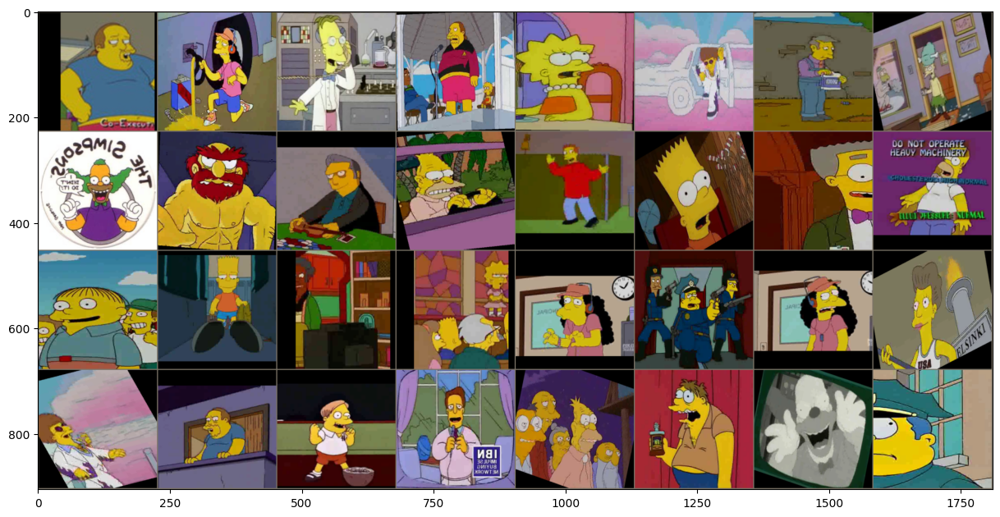

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


# Получим 1 батч (картнки-метки) из обучающей выборки
inputs, classes = next(iter(dataloaders['train']))

# Расположим картинки рядом
out = torchvision.utils.make_grid(inputs)

imshow(out)


Можете добавить ваши любимые сцены и классифицировать их. (веселые результаты можно кидать в чат)

### Построение нейросети

Запустить данную сеть будет вашим мини-заданием на первую неделю, чтобы было проще участвовать в соревновании.

Данная архитектура будет очень простой и нужна для того, чтобы установить базовое понимание и получить простенький сабмит на Kaggle

<!-- Здесь вам предлагается дописать сверточную сеть глубины 4/5.  -->

*Описание слоев*:



1. размерность входа: 3x224x224
2.размерности после слоя:  8x111x111
3. 16x54x54
4. 32x26x26
5. 64x12x12
6. выход: 96x5x5


In [ ]:
# Очень простая сеть
class SimpleCnn(nn.Module):

    def __init__(self, n_classes):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.out = nn.Linear(96 * 5 * 5, n_classes)


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        x = x.view(x.size(0), -1)
        logits = self.out(x)
        return logits


In [ ]:
def predict(model, test_loader):
    with torch.no_grad():
        logits = []

        for inputs in test_loader:
            inputs = inputs.to(DEVICE)
            model.eval()
            outputs = model(inputs).cpu()
            logits.append(outputs)

    probs = nn.functional.softmax(torch.cat(logits), dim=-1).numpy()
    return probs

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = model.state_dict()
    best_acc = 0.0

    #Ваш код здесь
    losses = {'train': [], "val": []}
    accuracy = {'train': [], 'val': []}

    pbar = trange(num_epochs, desc="Epoch:")

    for epoch in pbar:

        # каждя эпоха имеет обучающую и тестовую стадии
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train(True)  # установить модель в режим обучения
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # итерируемся по батчам
            for data in tqdm(dataloaders[phase], leave=False, desc=f"{phase} iter:"):
                # получаем картинки и метки
                inputs, labels = data

                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

                # инициализируем градиенты параметров
                if phase=="train":
                    optimizer.zero_grad()

                # forward pass
                if phase == "eval":
                    with torch.no_grad():
                        outputs = model(inputs)
                else:
                    outputs = model(inputs)
                preds = torch.argmax(outputs, -1)
                loss = criterion(outputs, labels)

                # backward pass + оптимизируем только если это стадия обучения
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

                # статистика
                running_loss += loss.item()
                running_corrects += int(torch.sum(preds == labels.data))

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]

            # Ваш код здесь
            losses[phase].append(epoch_loss)
            accuracy[phase].append(epoch_acc)

            pbar.set_description('{} Loss: {:.4f} Acc: {:.4f}'.format(
                                    phase, epoch_loss, epoch_acc
                                ))

            # если достиглось лучшее качество, то запомним веса модели
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # загрузим лучшие веса модели
    model.load_state_dict(best_model_wts)
    return model, losses, accuracy

def visualize_model(model, num_images=6):
    images_so_far = 0
    fig = plt.figure()

    for i, data in enumerate(dataloaders['val']):
        inputs, labels = data
        inputs, labels = Variable(inputs.to(DEVICE)), Variable(labels.to(DEVICE))

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images // 2, 2, images_so_far)
            ax.axis('off')
            ax.set_title('predicted: {}'.format(class_names[preds[j]]))
            imshow(inputs.cpu().data[j])

            if images_so_far == num_images:
                return

def evaluate(model):
    model.eval()

    runninig_correct = 0
    for data in dataloaders['val']:
        # получаем картинки и метки
        inputs, labels = data

        # переносим на gpu, если возможно
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)

        # forard pass
        output = model(inputs)
        _, predicted = torch.max(output, 1)

        runninig_correct += int(torch.sum(predicted == labels))

    return runninig_correct / dataset_sizes['val']


In [ ]:
class Modified_vgg16(nn.Module):
    def __init__(self, n_classes):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.MaxPool2d(kernel_size = 2, stride = 2, dilation = 1)
        )
        self.dropout1 = nn.Dropout(p=0.3)
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.MaxPool2d(kernel_size = 2, stride = 2, dilation = 1)
        )
        self.dropout2 = nn.Dropout(p=0.3)
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True)
        )
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True)
        )
        self.conv7 = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.MaxPool2d(kernel_size = 2, stride = 2, dilation = 1)
        )
        self.conv8 = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True)
        )
        self.conv9 = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.BatchNorm2d(512, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        )
        self.conv10 = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.MaxPool2d(kernel_size = 2, stride = 2, dilation = 1),
            nn.BatchNorm2d(512, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        )
        self.dropout3 = nn.Dropout(p=0.3)
        self.conv11 = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.BatchNorm2d(512, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        )
        self.conv12 = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.BatchNorm2d(512, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        )
        self.dropout4 = nn.Dropout(p=0.3)
        self.conv13 = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.ReLU(inplace = True),
            nn.MaxPool2d(kernel_size = 2, stride = 2, dilation = 1),
            nn.BatchNorm2d(512, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        )
        self.fc1 = nn.AdaptiveAvgPool2d(output_size = (7, 7))
        self.fc2 = nn.Linear(25088, n_classes, bias = True)


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.dropout1(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.dropout2(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x = self.conv7(x)
        x = self.conv8(x)
        x = self.conv9(x)
        x = self.conv10(x)
        x = self.dropout3(x)
        x = self.conv11(x)
        x = self.conv12(x)
        x = self.dropout4(x)
        x = self.conv13(x)
        x = self.fc1(x)

        x = x.view(x.size(0), -1)
        out = self.fc2(x)
        return out


Запустим обучение сети.

In [ ]:
modified_vgg16 = Modified_vgg16(42)
modified_vgg16 = modified_vgg16.to(DEVICE)
optimizer = optim.Adam(modified_vgg16.parameters() , lr = 1e-4)
loss_fn = nn.CrossEntropyLoss()
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size = 7, gamma = 0.1)
modified_vgg16, losses_modified_vgg16, accuracy_modified_vgg16 = train_model(modified_vgg16, loss_fn, optimizer, exp_lr_scheduler, num_epochs = 25)


Epoch::   0%|          | 0/25 [00:00<?, ?it/s]/Users/dadaya/miniforge3/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "
val Loss: 0.0157 Acc: 0.8636: 100%|██████████| 25/25 [8:28:58<00:00, 1221.53s/it]    

Training complete in 508m 58s
Best val Acc: 0.864787


In [ ]:
torch.save(modified_vgg16.state_dict(), 'Modified_vgg16.pth')


In [ ]:
modified_vgg16.load_state_dict(torch.load('Modified_vgg16.pth'))


<All keys matched successfully>

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(modified_vgg16)))


Accuracy: 0.8650


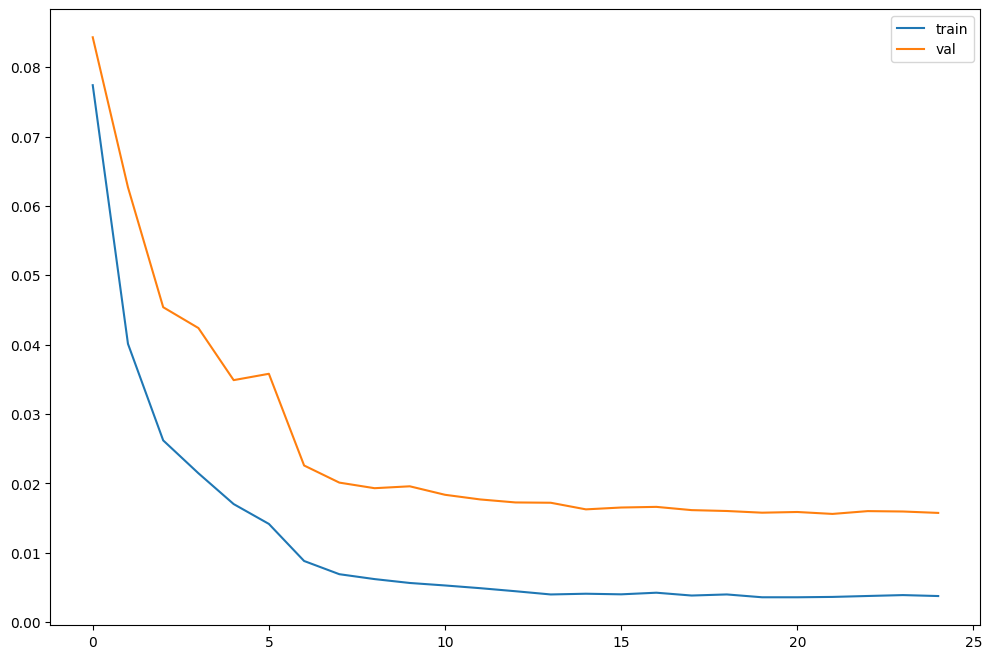

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(losses_modified_vgg16['train'], label="train")
plt.plot(losses_modified_vgg16['val'], label="val")
plt.legend()
plt.show()


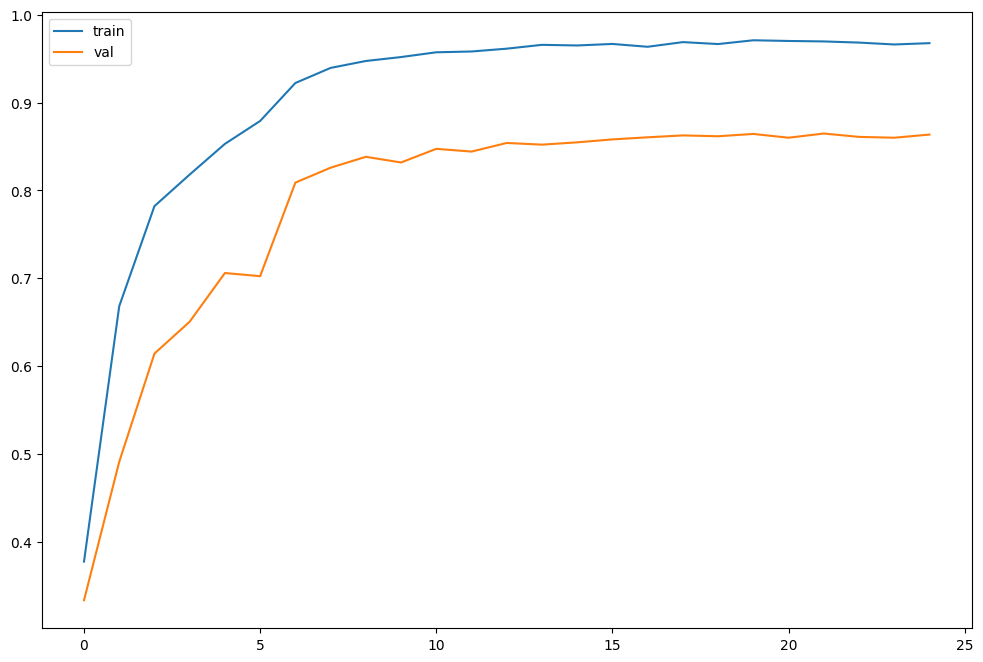

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(accuracy_modified_vgg16['train'], label="train")
plt.plot(accuracy_modified_vgg16['val'], label="val")
plt.legend()
plt.show()


In [ ]:
res_net = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)


In [ ]:
# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 25088
# Заменяем Fully-Connected слой на наш линейный классификатор
res_net.classifier = nn.Linear(num_features, 42)

# Использовать ли GPU
res_net = res_net.to(DEVICE)

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# Обучаем только классификатор
optimizer_resnet = optim.Adam(res_net.parameters(), lr=1e-4)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size = 7, gamma = 0.1)

res_net


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
res_net, losses_resnet, accuracy_resnet = train_model(res_net, loss_fn, optimizer_resnet, exp_lr_scheduler, num_epochs = 25)


val Loss: 0.0028 Acc: 0.9799: 100%|██████████| 25/25 [5:09:23<00:00, 742.52s/it]    

Training complete in 309m 23s
Best val Acc: 0.981605


In [ ]:
torch.save(res_net.state_dict(), 'ResNet.pth')


In [ ]:
res_net.load_state_dict(torch.load('ResNet.pth'))


<All keys matched successfully>

In [ ]:
print("Accuracy: {0:.4f}".format(evaluate(res_net)))


Accuracy: 0.9787


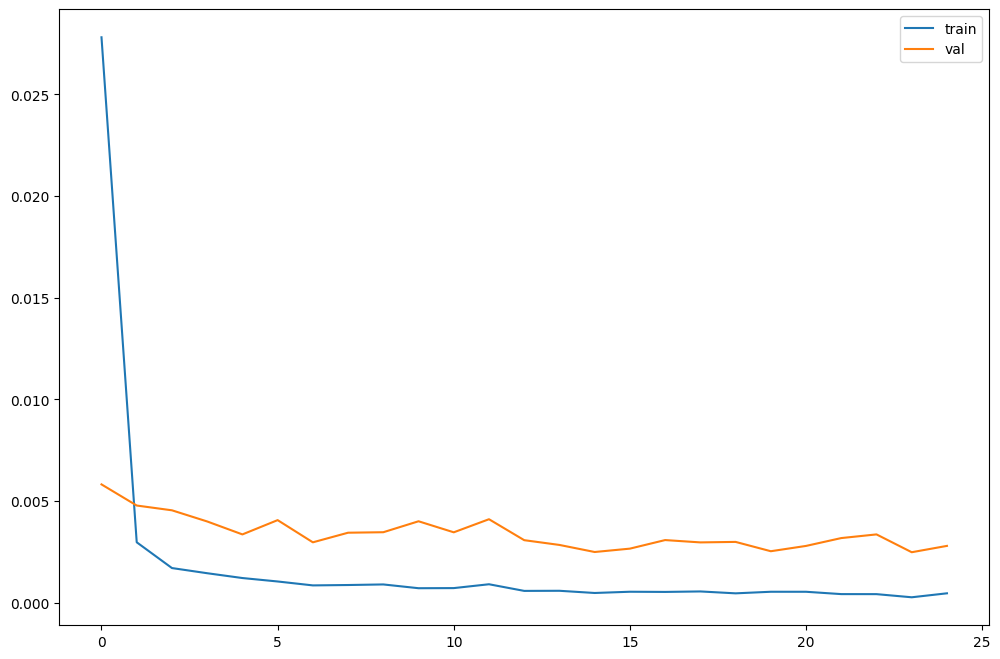

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(losses_resnet['train'], label="train")
plt.plot(losses_resnet['val'], label="val")
plt.legend()
plt.show()


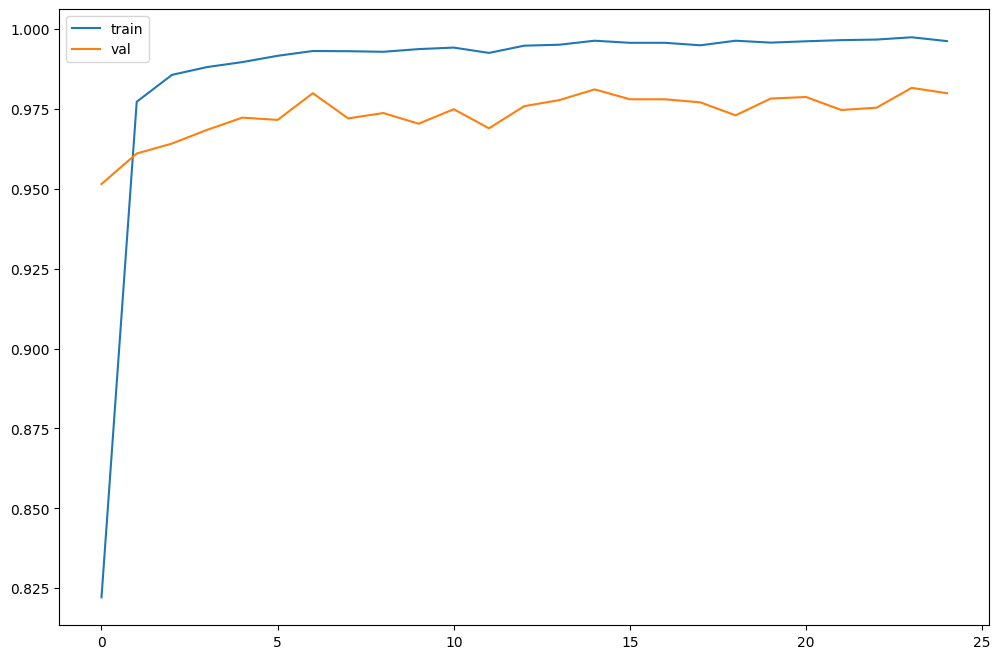

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(accuracy_resnet['train'], label="train")
plt.plot(accuracy_resnet['val'], label="val")
plt.legend()
plt.show()


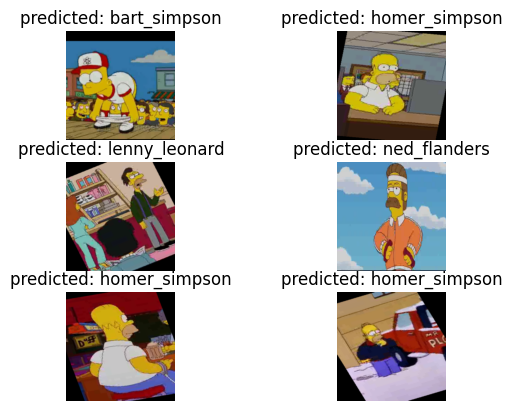

In [ ]:
visualize_model(res_net)


### Ну и что теперь со всем этим делать?

![alt text](https://www.indiewire.com/wp-content/uploads/2014/08/the-sicudaons.jpg)

Хорошо бы понять, как сделать сабмит.
У нас есть сеть и методы eval у нее, которые позволяют перевести сеть в режим предсказания. Стоит понимать, что у нашей модели на последнем слое стоит softmax, которые позволяет получить вектор вероятностей  того, что объект относится к тому или иному классу. Давайте воспользуемся этим.

In [ ]:
def predict_one_sample(model, inputs, device=DEVICE):
    """Предсказание, для одной картинки"""
    with torch.no_grad():
        inputs = inputs.to(DEVICE)
        model.eval()
        logit = model(inputs).cpu()
        probs = torch.nn.functional.softmax(logit, dim=-1).numpy()
    return probs


In [ ]:
random_characters = int(np.random.uniform(0,1000))
ex_img, true_label = val_dataset[random_characters]
probs_im = predict_one_sample(res_net, ex_img.unsqueeze(0))


In [ ]:
idxs = list(map(int, np.random.uniform(0,1000, 20)))
imgs = [val_dataset[id][0].unsqueeze(0) for id in idxs]

probs_ims = predict(res_net, imgs)


In [ ]:
label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
label_encoder


LabelEncoder()

In [ ]:
y_pred = np.argmax(probs_ims,-1)

actual_labels = [val_dataset[id][1] for id in idxs]

preds_class = [label_encoder.classes_[i] for i in y_pred]


Обратите внимание, что метрика, которую необходимо оптимизировать в конкурсе --- f1-score. Вычислим целевую метрику на валидационной выборке.

In [ ]:
from sklearn.metrics import f1_score
f1 = f1_score(actual_labels, y_pred, average='micro')

print("F1-оценка:", f1)


F1-оценка: 1.0


Сделаем классную визуализацию,  чтобы посмотреть насколько сеть уверена в своих ответах. Можете исспользовать это, чтобы отлаживать правильность вывода.

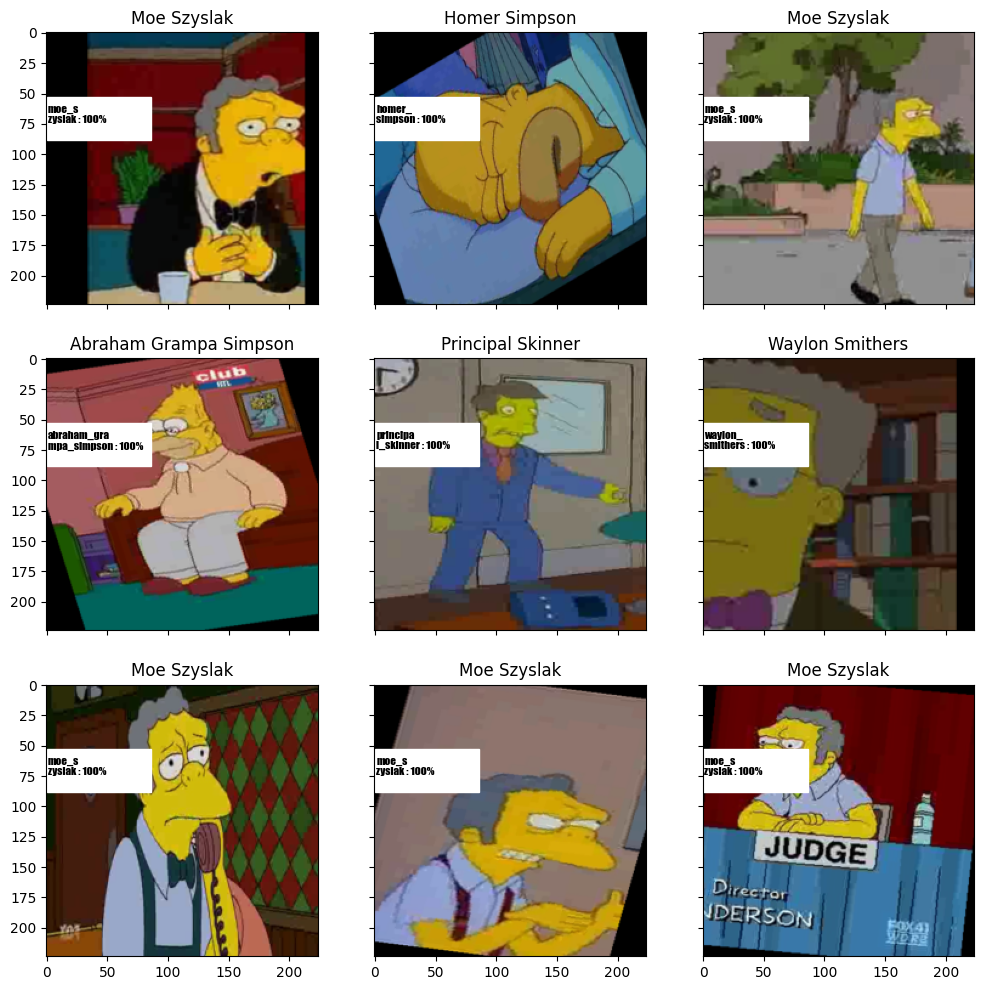

In [ ]:
import matplotlib.patches as patches
from matplotlib.font_manager import FontProperties

def imshow(inp, title=None, plt_ax=plt, default=False):
    """Imshow для тензоров"""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt_ax.imshow(inp)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)


fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)
for fig_x in ax.flatten():
    random_characters = int(np.random.uniform(0,1000))
    im_val, label = val_dataset[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                val_dataset_v1.label_encoder.inverse_transform([label])[0].split('_')))



    imshow(im_val.data.cpu(), \
          title=img_label,plt_ax=fig_x)

    actual_text = "Actual : {}".format(img_label)

    fig_x.add_patch(patches.Rectangle((0, 53),86,35,color='white'))
    font0 = FontProperties()
    font = font0.copy()
    font.set_family("fantasy")
    prob_pred = predict_one_sample(res_net, im_val.unsqueeze(0))
    predicted_proba = np.max(prob_pred)*100
    y_pred = np.argmax(prob_pred)

    predicted_label = label_encoder.classes_[y_pred]
    predicted_label = predicted_label[:len(predicted_label)//2] + '\n' + predicted_label[len(predicted_label)//2:]
    predicted_text = "{} : {:.0f}%".format(predicted_label,predicted_proba)

    fig_x.text(1, 59, predicted_text , horizontalalignment='left', fontproperties=font,
                    verticalalignment='top',fontsize=8, color='black',fontweight='bold')


### Submit на Kaggle

![alt text](https://i.redd.it/nuaphfioz0211.jpg)

In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=64)
probs = predict(res_net, test_loader)


preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset_v1.files]


In [ ]:
import pandas as pd
# my_submit = pd.read_csv("/Users/dadaya/Desktop/progs/DLS/data/journey-springfield/sample_submission.csv")
my_submit = pd.DataFrame({'Id': test_filenames, 'Expected': preds})
my_submit.head()


,Id,Expected
0,img0.jpg,nelson_muntz
1,img1.jpg,bart_simpson
2,img10.jpg,ned_flanders
3,img100.jpg,chief_wiggum
4,img101.jpg,apu_nahasapeemapetilon


In [ ]:
my_submit.to_csv('simple_cnn_baseline.csv', index=False)


# Лекция 8. Семантическая сегментация
## Задача сегментации
![segmentation](segmentation.png)
![segmentation_1](segmentation_1.png)
![segmentation_2](segmentation_2.png)
### Идея решения: Sliding Window
![sliding_window](sliding_window.png)

Недостатки:
- Очень дорого вычислительно: нужно совершиить много вызовов сети для классификации
- Sliding windows не делятся между собой информацией о частях картинки
### Идея решения: Fully-conv network
![fully_conv_network](fully_conv_network.png)

Недостатки:
- Очень дорого вычислительно: огромное количество параметров

А значит, нам нужно сжимать информацию о картинке перед построением карты сегментации.
### Идея решения: CNN
![cnn_segm](cnn_segm.png)
![cnn_segm_1](cnn_segm_1.png)
![cnn_segm_2](cnn_segm_2.png)
![cnn_segm_3](cnn_segm_3.png)
![cnn_segm_4](cnn_segm_4.png)
### FCN: недостатки
Ну, кажется, сегментация будет не очень...
- Upsampling плохо восстанавливает информацию
- Downsampling и большой stride разрушают пространственную информацию
- Scale Variability

![fcn_segm](fcn_segm.png)
## Подходы к задаче сегментации
### FCN: недостатки: _**Upsampling плохо восстанавливает информацию**_
### DeConvNet
![de_conv_net](de_conv_net.png)
### Transposed Convolution(Deconvolution)
![deconv](deconv.png)
### Upsampling
Nearest Neighbours:

![nn](nn.png)

Bed of Nails:

![bed_of_nails](bed_of_nails.png)

Bilinear:

![bilinear](bilinear.png)

Max-Unpooling:

![max_unpooling](max_unpooling.png)
![max_unpooling_1](max_unpooling_1.png)
### DeConvNet
![de_conv_net_1](de_conv_net_1.png)
### FCN: недостатки: _**Downsampling и большой stride разрушают пространственную информацию**_
![fcn_segm_1](fcn_segm_1.png)
### Dilated Convolutions(Atrous convolution)
$y[i] = \sum\limits^K_{k = 1}x[i + r \cdot k] \omega[k]$

![atrous_conv](atrous_conv.png)

У dilated convolution больший receptive field

![atrous_conv_1](atrous_conv_1.png)
![atrous_conv_2](atrous_conv_2.png)
### FCN: недостатки: _**Scale Variability**_
![fcn_segm_1](fcn_segm_1.png)
### Multi-scale Context Aggregator
![multi-scale](multi-scale.png)
![multi_scale_1](multi-scale_1.png)
### Pyramid Pooling Network
![pyramid](pyramid.png)
### Трюки в сегментировании и архитектуры, которые их используют
1. Deconvolution
2. Dilated Convolutions(Atrous convolution)
3. Multi-scale Context Aggregator
4. Pyramid Pooling Network
5. CRF(Conditional Random Field, postprocessing)
6. Skip connection

1. SegNet(1)
2. DeepLab v1(2, 5)
3. DeepLab v2(2, 3, 5)
4. DeepLab v3(1, 2, 3, 5)
5. DeepLab v3+(1, 2, 3, 5)
6. PSPNet(1, 2, 4)
7. Unet(1, 6)
## Unet
![unet](unet.png)
![unet_1](unet_1.png)
### Проблема операции свертки
![conv_problem](conv_problem.png)
### Overlap-tile strategy
Т.к. в Unet используются conv без паддингов, сегментация на выходе может быть получена только для внутренней области изображения.

Поэтому благодаря overlap-tile strategy мы добавляем отзеркаленную копию краев картинки, благодаря чему решается проблема операции свертки.

![overlap-tile](overlap-tile.png)
### Unet: Loss
Unet использует умный попиксельный Softmax... с весами

![unet_loss](unet_loss.png)